In [1]:
machine = 'mac'
machine = 'magny'

In [2]:
if machine == 'magny':
    basedir = "/hits/universe/GigaGalaxy/level4_MHD/"
    filedir = "/home/extmilan/masterthesis/files/"
    plotdir = "/home/extmilan/masterthesis/plots/"
elif machine == 'mac': 
    basedir = "/Users/smilanov/Desktop/Auriga/level4/"
    filedir = "/Users/smilanov/Documents/masterthesis/auriga_files/files/"
    plotdir = "/Users/smilanov/Documents/masterthesis/auriga_files/plots/"
    
#file = filedir + 'potential_params_10000_with_initeqbestfit.txt'

#dopotfit = True

In [3]:
from galpy.potential import NFWPotential as NFWpot
from galpy.potential import HernquistPotential as HEpot
from galpy.potential import DoubleExponentialDiskPotential as DEpot
from galpy.potential import MiyamotoNagaiPotential as MNpot
from galpy.potential import MN3ExponentialDiskPotential as MN3pot
from galpy.potential import MWPotential2014
from galpy.potential import evaluatePotentials, MiyamotoNagaiPotential, NFWPotential, HernquistPotential


from galpy.potential import evaluateDensities, evaluatePotentials
from galpy.potential import plotDensities
from galpy.potential import plotRotcurve
from galpy.util import bovy_conversion

import emcee

import numpy as np

from scipy import optimize as opt
from scipy import integrate

from astropy import units

from IPython.display import display

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D
import copy

from areposnap.gadget import gadget_readsnap
from areposnap.gadget_subfind import load_subfind

from auriga_basics import *
from auriga_functions import *

import datetime
import random

%matplotlib inline

Build the potential
---
- Disk: Miyamoto Nagai (http://adsabs.harvard.edu/abs/1975PASJ...27..533M 
- Spheroid: Hernquist (http://adsabs.harvard.edu/abs/1990ApJ...356..359H)
- Halo: NFW (http://iopscience.iop.org/article/10.1086/304888/pdf)

$v_{circ} = \sqrt{R\frac{\partial\Phi}{\partial R}}$

Miyamoto Nagai potential
--

$\Phi_{MN} (R,z) = -\frac{GM}{\sqrt{R^2 + \left(a + \sqrt{z^2 + b^2}\right)^2}}$

$\rho_{MN} (R,z) = \frac{b^2M}{4\pi}
\frac{aR^2 + \left(a + 3\sqrt{z^2 + b^2}\right)\left(a + \sqrt{z^2 + b^2}\right)^2}
{\left[R^2 + \left(a + \sqrt{z^2 + b^2}\right)^2\right]^{5/2}\left(z^2 + b^2\right)^{3/2}}$

$
v_{circ_{MN}}(R,z)     = R \sqrt{
\frac
{ GM }
{ \left(R^2 + \left(a + \sqrt{z^2+b^2}\right)^2\right)^{3/2} }
}
$

Hernquist potential
--
$\Phi_H(r) = -\frac
{GM}
{r+a}
$

$\rho_H(r) = \frac{M}{2\pi}\frac{r}{a}\frac{1}{\left(r+a\right)^3}
$

$M_H(r) = M \frac{r^2}{(r+a)^2}$

$v_{circ_H}(r) = \frac
{\sqrt{GMr} }
{r+a} 
= \sqrt{\frac{GM(<r)}{r}}
$
    last equation part only valid in spherical symmetric systems
    
NFW potential 
--

1. fit MND and HB
2. calculate their circular velocities
3. calculate total velocity and get circular velocity of NFW by subtracting: $v_{circ_{NFW}} = \sqrt{v_{circ_{tot}}^2 - v_{circ_{MND}}^2 - v_{circ_{HB}}^2}$
4. setup galpy potential with fixed MND and HB with fitted vals and just fit NFW parameters to pot vals
5. (possible check: fit also v0 of NFW and compare to 'real' one)



In [4]:
### fit disk

# try to integrate numerically for poisson process
# take eq 2.69b (w/o mass) B&T08
# if that does not work fit to binned densities


## PART FOR THE LIKELIHOOD
Rmin_kpc = 1.
Rmax_kpc = 10.

def rho_MND(R_kpc, z_kpc, phi, a_kpc = 5., b_kpc = 1., specific = True, mass_10Msun = None):
    """
    INPUT:
        R_kpc, z_kpc: 
    """
    #a_kpc = args[0]
    #b_kpc = args[1]
    if specific == True:
        first_fac_kpc2 = b_kpc**2 / (4. * np.pi)
    else:
        first_fac_kpc2 = (mass_10Msun * b_kpc**2) / (4. * np.pi) # * 10^10M_sun
    bzsqrt_kpc = np.sqrt(z_kpc**2 + b_kpc**2)
    abz_sqrt_kpc = (a_kpc + bzsqrt_kpc)
    numerator_kpc3 = a_kpc * R_kpc**2 + (a_kpc + 3. * bzsqrt_kpc) * abz_sqrt_kpc**2
    denominator_kpc8 = (R_kpc**2 + abz_sqrt_kpc**2)**(5./2.) * bzsqrt_kpc**3
    rho_kpc_3 = first_fac_kpc2 * numerator_kpc3 / denominator_kpc8 # * 10^10 M_sun if not specific density
    return (rho_kpc_3)

'''    
def prob_MND(Rs, zs, a_kpc, b_kpc, Rmin_kpc, Rmax_kpc):
    res, res_err = integrate.tplquad(rho_MND, 0., 2. * np.pi, lambda phi: -np.inf, lambda phi: np.inf,
                  lambda phi, z_kpc: Rmin_kpc, lambda phi, z_kpc: Rmax_kpc, args = (a_kpc, b_kpc))
    rho = rho_MND(Rs, zs, a_kpc, b_kpc)
    p = rho / res
    return(p)

def likelihood_MND(Rs, zs, a_kpc, b_kpc, Rmin_kpc, Rmax_kpc):
    p = prob_MND(Rs, zs, a_kpc, b_kpc, Rmin_kpc, Rmax_kpc)
    logL = np.sum(np.log10(p))
    return logL

#_____function for scipy.differential_evolution that sums the relative error squares_____
def log_MND_scipydifferentialevolution(x, *args):
    
    # read fitting parameters:
    a_MND_kpc  = x[0]
    b_MND_kpc  = x[1]
    
    # read data:
    R_kpc_data    = args[0]
    z_kpc_data    = args[1]
    _REFR0_kpc    = args[2]
    Rmin_kpc      = args[3]
    Rmax_kpc      = args[4]
    
    logL_MND = likelihood_MND(R_kpc_data, z_kpc_data, a_MND_kpc, b_MND_kpc, Rmin_kpc, Rmax_kpc)
    #print(a_MND_kpc)
    #print(logL_MND)
    return (logL_MND)
'''
'''
def fit_MND(R_kpc_data, z_kpc_data, _REFR0_kpc = 8., Rmin_kpc = 1., Rmax_kpc = 10.):
    lower_floor = 1e-3
    bounds = ((lower_floor, 50.),  # a_MND
              (lower_floor, 10.))  # b_MND
              
    #fitting:
    res = opt.differential_evolution(
                log_MND_scipydifferentialevolution,
                bounds = bounds,
                args = (R_kpc_data, z_kpc_data, _REFR0_kpc, Rmin_kpc, Rmax_kpc),
                strategy = 'best1bin',
                maxiter = 1000, tol=0.01, atol=1e-7,
                disp = False
                )

    a_MND_kpc_bestfit  = res.x[0]
    b_MND_kpc_bestfit  = res.x[1]
    return(a_MND_kpc_bestfit, b_MND_kpc_bestfit)
'''

## PART FOR THE FIT TO THE DENSITY
def disk_dens(R_kpc, z_kpc, dR_kpc, dz_kpc, M_10Msun): 
    
    Rmin_kpc, Rmax_kpc = np.min(R_kpc), np.max(R_kpc)
    zmin_kpc, zmax_kpc = np.min(z_kpc), np.max(z_kpc)
    
    Rbins, zbins = np.arange(Rmin_kpc, Rmax_kpc, dR_kpc), np.arange(zmin_kpc, zmax_kpc, dz_kpc)
    mbins, volbins = np.zeros((len(zbins), len(Rbins))), np.zeros((len(zbins), len(Rbins))) 
    for i in range(len(zbins)):
        for j in range(len(Rbins)):
            inbin = (Rbins[j] <= R_kpc) & (R_kpc < (Rbins[j] + dR_kpc)) & (zbins[i] <= z_kpc) & (z_kpc < (zbins[i] + dz_kpc))
            mbins[i,j] = np.sum(M_10Msun[inbin])
            volbins[i,j] = np.pi * dz_kpc * (2. * Rbins[j] * dR_kpc + dR_kpc**2)
       
    rho = mbins / volbins
    return(rho, Rbins, zbins)    

def MNdens(x, a_kpc, b_kpc):
    '''
    INPUT: 
        x: R_kpc, z_kpc, Mass_tot
    '''
    R_kpc, z_kpc, mass_10Msun = x[0], x[1], x[2]
    first_fac_kpc2 = (mass_10Msun * b_kpc**2) / (4. * np.pi) # * 10^10M_sun
    bzsqrt_kpc = np.sqrt(z_kpc**2 + b_kpc**2)
    abz_sqrt_kpc = (a_kpc + bzsqrt_kpc)
    numerator_kpc3 = a_kpc * R_kpc**2 + (a_kpc + 3. * bzsqrt_kpc) * abz_sqrt_kpc**2
    denominator_kpc8 = (R_kpc**2 + abz_sqrt_kpc**2)**(5./2.) * bzsqrt_kpc**3
    rho_kpc_3 = first_fac_kpc2 * numerator_kpc3 / denominator_kpc8 # * 10^10 M_sun if not specific density
    return(rho_kpc_3)


def fit_dens_MND(R_kpc, z_kpc, dR_kpc, dz_kpc, M_tot_disk_stars_10Msun, M_diskstars_10Msun):
    rho_data, R_data, z_data = disk_dens(R_kpc, z_kpc, dR_kpc, dz_kpc, M_diskstars_10Msun)
    
    side_x = R_data
    side_y = z_data
    X1, X2 = np.meshgrid(side_x, side_y)
    size = X1.shape
    x1_1d = X1.reshape((1, np.prod(size)))
    x2_1d = X2.reshape((1, np.prod(size)))
    size2 = x1_1d.shape
    x3_1d = np.repeat(M_tot_disk_stars_10Msun, size2[1])
    x3_1d = x3_1d.reshape((size2))
    xdata = np.vstack((x1_1d, x2_1d, x3_1d))
    z = rho_data
    Z = z.reshape(size2[1])
    ydata = Z
    popt, pcov = opt.curve_fit(MNdens, xdata, ydata)
    z_fit = MNdens(xdata, *popt)
    Z_fit = z_fit.reshape(size)

    plt.subplot(1, 2, 1)
    plt.title("Real Function")
    plt.pcolormesh(X1, X2, z, norm=LogNorm(), cmap=plt.get_cmap('plasma'))
    plt.axis('equal')
    plt.colorbar()

    plt.subplot(1, 2, 2)
    plt.title("Fitted Function")
    plt.pcolormesh(X1, X2, Z_fit, norm=LogNorm(), cmap=plt.get_cmap('plasma'))
    plt.axis('equal')
    plt.colorbar()
    plt.tight_layout()

    plt.show()
    return(popt)
    
    
def v_circ_MND_func(R_kpc_data, z_kpc_data, M_tot_10Msun, R0_kpc, z0_kpc = 0.):
    a_MND_kpc, b_MND_kpc = fit_MND(R_kpc_data, z_kpc_data, _REFR0_kpc = R0_kpc)
    denom = (R0_kpc**2 + (a_MND_kpc + np.sqrt(z0_kpc**2 + b_MND_kpc**2))**2)**(3./2.)
    v_circ = R0_kpc * np.sqrt(43.01e3* M_tot_10Msun / denom)
    return(a_MND_kpc, b_MND_kpc, v_circ)

def v_circ_MND_ab(R_kpc, z_kpc, a_MND_kpc, b_MND_kpc, M_tot_10Msun):
    denom = (R_kpc**2 + (a_MND_kpc + np.sqrt(z_kpc**2 + b_MND_kpc**2))**2)**(3./2.)
    v_circ = R_kpc * np.sqrt(43.01e3* M_tot_10Msun / denom)
    return(v_circ)

def v_circ_MND_dens_func(R_kpc, z_kpc, dR_kpc, dz_kpc, M_tot_disk_stars_10Msun, M_diskstars_10Msun, R0_kpc, z0_kpc):
    a_MND_kpc, b_MND_kpc = fit_dens_MND(R_kpc, z_kpc, dR_kpc, dz_kpc, M_tot_disk_stars_10Msun, M_diskstars_10Msun)
    denom = (R0_kpc**2 + (a_MND_kpc + np.sqrt(z0_kpc**2 + b_MND_kpc**2))**2)**(3./2.)
    v_circ = R0_kpc * np.sqrt(43.01e3* M_tot_disk_stars_10Msun / denom)
    return(a_MND_kpc, b_MND_kpc, v_circ)

def MND(R_kpc, z_kpc, dR_kpc, dz_kpc, M_tot_disk_stars_10Msun, M_diskstars_10Msun, R0_kpc, z0_kpc = 0.):
    print('Start MND fit at', datetime.datetime.now().time())
    a_MND_kpc, b_MND_kpc, v_circ = v_circ_MND_dens_func(R_kpc, z_kpc, dR_kpc, dz_kpc, M_tot_disk_stars_10Msun, M_diskstars_10Msun, R0_kpc, z0_kpc = 0.)
    print('MND: a[kpc], b[kpc], vcirc [km/s]:', a_MND_kpc, b_MND_kpc, v_circ)
    return(a_MND_kpc, b_MND_kpc, v_circ)

In [5]:
### fit bulge

def rho_data(M_stars_10Msun, r_kpc, dr_kpc, log = True):
    
    rmin_kpc, rmax_kpc = np.min(r_kpc), np.max(r_kpc)

    rbins_kpc = np.arange(rmin_kpc, rmax_kpc, dr_kpc)
    rbins_log_kpc = np.logspace(np.log10(rmin_kpc), np.log10(rmax_kpc), 97)
    mbins_10Msun = np.zeros(len(rbins_kpc))
    volbins_kpc3 = np.zeros(len(rbins_kpc))
    if log == False:
        for i in range(len(rbins_kpc)):
            inbin = (rbins_kpc[i] <= r_kpc) & (r_kpc < (rbins_kpc[i] + dr_kpc)) # spherical shells
            mbins_10Msun[i] = np.sum(M_stars_10Msun[inbin])
            volbins_kpc3[i] = 4./3. * np.pi * dr_kpc * (3. * rbins_kpc[i]**2 + 3. * rbins_kpc[i] * dr_kpc + dr_kpc**2)
    elif log == True:
        mbins_10Msun = np.zeros(len(rbins_log_kpc))
        volbins_kpc3 = np.zeros(len(rbins_log_kpc))
        dr_log_kpc = np.log(rbins_log_kpc[1]/rbins_log_kpc[0])
        for i in range(len(rbins_log_kpc)):
            inbin = (rbins_log_kpc[i] <= r_kpc) & (r_kpc < (rbins_log_kpc[i] + dr_log_kpc)) # spherical shells
            mbins_10Msun[i] = np.sum(M_stars_10Msun[inbin])
            volbins_kpc3[i] = 4./3. * np.pi * dr_log_kpc * (3. * rbins_log_kpc[i]**2 + 3. * rbins_log_kpc[i] * dr_log_kpc + dr_log_kpc**2)

        
    rho_10Msun_kpc3 = mbins_10Msun / volbins_kpc3
    return(rho_10Msun_kpc3, rbins_log_kpc)

'''
def HB(v0_kms, a_HB_kpc, r_kpc, z_kpc, _REFR0_kpc, normalize = True):
    HB = HernquistPotential(a_HB_kpc, normalize=normalize)
    rho_model_galpy = evaluateDensities(HB, r_kpc, z_kpc) 
    rho_model_10Msun_kpc3 = rho_model_galpy * bovy_conversion.dens_in_msolpc3(v0_kms, _REFR0_kpc) * 10.
    return(rho_model_10Msun_kpc3)
'''


def Hernquistdens(r_kpc, a_HB_kpc, amp_10Msun):
    rho_10Msun_kpc3 = amp_10Msun / (4. * np.pi * a_HB_kpc**3.) * (1. / ((r_kpc / a_HB_kpc) * (1. + r_kpc / a_HB_kpc)**3))
    return(np.log(rho_10Msun_kpc3))
    
def fit_HB(M_stars_10Msun, r_kpc, dr_kpc):
    rho_data_10Msun_kpc3, rbins_kpc = rho_data(M_stars_10Msun, r_kpc, dr_kpc)
    #print(rbins_kpc)
    rho_data_10Msun_kpc3 = np.log(rho_data_10Msun_kpc3)
    plt.plot(rbins_kpc, rho_data_10Msun_kpc3, 'r.')
    plt.xlabel('r[kpc]')
    plt.ylabel('rho [10^10Msun/kpc^3]')
    #print(rho_data_10Msun_kpc3, rbins_kpc)
    #print(rho_data_10Msun_kpc3)
    rho_data_10Msun_kpc3 = np.where(np.isinf(rho_data_10Msun_kpc3), rho_data_10Msun_kpc3[-2] ,rho_data_10Msun_kpc3)
    #print(rho_data_10Msun_kpc3)
    popt, pcov = opt.curve_fit(Hernquistdens, rbins_kpc, rho_data_10Msun_kpc3)
    a_HB_kpc = popt[0]
    plt.plot(rbins_kpc, Hernquistdens(rbins_kpc, popt[0], popt[1]))
    plt.show()
    return(a_HB_kpc)

def v_circ_HB_func(M_stars_10Msun, r_kpc, dr_kpc, r0_kpc):
    a_HB_kpc = fit_HB(M_stars_10Msun, r_kpc, dr_kpc)
    M_tot_10Msun = np.sum(M_stars_10Msun)
    vcirc = np.sqrt(43.01e3* M_tot_10Msun * r0_kpc)/ (r0_kpc + a_HB_kpc)
    #vcirc = np.sqrt(43.01e3 * M_enc / r_kpc)
    return(a_HB_kpc, vcirc)

def v_circ_HB_func_justr(r_kpc, a_HB_kpc, M_tot_10Msun):
    vcirc = np.sqrt(43.01e3* M_tot_10Msun * r_kpc)/ (r_kpc + a_HB_kpc)
    return(vcirc)
    
def v_circ_HB_a(r_kpc_spher, M_spher_10Msun):#, a_HB_kpc, M_stars_10Msun):
    """
    INPUT:
    """
    #M_tot_10Msun = np.sum(M_stars_10Msun)
    #vcirc = np.sqrt(43.01e3* M_tot_10Msun * r_kpc)/ (r_kpc + a_HB_kpc)

    r_kpc = np.linspace(np.min(r_kpc_spher), np.max(r_kpc_spher), 25)
    v_circ_shell = np.zeros(len(r_kpc))
    for i, item in enumerate(r_kpc):
        mass_mask = np.where((r_kpc_spher<=item))
        mass_10Msun  = np.sum(M_spher_10Msun[mass_mask])
        v_circ_shell[i] = np.sqrt(43.01e3 * mass_10Msun / item)
    return(v_circ_shell)

def HB(M_stars_10Msun, r_kpc, dr_kpc, r0_kpc):
    print('Start HB fit at', datetime.datetime.now().time())
    a_HB_kpc, vcirc = v_circ_HB_func(M_stars_10Msun, r_kpc, dr_kpc, r0_kpc)
    print('HB: a[kpc], vcirc [km/s]:', a_HB_kpc, vcirc)
    return(a_HB_kpc, vcirc)

def HB2(r_kpc_spher, M_spher_10Msun):
    vcirc = v_circ_HB_a(r_kpc_spher, M_spher_10Msun)
    return(vcirc)

$v_{circ_{tot}} = \sqrt{\frac{GM(<R_0)}{R_0}} $

$G = 43.01 \cdot 10^{3} \frac{kpc}{10^{10} M_\odot}\frac{km^2}{s^2}$

In [6]:
def v_circ_tot_func(r_kpc):
    try:
        test = len(r_kpc)
        types = ( s.type == 0) + (s.type == 1) + (s.type == 2) + (s.type == 3) + (s.type == 4)

        #mass_mask    = np.zeros(len(r_kpc))
        #mass_10Msun  = np.zeros(len(r_kpc))
        v_circ_shell = np.zeros(len(r_kpc))

        for i, item in enumerate(r_kpc):
            mass_mask    = np.where( (types) & (s.halo == 0) & ((1000. * s.r()) < (item)))
            mass_10Msun  = np.sum(s.mass[mass_mask])
            v_circ_shell[i] = np.sqrt(43.01e3 * mass_10Msun / item)

        v_circ =  v_circ_shell
    except:
        mass_10Msun = np.sum(s.mass[((1000. * s.r()) <= r_kpc) ] )
        v_circ = np.sqrt(43.01e3 * mass_10Msun / r_kpc)
        
    return(v_circ)

In [7]:
### fit halo (variably)

def v_circ_NFW_func(r_kpc, v_circ_MND, v_circ_HB, v_circ_tot = None):
    try:
        if v_circ_tot == None:
            v_circ_tot = v_circ_tot_func(r_kpc)
    except ValueError:
        pass
        #continue

    v_circ_NFW = np.sqrt(v_circ_tot**2 - v_circ_MND**2 - v_circ_HB**2) #could be negative! then its nan vals
    return(v_circ_NFW)


In [8]:
#_____function that sets-up galpy potential_____
def setup_galpy_potential(a_MND_kpc, b_MND_kpc, a_NFWH_kpc, a_HB_kpc, n_MND, n_NFWH, n_HB, _REFR0_kpc):
    
    #test input:
    if (a_MND_kpc <= 0.) or (b_MND_kpc <= 0.) or (a_NFWH_kpc <= 0.) or (a_HB_kpc <= 0.) \
       or (n_MND <= 0.) or (n_NFWH <= 0.) or (n_HB <= 0.) or (n_MND >= 1.) or (n_NFWH >= 1.) or (n_HB >= 1.):
        raise ValueError('Error in setup_galpy_potential: '+\
                         'The input parameters for the scaling profiles do not correspond to a physical potential.')
    if np.fabs(n_MND + n_NFWH + n_HB - 1.) > 1e-7:
        raise ValueError('Error in setup_galpy_potential: '+\
                         'The sum of the normalization does not add up to 1.')
        
    #trafo to galpy units:
    a_MND  = a_MND_kpc  / _REFR0_kpc
    b_MND  = b_MND_kpc  / _REFR0_kpc
    a_NFWH = a_NFWH_kpc / _REFR0_kpc
    a_HB   = a_HB_kpc   / _REFR0_kpc
    
    #setup potential:
    disk = MiyamotoNagaiPotential(
                a = a_MND,
                b = b_MND,
                normalize = n_MND)
    halo = NFWPotential(
                a = a_NFWH,
                normalize = n_NFWH)
    bulge = HernquistPotential(
                a = a_HB,
                normalize = n_HB) 
     
    return [disk,halo,bulge]


In [9]:
#_____function for scipy.differential_evolution that sums the relative error squares_____
def rel_pot_error_scipydifferentialevolution(x,*args):
    
    # read fitting parameters:
    v0_tot_kms = x[0]
    a_NFWH_kpc = x[1]
        
    
    # read data:
    
    a_MND_kpc     = args[0]
    b_MND_kpc     = args[1]
    a_HB_kpc      = args[2]    
    v0_MND_kms    = args[3]
    v0_HB_kms     = args[4]
    R_kpc_data    = args[5]
    z_kpc_data    = args[6]
    pot_kms2_data = args[7]
    _REFR0_kpc    = args[8]
    
    
    v0_NFWH_kms = np.sqrt(v0_tot_kms**2 - v0_HB_kms**2 - v0_MND_kms**2)
    
    n_NFWH = v0_NFWH_kms**2 / v0_tot_kms**2
    n_HB   = v0_HB_kms**2   / v0_tot_kms**2
    n_MND  = v0_MND_kms**2  / v0_tot_kms**2
    # setup potential (and check if parameters are physical):
    try:
        pot_galpy_model = setup_galpy_potential(a_MND_kpc, b_MND_kpc, a_NFWH_kpc, a_HB_kpc, n_MND, n_NFWH, n_HB, _REFR0_kpc)
    except Exception as e:
        return np.inf

    # calculate potential values at (R,z) for this potential:
    #print(R_kpc_data)
    #print(z_kpc_data)
    #print(_REFR0_kpc)
    #print(v0_tot_kms)
    pot_kms2_model = evaluatePotentials(pot_galpy_model,
                                   R_kpc_data / _REFR0_kpc,
                                   z_kpc_data / _REFR0_kpc) * (v0_tot_kms)**2
    
    #calculate sum of relative error squares:
    err = np.sum(((pot_kms2_data - pot_kms2_model) / pot_kms2_model)**2)
    return err

snapnr  : 60
11:23:09.956198
[ 10.96751499  10.54684067  11.19934082]
Found 84249 stars.
Rotated pos.
Rotated vel.

galrad  : 0.008027402311563491
redshift: 2.1032696525957713
time    : 0.32224076923625916
center  : [ 0.  0.  0.]

computing star properties
computing histograms


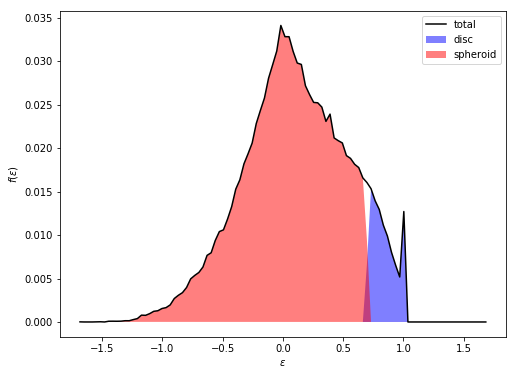

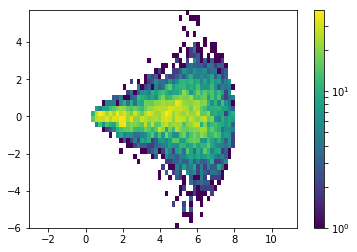

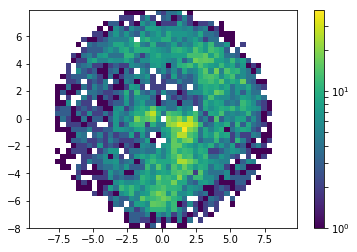

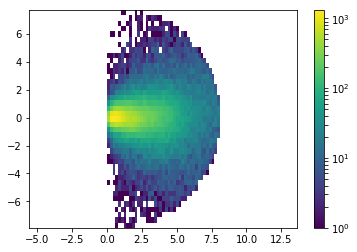

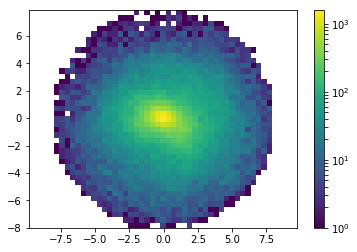

Start MND fit at 11:24:31.767595


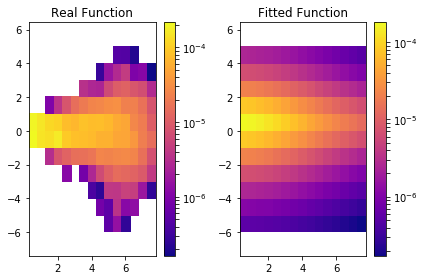

MND: a[kpc], b[kpc], vcirc [km/s]: 2.93011103937 1.30176153988 8.97390811697


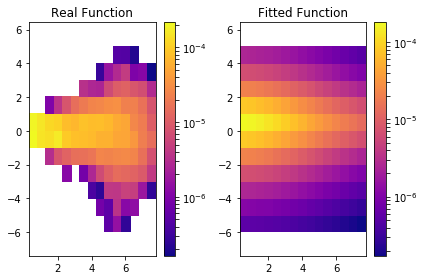

Start HB fit at 11:24:33.088694


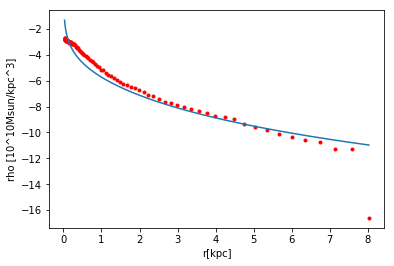

HB: a[kpc], vcirc [km/s]: 2.74166353097 33.6096517151


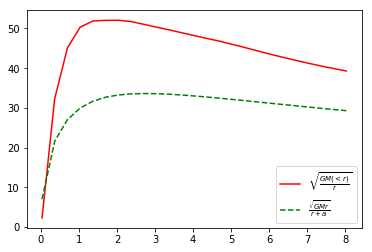

/home/extmilan/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in double_scalars
  del sys.path[0]

8.97390811697 33.6096517151
v0_circ_tot = 108.294747832


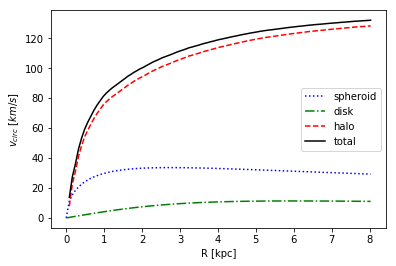

(2.9301110393674605, 1.301761539883332, 2.741663530966914, 8.9739081169650436, 33.60965171512261, array([ 2.39742994,  2.69197273,  6.40552425, ...,  2.0876503 ,
        6.21328259,  4.2983489 ], dtype=float32), array([ 2.94082618,  0.5695954 , -3.32177424, ...,  2.04493546,
        3.67719841,  0.69569296], dtype=float32), array([-52097.140625  , -54298.1328125 , -47869.6875    , ...,
       -53221.70703125, -48540.62890625, -51958.40625   ]), 2.6758007705211635)


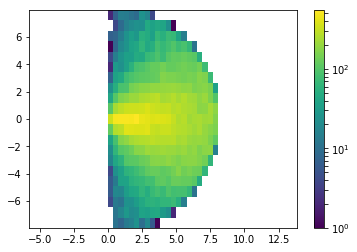

10 (10,)
[ 60.           2.67580077  90.25077995   2.93011104   1.30176154
   2.74166353   8.31583967   8.97390812  33.60965172  83.27702904]
Snapshot =  60
v0_tot_kms at R0_kpc = 2.67580077052 : 90.2507799456
Stellar Disk - a_MND_kpc = 2.93011103937 b_MND_kpc = 1.30176153988 v0_MND_kms = 8.97390811697
Stellar Spheroid - a_HB_kp c= 2.74166353097 v0_HB_kms = 33.6096517151
DM Halo - a_NFWH_kpc = 8.31583966846 v0_NFWH_kms = 83.2770290386
snapnr  : 61
11:26:51.661773
[ 11.33949471  10.91451645  11.58535576]
Found 103761 stars.
Rotated pos.
Rotated vel.

galrad  : 0.008606187999248505
redshift: 2.0020281392528516
time    : 0.3331081367707903
center  : [ 0.  0.  0.]

computing star properties
computing histograms


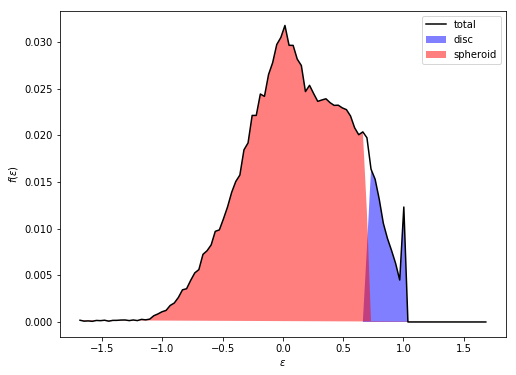

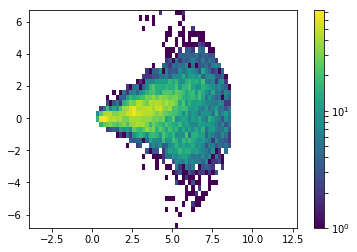

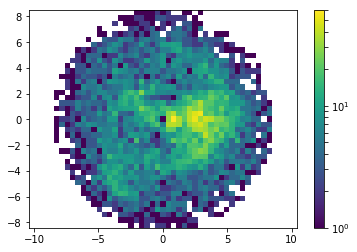

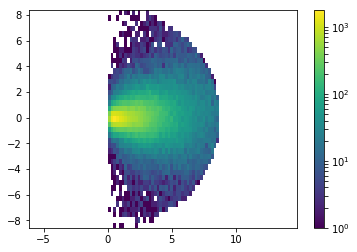

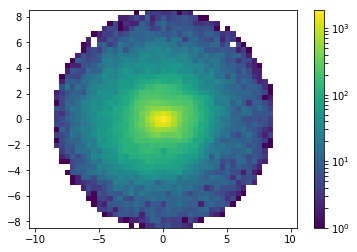

Start MND fit at 11:27:54.522533


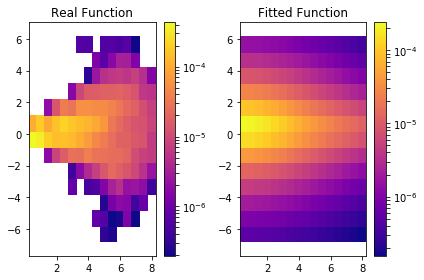

MND: a[kpc], b[kpc], vcirc [km/s]: 2.55950030846 1.41081102886 11.0424491792


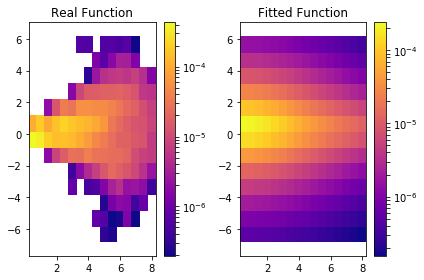

Start HB fit at 11:27:55.964374


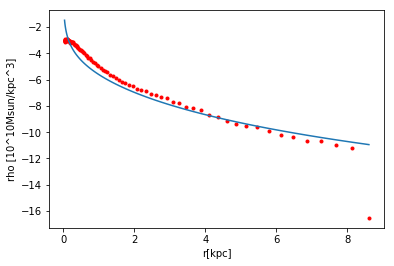

HB: a[kpc], vcirc [km/s]: 3.03473317696 35.3158425635


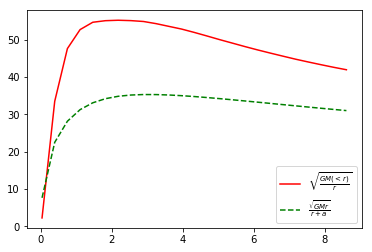

11.0424491792 35.3158425635
v0_circ_tot = 114.482307119


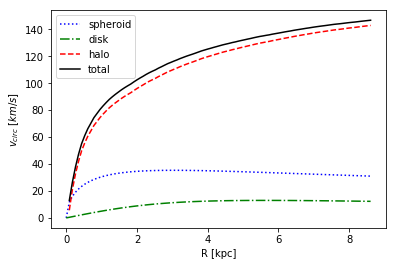

(2.5595003084602697, 1.4108110288617239, 3.0347331769621064, 11.042449179152305, 35.315842563490307, array([ 2.96357512,  4.27800989,  3.31033969, ...,  4.786098  ,
        2.15421295,  1.43872142], dtype=float32), array([ 0.96494836, -2.25165367, -0.50204504, ..., -2.06922746,
        0.41167554, -2.87093663], dtype=float32), array([-65921.3046875 , -60974.296875  , -64546.296875  , ...,
       -60169.21484375, -66610.015625  , -63035.40234375]), 2.8687293330828347)


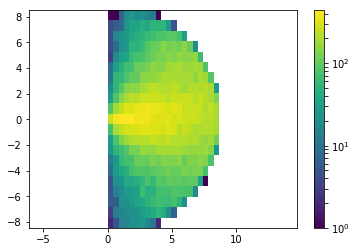

10 (10,)
[ 61.           2.86872933  95.40192328   2.55950031   1.41081103
   3.03473318   9.72168152  11.04244918  35.31584256  87.93396697]
Snapshot =  61
v0_tot_kms at R0_kpc = 2.86872933308 : 95.4019232832
Stellar Disk - a_MND_kpc = 2.55950030846 b_MND_kpc = 1.41081102886 v0_MND_kms = 11.0424491792
Stellar Spheroid - a_HB_kp c= 3.03473317696 v0_HB_kms = 35.3158425635
DM Halo - a_NFWH_kpc = 9.72168152159 v0_NFWH_kms = 87.9339669655
snapnr  : 62
11:29:53.319728
[ 11.72626972  11.2924757   11.99002552]
Found 156728 stars.
Rotated pos.
Rotated vel.

galrad  : 0.009122179448604583
redshift: 1.9040895435327672
time    : 0.344341999449342
center  : [ 0.  0.  0.]

computing star properties
computing histograms


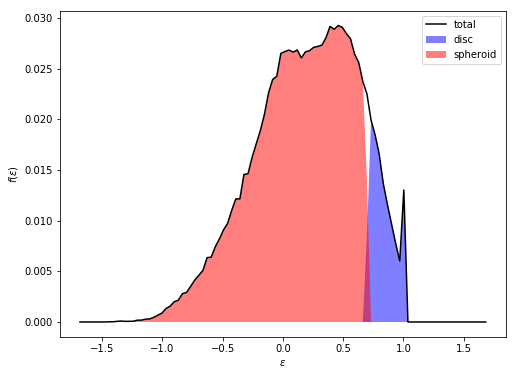

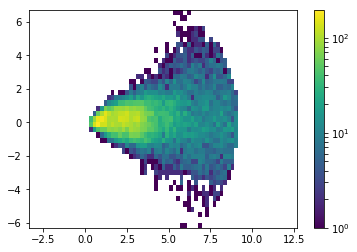

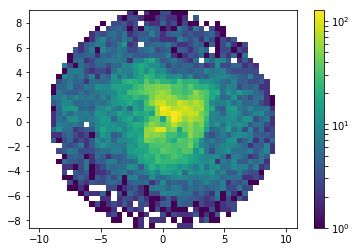

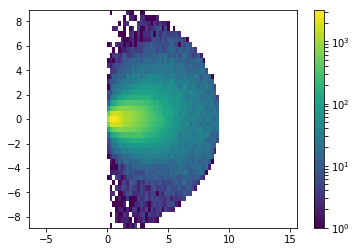

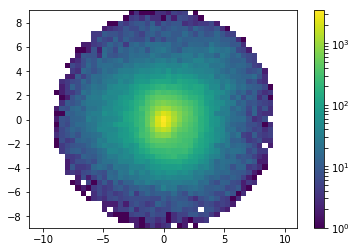

Start MND fit at 11:30:59.522288


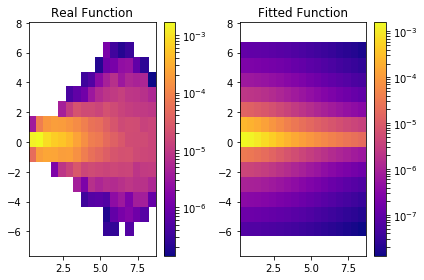

MND: a[kpc], b[kpc], vcirc [km/s]: 1.87188553527 0.283352649036 23.3410786485


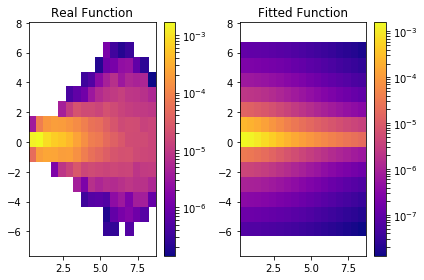

Start HB fit at 11:31:01.214067


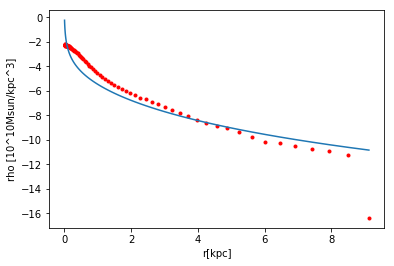

HB: a[kpc], vcirc [km/s]: 3.33055117328 39.9509986171


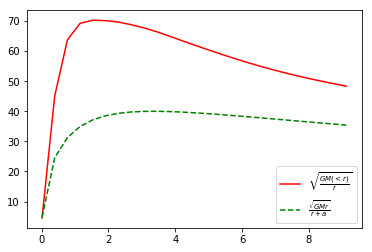

23.3410786485 39.9509986171
v0_circ_tot = 131.341469743


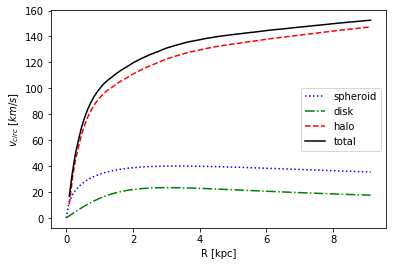

(1.8718855352657828, 0.2833526490363184, 3.3305511732841815, 23.341078648549544, 39.950998617138339, array([ 2.12466908,  5.78314257,  1.72764051, ...,  1.64217317,
        2.34122968,  5.44843483], dtype=float32), array([-6.78691483, -2.65621543, -1.54715192, ...,  0.99620527,
       -8.13542843, -4.98211527], dtype=float32), array([-61917.64453125, -64996.75      , -72873.8359375 , ...,
       -76163.4765625 , -59837.09765625, -62464.359375  ]), 3.0407264828681941)


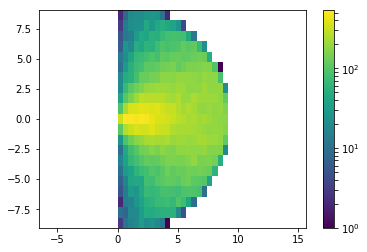

10 (10,)
[  62.            3.04072648  109.45266949    1.87188554    0.28335265
    3.33055117    8.37672383   23.34107865   39.95099862   99.19172655]
Snapshot =  62
v0_tot_kms at R0_kpc = 3.04072648287 : 109.452669492
Stellar Disk - a_MND_kpc = 1.87188553527 b_MND_kpc = 0.283352649036 v0_MND_kms = 23.3410786485
Stellar Spheroid - a_HB_kp c= 3.33055117328 v0_HB_kms = 39.9509986171
DM Halo - a_NFWH_kpc = 8.37672383363 v0_NFWH_kms = 99.1917265497
snapnr  : 63
11:33:00.335437
[ 12.06752777  11.62145424  12.35484123]
Found 164288 stars.
Rotated pos.
Rotated vel.

galrad  : 0.009642120450735092
redshift: 1.822689252620354
time    : 0.3542720825792927
center  : [ 0.  0.  0.]

computing star properties
computing histograms


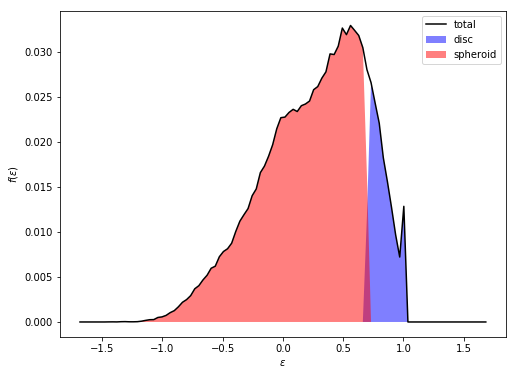

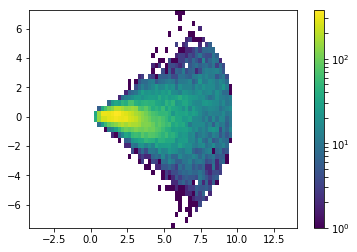

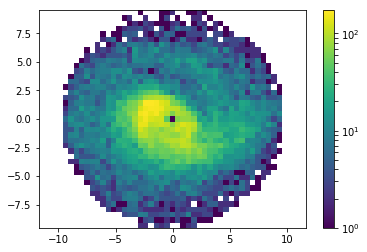

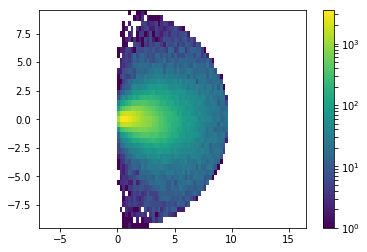

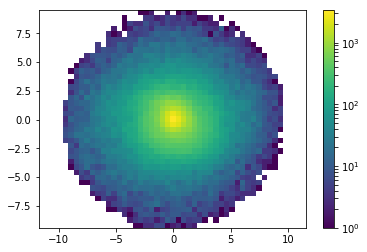

Start MND fit at 11:34:03.635166


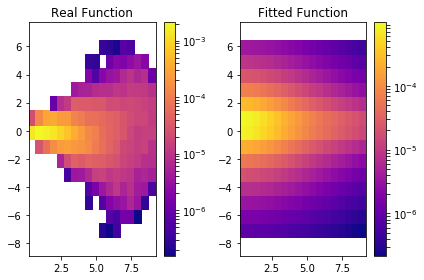

MND: a[kpc], b[kpc], vcirc [km/s]: 1.88724447888 1.30562301555 22.8311652602


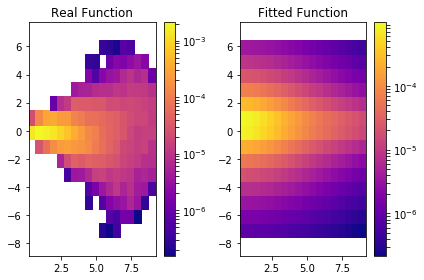

Start HB fit at 11:34:05.255553


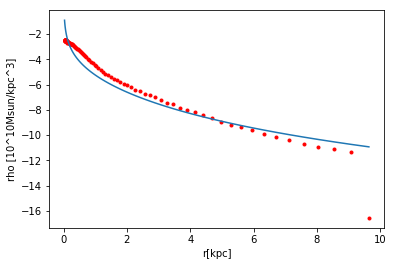

HB: a[kpc], vcirc [km/s]: 3.05743096875 44.6619314717


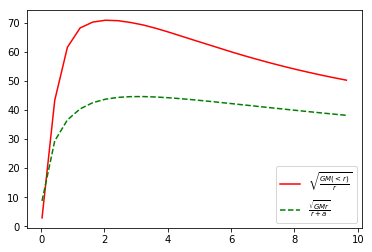

/home/extmilan/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in sqrt
  # This is added back by InteractiveShellApp.init_path()

22.8311652602 44.6619314717
v0_circ_tot = 126.349480098


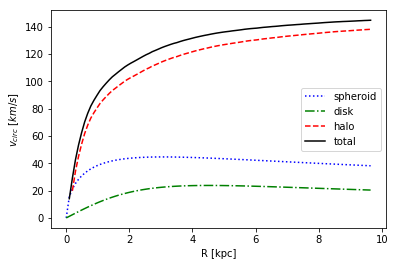

(1.8872444788755016, 1.3056230155515047, 3.0574309687544492, 22.831165260189881, 44.661931471658647, array([ 6.21948051,  4.58011293,  5.75041819, ...,  7.63668966,
        5.23295069,  5.94413328], dtype=float32), array([ 2.85362315,  3.21946263, -3.50243688, ...,  2.65067792,
        3.75800681, -1.37314224], dtype=float32), array([-64547.3828125 , -65096.09765625, -64214.5234375 , ...,
       -62134.7109375 , -62646.58203125, -63908.1328125 ]), 3.2140401502450304)


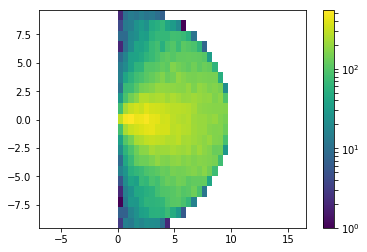

10 (10,)
[  63.            3.21404015  105.29463527    1.88724448    1.30562302
    3.05743097   10.06721517   22.83116526   44.66193147   92.57974934]
Snapshot =  63
v0_tot_kms at R0_kpc = 3.21404015025 : 105.294635272
Stellar Disk - a_MND_kpc = 1.88724447888 b_MND_kpc = 1.30562301555 v0_MND_kms = 22.8311652602
Stellar Spheroid - a_HB_kp c= 3.05743096875 v0_HB_kms = 44.6619314717
DM Halo - a_NFWH_kpc = 10.0672151658 v0_NFWH_kms = 92.5797493358
snapnr  : 64
11:36:09.078274
[ 12.42007446  11.95782089  12.73314667]
Found 226624 stars.
Rotated pos.
Rotated vel.

galrad  : 0.010103058815002442
redshift: 1.7435705743308647
time    : 0.3644885279628326
center  : [ 0.  0.  0.]

computing star properties
computing histograms


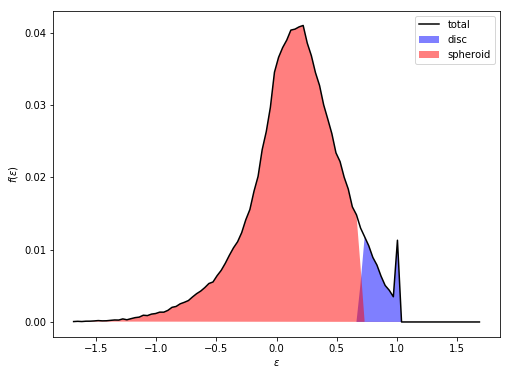

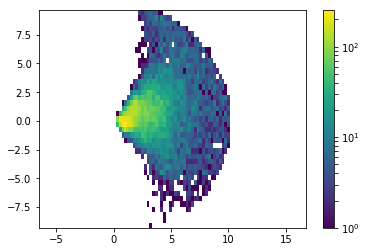

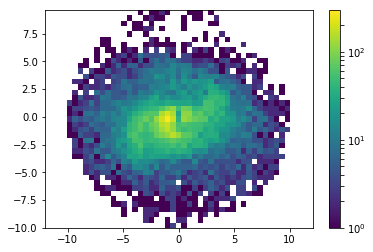

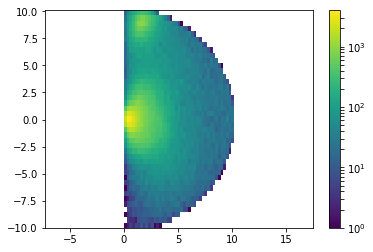

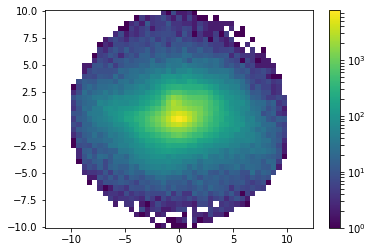

Start MND fit at 11:37:08.758431


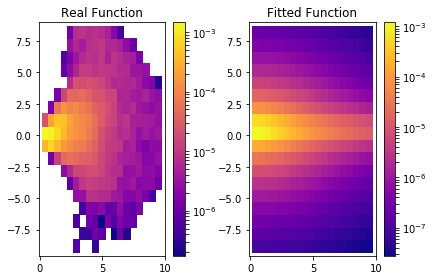

MND: a[kpc], b[kpc], vcirc [km/s]: 1.84813779555 0.825218839002 20.4691349797


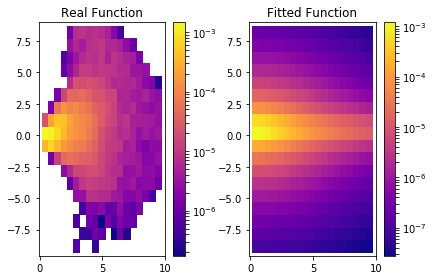

Start HB fit at 11:37:10.392292
/home/extmilan/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: divide by zero encountered in log



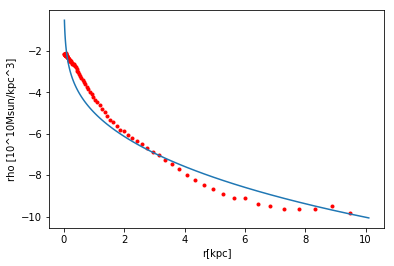

HB: a[kpc], vcirc [km/s]: 4.96863428768 41.889503974


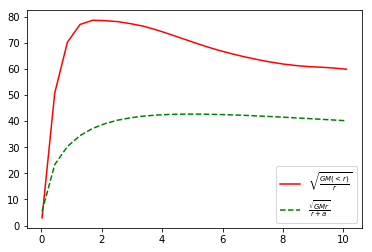

20.4691349797 41.889503974
v0_circ_tot = 135.011364823


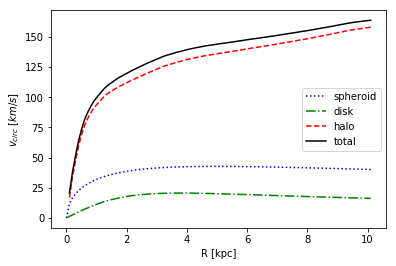

(1.8481377955541727, 0.82521883900220327, 4.9686342876752576, 20.469134979705252, 41.889503973962697, array([ 6.00435352,  5.45233536,  2.77579784, ...,  1.05074406,
        3.53779769,  6.03354454], dtype=float32), array([-1.49464095, -2.99968815, -2.49481392, ...,  7.07717466,
       -6.78740931,  6.83447647], dtype=float32), array([-67584.3671875 , -66347.8515625 , -73079.46875   , ...,
       -72679.15625   , -64506.32421875, -65789.578125  ]), 3.3676862716674805)


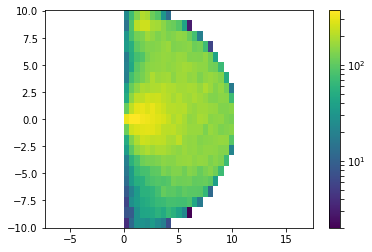

10 (10,)
[  64.            3.36768627  112.51141869    1.8481378     0.82521884
    4.96863429    9.06083191   20.46913498   41.88950397  102.39679343]
Snapshot =  64
v0_tot_kms at R0_kpc = 3.36768627167 : 112.51141869
Stellar Disk - a_MND_kpc = 1.84813779555 b_MND_kpc = 0.825218839002 v0_MND_kms = 20.4691349797
Stellar Spheroid - a_HB_kp c= 4.96863428768 v0_HB_kms = 41.889503974
DM Halo - a_NFWH_kpc = 9.06083191038 v0_NFWH_kms = 102.396793434
snapnr  : 65
11:39:12.980173
[ 12.78022385  12.30894375  13.11660862]
Found 284600 stars.
Rotated pos.
Rotated vel.

galrad  : 0.010567814856767655
redshift: 1.6666695561144653
time    : 0.3749995936718436
center  : [ 0.  0.  0.]

computing star properties
computing histograms


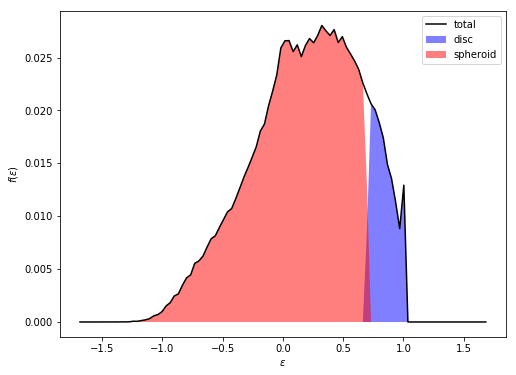

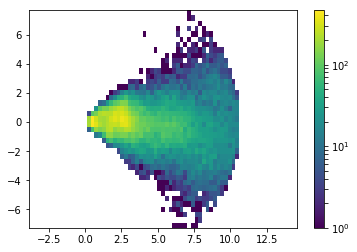

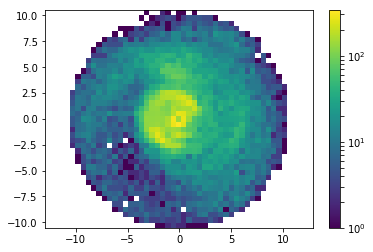

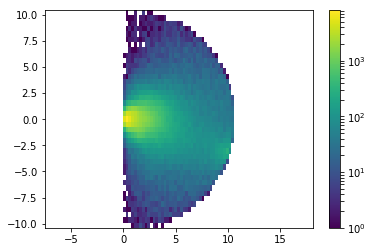

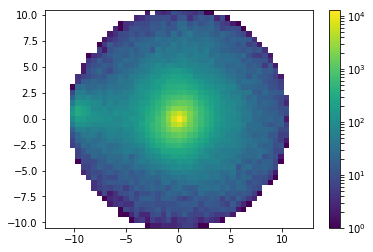

Start MND fit at 11:40:44.925123


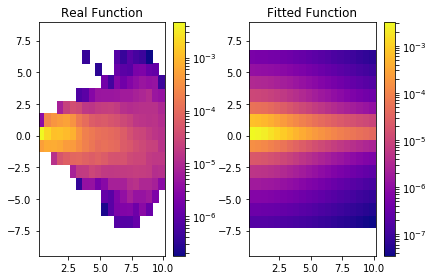

MND: a[kpc], b[kpc], vcirc [km/s]: 2.17341874612 0.461981490741 30.8578669097


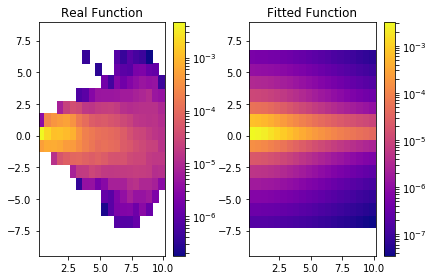

Start HB fit at 11:40:46.722273


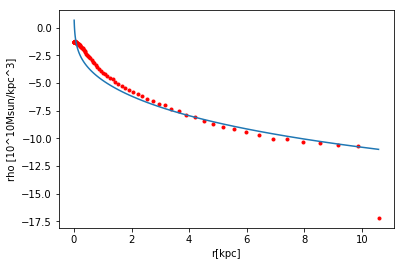

HB: a[kpc], vcirc [km/s]: 2.62323453731 59.4252169065


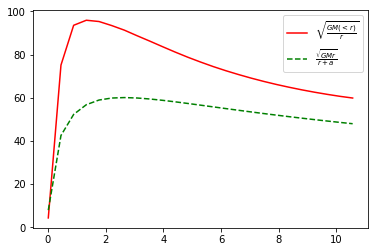

30.8578669097 59.4252169065
v0_circ_tot = 153.350732947


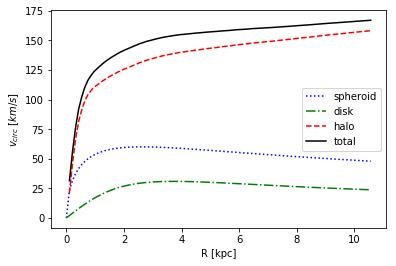

(2.1734187461220764, 0.46198149074052386, 2.6232345373112311, 30.857866909667663, 59.425216906474112, array([ 7.82794619,  6.9123435 ,  5.3138442 , ...,  2.12464833,
        5.50607109,  9.38718033], dtype=float32), array([-6.39194155,  5.21523714,  1.27587461, ..., -0.07686991,
       -2.90174675, -4.69949579], dtype=float32), array([-65664.4375   , -66875.078125 , -73657.65625  , ..., -85626.7265625,
       -72023.578125 , -65687.8515625]), 3.5226049522558847)


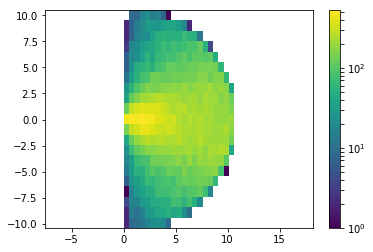

10 (10,)
[  65.            3.52260495  127.79283475    2.17341875    0.46198149
    2.62323454    8.33679979   30.85786691   59.42521691  108.84596574]
Snapshot =  65
v0_tot_kms at R0_kpc = 3.52260495226 : 127.792834746
Stellar Disk - a_MND_kpc = 2.17341874612 b_MND_kpc = 0.461981490741 v0_MND_kms = 30.8578669097
Stellar Spheroid - a_HB_kp c= 2.62323453731 v0_HB_kms = 59.4252169065
DM Halo - a_NFWH_kpc = 8.33679979421 v0_NFWH_kms = 108.84596574
snapnr  : 66
11:42:37.845401
[ 13.08854771  12.60904121  13.44554806]
Found 351151 stars.
Rotated pos.
Rotated vel.

galrad  : 0.010956618189811708
redshift: 1.6042345220731056
time    : 0.3839899945738943
center  : [ 0.  0.  0.]

computing star properties
computing histograms


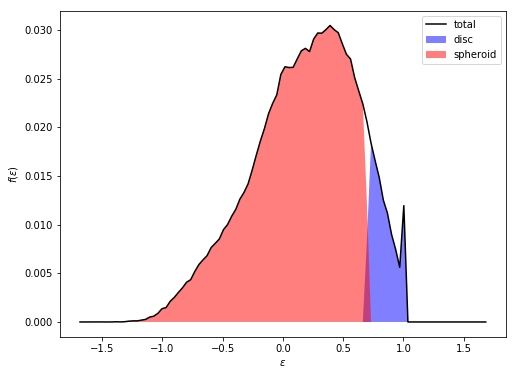

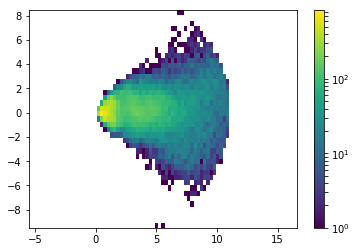

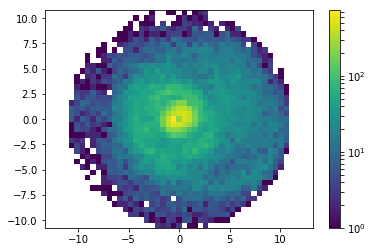

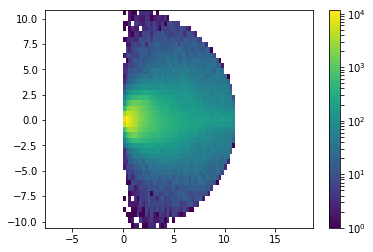

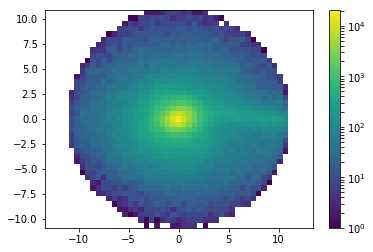

Start MND fit at 11:43:42.937509


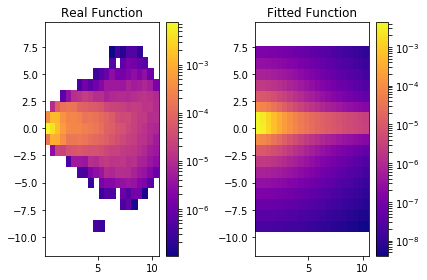

MND: a[kpc], b[kpc], vcirc [km/s]: 0.771594280904 0.239259764217 39.8184499544


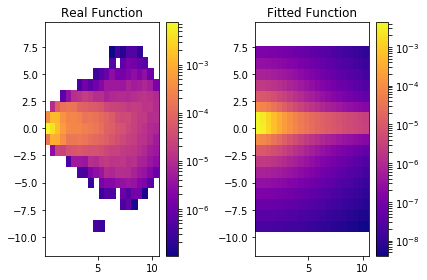

Start HB fit at 11:43:44.943668


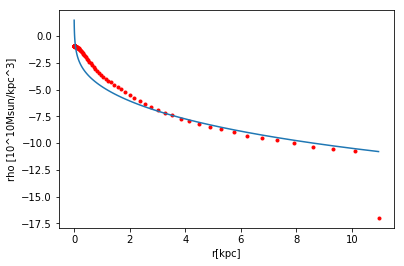

HB: a[kpc], vcirc [km/s]: 3.12549323964 62.6327173996


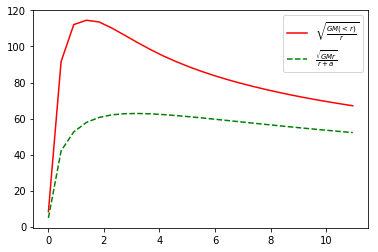

39.8184499544 62.6327173996
v0_circ_tot = 166.811995036


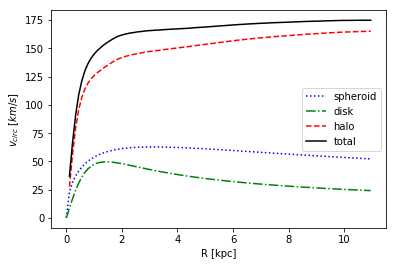

(0.77159428090441418, 0.239259764216605, 3.1254932396405626, 39.818449954406852, 62.632717399622123, array([ 3.27054024,  9.72830391,  1.22267604, ...,  3.8698597 ,
        1.65669179,  4.54857445], dtype=float32), array([ 4.24032402, -0.44437382,  0.15396304, ..., -9.56099129,
       -0.37156376,  2.5316875 ], dtype=float32), array([-75871.078125 , -67771.375    , -98945.625    , ..., -66368.21875  ,
       -94155.703125 , -77126.5078125]), 3.6522060632705688)


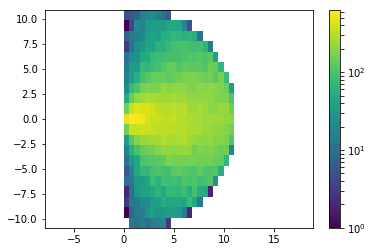

10 (10,)
[  66.            3.65220606  139.01148059    0.77159428    0.23925976
    3.12549324    7.30320777   39.81844995   62.6327174   117.5407397 ]
Snapshot =  66
v0_tot_kms at R0_kpc = 3.65220606327 : 139.011480589
Stellar Disk - a_MND_kpc = 0.771594280904 b_MND_kpc = 0.239259764217 v0_MND_kms = 39.8184499544
Stellar Spheroid - a_HB_kp c= 3.12549323964 v0_HB_kms = 62.6327173996
DM Halo - a_NFWH_kpc = 7.30320777428 v0_NFWH_kms = 117.540739703
snapnr  : 67
11:46:24.905764
[ 13.4669323   12.98056126  13.84910297]
Found 371337 stars.
Rotated pos.
Rotated vel.

galrad  : 0.011243060231208801
redshift: 1.5312390291576135
time    : 0.395063440663206
center  : [ 0.  0.  0.]

computing star properties
computing histograms


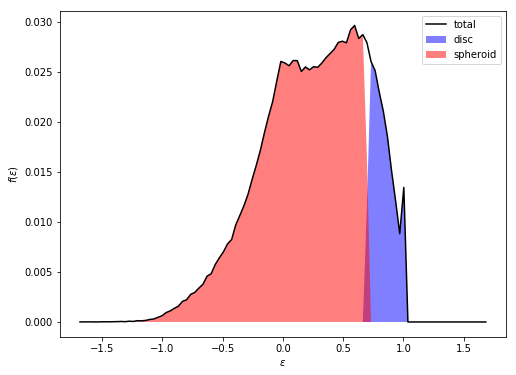

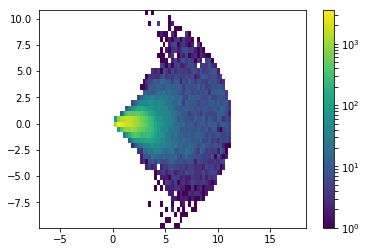

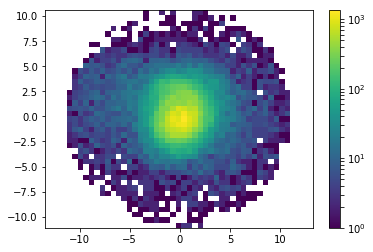

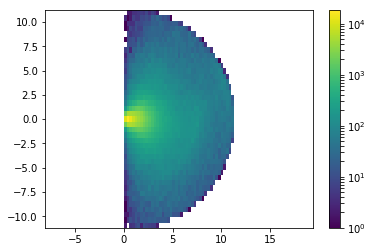

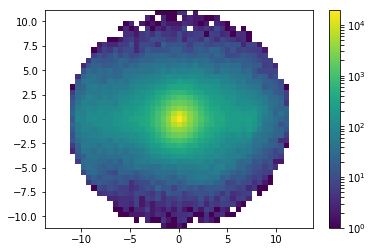

Start MND fit at 11:47:52.710386


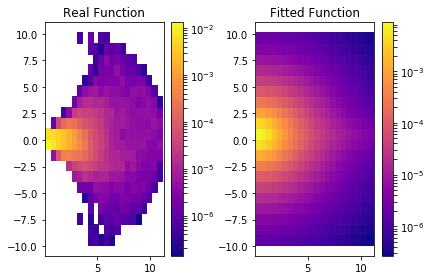

MND: a[kpc], b[kpc], vcirc [km/s]: 0.231361299332 1.70159918805 45.7142811086


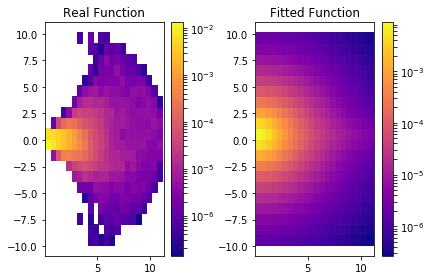

Start HB fit at 11:47:54.626142


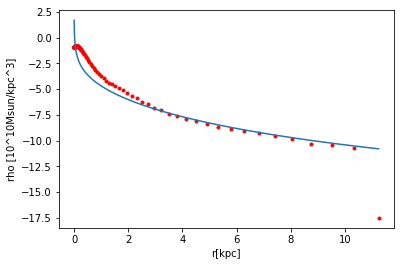

HB: a[kpc], vcirc [km/s]: 3.21561431032 63.8167074619


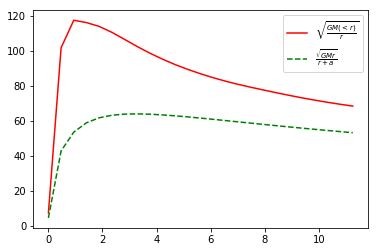

45.7142811086 63.8167074619
v0_circ_tot = 169.225327985


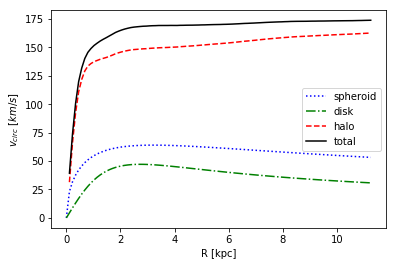

(0.23136129933240601, 1.7015991880465131, 3.2156143103174912, 45.714281108562325, 63.816707461932282, array([  2.5610683 ,   7.88737249,  10.00851727, ...,   2.00042486,
         2.48004174,   8.41499233], dtype=float32), array([-8.55795574, -2.91677189,  3.7279613 , ...,  0.54193228,
       -8.35831451,  1.14145482], dtype=float32), array([-72775.125    , -73604.703125 , -70595.2890625, ..., -94019.5390625,
       -73022.5      , -73744.34375  ]), 3.7476867437362671)


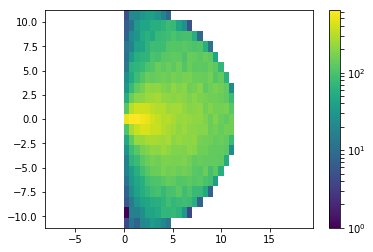

10 (10,)
[  67.            3.74768674  141.02909781    0.2313613     1.70159919
    3.21561431    7.83821176   45.71428111   63.81670746  117.1615926 ]
Snapshot =  67
v0_tot_kms at R0_kpc = 3.74768674374 : 141.029097812
Stellar Disk - a_MND_kpc = 0.231361299332 b_MND_kpc = 1.70159918805 v0_MND_kms = 45.7142811086
Stellar Spheroid - a_HB_kp c= 3.21561431032 v0_HB_kms = 63.8167074619
DM Halo - a_NFWH_kpc = 7.83821175606 v0_NFWH_kms = 117.161592602
snapnr  : 68
11:49:52.514582
[ 13.78952217  13.29696274  14.19396877]
Found 415479 stars.
Rotated pos.
Rotated vel.

galrad  : 0.011517290025949478
redshift: 1.4719748452657977
time    : 0.40453486082803386
center  : [ 0.  0.  0.]

computing star properties
computing histograms


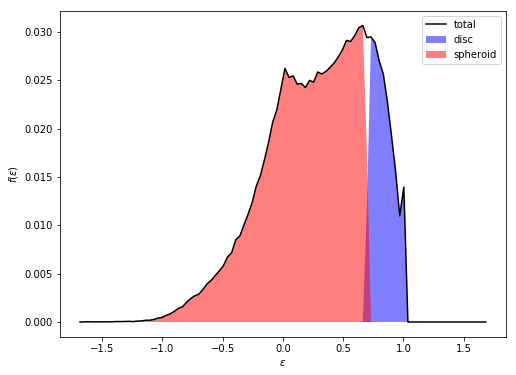

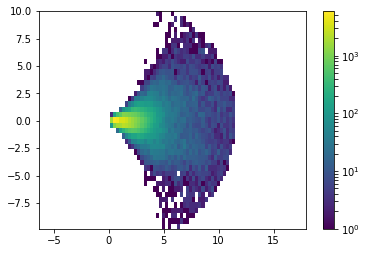

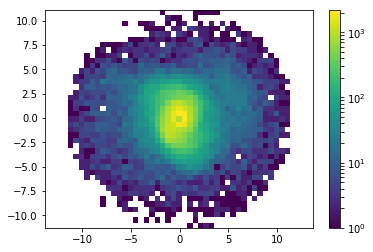

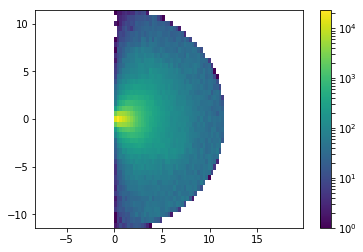

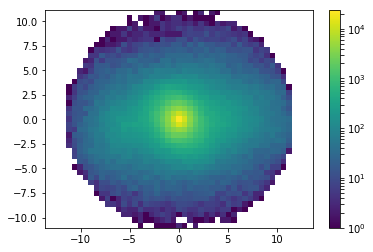

Start MND fit at 11:51:13.106379


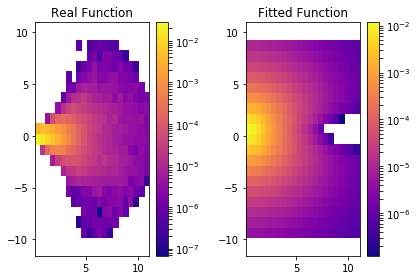

MND: a[kpc], b[kpc], vcirc [km/s]: -0.384344689878 2.23588761371 52.7038028283


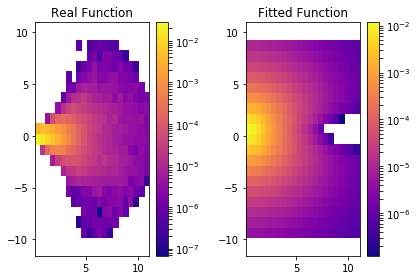

Start HB fit at 11:51:15.237031


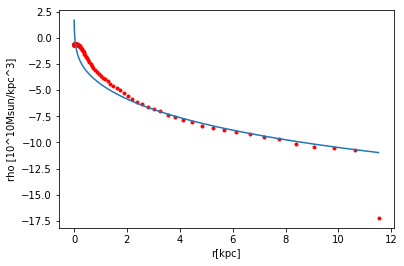

HB: a[kpc], vcirc [km/s]: 2.56656138695 72.6410688316


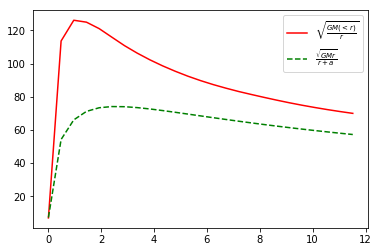

52.7038028283 72.6410688316
v0_circ_tot = 178.382896238


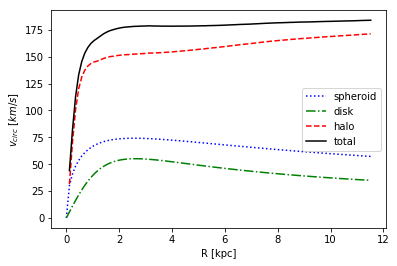

(-0.38434468987802617, 2.235887613706586, 2.5665613869536368, 52.70380282831448, 72.64106883161692, array([ 2.03027868,  4.29769182,  3.87669063, ...,  4.32524729,
        9.89836216,  6.30716038], dtype=float32), array([-0.01170681,  3.78916335, -8.58102131, ...,  2.29077506,
       -4.48993349,  6.59042931], dtype=float32), array([-101891.15625  ,  -82802.8203125,  -78333.09375  , ...,
        -85768.03125  ,  -72987.1171875,  -75986.328125 ]), 3.8390966753164926)


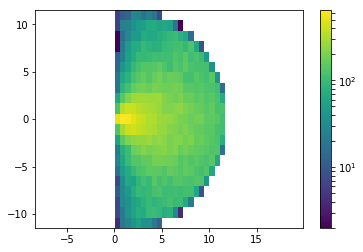

/home/extmilan/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:112: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)

10 (10,)
[  68.            3.83909668  259.23659663   -0.38434469    2.23588761
    2.56656139   54.14477599   52.70380283   72.64106883  243.20607994]
Snapshot =  68
v0_tot_kms at R0_kpc = 3.83909667532 : 259.236596629
Stellar Disk - a_MND_kpc = -0.384344689878 b_MND_kpc = 2.23588761371 v0_MND_kms = 52.7038028283
Stellar Spheroid - a_HB_kp c= 2.56656138695 v0_HB_kms = 72.6410688316
DM Halo - a_NFWH_kpc = 54.1447759929 v0_NFWH_kms = 243.206079937
snapnr  : 69
11:53:13.275610
[ 14.12320042  13.61969185  14.55005264]
Found 458329 stars.
Rotated pos.
Rotated vel.

galrad  : 0.011756277829408647
redshift: 1.4140982203725216
time    : 0.41423335287728646
center  : [ 0.  0.  0.]

computing star properties
computing histograms


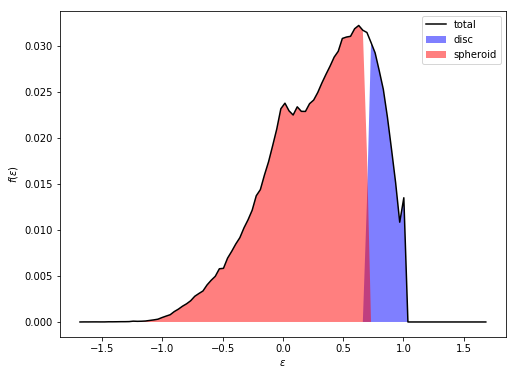

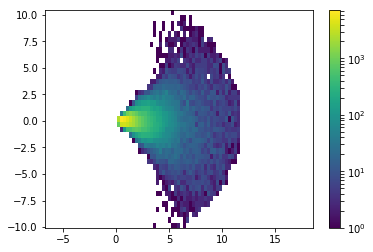

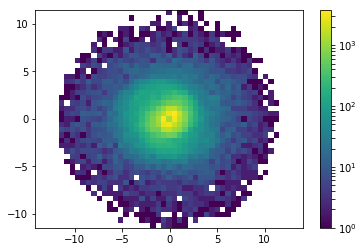

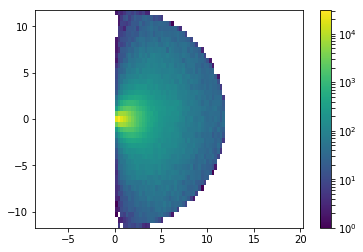

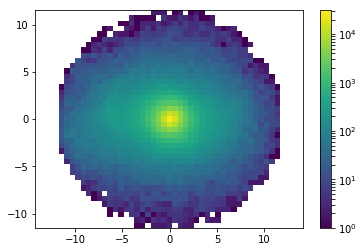

Start MND fit at 11:54:29.284420


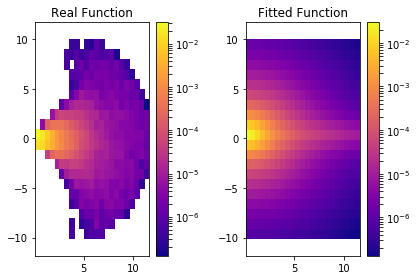

MND: a[kpc], b[kpc], vcirc [km/s]: 0.433255945531 1.06335231787 57.70748874


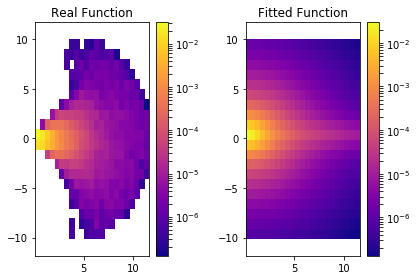

Start HB fit at 11:54:31.335216


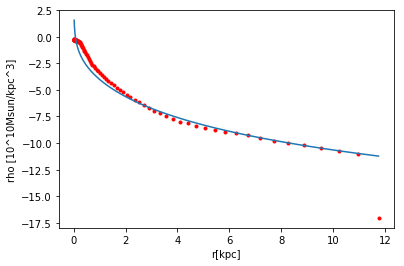

HB: a[kpc], vcirc [km/s]: 1.78499722424 86.2410839861


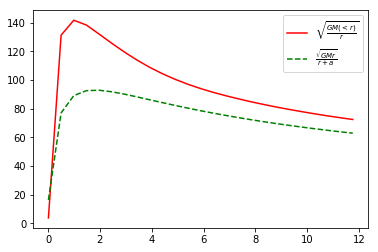

57.70748874 86.2410839861
v0_circ_tot = 183.421039927


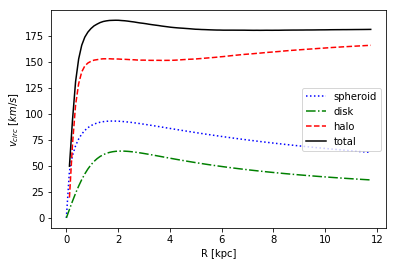

(0.43325594553072194, 1.0633523178671505, 1.7849972242438055, 57.707488740034705, 86.241083986110979, array([  3.96682   ,   5.55164146,   8.21730328, ...,   7.46874905,
         5.14165878,  11.49214745], dtype=float32), array([ 0.66969597, -5.99734879,  5.17317724, ..., -2.7165637 ,
       -8.21490002,  0.15733974], dtype=float32), array([-89869.03125  , -79727.4296875, -76862.6171875, ..., -78937.46875  ,
       -78140.3515625, -72035.484375 ]), 3.9187592764695487)


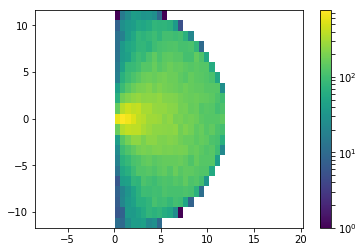

10 (10,)
[  69.            3.91875928  152.85309591    0.43325595    1.06335232
    1.78499722    9.45617105   57.70748874   86.24108399  112.2336407 ]
Snapshot =  69
v0_tot_kms at R0_kpc = 3.91875927647 : 152.853095911
Stellar Disk - a_MND_kpc = 0.433255945531 b_MND_kpc = 1.06335231787 v0_MND_kms = 57.70748874
Stellar Spheroid - a_HB_kp c= 1.78499722424 v0_HB_kms = 86.2410839861
DM Halo - a_NFWH_kpc = 9.45617105254 v0_NFWH_kms = 112.233640704
snapnr  : 70
11:56:57.220949
[ 14.46787739  13.95026779  14.91678429]
Found 483558 stars.
Rotated pos.
Rotated vel.

galrad  : 0.012081409990787507
redshift: 1.3575766674029972
time    : 0.42416436072959446
center  : [ 0.  0.  0.]

computing star properties
computing histograms


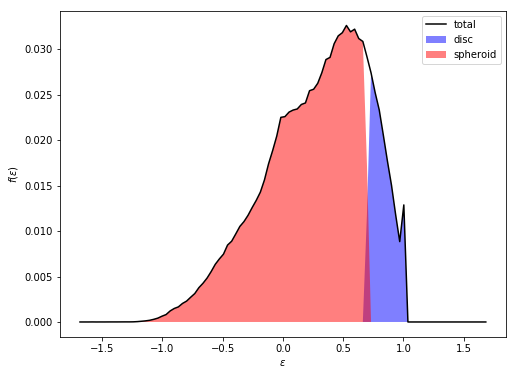

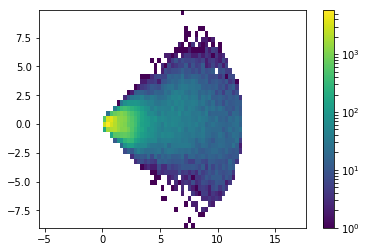

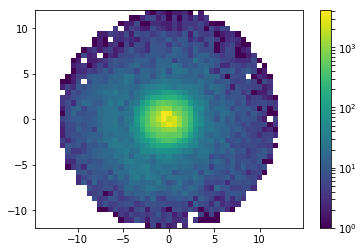

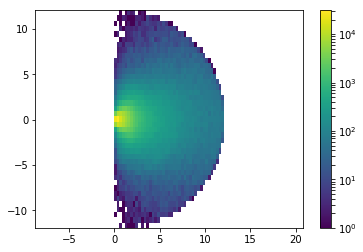

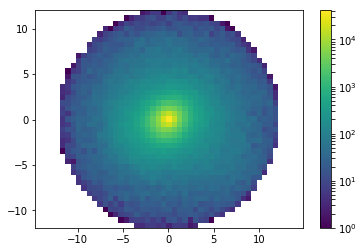

Start MND fit at 11:58:18.649718


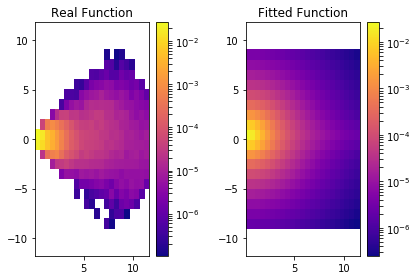

MND: a[kpc], b[kpc], vcirc [km/s]: 0.102858867268 1.3612953971 55.0392938016


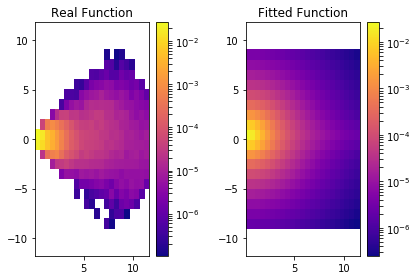

Start HB fit at 11:58:20.620984


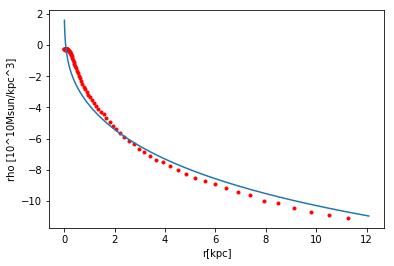

HB: a[kpc], vcirc [km/s]: 2.02286546294 87.4085103133


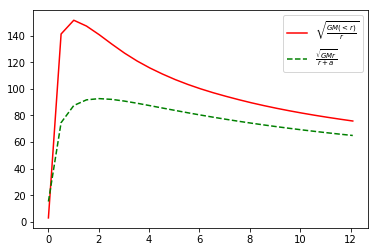

55.0392938016 87.4085103133
v0_circ_tot = 186.79735219


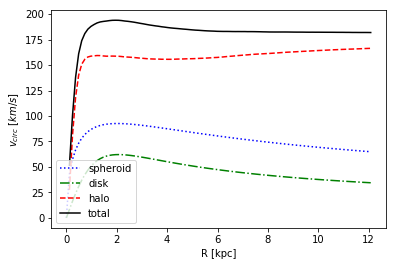

(0.10285886726777234, 1.3612953971027983, 2.0228654629399712, 55.039293801589281, 87.408510313299757, array([ 11.15782452,   6.17650604,   2.81616879, ...,   2.20872235,
         2.05065823,   0.99866486], dtype=float32), array([-4.45071888,  1.51955807, -0.16264321, ..., -0.32723382,
        4.45438051,  0.25236595], dtype=float32), array([ -73892.3125   ,  -85343.5234375,  -98850.25     , ...,
       -104627.7578125,  -88381.3046875, -119121.84375  ]), 4.0271366635958357)


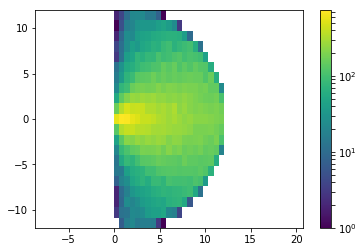

10 (10,)
[  7.00000000e+01   4.02713666e+00   1.55666844e+02   1.02858867e-01
   1.36129540e+00   2.02286546e+00   8.99700564e+00   5.50392938e+01
   8.74085103e+01   1.16458554e+02]
Snapshot =  70
v0_tot_kms at R0_kpc = 4.0271366636 : 155.666843986
Stellar Disk - a_MND_kpc = 0.102858867268 b_MND_kpc = 1.3612953971 v0_MND_kms = 55.0392938016
Stellar Spheroid - a_HB_kp c= 2.02286546294 v0_HB_kms = 87.4085103133
DM Halo - a_NFWH_kpc = 8.99700564025 v0_NFWH_kms = 116.458553912
snapnr  : 71
12:01:06.801898
[ 14.82138062  14.29028893  15.29212379]
Found 513965 stars.
Rotated pos.
Rotated vel.

galrad  : 0.012840379774570466
redshift: 1.3023784599059653
time    : 0.4343334588184266
center  : [ 0.  0.  0.]

computing star properties
computing histograms


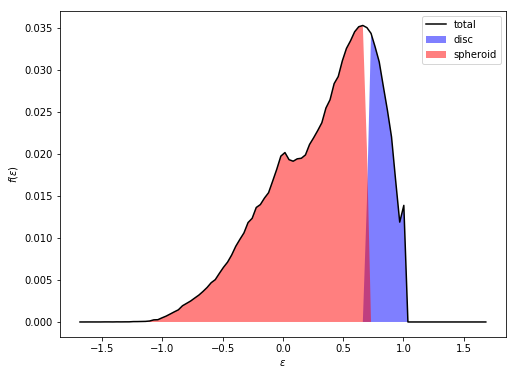

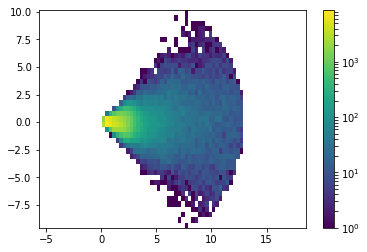

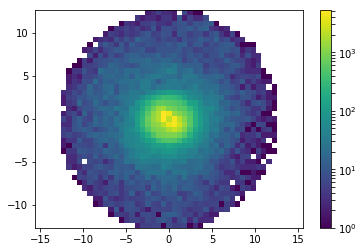

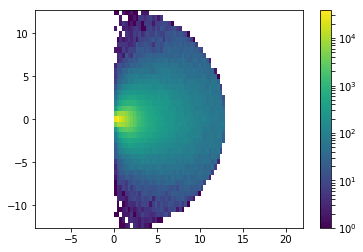

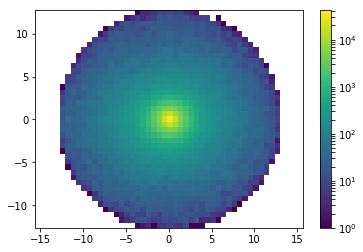

Start MND fit at 12:02:42.287100


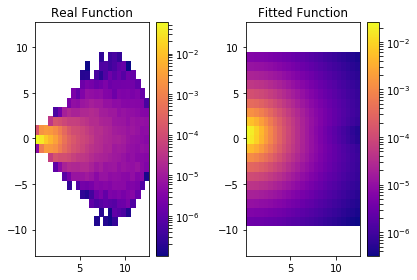

MND: a[kpc], b[kpc], vcirc [km/s]: -0.044403643936 1.58995802741 63.4959244903


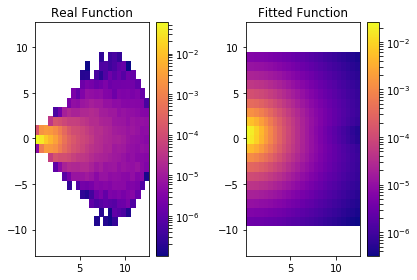

Start HB fit at 12:02:44.465299


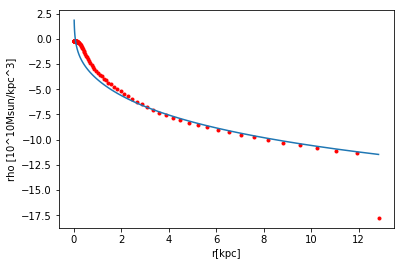

HB: a[kpc], vcirc [km/s]: 1.9148933132 87.8489487691


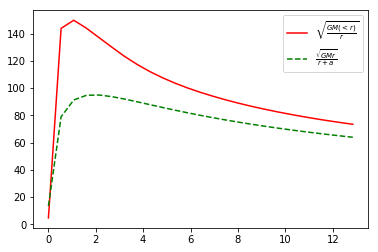

63.4959244903 87.8489487691
v0_circ_tot = 188.149135654


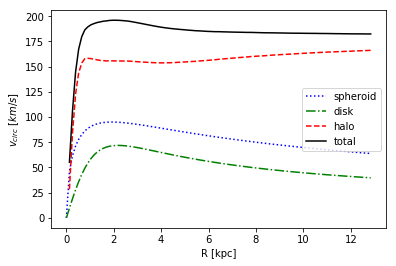

(-0.044403643935983644, 1.5899580274123815, 1.9148933132009045, 63.495924490332655, 87.848948769140819, array([  7.433249  ,   1.7264303 ,   0.87892812, ...,   2.87570238,
         4.80252266,  11.20170212], dtype=float32), array([ -0.29103422,  -4.23113966,   3.03852415, ...,  -5.55491829,
        10.36898422,   4.22716045], dtype=float32), array([-84431.1328125, -91454.6640625, -97873.421875 , ..., -86082.3828125,
       -77294.734375 , -76499.1328125]), 4.2801265915234881)


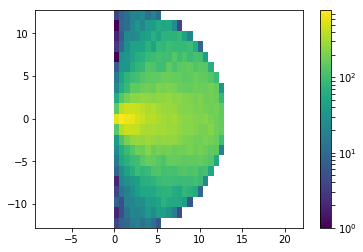

10 (10,)
[  7.10000000e+01   4.28012659e+00   1.63019596e+02  -4.44036439e-02
   1.58995803e+00   1.91489331e+00   3.43409851e+02   6.34959245e+01
   8.78489488e+01   1.21762960e+02]
Snapshot =  71
v0_tot_kms at R0_kpc = 4.28012659152 : 163.0195959
Stellar Disk - a_MND_kpc = -0.044403643936 b_MND_kpc = 1.58995802741 v0_MND_kms = 63.4959244903
Stellar Spheroid - a_HB_kp c= 1.9148933132 v0_HB_kms = 87.8489487691
DM Halo - a_NFWH_kpc = 343.409851035 v0_NFWH_kms = 121.76295997
snapnr  : 72
12:05:09.920322
[ 15.1824646   14.63997269  15.67546272]
Found 536367 stars.
Rotated pos.
Rotated vel.

galrad  : 0.013163433969020845
redshift: 1.2484726142451428
time    : 0.4447463552211064
center  : [ 0.  0.  0.]

computing star properties
computing histograms


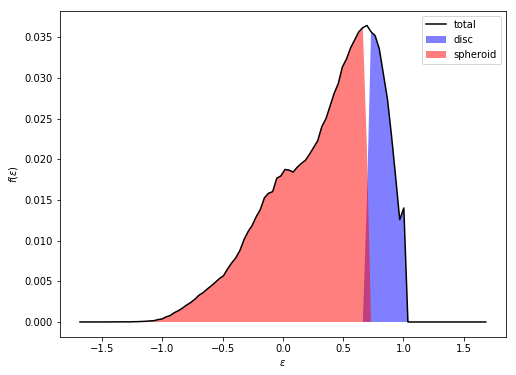

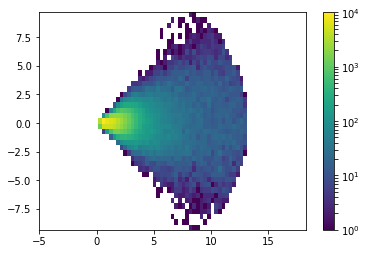

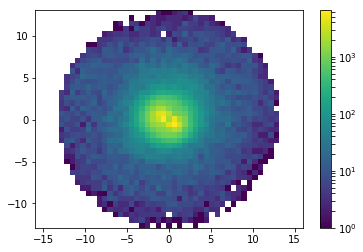

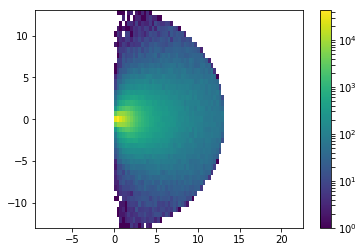

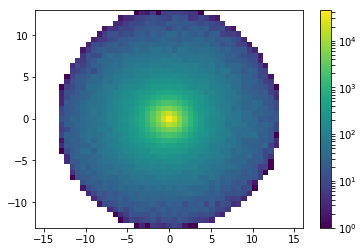

Start MND fit at 12:06:27.887152


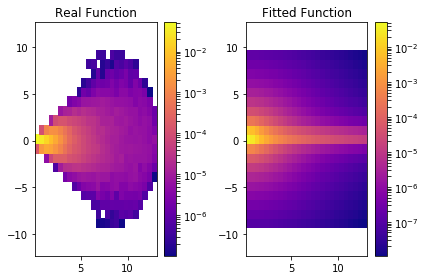

MND: a[kpc], b[kpc], vcirc [km/s]: 0.688779712106 0.2739041968 69.9287846277


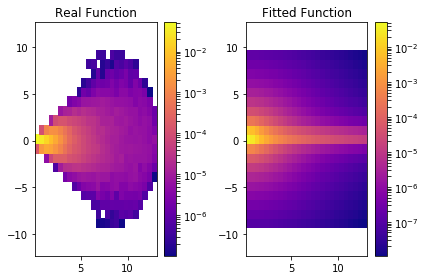

Start HB fit at 12:06:30.242472


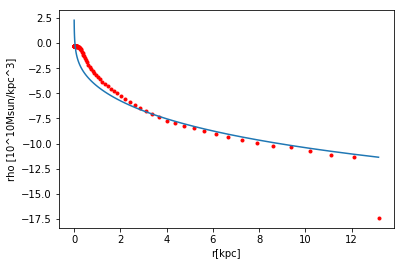

HB: a[kpc], vcirc [km/s]: 2.51905768202 80.8205125588


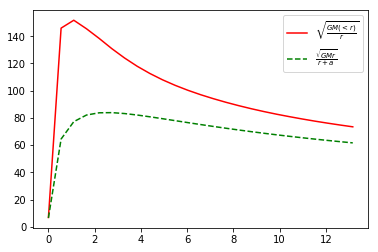

69.9287846277 80.8205125588
v0_circ_tot = 188.800521423


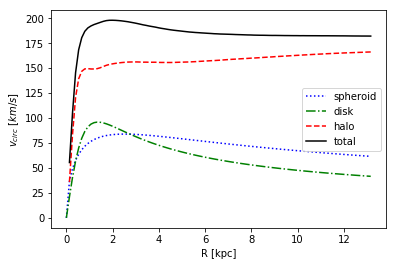

(0.68877971210638145, 0.27390419680005235, 2.5190576820205823, 69.928784627710399, 80.820512558811657, array([  3.58893418,   1.29173708,  10.23097801, ...,   3.00560832,
         2.4689858 ,   1.7366395 ], dtype=float32), array([-1.49569929,  3.05983067,  7.38944721, ..., -0.30258262,
        1.14001274, -2.56351376], dtype=float32), array([-100678.5859375, -102140.296875 ,  -78973.515625 , ...,
       -105711.7578125, -107866.9453125, -103237.78125  ]), 4.3878113230069484)


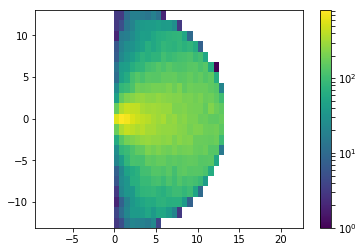

10 (10,)
[  72.            4.38781132  157.34524351    0.68877971    0.2739042
    2.51905768   10.79343237   69.92878463   80.82051256  115.47958905]
Snapshot =  72
v0_tot_kms at R0_kpc = 4.38781132301 : 157.345243514
Stellar Disk - a_MND_kpc = 0.688779712106 b_MND_kpc = 0.2739041968 v0_MND_kms = 69.9287846277
Stellar Spheroid - a_HB_kp c= 2.51905768202 v0_HB_kms = 80.8205125588
DM Halo - a_NFWH_kpc = 10.7934323701 v0_NFWH_kms = 115.479589048
snapnr  : 73
12:09:02.982798
[ 15.47813797  14.92653275  15.98590374]
Found 667800 stars.
Rotated pos.
Rotated vel.

galrad  : 0.013611219823360443
redshift: 1.2062580807810006
time    : 0.45325613023749545
center  : [ 0.  0.  0.]

computing star properties
computing histograms


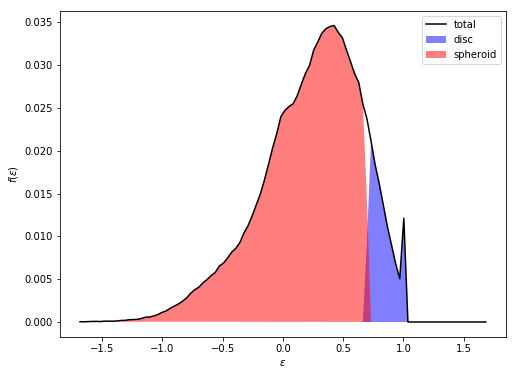

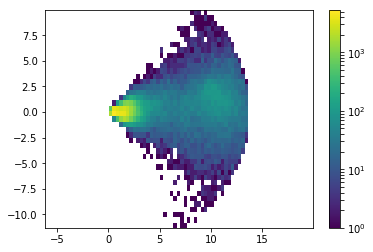

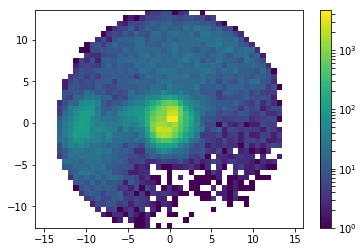

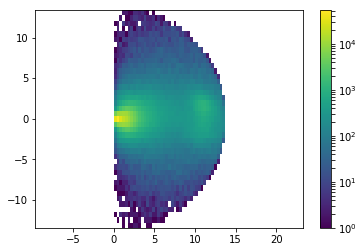

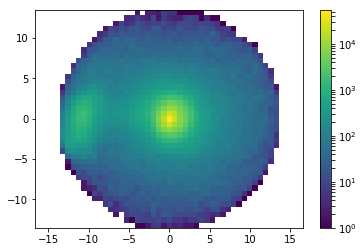

Start MND fit at 12:10:12.700908


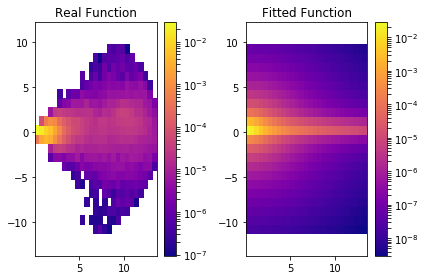

MND: a[kpc], b[kpc], vcirc [km/s]: 0.831125974337 0.242974090775 52.6839249392


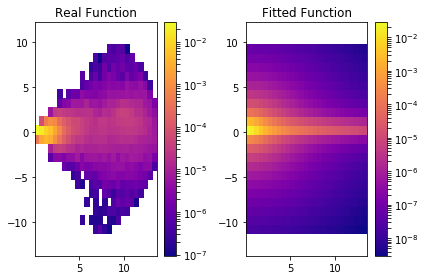

Start HB fit at 12:10:14.908069


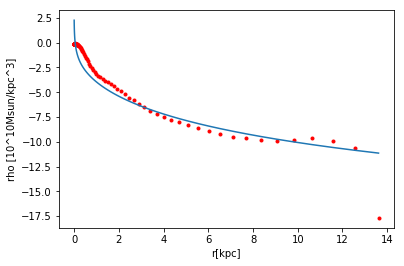

HB: a[kpc], vcirc [km/s]: 2.52001918094 94.3007055141


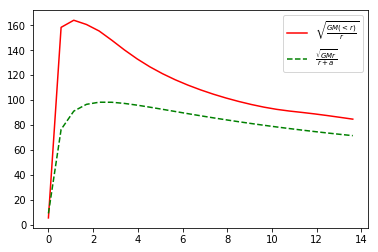

52.6839249392 94.3007055141
v0_circ_tot = 210.71302478


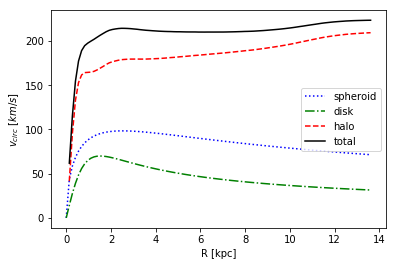

(0.83112597433668067, 0.24297409077541141, 2.5200191809399666, 52.683924939170566, 94.300705514101793, array([ 2.16912127,  9.13706303,  3.66030979, ...,  8.83560181,
        7.56666851,  7.56820202], dtype=float32), array([ 0.92607951,  2.01822305, -2.05413222, ..., -0.1323265 ,
       -1.41747522,  4.11707354], dtype=float32), array([-130341.21875  , -110994.7421875, -121638.21875  , ...,
       -117975.75     , -106237.5078125,  -99765.3515625]), 4.5370732744534807)


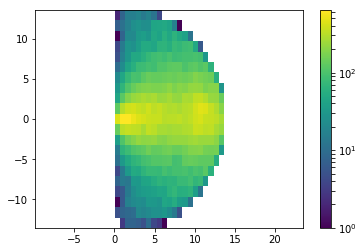

10 (10,)
[  73.            4.53707327  175.59571609    0.83112597    0.24297409
    2.52001918    9.21933359   52.68392494   94.30070551  138.44001048]
Snapshot =  73
v0_tot_kms at R0_kpc = 4.53707327445 : 175.595716092
Stellar Disk - a_MND_kpc = 0.831125974337 b_MND_kpc = 0.242974090775 v0_MND_kms = 52.6839249392
Stellar Spheroid - a_HB_kp c= 2.52001918094 v0_HB_kms = 94.3007055141
DM Halo - a_NFWH_kpc = 9.21933358735 v0_NFWH_kms = 138.440010483
snapnr  : 74
12:12:06.062148
[ 15.85394859  15.28774834  16.39402962]
Found 754347 stars.
Rotated pos.
Rotated vel.

galrad  : 0.014235840737819673
redshift: 1.1546027123602154
time    : 0.46412268687092223
center  : [ 0.  0.  0.]

computing star properties
computing histograms


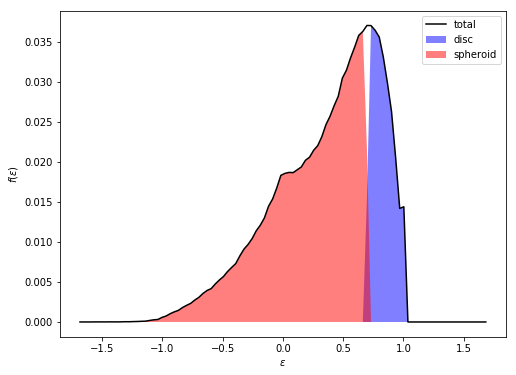

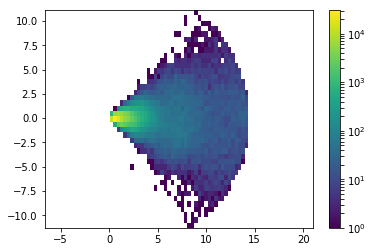

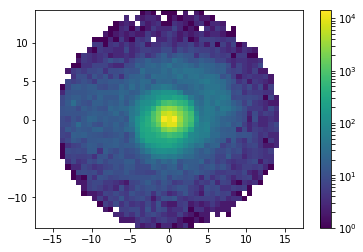

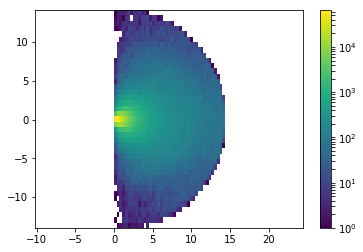

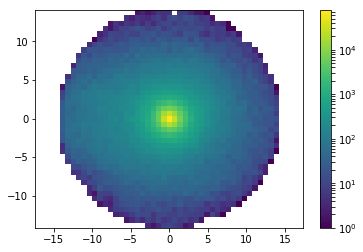

Start MND fit at 12:13:14.973353


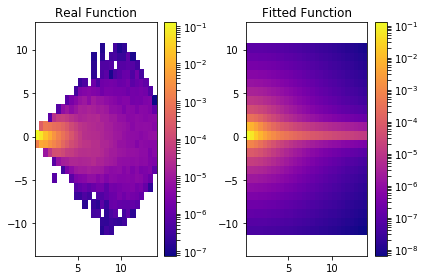

MND: a[kpc], b[kpc], vcirc [km/s]: 0.541906347372 0.252946131675 77.9602573381


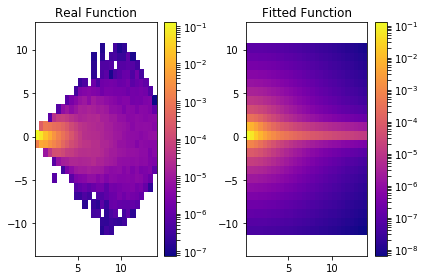

Start HB fit at 12:13:17.888135


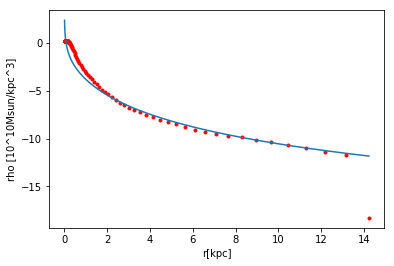

HB: a[kpc], vcirc [km/s]: 1.65710872435 98.6642085963


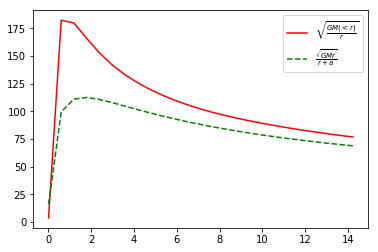

77.9602573381 98.6642085963
v0_circ_tot = 216.392794951


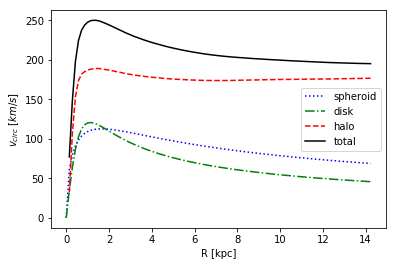

(0.54190634737197996, 0.25294613167517627, 1.6571087243518128, 77.960257338085398, 98.664208596274918, array([  8.0984993 ,  13.39307785,   5.50431013, ...,   2.47666621,
         7.57399607,   8.94193554], dtype=float32), array([-3.34865332,  3.01267934, -3.01426959, ...,  1.15136921,
        6.20359945,  5.40710258], dtype=float32), array([ -97041.09375  ,  -90229.875    , -104007.1484375, ...,
       -125901.6015625,  -94953.1640625,  -92777.765625 ]), 4.7452802459398908)


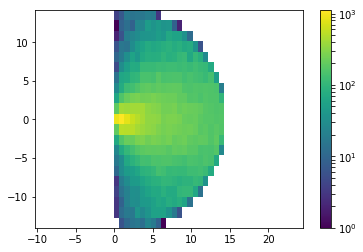

10 (10,)
[  74.            4.74528025  180.34439384    0.54190635    0.25294613
    1.65710872   10.06620023   77.96025734   98.6642086   129.27363462]
Snapshot =  74
v0_tot_kms at R0_kpc = 4.74528024594 : 180.344393845
Stellar Disk - a_MND_kpc = 0.541906347372 b_MND_kpc = 0.252946131675 v0_MND_kms = 77.9602573381
Stellar Spheroid - a_HB_kp c= 1.65710872435 v0_HB_kms = 98.6642085963
DM Halo - a_NFWH_kpc = 10.0662002336 v0_NFWH_kms = 129.273634625
snapnr  : 75
12:15:20.816622
[ 16.16160011  15.58262157  16.72860718]
Found 788548 stars.
Rotated pos.
Rotated vel.

galrad  : 0.014569315314292909
redshift: 1.1141505637653806
time    : 0.4730032085410998
center  : [ 0.  0.  0.]

computing star properties
computing histograms


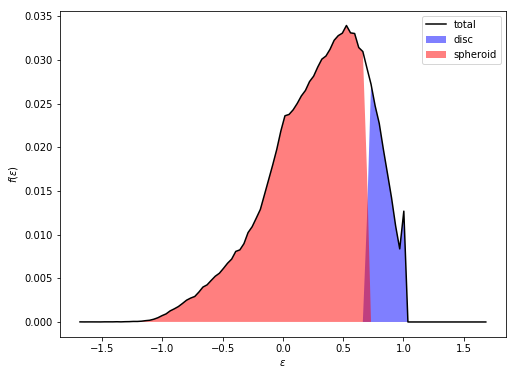

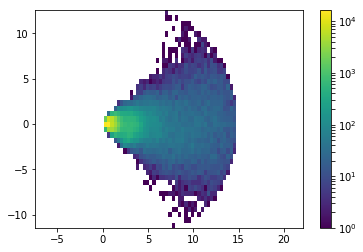

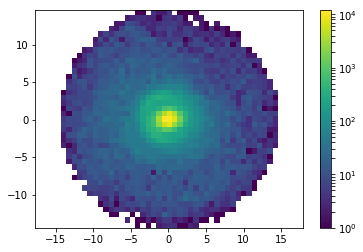

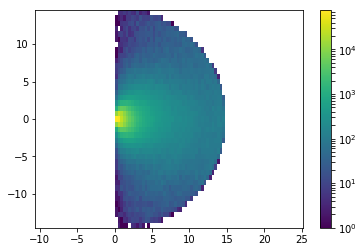

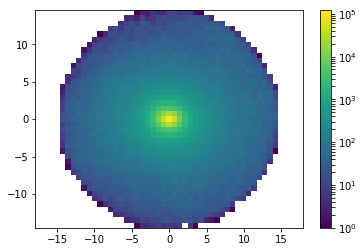

Start MND fit at 12:16:30.433709


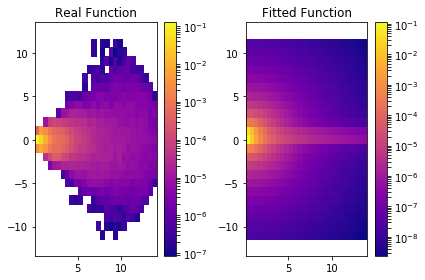

MND: a[kpc], b[kpc], vcirc [km/s]: 0.0806534793833 -0.187134560642 66.6518227718


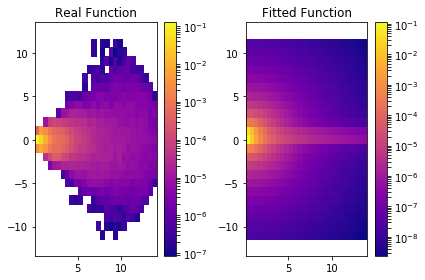

Start HB fit at 12:16:33.101612


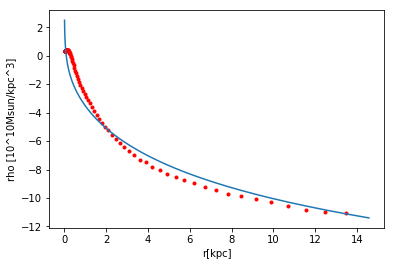

HB: a[kpc], vcirc [km/s]: 1.91305587191 106.068698661


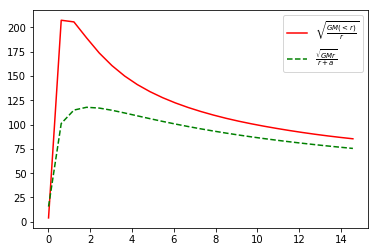

66.6518227718 106.068698661
v0_circ_tot = 218.140769695


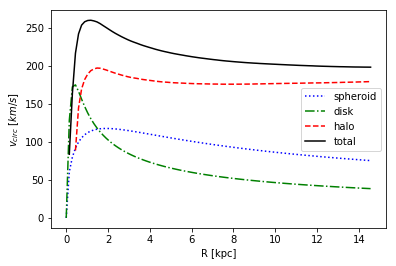

(0.08065347938334351, -0.18713456064159473, 1.913055871905605, 66.651822771789966, 106.06869866128112, array([ 5.7246232 ,  7.64998245,  3.21190667, ...,  9.00086975,
        8.23864079,  3.69625401], dtype=float32), array([ 1.67475677, -3.32045221, -2.98902988, ..., -7.32628632,
        1.18176377, -0.57782978], dtype=float32), array([-106817.015625 , -100146.5859375, -115115.0234375, ...,
        -92103.3515625, -100468.796875 , -120495.375    ]), 4.8564384380976362)


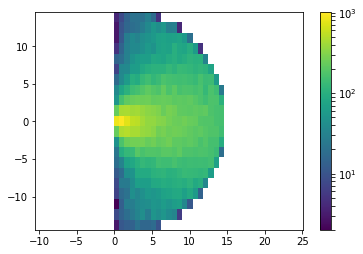

10 (10,)
[  7.50000000e+01   4.85643844e+00   3.87079240e+02   8.06534794e-02
  -1.87134561e-01   1.91305587e+00   9.33474092e+01   6.66518228e+01
   1.06068699e+02   3.66247599e+02]
Snapshot =  75
v0_tot_kms at R0_kpc = 4.8564384381 : 387.079239718
Stellar Disk - a_MND_kpc = 0.0806534793833 b_MND_kpc = -0.187134560642 v0_MND_kms = 66.6518227718
Stellar Spheroid - a_HB_kp c= 1.91305587191 v0_HB_kms = 106.068698661
DM Halo - a_NFWH_kpc = 93.3474091633 v0_NFWH_kms = 366.247598635
snapnr  : 76
12:18:34.347102
[ 16.47659492  15.88422775  17.06827354]
Found 817842 stars.
Rotated pos.
Rotated vel.

galrad  : 0.014894464612007143
redshift: 1.074457894547674
time    : 0.4820536500780824
center  : [ 0.  0.  0.]

computing star properties
computing histograms


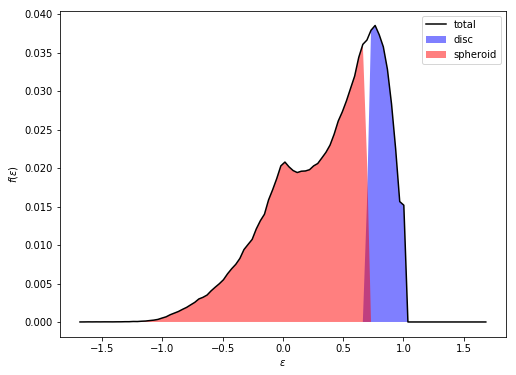

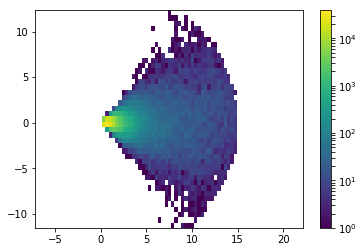

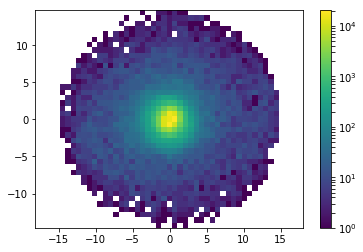

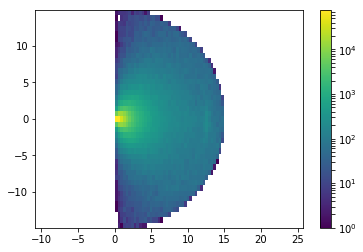

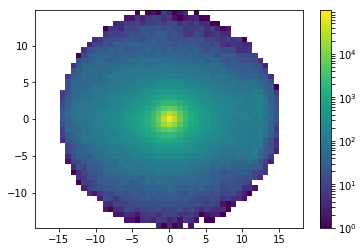

Start MND fit at 12:19:45.849308


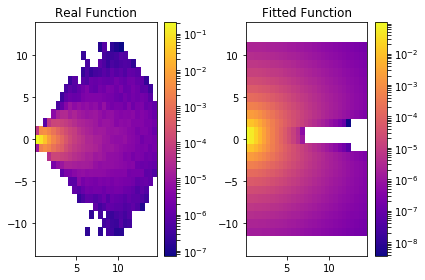

MND: a[kpc], b[kpc], vcirc [km/s]: -0.126222420195 1.24673495192 84.2592211024


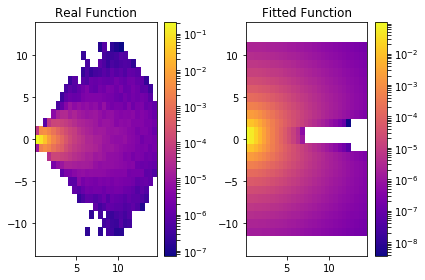

Start HB fit at 12:19:49.115780


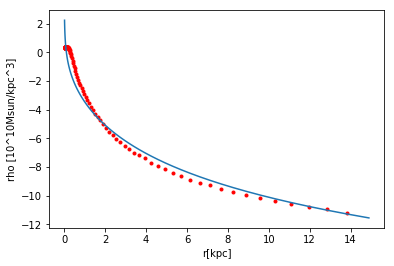

HB: a[kpc], vcirc [km/s]: 1.75252638389 103.808845732


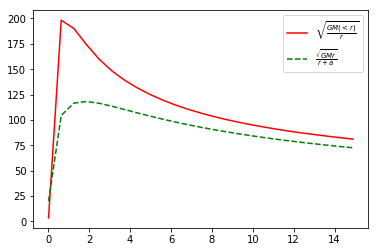

84.2592211024 103.808845732
v0_circ_tot = 220.362442596


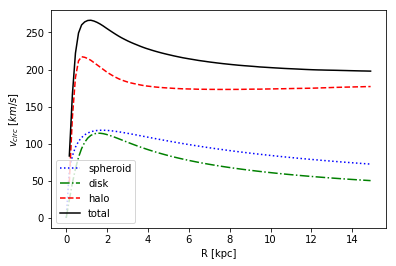

(-0.12622242019469465, 1.2467349519228506, 1.7525263838886509, 84.259221102401924, 103.80884573152758, array([ 9.26935673,  7.96779203,  6.98083878, ...,  7.04870224,
        7.94145155,  8.07838726], dtype=float32), array([ 4.17327642,  1.27709579,  1.45481575, ...,  1.54382646,
        1.49222887,  4.14655685], dtype=float32), array([ -97584.5078125, -103392.8515625, -104861.5234375, ...,
       -106243.6796875, -102967.8671875,  -99797.296875 ]), 4.9648215373357143)


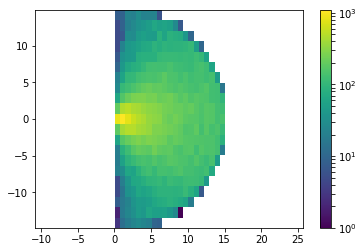

10 (10,)
[  7.60000000e+01   4.96482154e+00   2.75630154e+02  -1.26222420e-01
   1.24673495e+00   1.75252638e+00   1.55536478e+02   8.42592211e+01
   1.03808846e+02   2.41031303e+02]
Snapshot =  76
v0_tot_kms at R0_kpc = 4.96482153734 : 275.630154365
Stellar Disk - a_MND_kpc = -0.126222420195 b_MND_kpc = 1.24673495192 v0_MND_kms = 84.2592211024
Stellar Spheroid - a_HB_kp c= 1.75252638389 v0_HB_kms = 103.808845732
DM Halo - a_NFWH_kpc = 155.536478156 v0_NFWH_kms = 241.031303366
snapnr  : 77
12:21:50.156409
[ 16.79800034  16.19346237  17.41295624]
Found 827454 stars.
Rotated pos.
Rotated vel.

galrad  : 0.01519409567117691
redshift: 1.035510445664141
time    : 0.4912772627279358
center  : [ 0.  0.  0.]

computing star properties
computing histograms


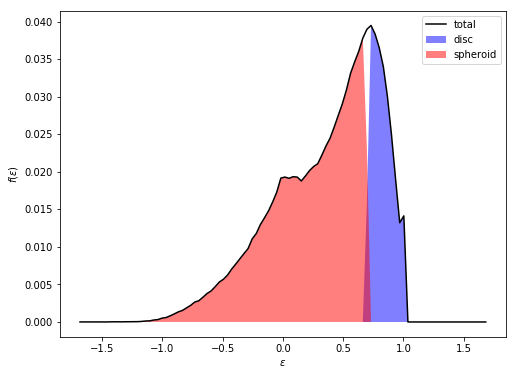

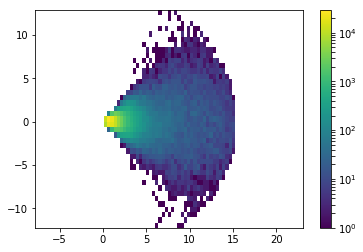

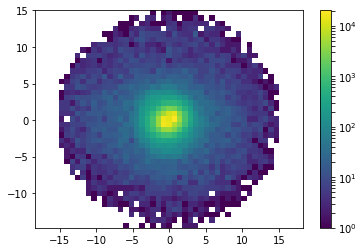

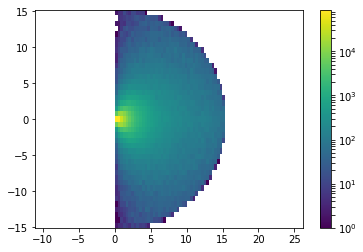

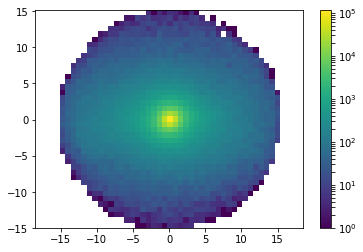

Start MND fit at 12:23:25.223582


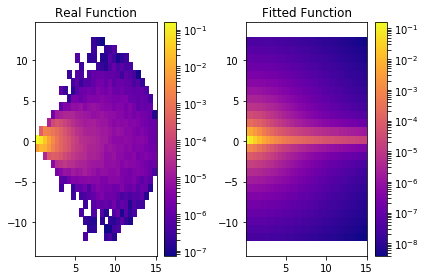

MND: a[kpc], b[kpc], vcirc [km/s]: 0.616415374697 0.214715292263 84.3880880852


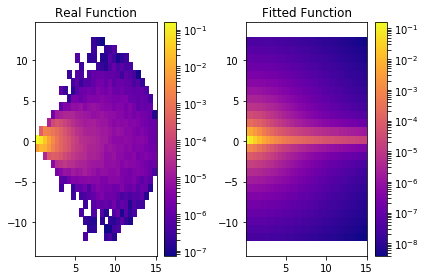

Start HB fit at 12:23:28.820061


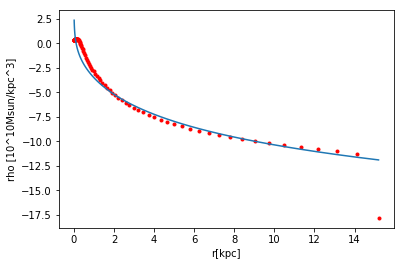

HB: a[kpc], vcirc [km/s]: 1.52808687664 109.961882443


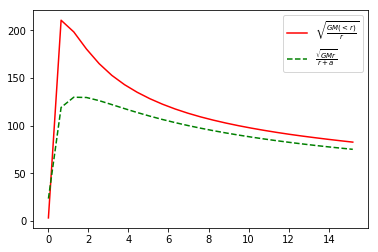

84.3880880852 109.961882443
v0_circ_tot = 218.717354102


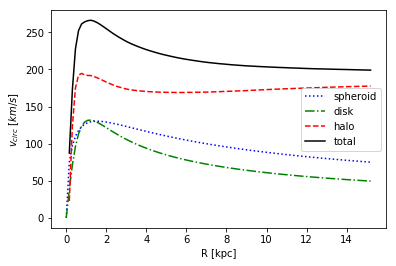

(0.61641537469715724, 0.21471529226258401, 1.5280868766399458, 84.388088085235864, 109.9618824428556, array([ 11.75236225,   6.19360781,   1.66179669, ...,   4.18740797,
        12.65796471,  12.25802326], dtype=float32), array([-1.90767479,  0.62274069, -1.95328057, ..., -2.22307396,
        7.8694725 , -3.33291626], dtype=float32), array([ -97326.484375 , -110455.6328125, -136223.734375 , ...,
       -118242.9375   ,  -93578.03125  ,  -94326.234375 ]), 5.0646985570589695)


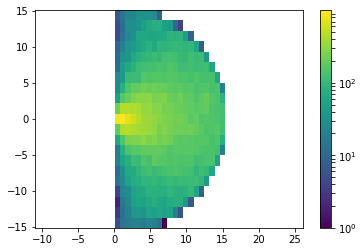

10 (10,)
[  77.            5.06469856  182.26640569    0.61641537    0.21471529
    1.52808688   13.66026521   84.38808809  109.96188244  118.355725  ]
Snapshot =  77
v0_tot_kms at R0_kpc = 5.06469855706 : 182.266405686
Stellar Disk - a_MND_kpc = 0.616415374697 b_MND_kpc = 0.214715292263 v0_MND_kms = 84.3880880852
Stellar Spheroid - a_HB_kp c= 1.52808687664 v0_HB_kms = 109.961882443
DM Halo - a_NFWH_kpc = 13.6602652125 v0_NFWH_kms = 118.355725001
snapnr  : 78
12:25:31.141048
[ 17.20534706  16.5902729   17.85304451]
Found 863745 stars.
Rotated pos.
Rotated vel.

galrad  : 0.015550206601619721
redshift: 0.987852810815766
time    : 0.5030553542792862
center  : [ 0.  0.  0.]

computing star properties
computing histograms


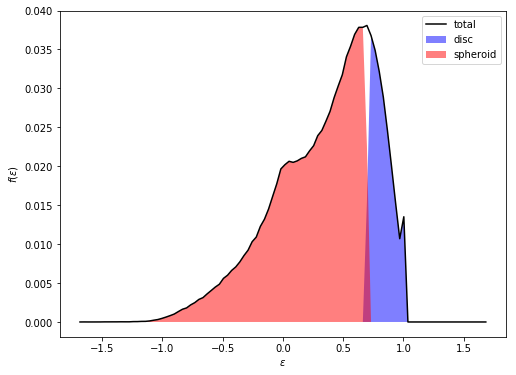

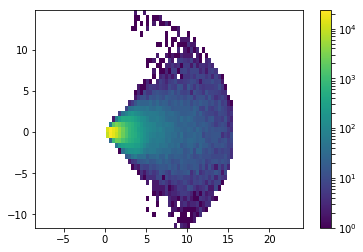

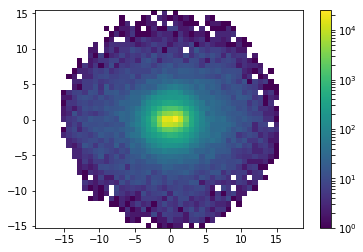

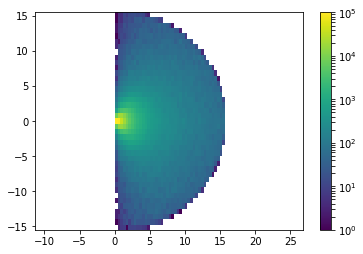

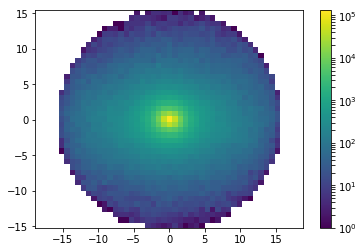

Start MND fit at 12:27:07.300103


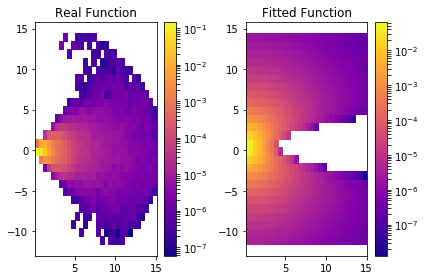

MND: a[kpc], b[kpc], vcirc [km/s]: -0.656056964723 1.99008036927 77.6820965773


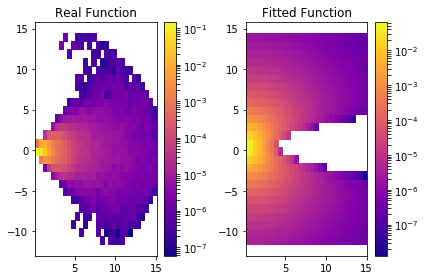

Start HB fit at 12:27:10.578714


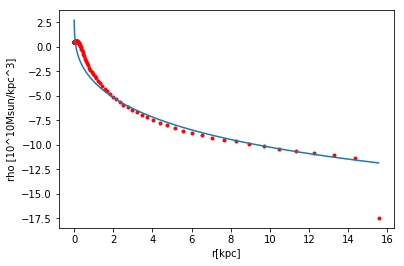

HB: a[kpc], vcirc [km/s]: 1.67079520292 112.08021592


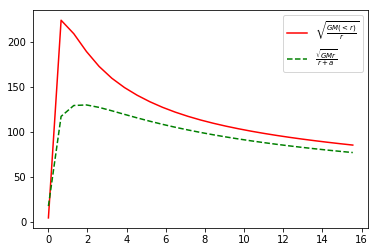

77.6820965773 112.08021592
v0_circ_tot = 219.872314781


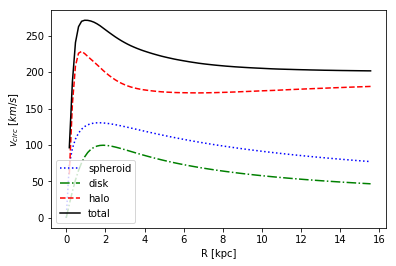

(-0.65605696472334218, 1.9900803692698519, 1.6707952029160711, 77.682096577337859, 112.08021592026061, array([  5.56669474,  10.37872696,   7.65789747, ...,   6.97338486,
         4.64624786,   0.96654809], dtype=float32), array([ -2.69549918,   4.33304691,  -5.69191456, ...,   5.91604328,
        10.35423565,  -0.76300824], dtype=float32), array([-113844.1015625, -102045.78125  , -103982.7578125, ...,
       -106141.515625 , -102151.1640625, -167281.90625  ]), 5.1834022005399065)


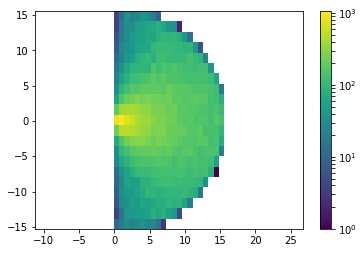

10 (10,)
[  78.            5.1834022   280.48724621   -0.65605696    1.99008037
    1.6707952   274.33488261   77.68209658  112.08021592  245.10530871]
Snapshot =  78
v0_tot_kms at R0_kpc = 5.18340220054 : 280.487246213
Stellar Disk - a_MND_kpc = -0.656056964723 b_MND_kpc = 1.99008036927 v0_MND_kms = 77.6820965773
Stellar Spheroid - a_HB_kp c= 1.67079520292 v0_HB_kms = 112.08021592
DM Halo - a_NFWH_kpc = 274.33488261 v0_NFWH_kms = 245.105308712
snapnr  : 79
12:29:11.357911
[ 17.53638649  16.91461563  18.2147541 ]
Found 881996 stars.
Rotated pos.
Rotated vel.

galrad  : 0.01577354818582535
redshift: 0.9505313515850327
time    : 0.5126808134549512
center  : [ 0.  0.  0.]

computing star properties
computing histograms


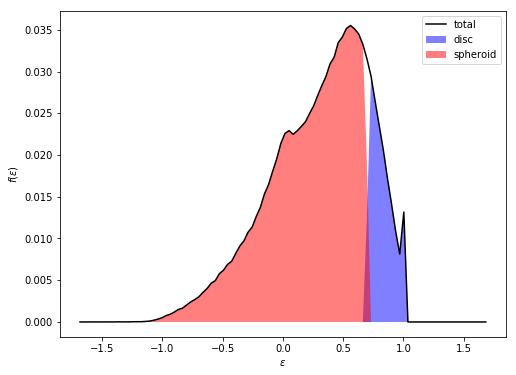

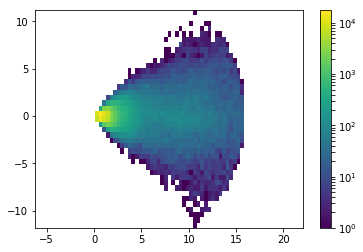

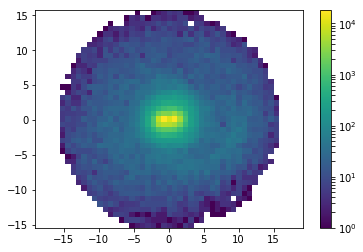

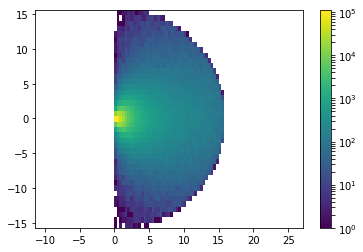

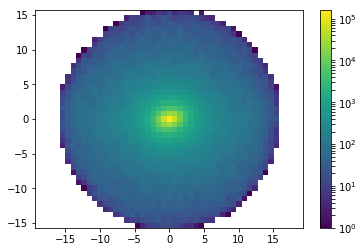

Start MND fit at 12:30:21.953314


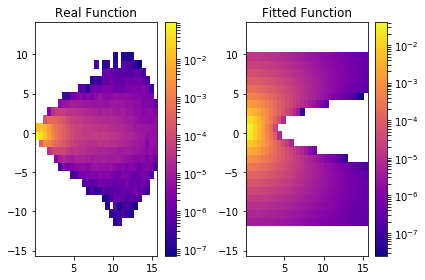

MND: a[kpc], b[kpc], vcirc [km/s]: -0.934608737062 2.38630687872 67.6039562177


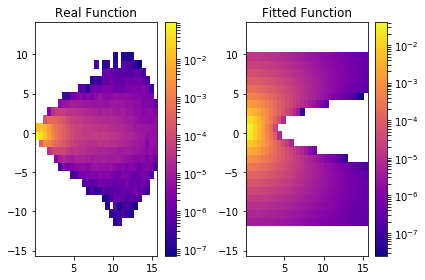

Start HB fit at 12:30:24.728936


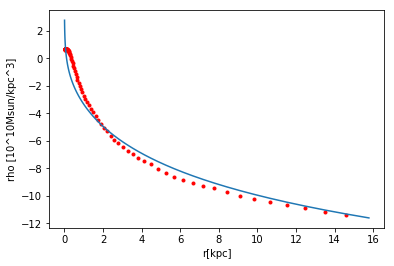

HB: a[kpc], vcirc [km/s]: 1.78717481048 115.29255929


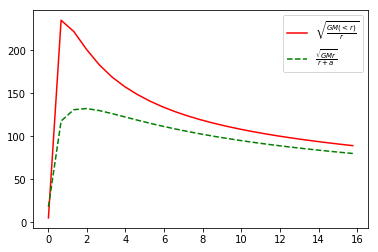

67.6039562177 115.29255929
v0_circ_tot = 219.063382087


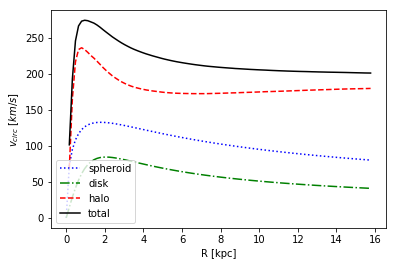

(-0.93460873706183911, 2.3863068787201072, 1.7871748104821055, 67.603956217660084, 115.29255928972663, array([  6.91480446,   5.01268148,   8.70942879, ...,  11.19254971,
        12.8878727 ,   2.23779464], dtype=float32), array([-5.88342094,  6.75237846, -2.8785615 , ...,  8.06333733,
       -2.90300894, -0.39397681], dtype=float32), array([-106814.2734375, -108366.6640625, -108560.7109375, ...,
        -96876.0546875,  -99966.3984375, -148616.828125 ]), 5.257849395275116)


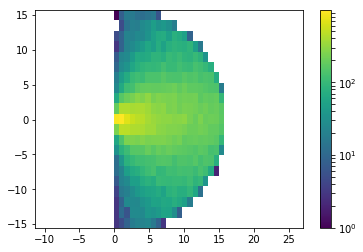

10 (10,)
[  79.            5.2578494   189.46841696   -0.93460874    2.38630688
    1.78717481   70.97929116   67.60395622  115.29255929  134.29673079]
Snapshot =  79
v0_tot_kms at R0_kpc = 5.25784939528 : 189.468416958
Stellar Disk - a_MND_kpc = -0.934608737062 b_MND_kpc = 2.38630687872 v0_MND_kms = 67.6039562177
Stellar Spheroid - a_HB_kp c= 1.78717481048 v0_HB_kms = 115.29255929
DM Halo - a_NFWH_kpc = 70.9792911577 v0_NFWH_kms = 134.29673079
snapnr  : 80
12:32:28.094601
[ 17.78905106  17.16118431  18.49117279]
Found 899956 stars.
Rotated pos.
Rotated vel.

galrad  : 0.015913909673690798
redshift: 0.9230008161779089
time    : 0.5200205801199638
center  : [ 0.  0.  0.]

computing star properties
computing histograms


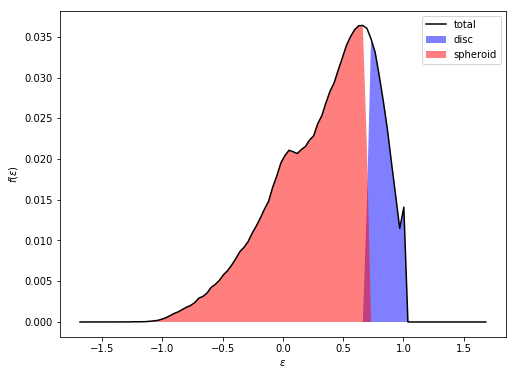

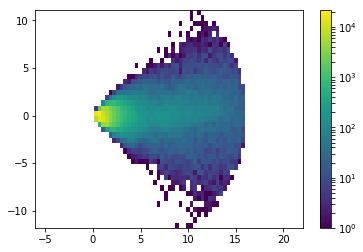

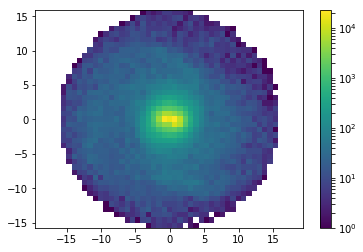

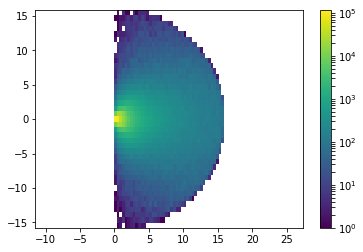

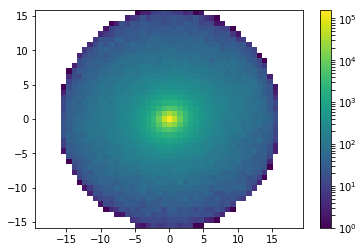

Start MND fit at 12:33:45.712698


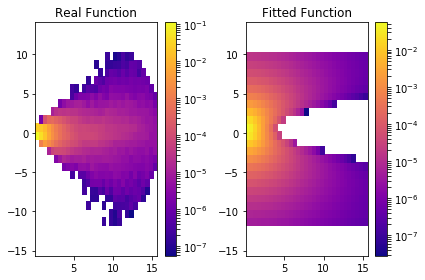

MND: a[kpc], b[kpc], vcirc [km/s]: -0.812778931529 2.24846823759 76.7857247349


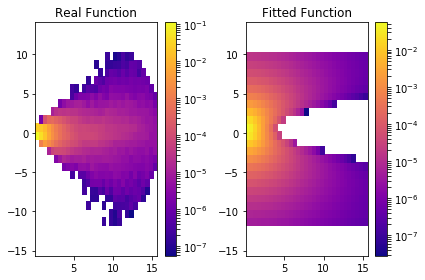

Start HB fit at 12:33:48.912221


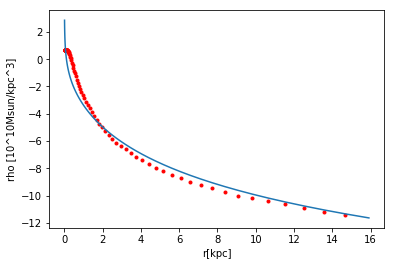

HB: a[kpc], vcirc [km/s]: 1.84100222044 111.84234138


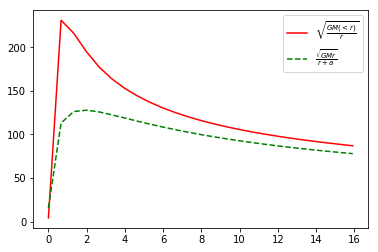

76.7857247349 111.84234138
v0_circ_tot = 218.420165601


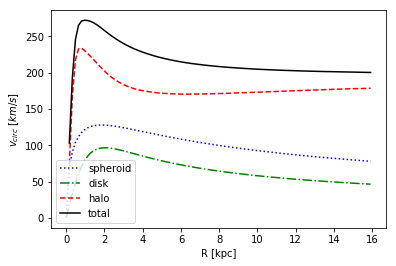

(-0.81277893152864111, 2.248468237594142, 1.8410022204392562, 76.785724734862754, 111.84234138022238, array([  7.25248528,   7.64784718,  11.82951546, ...,   8.33673859,
         4.31208324,   6.37078762], dtype=float32), array([  3.7105124 ,  -1.59574234,  -8.43244076, ...,   5.41794682,
         1.64421296,  12.38625908], dtype=float32), array([-112408.734375 , -113418.1640625,  -97849.8984375, ...,
       -106196.7109375, -127043.6875   ,  -96788.453125 ]), 5.3046365578969326)


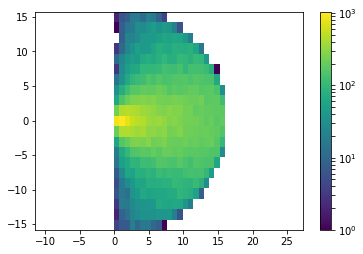

10 (10,)
[  80.            5.30463656  286.84029121   -0.81277893    2.24846824
    1.84100222   45.04557185   76.78572473  111.84234138  252.73028274]
Snapshot =  80
v0_tot_kms at R0_kpc = 5.3046365579 : 286.840291208
Stellar Disk - a_MND_kpc = -0.812778931529 b_MND_kpc = 2.24846823759 v0_MND_kms = 76.7857247349
Stellar Spheroid - a_HB_kp c= 1.84100222044 v0_HB_kms = 111.84234138
DM Halo - a_NFWH_kpc = 45.0455718466 v0_NFWH_kms = 252.730282736
snapnr  : 81
12:36:09.302245
[ 18.13132668  17.49447441  18.86812019]
Found 925630 stars.
Rotated pos.
Rotated vel.

galrad  : 0.016126376390457154
redshift: 0.8868969375752482
time    : 0.5299706518603222
center  : [ 0.  0.  0.]

computing star properties
computing histograms


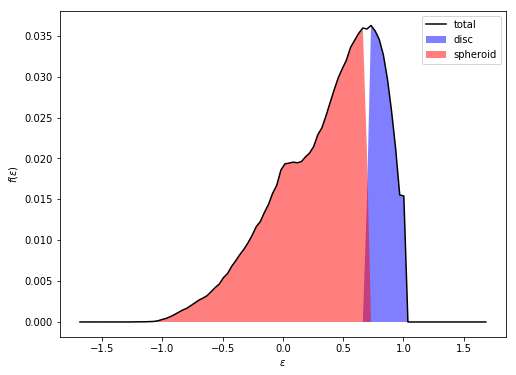

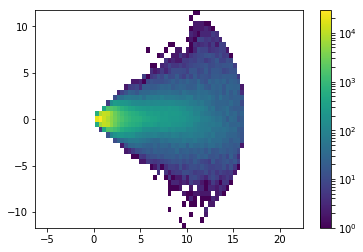

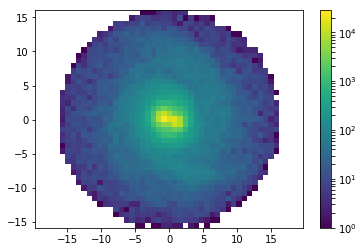

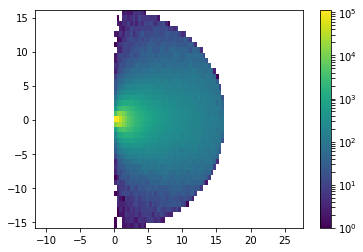

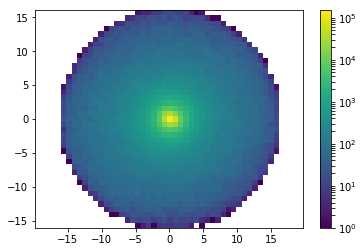

Start MND fit at 12:37:26.384697


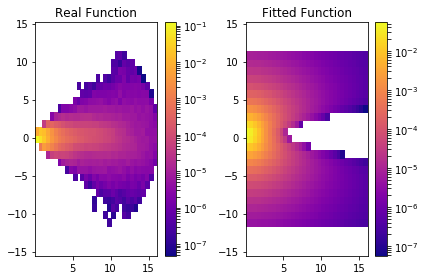

MND: a[kpc], b[kpc], vcirc [km/s]: -0.482801898964 2.02706599774 82.9933415223


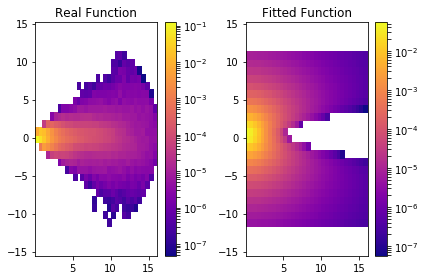

Start HB fit at 12:37:29.844879


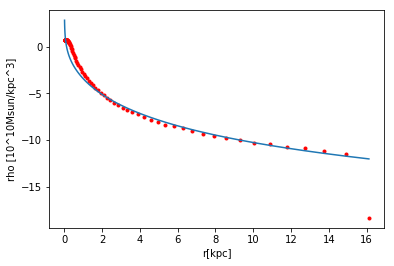

HB: a[kpc], vcirc [km/s]: 1.55554605121 114.729395946


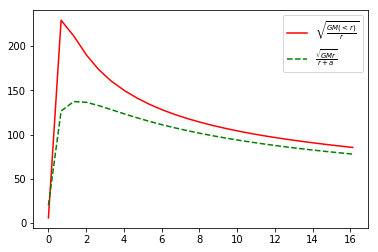

82.9933415223 114.729395946
v0_circ_tot = 218.485465092


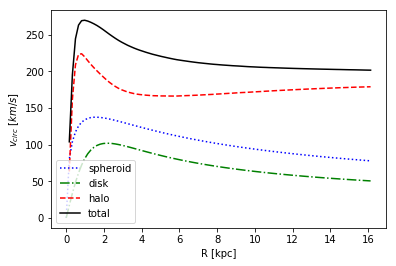

(-0.48280189896405373, 2.0270659977443151, 1.5555460512146271, 82.993341522272317, 114.72939594625863, array([ 12.97769165,   2.40125918,   0.92860961, ...,  11.88185978,
        13.09964943,  10.6067028 ], dtype=float32), array([-2.81856823,  2.79597759, -0.1866616 , ...,  4.02959681,
        7.62898588,  1.18767917], dtype=float32), array([-102594.59375  , -136546.578125 , -183759.203125 , ...,
       -103754.5078125,  -99049.25     , -108879.734375 ]), 5.3754587968190508)


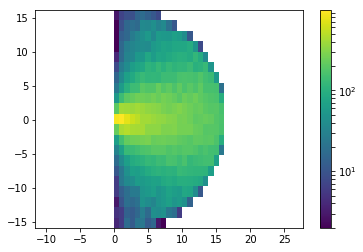

10 (10,)
[  81.            5.3754588   222.24439937   -0.4828019     2.027066
    1.55554605  144.86231287   82.99334152  114.72939595  171.29461176]
Snapshot =  81
v0_tot_kms at R0_kpc = 5.37545879682 : 222.244399366
Stellar Disk - a_MND_kpc = -0.482801898964 b_MND_kpc = 2.02706599774 v0_MND_kms = 82.9933415223
Stellar Spheroid - a_HB_kp c= 1.55554605121 v0_HB_kms = 114.729395946
DM Halo - a_NFWH_kpc = 144.862312865 v0_NFWH_kms = 171.294611761
snapnr  : 82
12:39:32.203292
[ 18.48038101  17.83345413  19.25479507]
Found 968627 stars.
Rotated pos.
Rotated vel.

galrad  : 0.016369375586509704
redshift: 0.8514709006246495
time    : 0.5401111082343341
center  : [ 0.  0.  0.]

computing star properties
computing histograms


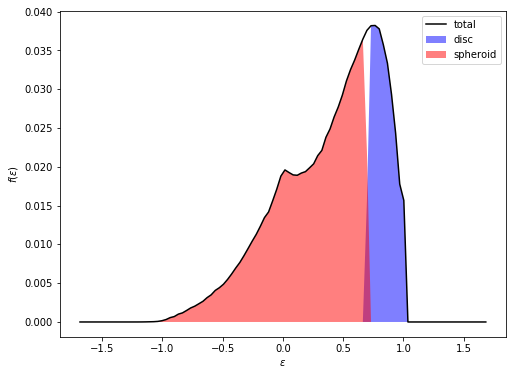

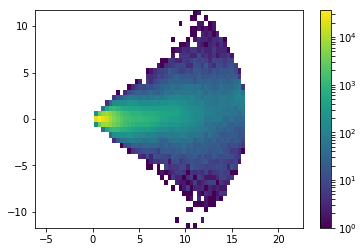

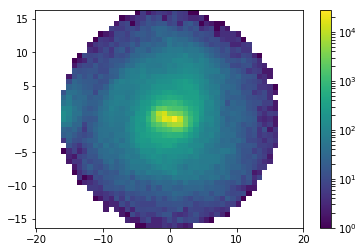

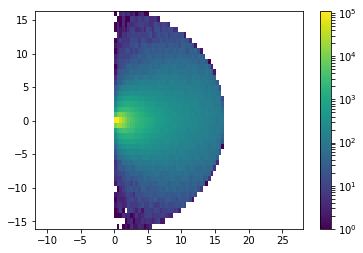

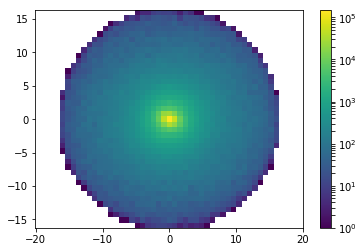

Start MND fit at 12:40:51.451924


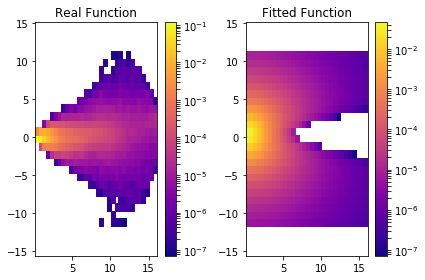

MND: a[kpc], b[kpc], vcirc [km/s]: -0.434616084021 2.15589984179 86.9187746995


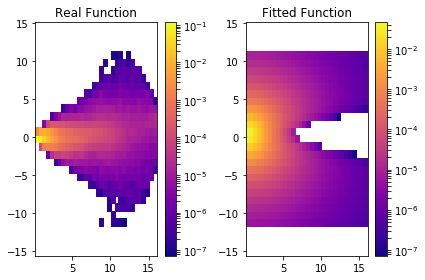

Start HB fit at 12:40:55.171160


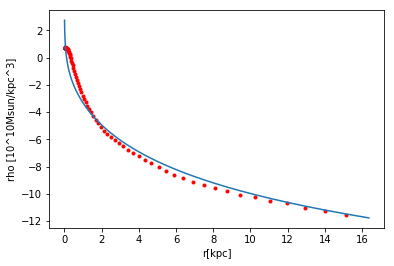

HB: a[kpc], vcirc [km/s]: 1.74317283921 111.755922784


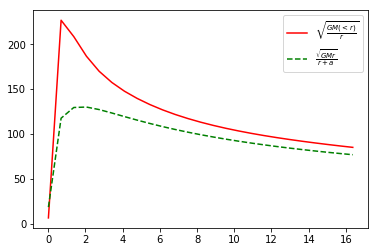

86.9187746995 111.755922784
v0_circ_tot = 220.243668505


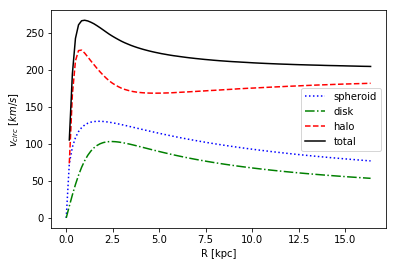

(-0.4346160840205946, 2.155899841794791, 1.7431728392103887, 86.918774699530445, 111.75592278352582, array([ 10.23587036,  10.00882626,   9.0658617 , ...,   7.50618696,
         2.31797886,  10.84566498], dtype=float32), array([  7.66136694,  12.19984627,  -7.06518841, ...,  -2.06747484,
        -6.70796347,   8.67521477], dtype=float32), array([-107483.0390625, -100036.609375 , -109206.3203125, ...,
       -122444.8203125, -120670.84375  , -104171.3515625]), 5.4564585288365679)


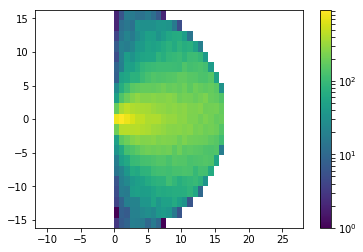

10 (10,)
[  82.            5.45645853  369.49143704   -0.43461608    2.15589984
    1.74317284  329.50920204   86.9187747   111.75592278  341.29116949]
Snapshot =  82
v0_tot_kms at R0_kpc = 5.45645852884 : 369.491437035
Stellar Disk - a_MND_kpc = -0.434616084021 b_MND_kpc = 2.15589984179 v0_MND_kms = 86.9187746995
Stellar Spheroid - a_HB_kp c= 1.74317283921 v0_HB_kms = 111.755922784
DM Halo - a_NFWH_kpc = 329.509202038 v0_NFWH_kms = 341.291169487
snapnr  : 83
12:42:54.316737
[ 18.83633041  18.17889214  19.65101624]
Found 1008197 stars.
Rotated pos.
Rotated vel.

galrad  : 0.016624638438224794
redshift: 0.8167099790118506
time    : 0.5504455920608321
center  : [ 0.  0.  0.]

computing star properties
computing histograms


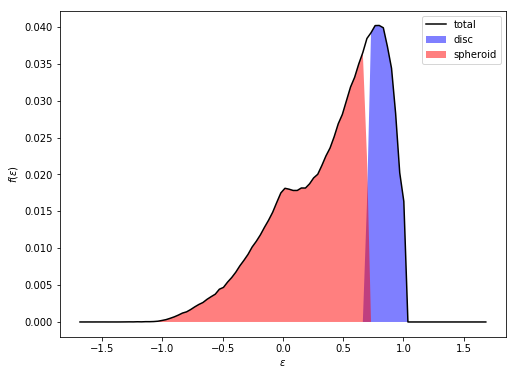

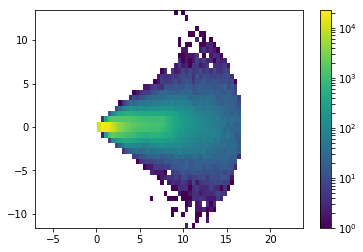

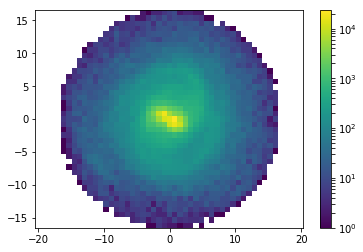

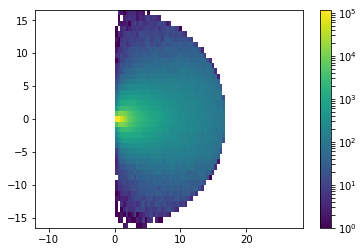

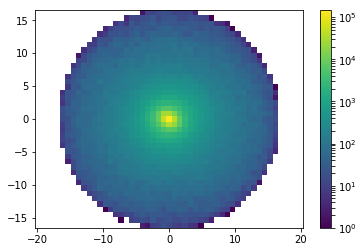

Start MND fit at 12:44:11.374154


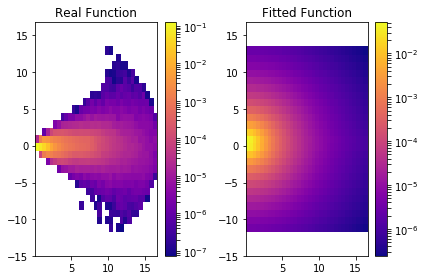

MND: a[kpc], b[kpc], vcirc [km/s]: 0.0184005148368 1.69948532436 91.7501057132


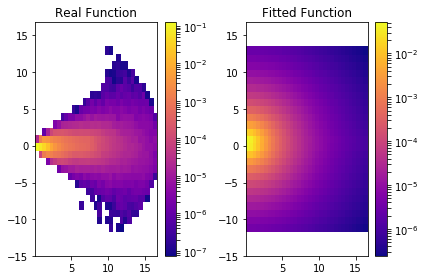

Start HB fit at 12:44:15.274403


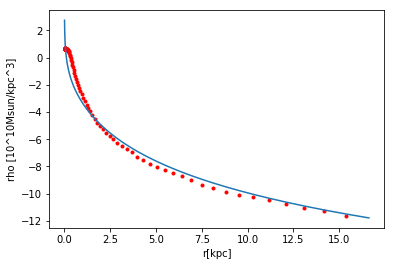

HB: a[kpc], vcirc [km/s]: 1.83924117805 109.575854402


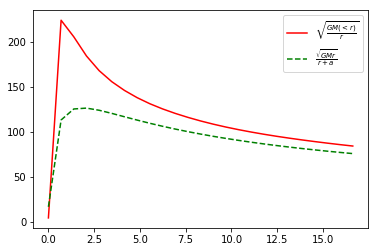

91.7501057132 109.575854402
v0_circ_tot = 221.929573692


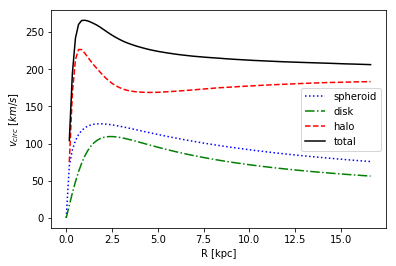

(0.018400514836828339, 1.6994853243550554, 1.8392411780536859, 91.750105713151967, 109.57585440174849, array([ 12.53415775,   2.64430594,   5.78602409, ...,   6.31548691,
         5.46003294,   0.83887768], dtype=float32), array([-3.20602536, -5.61720848,  0.98889041, ...,  1.91735649,
        3.12363362, -1.28284478], dtype=float32), array([-110484.7265625, -127445.234375 , -135170.703125 , ...,
       -128987.1015625, -129960.2421875, -172297.703125 ]), 5.5415461460749311)


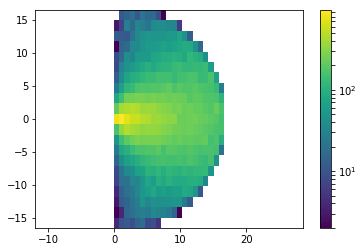

10 (10,)
[  8.30000000e+01   5.54154615e+00   1.84942575e+02   1.84005148e-02
   1.69948532e+00   1.83924118e+00   1.77688236e+01   9.17501057e+01
   1.09575854e+02   1.17383159e+02]
Snapshot =  83
v0_tot_kms at R0_kpc = 5.54154614607 : 184.94257454
Stellar Disk - a_MND_kpc = 0.0184005148368 b_MND_kpc = 1.69948532436 v0_MND_kms = 91.7501057132
Stellar Spheroid - a_HB_kp c= 1.83924117805 v0_HB_kms = 109.575854402
DM Halo - a_NFWH_kpc = 17.7688236012 v0_NFWH_kms = 117.383159401
snapnr  : 84
12:46:47.378087
[ 19.10744095  18.44243622  19.95356178]
Found 1021584 stars.
Rotated pos.
Rotated vel.

galrad  : 0.01679195463657379
redshift: 0.7910682489463392
time    : 0.5583260161014446
center  : [ 0.  0.  0.]

computing star properties
computing histograms


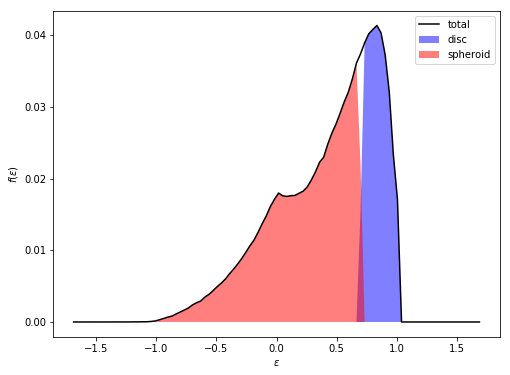

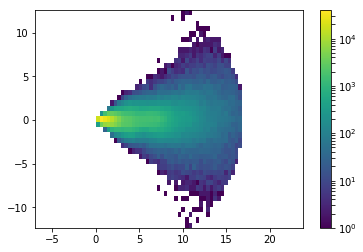

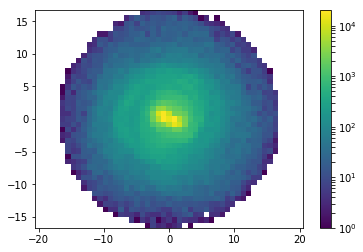

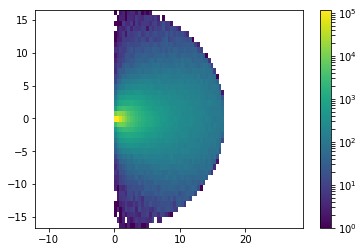

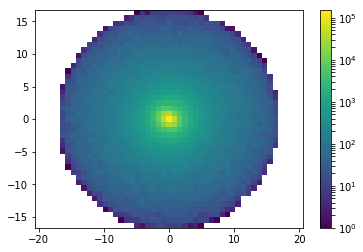

Start MND fit at 12:48:14.141478


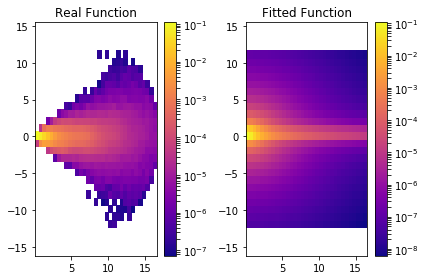

MND: a[kpc], b[kpc], vcirc [km/s]: 0.683844176935 0.252236825233 98.8926412653


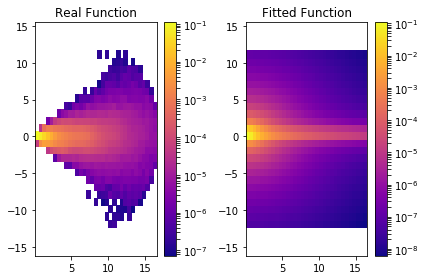

Start HB fit at 12:48:18.333921


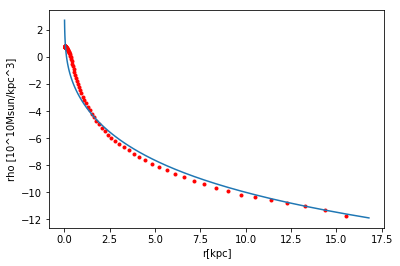

HB: a[kpc], vcirc [km/s]: 1.70046343076 111.1141102


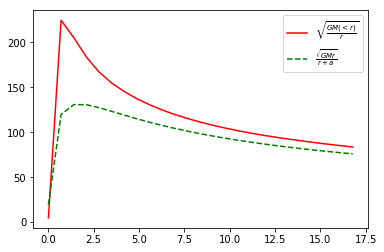

98.8926412653 111.1141102
v0_circ_tot = 219.94522913


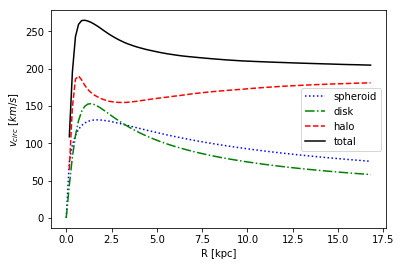

(0.68384417693464161, 0.25223682523330798, 1.700463430761836, 98.892641265333495, 111.11411020030509, array([ 11.59851837,   1.45306277,   0.98490876, ...,   0.26927835,
         9.02226639,   9.81934929], dtype=float32), array([-11.72225761,   0.69509786,  -0.24839503, ...,   1.19300258,
         8.22149467,   0.73137742], dtype=float32), array([-103224.828125, -175054.203125, -193682.703125, ..., -180791.46875 ,
       -110904.      , -119661.4375  ]), 5.5973182121912632)


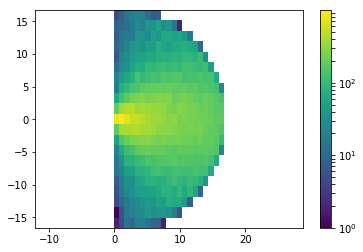

10 (10,)
[  84.            5.59731821  183.29990706    0.68384418    0.25223683
    1.70046343   22.2540548    98.89264127  111.1141102   107.11095157]
Snapshot =  84
v0_tot_kms at R0_kpc = 5.59731821219 : 183.299907061
Stellar Disk - a_MND_kpc = 0.683844176935 b_MND_kpc = 0.252236825233 v0_MND_kms = 98.8926412653
Stellar Spheroid - a_HB_kp c= 1.70046343076 v0_HB_kms = 111.1141102
DM Halo - a_NFWH_kpc = 22.2540548024 v0_NFWH_kms = 107.110951572
snapnr  : 85
12:50:52.737352
[ 19.47507477  18.79951668  20.36402512]
Found 1059935 stars.
Rotated pos.
Rotated vel.

galrad  : 0.01698329746723175
redshift: 0.7574413726158526
time    : 0.5690090239036288
center  : [ 0.  0.  0.]

computing star properties
computing histograms


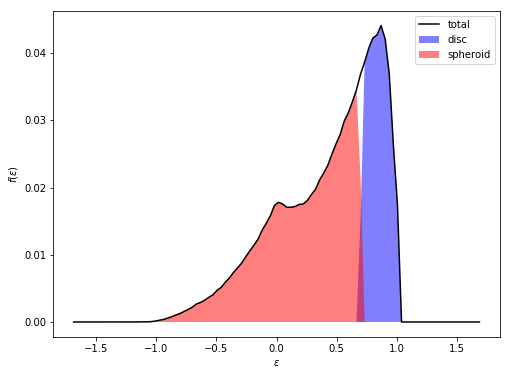

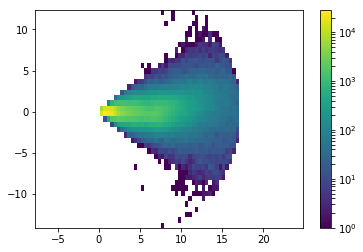

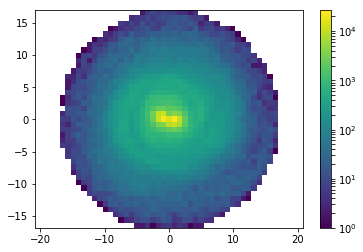

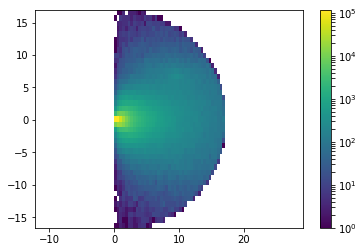

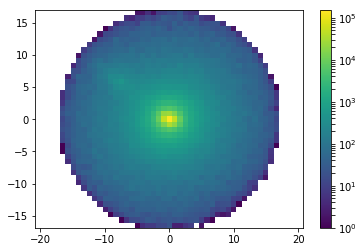

Start MND fit at 12:52:09.053837


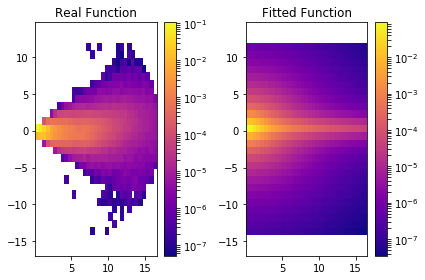

MND: a[kpc], b[kpc], vcirc [km/s]: 1.10043583491 0.665705384755 98.1079158783


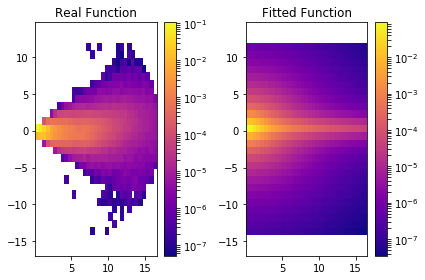

Start HB fit at 12:52:13.471620


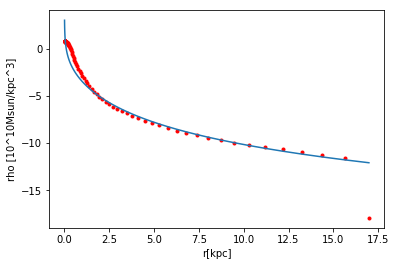

HB: a[kpc], vcirc [km/s]: 1.75762165601 110.148169302


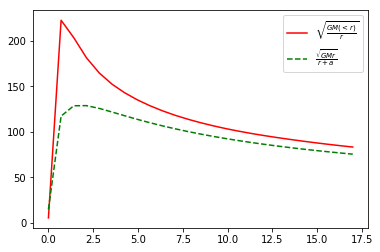

98.1079158783 110.148169302
v0_circ_tot = 219.118315883


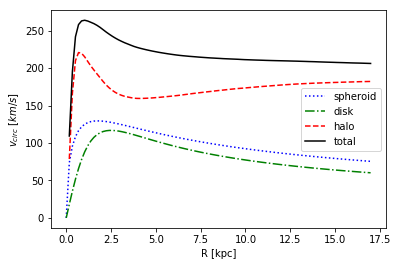

(1.1004358349126682, 0.66570538475533059, 1.7576216560069442, 98.107915878345793, 110.14816930242301, array([  7.44459248,   3.09188628,  11.80933189, ...,   9.21157837,
         5.35139751,   7.96629143], dtype=float32), array([ -9.88243389,   2.67091775,   1.9023062 , ..., -12.6359663 ,
         1.95182073,  -3.53988123], dtype=float32), array([-112441.9921875, -145501.921875 , -116695.265625 , ...,
       -106171.109375 , -137177.5625   , -123921.296875 ]), 5.6610991557439165)


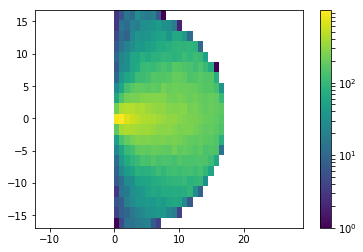

10 (10,)
[  85.            5.66109916  182.60183247    1.10043583    0.66570538
    1.75762166   22.83184137   98.10791588  110.1481693   107.63664276]
Snapshot =  85
v0_tot_kms at R0_kpc = 5.66109915574 : 182.601832472
Stellar Disk - a_MND_kpc = 1.10043583491 b_MND_kpc = 0.665705384755 v0_MND_kms = 98.1079158783
Stellar Spheroid - a_HB_kp c= 1.75762165601 v0_HB_kms = 110.148169302
DM Halo - a_NFWH_kpc = 22.8318413749 v0_NFWH_kms = 107.636642755
snapnr  : 86
12:54:08.313337
[ 19.75509262  19.0717144   20.67724609]
Found 1081667 stars.
Rotated pos.
Rotated vel.

galrad  : 0.01714651584625244
redshift: 0.7326361820223115
time    : 0.5771552102951079
center  : [ 0.  0.  0.]

computing star properties
computing histograms


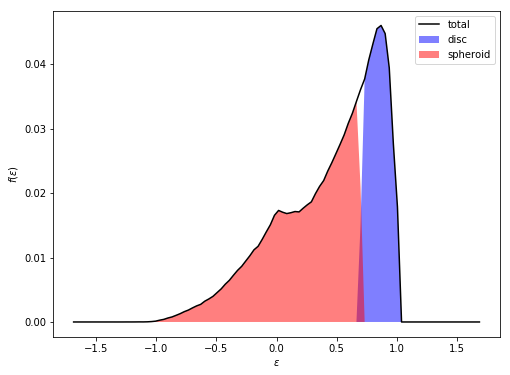

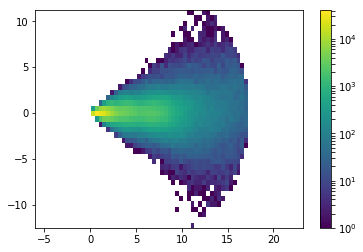

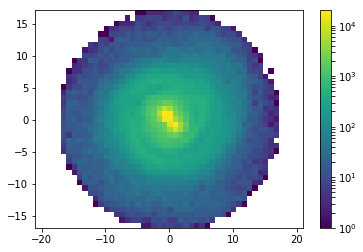

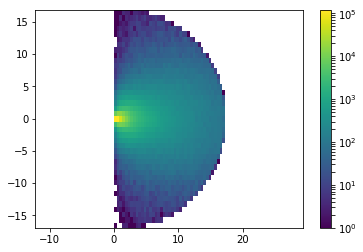

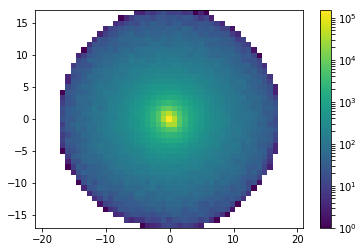

Start MND fit at 12:55:24.242863


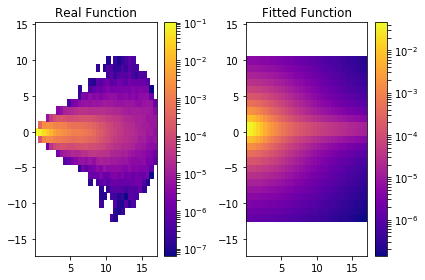

MND: a[kpc], b[kpc], vcirc [km/s]: 0.735837043901 1.1912622983 98.9339461593


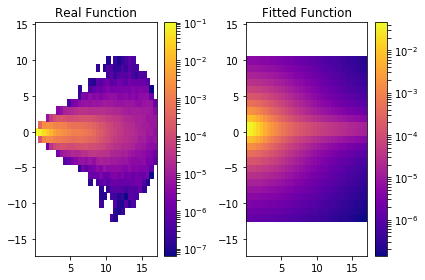

Start HB fit at 12:55:28.526140


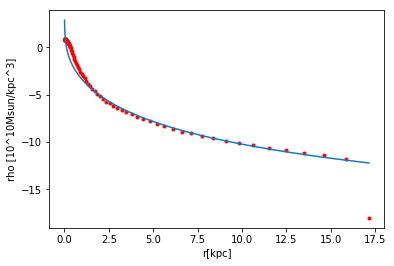

HB: a[kpc], vcirc [km/s]: 1.55855896849 112.892688692


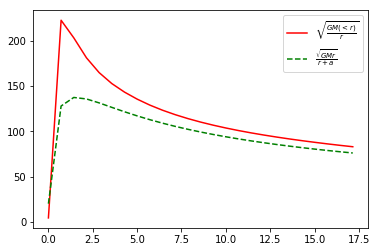

98.9339461593 112.892688692
v0_circ_tot = 221.259896101


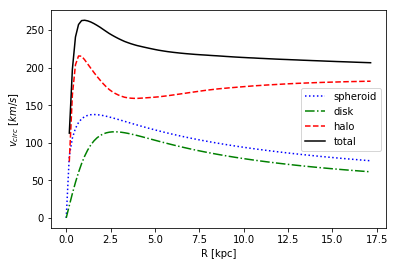

(0.73583704390101623, 1.1912622982987724, 1.5585589684858603, 98.933946159256706, 112.89268869158488, array([ 11.57236385,   2.97384691,  11.51447773, ...,   0.677809  ,
         3.65816784,  12.13979912], dtype=float32), array([ 5.12898493,  1.89305258,  8.41096878, ..., -5.50484133,
        1.57249415,  6.7136817 ], dtype=float32), array([-116457.1015625, -155097.171875 , -112045.1875   , ...,
       -137850.875    , -152240.96875  , -113300.4375   ]), 5.7155052820841465)


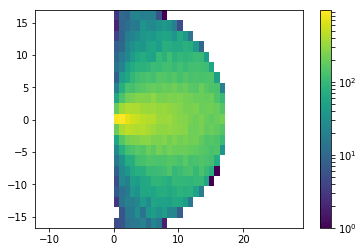

10 (10,)
[  86.            5.71550528  184.39488934    0.73583704    1.1912623
    1.55855897   23.84919979   98.93394616  112.89268869  107.09243836]
Snapshot =  86
v0_tot_kms at R0_kpc = 5.71550528208 : 184.394889344
Stellar Disk - a_MND_kpc = 0.735837043901 b_MND_kpc = 1.1912622983 v0_MND_kms = 98.9339461593
Stellar Spheroid - a_HB_kp c= 1.55855896849 v0_HB_kms = 112.892688692
DM Halo - a_NFWH_kpc = 23.849199787 v0_NFWH_kms = 107.092438358
snapnr  : 87
12:57:37.006255
[ 20.13412285  19.44070625  21.10229874]
Found 1120839 stars.
Rotated pos.
Rotated vel.

galrad  : 0.01735623925924301
redshift: 0.7001063537185233
time    : 0.5881984958251407
center  : [ 0.  0.  0.]

computing star properties
computing histograms


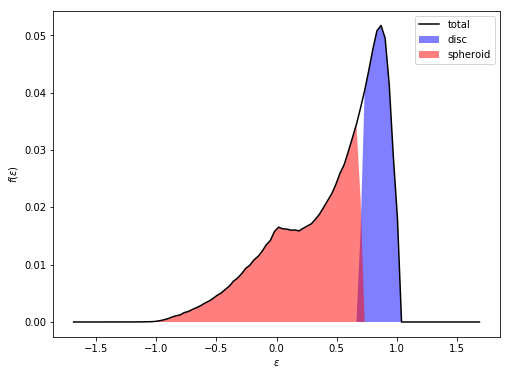

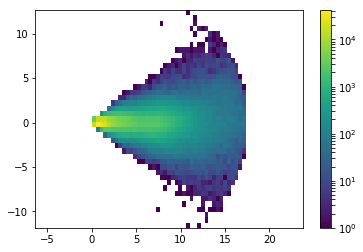

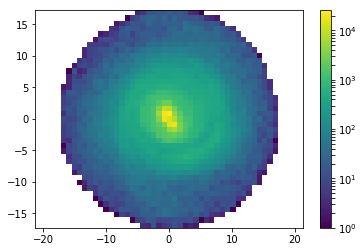

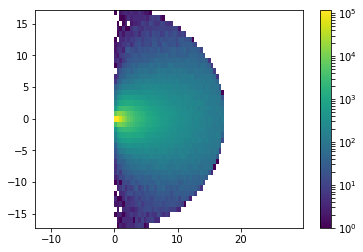

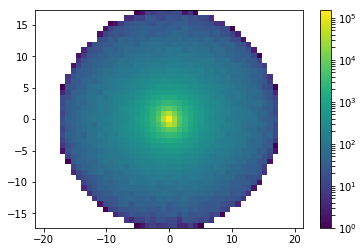

Start MND fit at 12:59:04.057303


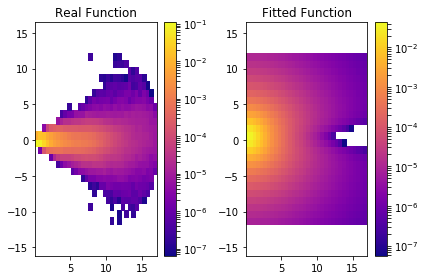

MND: a[kpc], b[kpc], vcirc [km/s]: -0.191222860343 2.28281464856 102.952773473


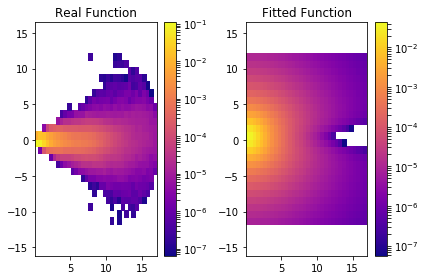

Start HB fit at 12:59:09.232298


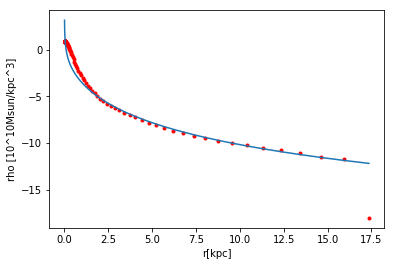

HB: a[kpc], vcirc [km/s]: 1.79147986685 108.234785594


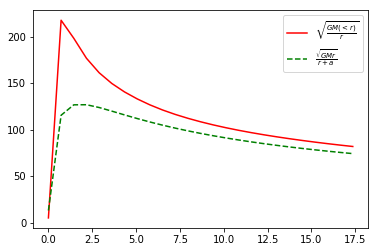

102.952773473 108.234785594
v0_circ_tot = 222.508733508


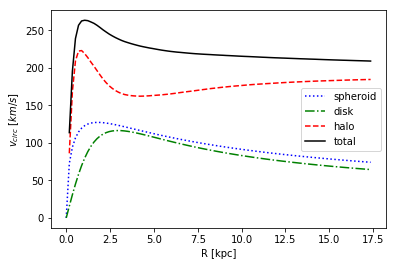

(-0.19122286034290864, 2.2828146485597078, 1.7914798668531637, 102.95277347254191, 108.23478559419975, array([  3.30322027,  10.37069321,   8.24251842, ...,   4.36446238,
         5.7557044 ,   6.95225716], dtype=float32), array([ 0.9243952 , -7.71744823,  1.02366483, ..., -9.64069366,
        0.73393768,  2.12216425], dtype=float32), array([-164738.015625 , -119194.6953125, -135537.578125 , ...,
       -123137.875    , -147883.359375 , -137335.6875   ]), 5.7854130864143372)


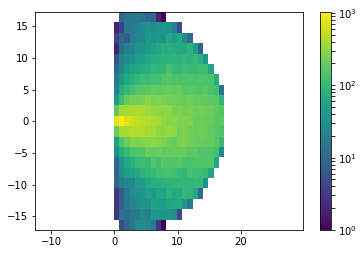

10 (10,)
[  8.70000000e+01   5.78541309e+00   2.91635510e+02  -1.91222860e-01
   2.28281465e+00   1.79147987e+00   3.43795381e+02   1.02952773e+02
   1.08234786e+02   2.50474008e+02]
Snapshot =  87
v0_tot_kms at R0_kpc = 5.78541308641 : 291.635510397
Stellar Disk - a_MND_kpc = -0.191222860343 b_MND_kpc = 2.28281464856 v0_MND_kms = 102.952773473
Stellar Spheroid - a_HB_kp c= 1.79147986685 v0_HB_kms = 108.234785594
DM Halo - a_NFWH_kpc = 343.795380573 v0_NFWH_kms = 250.474007725
snapnr  : 88
13:01:35.309953
[ 20.42412758  19.72184372  21.42675972]
Found 1154417 stars.
Rotated pos.
Rotated vel.

galrad  : 0.017521795630455018
redshift: 0.6761104112134777
time    : 0.596619407235837
center  : [ 0.  0.  0.]

computing star properties
computing histograms


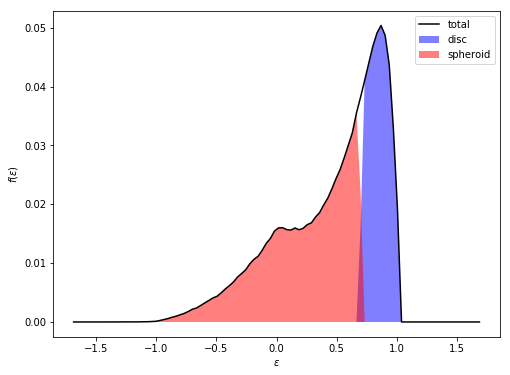

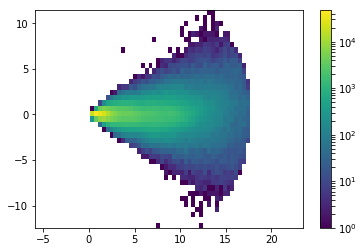

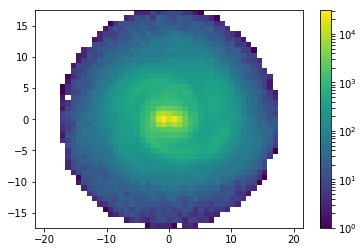

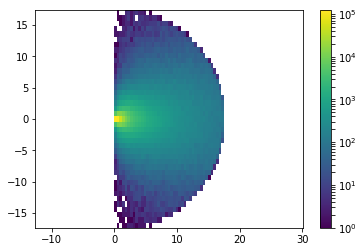

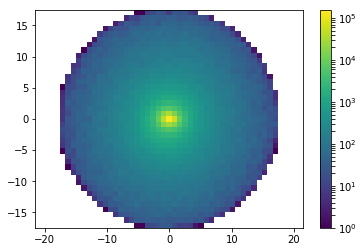

Start MND fit at 13:02:52.060159


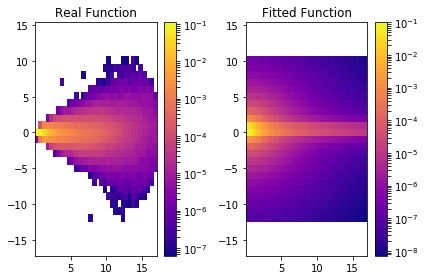

MND: a[kpc], b[kpc], vcirc [km/s]: 0.665720443276 0.247095285256 112.453471038


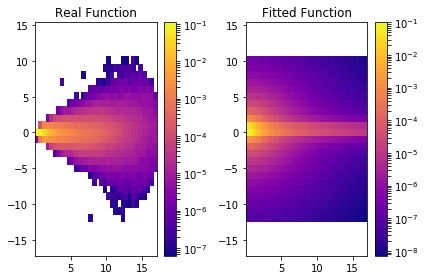

Start HB fit at 13:02:56.931875


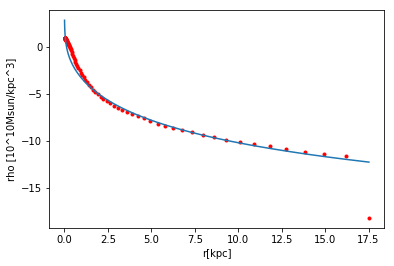

HB: a[kpc], vcirc [km/s]: 1.51601037581 113.194419943


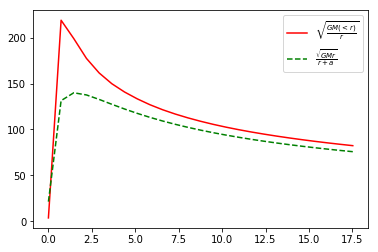

112.453471038 113.194419943
v0_circ_tot = 222.964810287


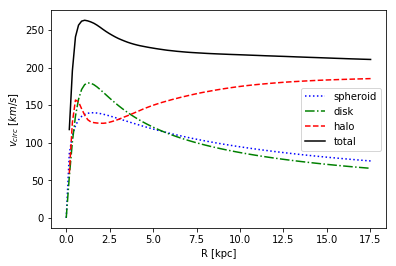

(0.66572044327571522, 0.24709528525630867, 1.5160103758072052, 112.4534710381438, 113.19441994348938, array([  7.28835344,  15.80637264,   1.08963215, ...,  13.74119568,
        10.23340416,   9.86531448], dtype=float32), array([ 3.48032427, -1.76848507, -0.69601983, ..., -2.97422886,
       -5.57260609, -4.1054759 ], dtype=float32), array([-136605.859375 , -115392.046875 , -200218.90625  , ...,
       -120367.8203125, -124226.28125  , -129573.6484375]), 5.8405985434850054)


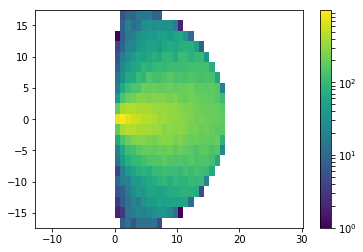

10 (10,)
[  88.            5.84059854  185.80462263    0.66572044    0.24709529
    1.51601038   33.14312485  112.45347104  113.19441994   95.20818209]
Snapshot =  88
v0_tot_kms at R0_kpc = 5.84059854349 : 185.804622633
Stellar Disk - a_MND_kpc = 0.665720443276 b_MND_kpc = 0.247095285256 v0_MND_kms = 112.453471038
Stellar Spheroid - a_HB_kp c= 1.51601037581 v0_HB_kms = 113.194419943
DM Halo - a_NFWH_kpc = 33.143124847 v0_NFWH_kms = 95.2081820912
snapnr  : 89
13:04:54.937694
[ 20.81840324  20.10211563  21.86827469]
Found 1194051 stars.
Rotated pos.
Rotated vel.

galrad  : 0.017763620615005495
redshift: 0.6446418406845371
time    : 0.6080351206337894
center  : [ 0.  0.  0.]

computing star properties
computing histograms


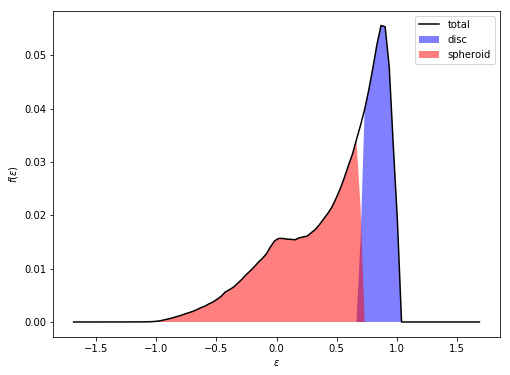

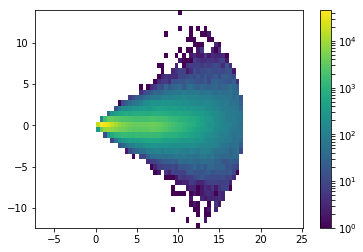

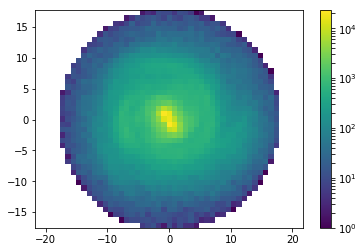

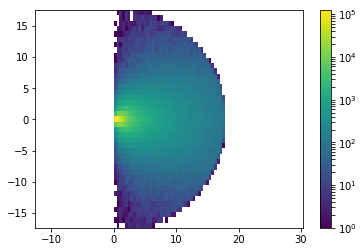

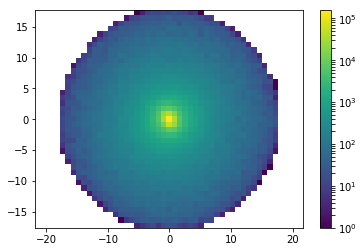

Start MND fit at 13:06:13.395218


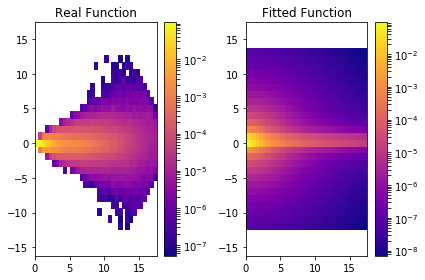

MND: a[kpc], b[kpc], vcirc [km/s]: 0.795887129582 0.248032550702 115.441871439


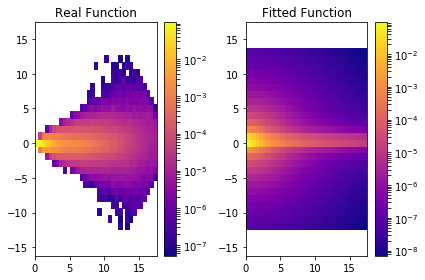

Start HB fit at 13:06:18.886002


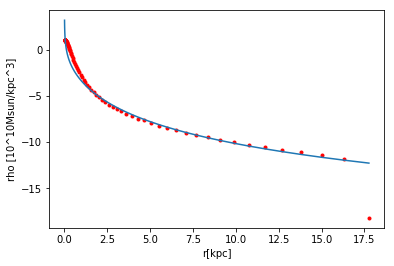

HB: a[kpc], vcirc [km/s]: 1.62968422168 111.373144224


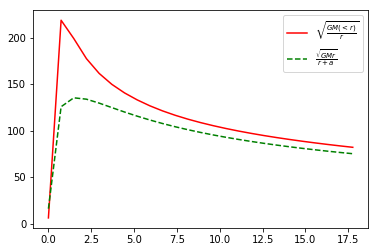

115.441871439 111.373144224
v0_circ_tot = 222.498044702


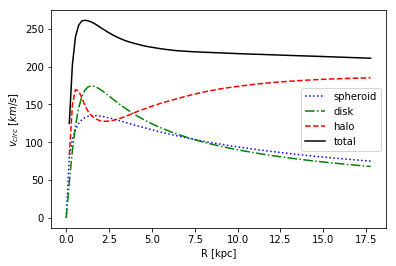

(0.79588712958225905, 0.24803255070164928, 1.6296842216841994, 115.44187143853719, 111.37314422424566, array([  1.02068424,  11.24694157,   6.1833086 , ...,   4.27844048,
        14.86961651,  13.21182251], dtype=float32), array([  0.90403944,   1.44812679,  -4.58976364, ...,  17.02232361,
        -3.10238624,   7.15414906], dtype=float32), array([-202736.1875   , -131077.1875   , -140850.21875  , ...,
       -112148.2890625, -120305.3671875, -121120.34375  ]), 5.921206871668498)


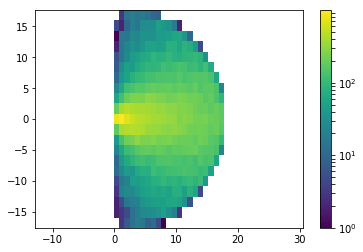

10 (10,)
[  89.            5.92120687  185.41770663    0.79588713    0.24803255
    1.62968422   36.16160633  115.44187144  111.37314422   92.99958599]
Snapshot =  89
v0_tot_kms at R0_kpc = 5.92120687167 : 185.417706627
Stellar Disk - a_MND_kpc = 0.795887129582 b_MND_kpc = 0.248032550702 v0_MND_kms = 115.441871439
Stellar Spheroid - a_HB_kp c= 1.62968422168 v0_HB_kms = 111.373144224
DM Halo - a_NFWH_kpc = 36.1616063267 v0_NFWH_kms = 92.999585994
snapnr  : 90
13:08:15.961808
[ 21.11937714  20.39230919  22.20462799]
Found 1227647 stars.
Rotated pos.
Rotated vel.

galrad  : 0.017964252829551698
redshift: 0.6214287452425136
time    : 0.616740021992414
center  : [ 0.  0.  0.]

computing star properties
computing histograms


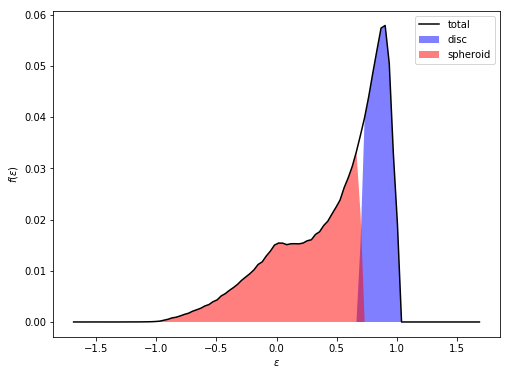

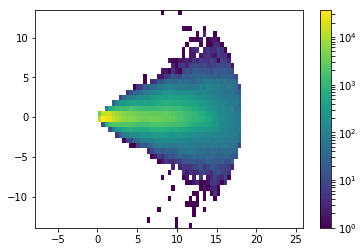

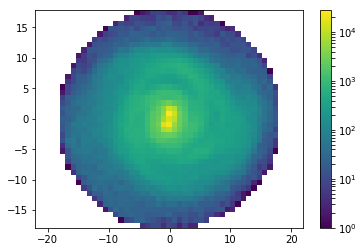

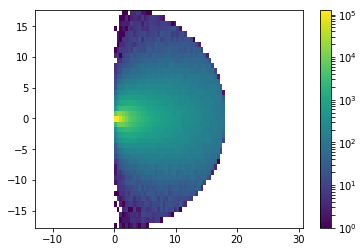

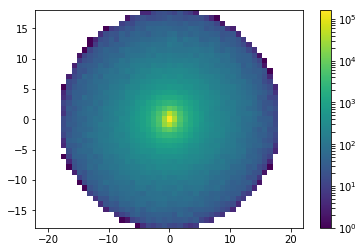

Start MND fit at 13:09:43.167602


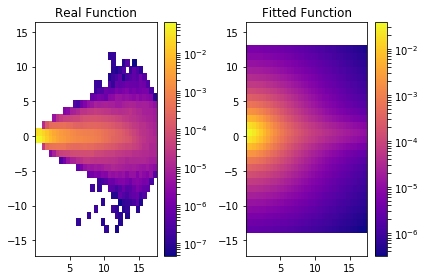

MND: a[kpc], b[kpc], vcirc [km/s]: 0.553278736713 1.8552719545 107.697577352


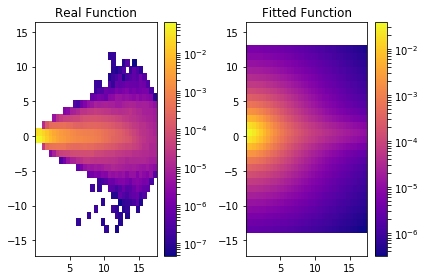

Start HB fit at 13:09:49.064481


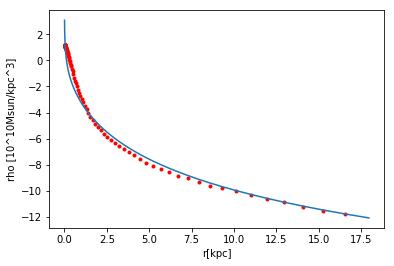

HB: a[kpc], vcirc [km/s]: 1.73987730502 109.880153347


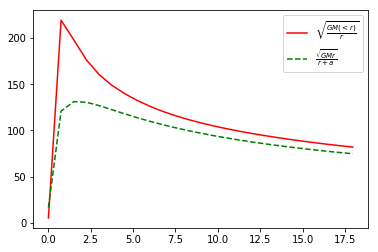

107.697577352 109.880153347
v0_circ_tot = 222.163743025


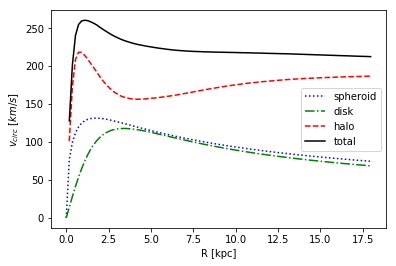

(0.55327873671275496, 1.8552719545044971, 1.7398773050170941, 107.6975773516355, 109.88015334658942, array([  6.21844196,   6.21096802,  11.1502285 , ...,   6.79746914,
        11.65567493,   4.03621197], dtype=float32), array([ 2.64200187, -9.4066658 , -7.00257397, ...,  0.70684916,
       -4.70658255, -2.2997365 ], dtype=float32), array([-150070.390625 , -129579.1953125, -126115.546875 , ...,
       -150570.21875  , -129201.734375 , -160535.265625 ]), 5.988084276517232)


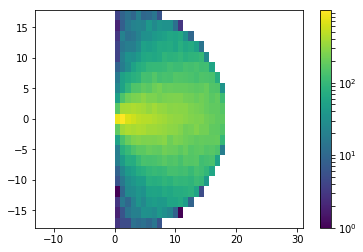

10 (10,)
[  90.            5.98808428  186.86444547    0.55327874    1.85527195
    1.73987731   28.273203    107.69757735  109.88015335  106.04671005]
Snapshot =  90
v0_tot_kms at R0_kpc = 5.98808427652 : 186.864445468
Stellar Disk - a_MND_kpc = 0.553278736713 b_MND_kpc = 1.8552719545 v0_MND_kms = 107.697577352
Stellar Spheroid - a_HB_kp c= 1.73987730502 v0_HB_kms = 109.880153347
DM Halo - a_NFWH_kpc = 28.2732029954 v0_NFWH_kms = 106.046710054
snapnr  : 91
13:11:46.280926
[ 21.42389488  20.68611908  22.54693604]
Found 1255435 stars.
Rotated pos.
Rotated vel.

galrad  : 0.01816050261259079
redshift: 0.5985432881875667
time    : 0.6255695465925124
center  : [ 0.  0.  0.]

computing star properties
computing histograms


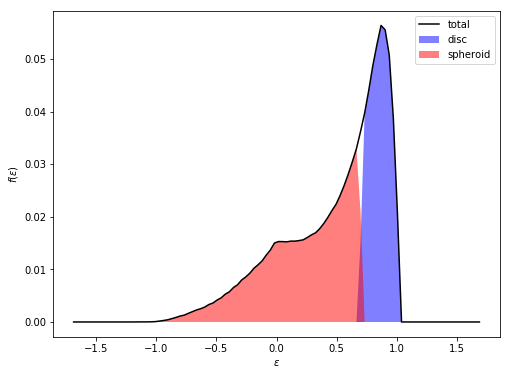

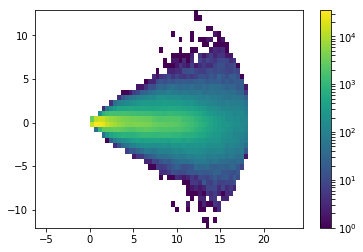

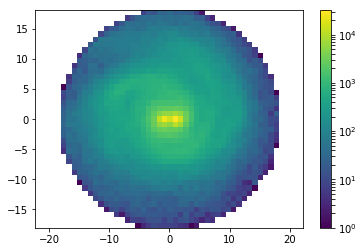

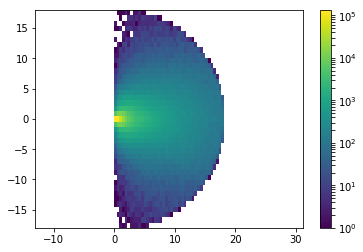

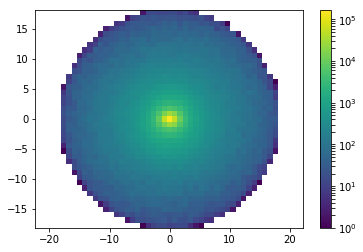

Start MND fit at 13:13:08.432998


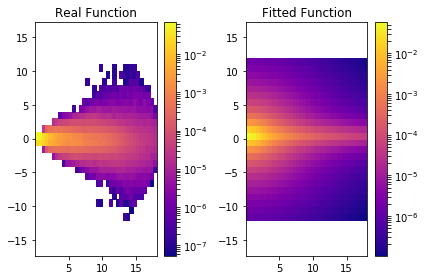

MND: a[kpc], b[kpc], vcirc [km/s]: 1.44312486588 0.906438073458 109.618591734


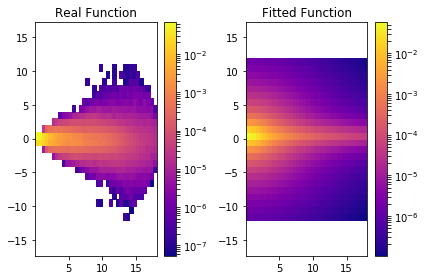

Start HB fit at 13:13:14.360892


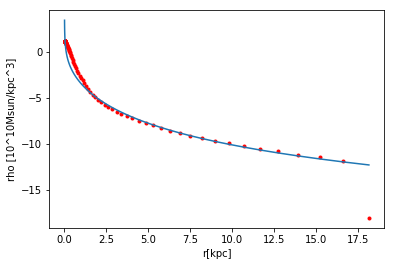

HB: a[kpc], vcirc [km/s]: 1.77493038256 109.938120156


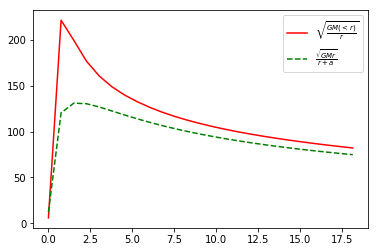

109.618591734 109.938120156
v0_circ_tot = 222.940868366


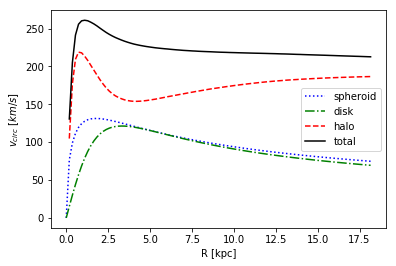

(1.4431248658827052, 0.90643807345788219, 1.7749303825614711, 109.61859173439535, 109.93812015618941, array([ 7.93499136,  2.10236692,  8.10420609, ...,  5.20848703,
        4.31489038,  3.02126884], dtype=float32), array([-14.94808483,   5.08142424,   0.83795685, ...,   0.07684634,
         1.93254209,  -1.49948525], dtype=float32), array([-117857.453125, -154729.953125, -148548.65625 , ..., -162336.421875,
       -163274.328125, -175259.046875]), 6.053500870863596)


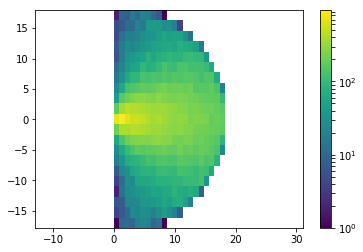

10 (10,)
[  91.            6.05350087  188.84114869    1.44312487    0.90643807
    1.77493038   28.19494779  109.61859173  109.93812016  107.50978337]
Snapshot =  91
v0_tot_kms at R0_kpc = 6.05350087086 : 188.841148688
Stellar Disk - a_MND_kpc = 1.44312486588 b_MND_kpc = 0.906438073458 v0_MND_kms = 109.618591734
Stellar Spheroid - a_HB_kp c= 1.77493038256 v0_HB_kms = 109.938120156
DM Halo - a_NFWH_kpc = 28.1949477892 v0_NFWH_kms = 107.509783372
snapnr  : 92
13:15:11.707912
[ 21.73373222  20.98360252  22.89403915]
Found 1283929 stars.
Rotated pos.
Rotated vel.

galrad  : 0.018386109173297884
redshift: 0.5759808451078874
time    : 0.6345254785958663
center  : [ 0.  0.  0.]

computing star properties
computing histograms


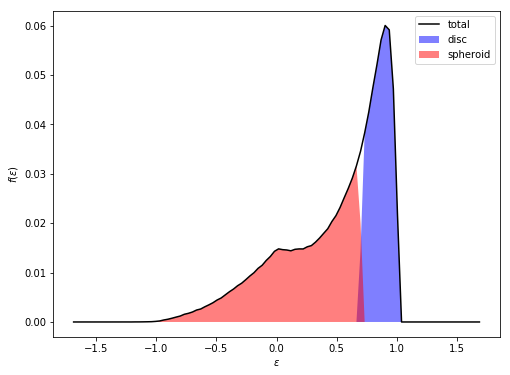

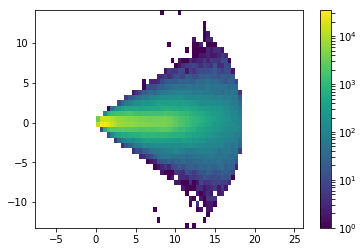

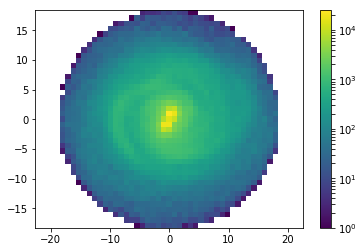

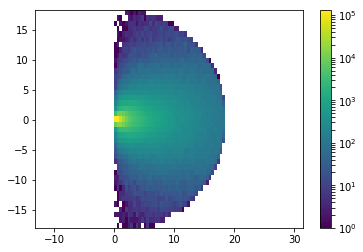

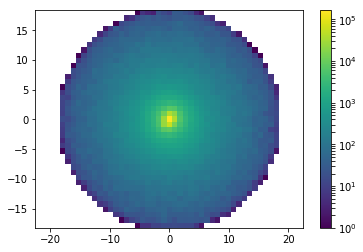

Start MND fit at 13:16:32.147086


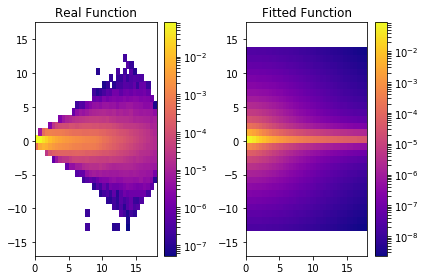

MND: a[kpc], b[kpc], vcirc [km/s]: 1.23281093874 0.144697290349 120.195919646


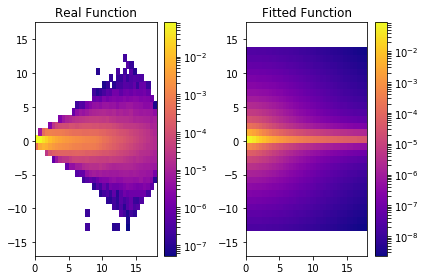

Start HB fit at 13:16:38.607895


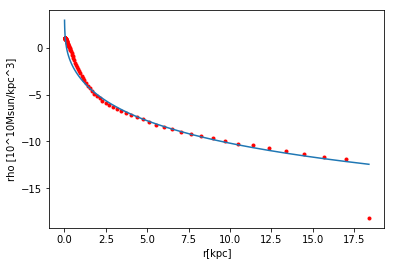

HB: a[kpc], vcirc [km/s]: 1.50425482953 112.903963662


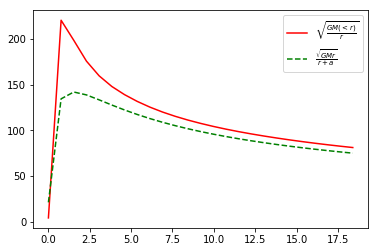

120.195919646 112.903963662
v0_circ_tot = 223.252737216


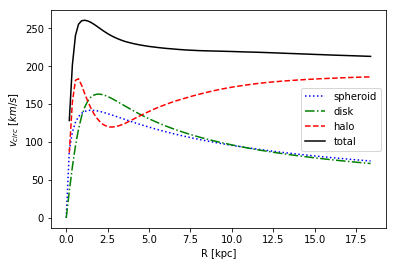

(1.2328109387387305, 0.14469729034936804, 1.5042548295274076, 120.19591964643679, 112.90396366165446, array([ 11.74170399,   5.51137066,  10.12351799, ...,  11.45210075,
        15.83899975,  13.0230093 ], dtype=float32), array([ 0.77190739,  1.43584239,  7.31774473, ..., -3.30492997,
        6.21146011, -0.16291672], dtype=float32), array([-138535.71875 , -161666.25    , -132587.5625  , ..., -136146.609375,
       -123753.359375, -134544.625   ]), 6.1287030577659607)


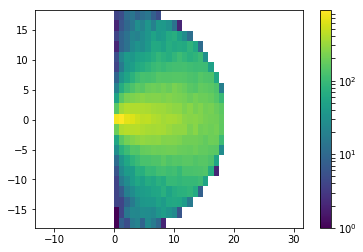

10 (10,)
[  9.20000000e+01   6.12870306e+00   1.91435895e+02   1.23281094e+00
   1.44697290e-01   1.50425483e+00   3.58692462e+01   1.20195920e+02
   1.12903964e+02   9.72282773e+01]
Snapshot =  92
v0_tot_kms at R0_kpc = 6.12870305777 : 191.435895299
Stellar Disk - a_MND_kpc = 1.23281093874 b_MND_kpc = 0.144697290349 v0_MND_kms = 120.195919646
Stellar Spheroid - a_HB_kp c= 1.50425482953 v0_HB_kms = 112.903963662
DM Halo - a_NFWH_kpc = 35.8692462124 v0_NFWH_kms = 97.2282772587
snapnr  : 93
13:18:44.014068
[ 22.153759    21.38641167  23.364851  ]
Found 1315974 stars.
Rotated pos.
Rotated vel.

galrad  : 0.01867956817150116
redshift: 0.5463921831410221
time    : 0.6466664866145445
center  : [ 0.  0.  0.]

computing star properties
computing histograms


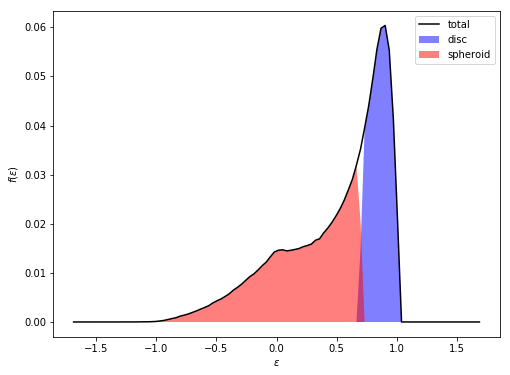

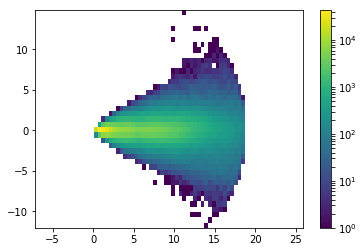

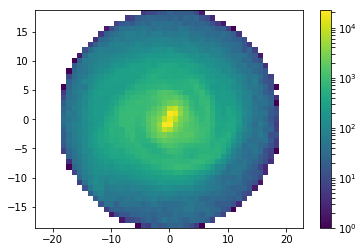

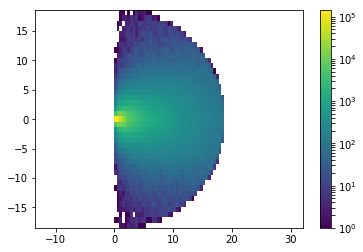

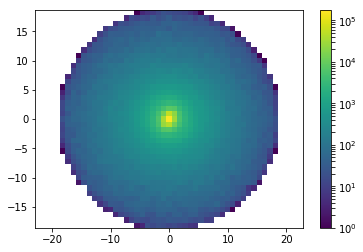

Start MND fit at 13:20:14.511770


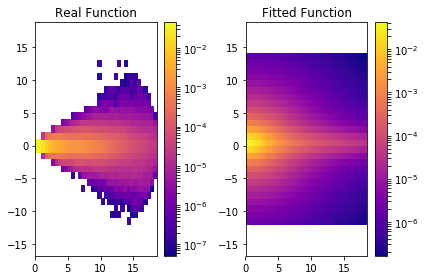

MND: a[kpc], b[kpc], vcirc [km/s]: 1.38762453934 1.21990504194 111.034257803


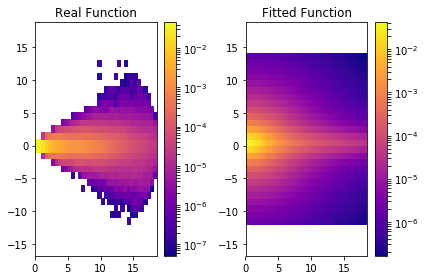

Start HB fit at 13:20:21.848778


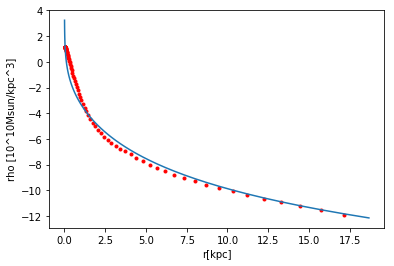

HB: a[kpc], vcirc [km/s]: 1.83960059716 108.778452485


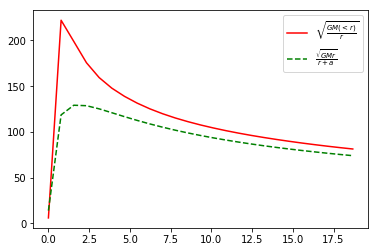

111.034257803 108.778452485
v0_circ_tot = 221.25668487


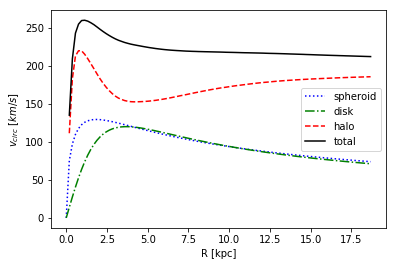

(1.3876245393353084, 1.2199050419369792, 1.839600597158692, 111.03425780322563, 108.77845248478356, array([  8.86540318,   9.76871014,  13.24794865, ...,  11.44779301,
         3.22648525,   9.29781342], dtype=float32), array([ -8.92874336,  -6.44897747,  -2.24983358, ...,  -2.07647514,
        -4.68218374,  11.00848961], dtype=float32), array([-133771.375    , -137024.46875  , -136147.15625  , ...,
       -140153.75     , -159514.625    , -129471.1171875]), 6.2265227238337202)


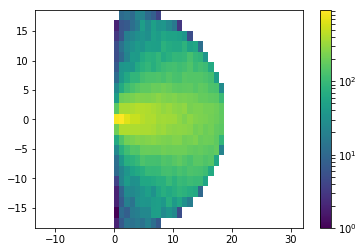

10 (10,)
[  93.            6.22652272  190.2788504     1.38762454    1.21990504
    1.8396006    28.73331496  111.0342578   108.77845248  109.74827005]
Snapshot =  93
v0_tot_kms at R0_kpc = 6.22652272383 : 190.2788504
Stellar Disk - a_MND_kpc = 1.38762453934 b_MND_kpc = 1.21990504194 v0_MND_kms = 111.034257803
Stellar Spheroid - a_HB_kp c= 1.83960059716 v0_HB_kms = 108.778452485
DM Halo - a_NFWH_kpc = 28.7333149612 v0_NFWH_kms = 109.748270049
snapnr  : 94
13:22:59.421127
[ 22.47373009  21.69274902  23.72468185]
Found 1349298 stars.
Rotated pos.
Rotated vel.

galrad  : 0.01891210824251175
redshift: 0.524565820433923
time    : 0.6559244517992534
center  : [ 0.  0.  0.]

computing star properties
computing histograms


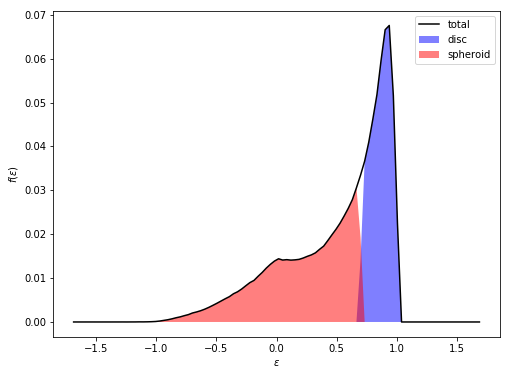

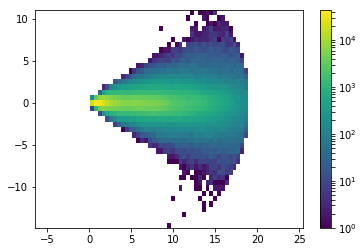

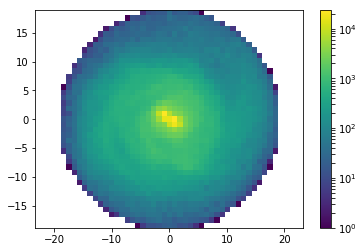

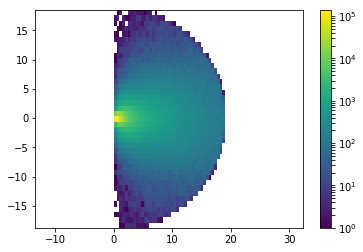

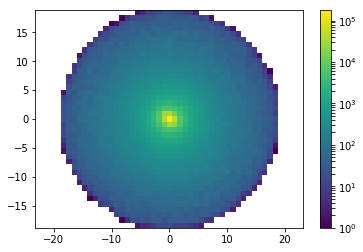

Start MND fit at 13:24:17.893428


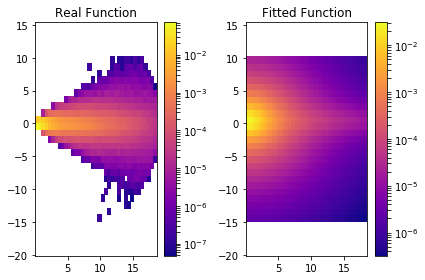

MND: a[kpc], b[kpc], vcirc [km/s]: 0.798904326889 1.96122444718 112.39993641


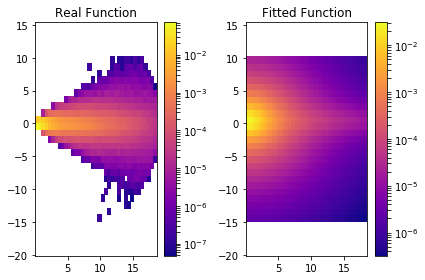

Start HB fit at 13:24:25.583107


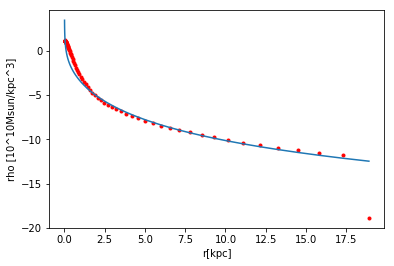

HB: a[kpc], vcirc [km/s]: 1.75211214114 109.191512202


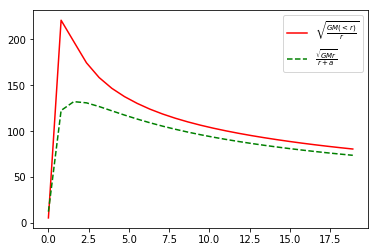

112.39993641 109.191512202
v0_circ_tot = 221.788591158


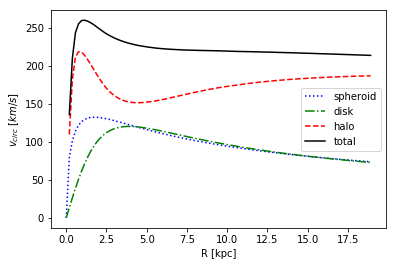

(0.79890432688943447, 1.9612244471806812, 1.7521121411412315, 112.39993640961104, 109.19151220157336, array([  6.61997461,   3.52493739,  15.147048  , ...,   3.42826462,
         9.68653679,  14.81202984], dtype=float32), array([ 15.74914169,  -4.19823313,  -4.0031848 , ...,   3.40962458,
        -3.8899858 ,  -4.32511997], dtype=float32), array([-125003.828125, -165138.484375, -133070.25    , ..., -169722.546875,
       -147451.828125, -134028.484375]), 6.3040360808372498)


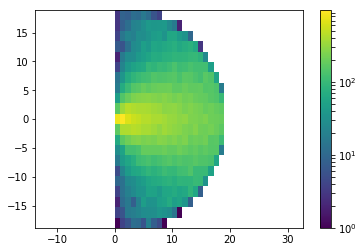

10 (10,)
[  94.            6.30403608  191.20679507    0.79890433    1.96122445
    1.75211214   29.90686191  112.39993641  109.1915122   109.56051496]
Snapshot =  94
v0_tot_kms at R0_kpc = 6.30403608084 : 191.206795068
Stellar Disk - a_MND_kpc = 0.798904326889 b_MND_kpc = 1.96122444718 v0_MND_kms = 112.39993641
Stellar Spheroid - a_HB_kp c= 1.75211214114 v0_HB_kms = 109.191512202
DM Halo - a_NFWH_kpc = 29.9068619071 v0_NFWH_kms = 109.560514961
snapnr  : 95
13:26:18.939912
[ 22.7996521   22.0025444   24.08984756]
Found 1373081 stars.
Rotated pos.
Rotated vel.

galrad  : 0.01919207274913788
redshift: 0.5030475232448832
time    : 0.6653149581332802
center  : [ 0.  0.  0.]

computing star properties
computing histograms


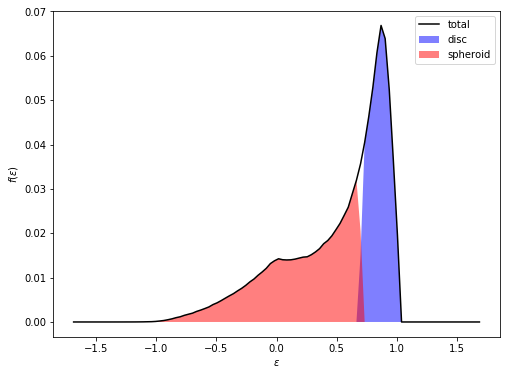

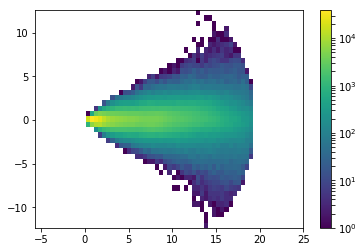

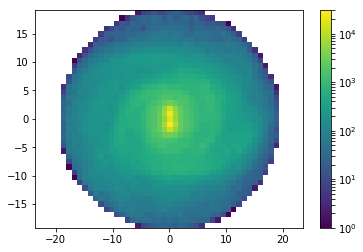

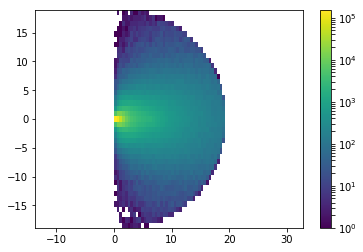

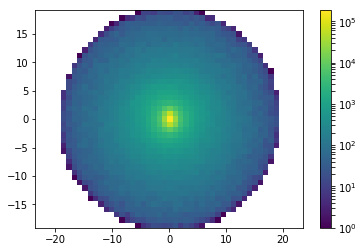

Start MND fit at 13:27:41.376769


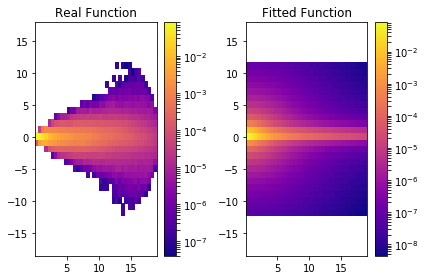

MND: a[kpc], b[kpc], vcirc [km/s]: 1.10322039914 0.192114676333 124.063303651


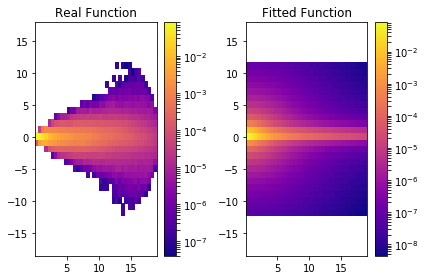

Start HB fit at 13:27:49.412567


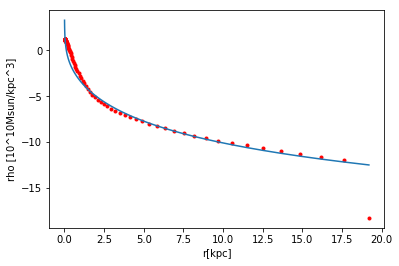

HB: a[kpc], vcirc [km/s]: 1.64651936808 111.391247749


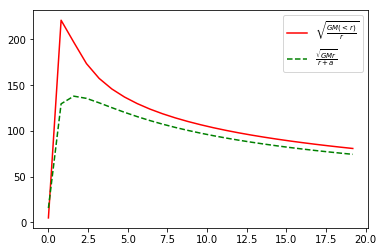

124.063303651 111.391247749
v0_circ_tot = 220.261889149


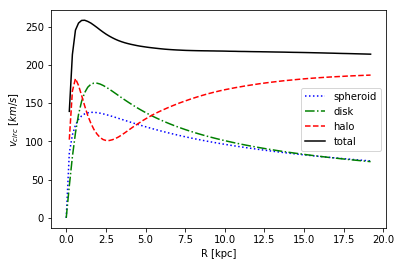

(1.1032203991359244, 0.19211467633342058, 1.6465193680799417, 124.06330365123191, 111.39124774882276, array([ 15.52266884,  16.80692673,  11.35340786, ...,  11.50547218,
         8.4059    ,   2.92080235], dtype=float32), array([  0.40235785,  -8.86086369,  -2.73125601, ...,   6.08839273,
        11.61588573,   2.21625471], dtype=float32), array([-140224.34375 , -127813.875   , -146301.21875 , ..., -142940.296875,
       -134988.15625 , -184533.890625]), 6.3973575830459604)


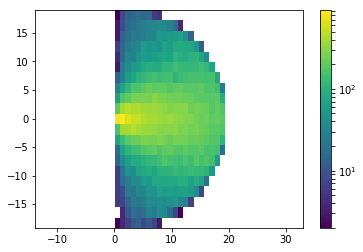

10 (10,)
[  95.            6.39735758  190.78293954    1.1032204     0.19211468
    1.64651937   44.48634917  124.06330365  111.39124775   92.72764762]
Snapshot =  95
v0_tot_kms at R0_kpc = 6.39735758305 : 190.782939544
Stellar Disk - a_MND_kpc = 1.10322039914 b_MND_kpc = 0.192114676333 v0_MND_kms = 124.063303651
Stellar Spheroid - a_HB_kp c= 1.64651936808 v0_HB_kms = 111.391247749
DM Halo - a_NFWH_kpc = 44.4863491692 v0_NFWH_kms = 92.7276476198
snapnr  : 96
13:29:55.077250
[ 23.13161278  22.31706619  24.45867538]
Found 1400280 stars.
Rotated pos.
Rotated vel.

galrad  : 0.019676823914051057
redshift: 0.4818329434209512
time    : 0.6748399031346985
center  : [ 0.  0.  0.]

computing star properties
computing histograms


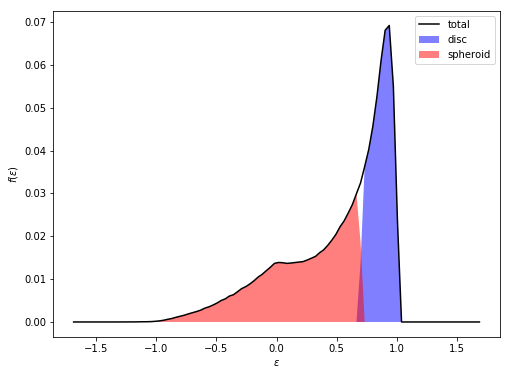

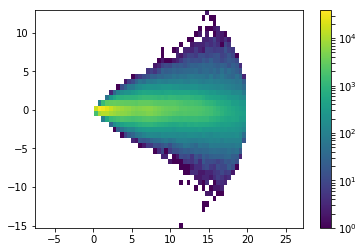

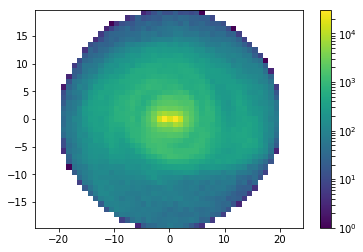

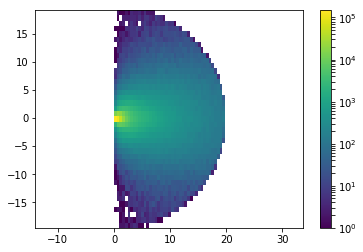

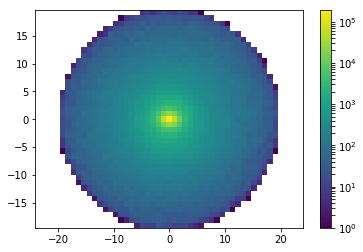

Start MND fit at 13:31:24.527905


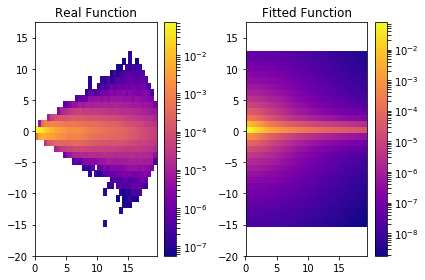

MND: a[kpc], b[kpc], vcirc [km/s]: 1.25691537401 0.157407390949 124.548966373


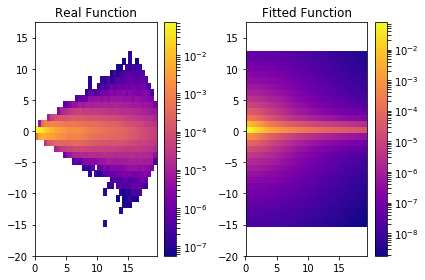

Start HB fit at 13:31:33.946985


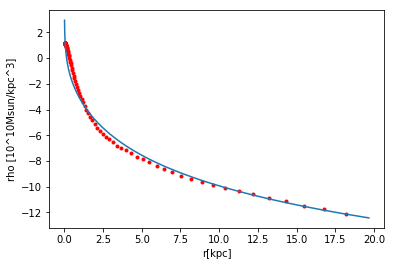

HB: a[kpc], vcirc [km/s]: 1.60322722245 110.979925187


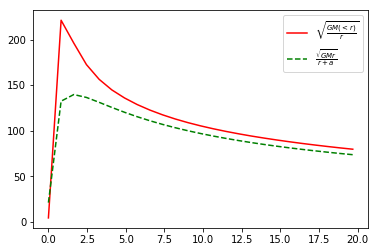

124.548966373 110.979925187
v0_circ_tot = 220.003430368


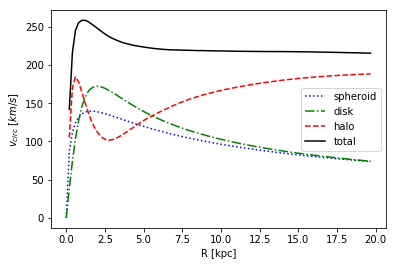

(1.2569153740128505, 0.15740739094944362, 1.6032272224525594, 124.5489663729339, 110.97992518707987, array([ 17.62209129,  11.19272709,   2.87179065, ...,  14.53281975,
        11.48995495,  16.74718857], dtype=float32), array([-3.06592917, -1.30611479, -1.97499311, ...,  2.97559905,
        0.61675698, -0.82433993], dtype=float32), array([-134729.5     , -150853.21875 , -188542.796875, ..., -141395.9375  ,
       -151467.953125, -137001.90625 ]), 6.5589413046836853)


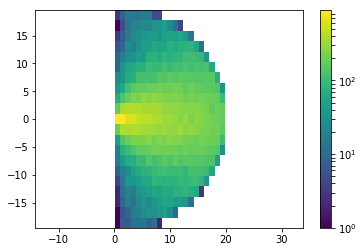

10 (10,)
[  9.60000000e+01   6.55894130e+00   1.91820489e+02   1.25691537e+00
   1.57407391e-01   1.60322722e+00   4.42196143e+01   1.24548966e+02
   1.10979925e+02   9.46895523e+01]
Snapshot =  96
v0_tot_kms at R0_kpc = 6.55894130468 : 191.820489368
Stellar Disk - a_MND_kpc = 1.25691537401 b_MND_kpc = 0.157407390949 v0_MND_kms = 124.548966373
Stellar Spheroid - a_HB_kp c= 1.60322722245 v0_HB_kms = 110.979925187
DM Halo - a_NFWH_kpc = 44.2196143007 v0_NFWH_kms = 94.6895523401
snapnr  : 97
13:34:09.864028
[ 23.46821594  22.63773918  24.8325634 ]
Found 1416479 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02003111392259598
redshift: 0.4609177941806475
time    : 0.684501211487295
center  : [ 0.  0.  0.]

computing star properties
computing histograms


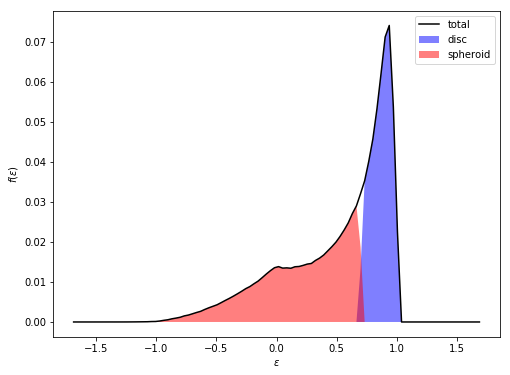

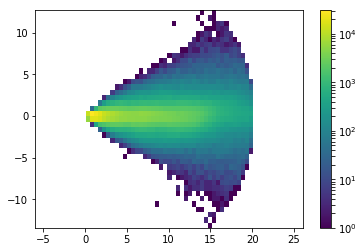

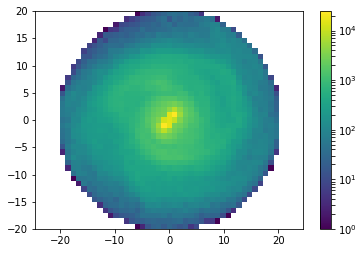

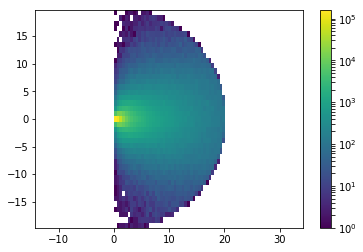

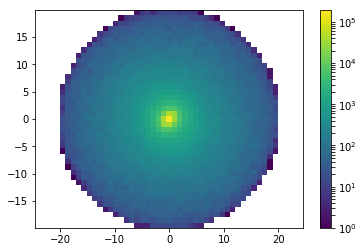

Start MND fit at 13:35:43.530291


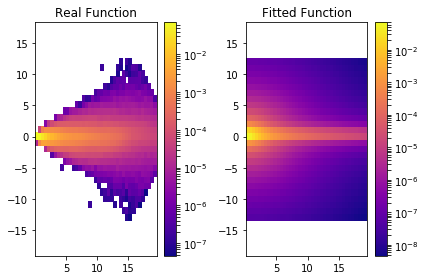

MND: a[kpc], b[kpc], vcirc [km/s]: 1.0959454719 0.216743359568 125.662127081


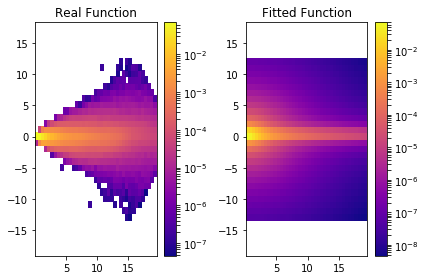

Start HB fit at 13:35:52.347977


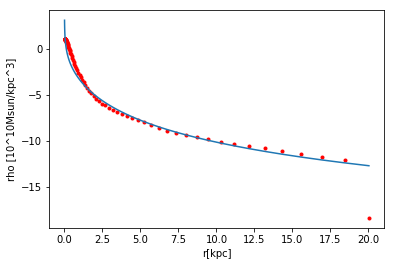

HB: a[kpc], vcirc [km/s]: 1.58033623167 110.563657012


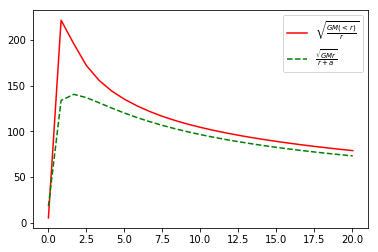

125.662127081 110.563657012
v0_circ_tot = 218.985317349


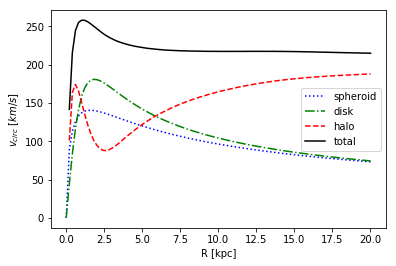

(1.0959454719004023, 0.21674335956775931, 1.5803362316746332, 125.66212708073898, 110.56365701209991, array([ 19.22757912,  10.75648785,   7.72988462, ...,  11.40997887,
        14.45512104,  18.83705902], dtype=float32), array([-3.85324574, -9.94084167,  3.97633624, ...,  3.05309391,
       -8.89636135, -3.31283736], dtype=float32), array([-133799.390625, -139260.171875, -159912.375   , ..., -150060.1875  ,
       -136456.96875 , -132292.578125]), 6.677037974198659)


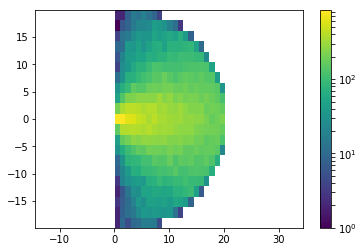

10 (10,)
[  97.            6.67703797  191.56520073    1.09594547    0.21674336
    1.58033623   46.72887925  125.66212708  110.56365701   93.17689465]
Snapshot =  97
v0_tot_kms at R0_kpc = 6.6770379742 : 191.565200729
Stellar Disk - a_MND_kpc = 1.0959454719 b_MND_kpc = 0.216743359568 v0_MND_kms = 125.662127081
Stellar Spheroid - a_HB_kp c= 1.58033623167 v0_HB_kms = 110.563657012
DM Halo - a_NFWH_kpc = 46.7288792527 v0_NFWH_kms = 93.1768946468
snapnr  : 98
13:37:56.935190
[ 23.80860329  22.96368408  25.21352386]
Found 1428816 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02028559446334839
redshift: 0.4402978492477432
time    : 0.6943008354294861
center  : [ 0.  0.  0.]

computing star properties
computing histograms


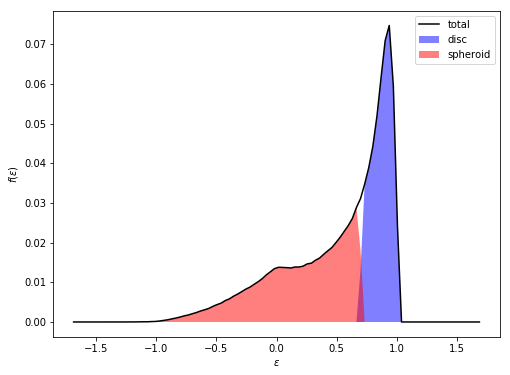

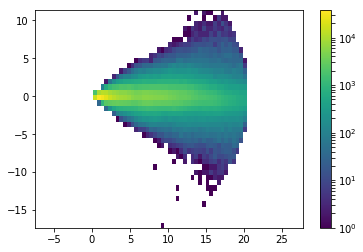

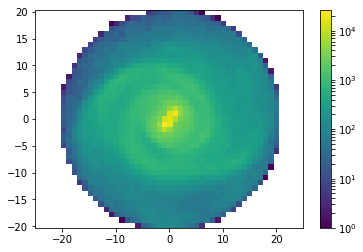

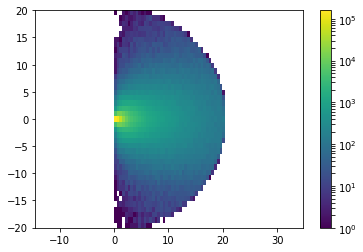

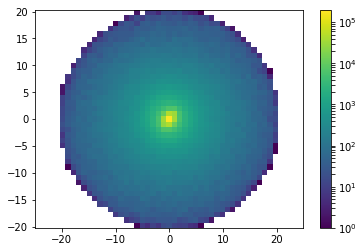

Start MND fit at 13:39:55.995486


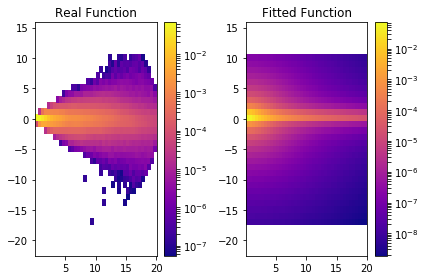

MND: a[kpc], b[kpc], vcirc [km/s]: 1.26229678132 0.187996681133 124.807531369


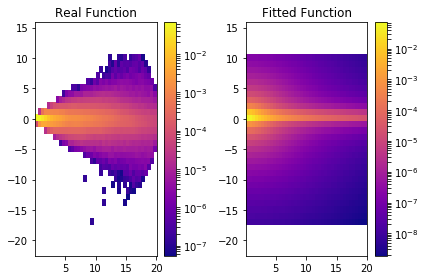

Start HB fit at 13:40:06.073390


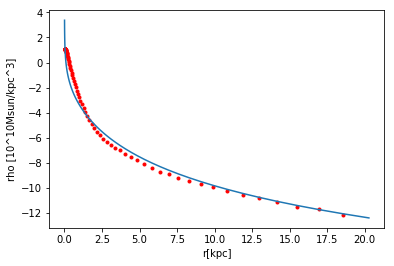

HB: a[kpc], vcirc [km/s]: 2.03704732131 104.451847247


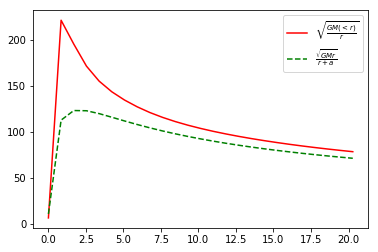

124.807531369 104.451847247
v0_circ_tot = 217.477576888


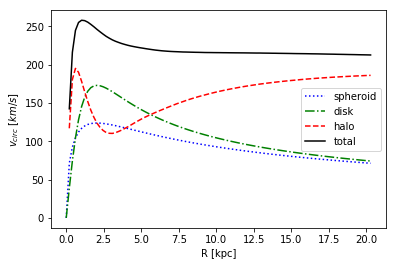

(1.2622967813225801, 0.18799668113310286, 2.0370473213132216, 124.8075313689702, 104.45184724721234, array([ 11.46254063,  12.03097057,   3.89790654, ...,   4.08571339,
         2.86941695,   5.51084661], dtype=float32), array([  0.81609654, -15.13105869,  -7.75439024, ..., -15.28616333,
        -6.56549549,  -2.21513677], dtype=float32), array([-152856.78125 , -130716.921875, -156352.921875, ..., -135387.359375,
       -162485.546875, -173204.234375]), 6.7618648211161299)


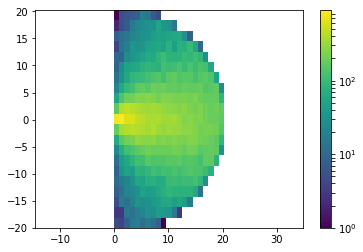

10 (10,)
[  9.80000000e+01   6.76186482e+00   1.90975234e+02   1.26229678e+00
   1.87996681e-01   2.03704732e+00   4.10744618e+01   1.24807531e+02
   1.04451847e+02   9.99221274e+01]
Snapshot =  98
v0_tot_kms at R0_kpc = 6.76186482112 : 190.975233545
Stellar Disk - a_MND_kpc = 1.26229678132 b_MND_kpc = 0.187996681133 v0_MND_kms = 124.807531369
Stellar Spheroid - a_HB_kp c= 2.03704732131 v0_HB_kms = 104.451847247
DM Halo - a_NFWH_kpc = 41.0744618493 v0_NFWH_kms = 99.9221274186
snapnr  : 99
13:42:34.649581
[ 24.15342522  23.29395103  25.60112953]
Found 1445387 stars.
Rotated pos.
Rotated vel.

galrad  : 0.020526847243309023
redshift: 0.41996894199726653
time    : 0.7042407551488017
center  : [ 0.  0.  0.]

computing star properties
computing histograms


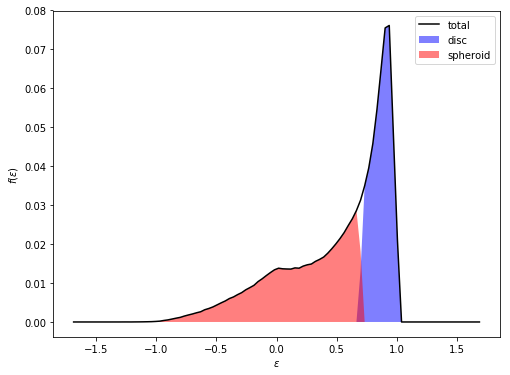

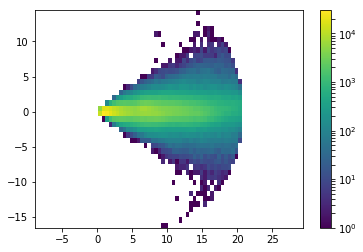

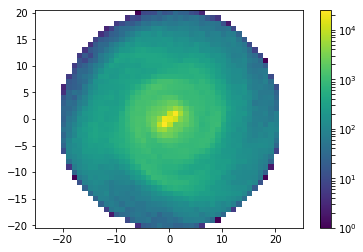

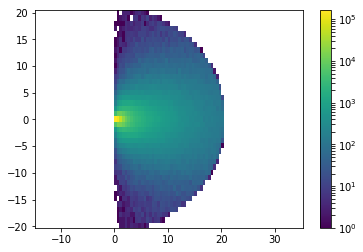

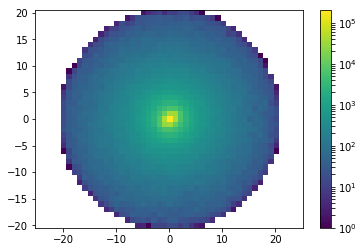

Start MND fit at 13:43:56.567356


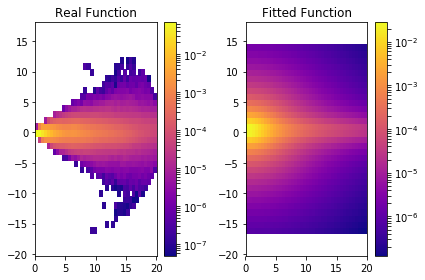

MND: a[kpc], b[kpc], vcirc [km/s]: 1.52613049878 1.46221878524 113.002753261


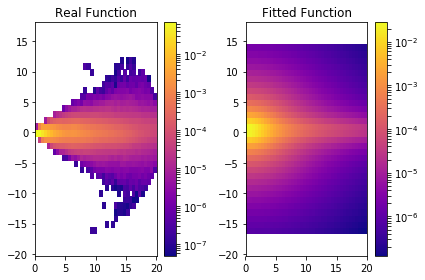

Start HB fit at 13:44:06.714379


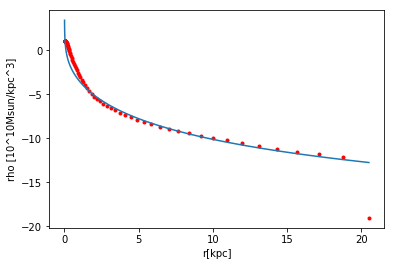

HB: a[kpc], vcirc [km/s]: 1.78135151028 107.728252203


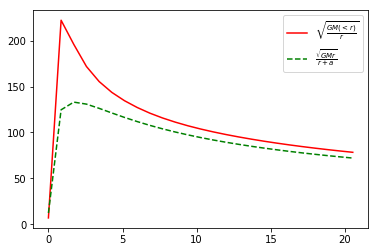

113.002753261 107.728252203
v0_circ_tot = 218.009692084


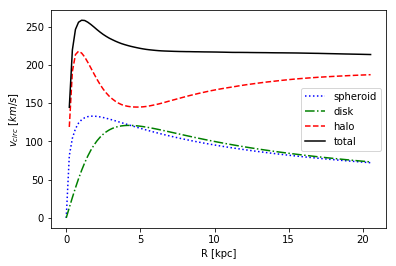

(1.5261304987769311, 1.4622187852383328, 1.7813515102781681, 113.00275326085975, 107.72825220309866, array([  8.67500973,   9.59231281,  15.95586014, ...,   9.91302204,
        12.54440212,   6.77885151], dtype=float32), array([ -1.66659451,   4.4951582 ,  -7.24401712, ...,  -4.40526199,
        10.15641212,  -4.70394754], dtype=float32), array([-163877.078125, -156102.734375, -137107.578125, ..., -156312.453125,
       -140510.421875, -162739.03125 ]), 6.8422824144363403)


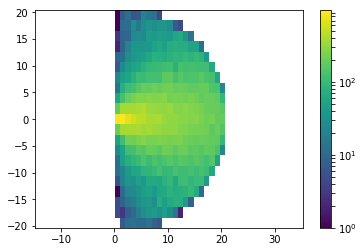

10 (10,)
[  99.            6.84228241  193.50812324    1.5261305     1.46221879
    1.78135151   31.70552199  113.00275326  107.7282522   114.32582907]
Snapshot =  99
v0_tot_kms at R0_kpc = 6.84228241444 : 193.508123241
Stellar Disk - a_MND_kpc = 1.52613049878 b_MND_kpc = 1.46221878524 v0_MND_kms = 113.002753261
Stellar Spheroid - a_HB_kp c= 1.78135151028 v0_HB_kms = 107.728252203
DM Halo - a_NFWH_kpc = 31.7055219861 v0_NFWH_kms = 114.325829072
snapnr  : 100
13:46:11.804324
[ 24.50271797  23.62892342  25.99520683]
Found 1470007 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02074236571788788
redshift: 0.3999269646135635
time    : 0.7143229791820179
center  : [ 0.  0.  0.]

computing star properties
computing histograms


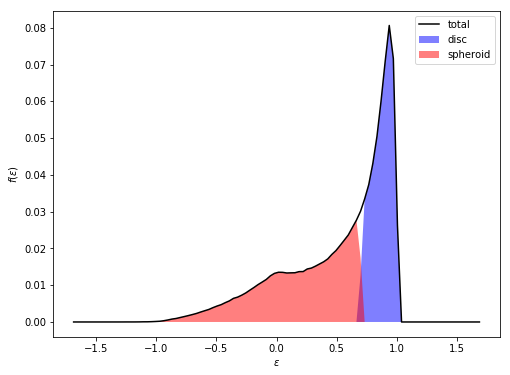

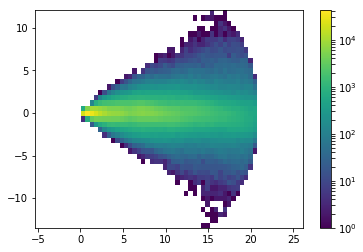

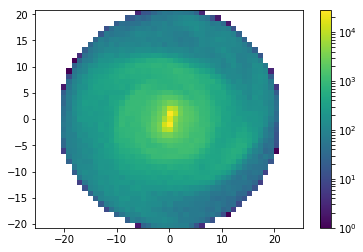

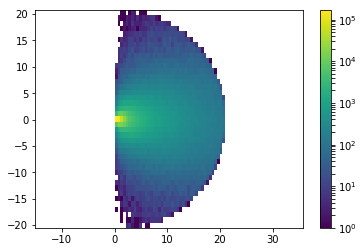

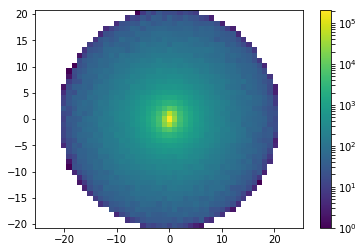

Start MND fit at 13:47:35.216020


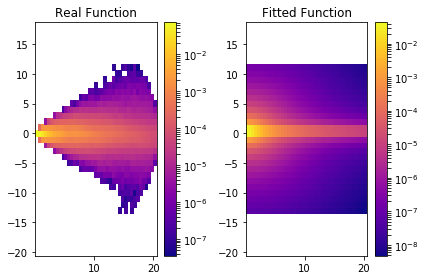

MND: a[kpc], b[kpc], vcirc [km/s]: 1.13882050318 -0.233009728114 127.048853835


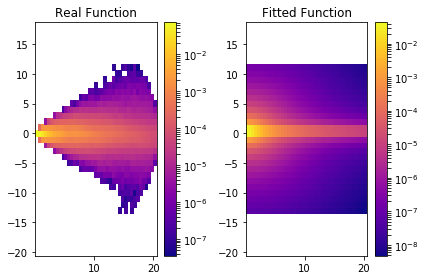

Start HB fit at 13:47:45.590628


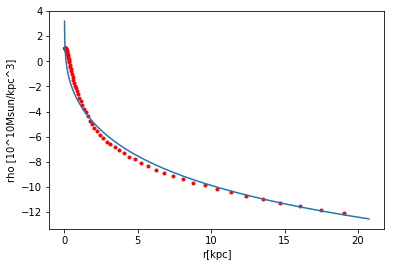

HB: a[kpc], vcirc [km/s]: 1.87687566532 105.632406213


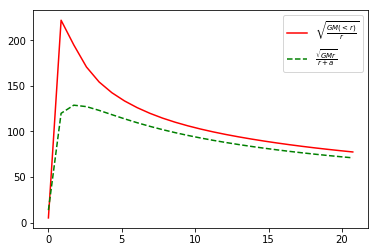

127.048853835 105.632406213
v0_circ_tot = 217.891111043


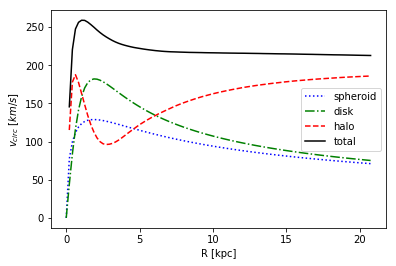

(1.1388205031820535, -0.23300972811448725, 1.8768756653205219, 127.04885383497798, 105.63240621338156, array([  3.33671308,  17.0865593 ,   7.68183136, ...,  12.86799526,
        16.72176361,   6.86397314], dtype=float32), array([ -0.70808768,  -0.76787591,  -1.52612281, ...,  14.94178963,
        -3.57289386,   1.82257438], dtype=float32), array([-199062.125   , -144397.8125  , -169991.609375, ..., -133475.984375,
       -143819.9375  , -173990.359375]), 6.9141219059626264)


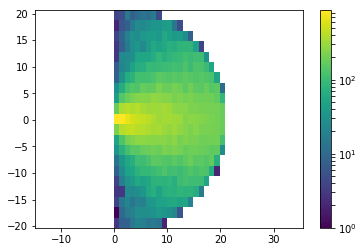

10 (10,)
[  1.00000000e+02   6.91412191e+00   1.89940240e+02   1.13882050e+00
  -2.33009728e-01   1.87687567e+00   3.08626622e+02   1.27048854e+02
   1.05632406e+02   9.36892648e+01]
Snapshot =  100
v0_tot_kms at R0_kpc = 6.91412190596 : 189.940240176
Stellar Disk - a_MND_kpc = 1.13882050318 b_MND_kpc = -0.233009728114 v0_MND_kms = 127.048853835
Stellar Spheroid - a_HB_kp c= 1.87687566532 v0_HB_kms = 105.632406213
DM Halo - a_NFWH_kpc = 308.626621621 v0_NFWH_kms = 93.6892647803
snapnr  : 101
13:49:57.337291
[ 24.85713387  23.96839905  26.39595032]
Found 1484340 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02092690169811249
redshift: 0.38016786726023866
time    : 0.7245495448210172
center  : [ 0.  0.  0.]

computing star properties
computing histograms


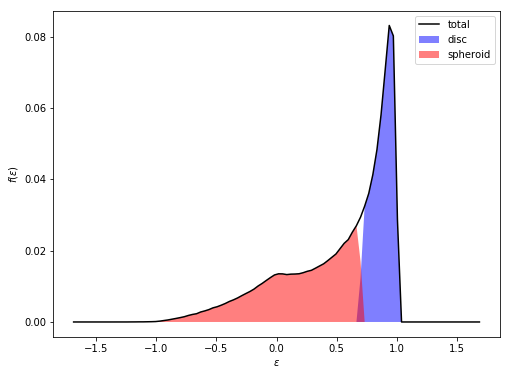

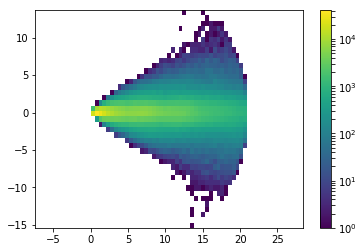

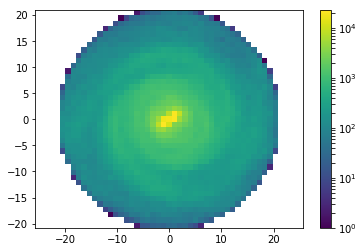

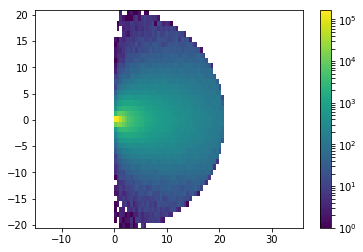

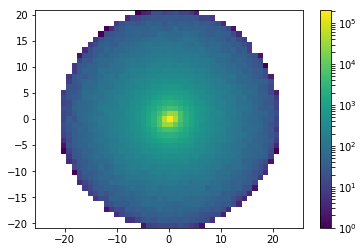

Start MND fit at 13:51:26.505883


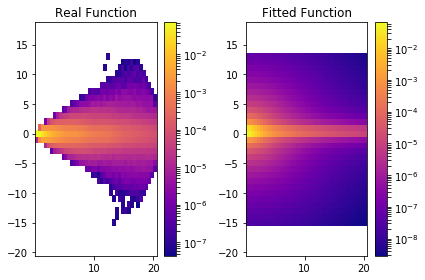

MND: a[kpc], b[kpc], vcirc [km/s]: 0.998494884506 0.206077872778 128.428971177


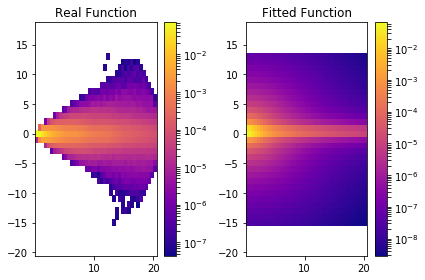

Start HB fit at 13:51:37.928741


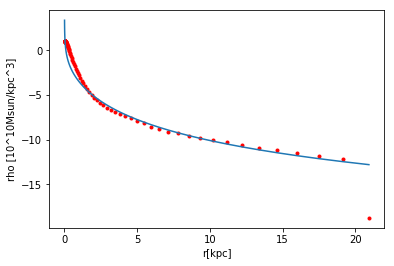

HB: a[kpc], vcirc [km/s]: 1.8205008185 106.003838177


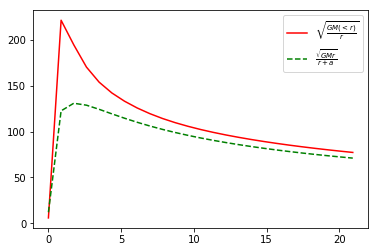

128.428971177 106.003838177
v0_circ_tot = 217.749216261


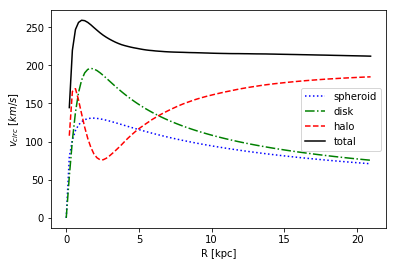

(0.99849488450594892, 0.20607787277817896, 1.8205008184985949, 128.42897117675165, 106.00383817749248, array([ 10.32463074,   5.36113405,   1.77718282, ...,   3.90992856,
         8.68382168,   2.30317974], dtype=float32), array([ 0.96642077,  4.37771082, -6.05661488, ..., -1.24537504,
        9.5376091 , -1.94667363], dtype=float32), array([-163395.703125, -174073.265625, -174049.078125, ..., -194646.015625,
       -151437.15625 , -203937.140625]), 6.9756338993708296)


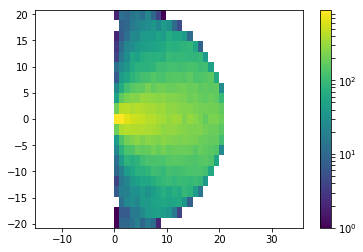

10 (10,)
[ 101.            6.9756339   193.94244215    0.99849488    0.20607787
    1.82050082   44.60924223  128.42897118  106.00383818   99.41255716]
Snapshot =  101
v0_tot_kms at R0_kpc = 6.97563389937 : 193.942442151
Stellar Disk - a_MND_kpc = 0.998494884506 b_MND_kpc = 0.206077872778 v0_MND_kms = 128.428971177
Stellar Spheroid - a_HB_kp c= 1.8205008185 v0_HB_kms = 106.003838177
DM Halo - a_NFWH_kpc = 44.6092422333 v0_NFWH_kms = 99.4125571635
snapnr  : 102
13:54:21.125597
[ 25.21674347  24.31293106  26.80324364]
Found 1494084 stars.
Rotated pos.
Rotated vel.

galrad  : 0.0211064949631691
redshift: 0.36068765726181673
time    : 0.7349225185244588
center  : [ 0.  0.  0.]

computing star properties
computing histograms


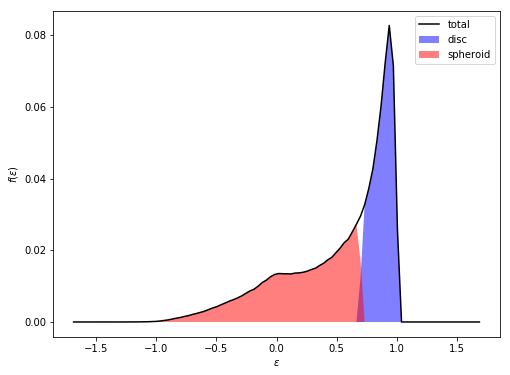

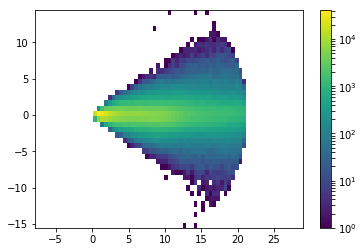

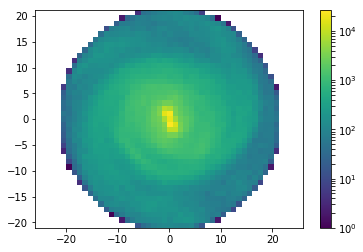

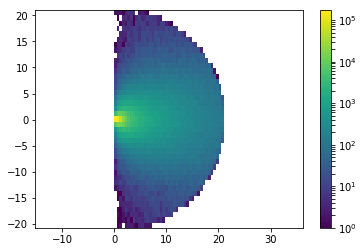

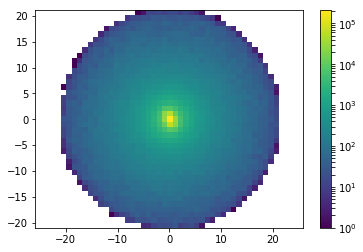

Start MND fit at 13:55:54.012590


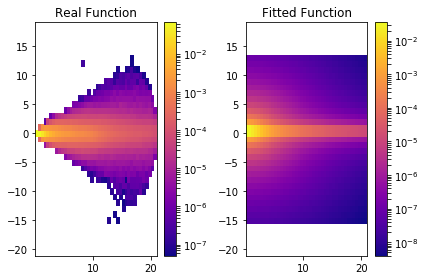

MND: a[kpc], b[kpc], vcirc [km/s]: 1.33429993212 0.249754541022 125.908522382


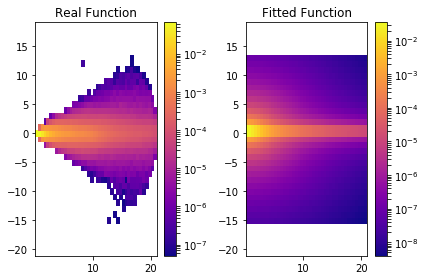

Start HB fit at 13:56:05.639296


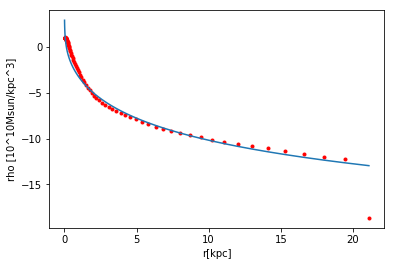

HB: a[kpc], vcirc [km/s]: 1.47340084282 110.577259152


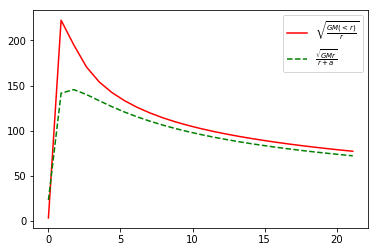

125.908522382 110.577259152
v0_circ_tot = 217.225372412


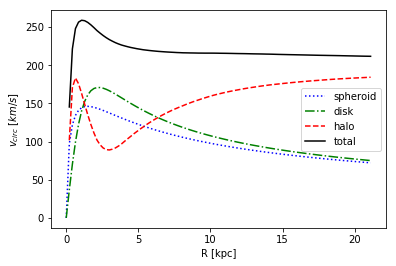

(1.3342999321173625, 0.24975454102224684, 1.4734008428171501, 125.90852238204145, 110.57725915249142, array([ 15.29769802,   4.09701204,  14.19589043, ...,   5.71254396,
         9.49544048,  19.90885925], dtype=float32), array([ -2.17770219,   3.13129449,   3.11835551, ...,   3.55523324,
       -11.03468895,   6.35027981], dtype=float32), array([-151582.734375, -186575.265625, -152832.      , ..., -178849.703125,
       -147530.21875 , -138720.21875 ]), 7.035498321056366)


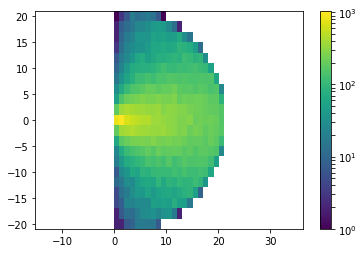

10 (10,)
[ 102.            7.03549832  196.08260228    1.33429993    0.24975454
    1.47340084   43.38762672  125.90852238  110.57725915  101.82387082]
Snapshot =  102
v0_tot_kms at R0_kpc = 7.03549832106 : 196.082602284
Stellar Disk - a_MND_kpc = 1.33429993212 b_MND_kpc = 0.249754541022 v0_MND_kms = 125.908522382
Stellar Spheroid - a_HB_kp c= 1.47340084282 v0_HB_kms = 110.577259152
DM Halo - a_NFWH_kpc = 43.387626721 v0_NFWH_kms = 101.823870819
snapnr  : 103
13:58:42.810919
[ 25.45941925  24.54529381  27.07883453]
Found 1509390 stars.
Rotated pos.
Rotated vel.

galrad  : 0.021213290095329285
redshift: 0.3478538418581776
time    : 0.7419202059930923
center  : [ 0.  0.  0.]

computing star properties
computing histograms


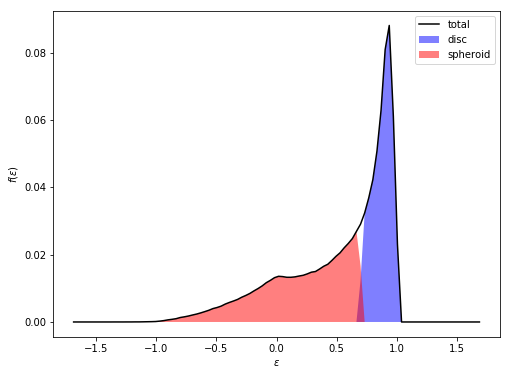

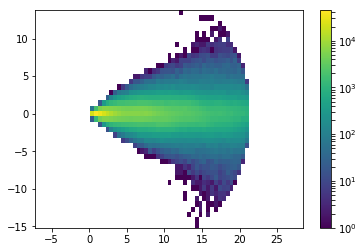

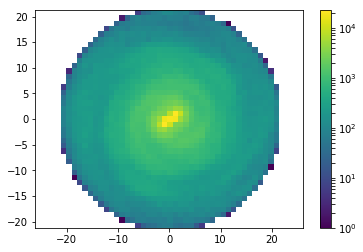

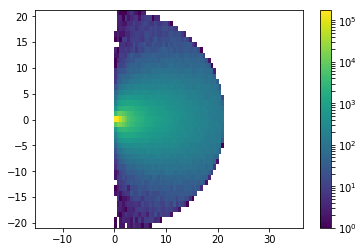

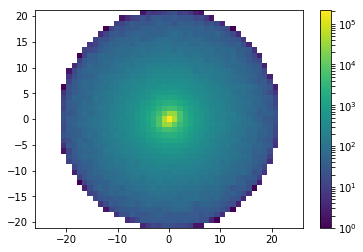

Start MND fit at 14:00:20.980970


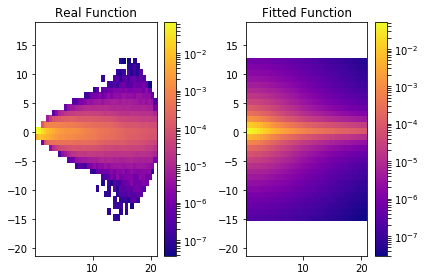

MND: a[kpc], b[kpc], vcirc [km/s]: 2.29970649518 0.655441923824 116.295258072


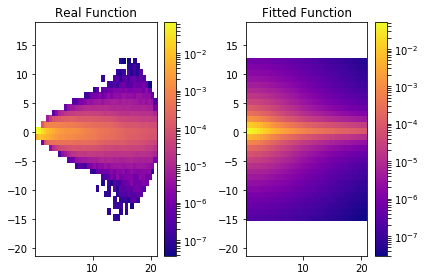

Start HB fit at 14:00:31.692454


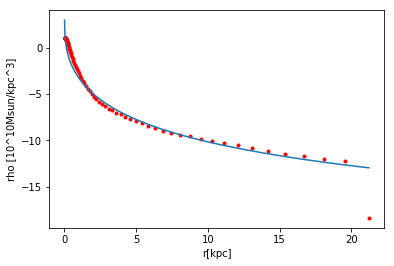

HB: a[kpc], vcirc [km/s]: 1.47582257333 110.627081851


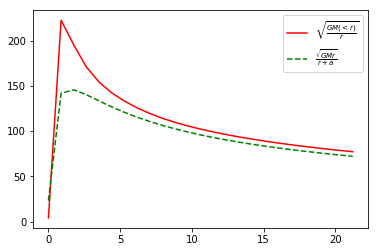

116.295258072 110.627081851
v0_circ_tot = 217.038702766


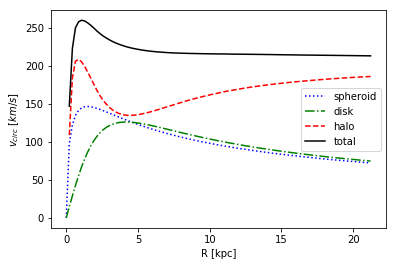

(2.2997064951823161, 0.65544192382421007, 1.4758225733293768, 116.29525807154633, 110.62708185143299, array([ 17.36056709,   2.55275154,  20.45265388, ...,   9.09131241,
         6.33524799,  19.11217117], dtype=float32), array([ 10.4553194 ,   3.59238553,  -3.02924824, ...,   1.106143  ,
         9.70238876,  -5.09435892], dtype=float32), array([-140113.28125 , -194247.78125 , -142323.78125 , ..., -171735.09375 ,
       -158406.796875, -143501.796875]), 7.0710966984430943)


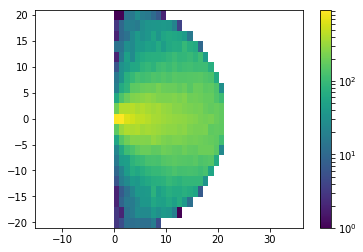

10 (10,)
[ 103.            7.0710967   197.9439036     2.2997065     0.65544192
    1.47582257   33.82486032  116.29525807  110.62708185  115.83976297]
Snapshot =  103
v0_tot_kms at R0_kpc = 7.07109669844 : 197.943903601
Stellar Disk - a_MND_kpc = 2.29970649518 b_MND_kpc = 0.655441923824 v0_MND_kms = 116.295258072
Stellar Spheroid - a_HB_kp c= 1.47582257333 v0_HB_kms = 110.627081851
DM Halo - a_NFWH_kpc = 33.8248603151 v0_NFWH_kms = 115.839762966
snapnr  : 104
14:03:27.975757
[ 25.82858849  24.89687347  27.49774933]
Found 1532350 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02135048806667328
redshift: 0.32882972420595435
time    : 0.7525418658117033
center  : [ 0.  0.  0.]

computing star properties
computing histograms


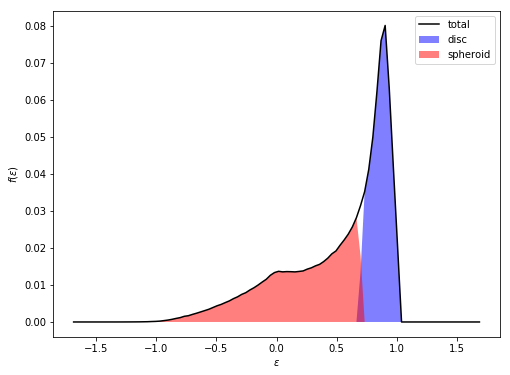

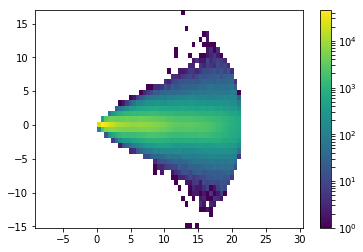

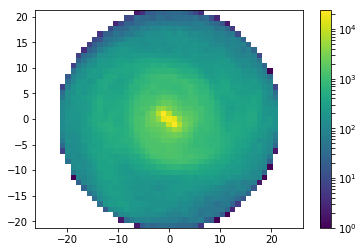

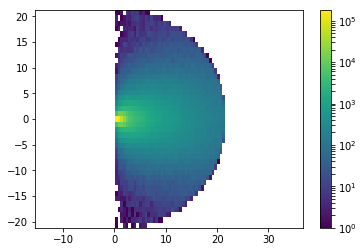

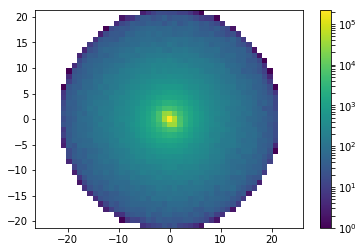

Start MND fit at 14:05:03.160756


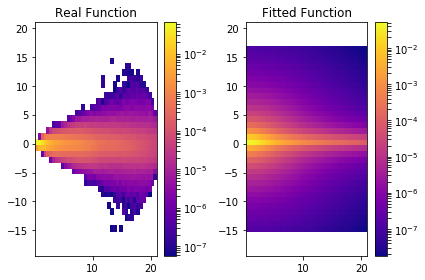

MND: a[kpc], b[kpc], vcirc [km/s]: 2.44147861861 0.530755225688 116.027191473


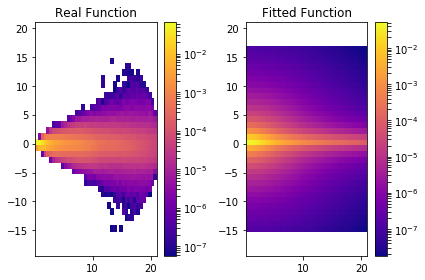

Start HB fit at 14:05:16.130081


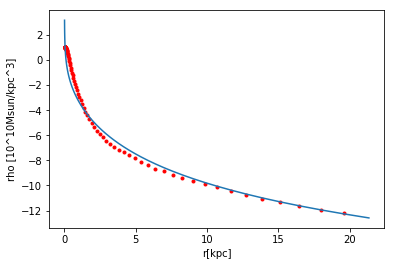

HB: a[kpc], vcirc [km/s]: 1.92858644665 106.142923556


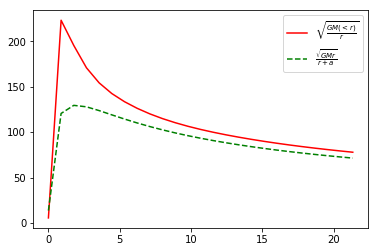

116.027191473 106.142923556
v0_circ_tot = 217.732297609


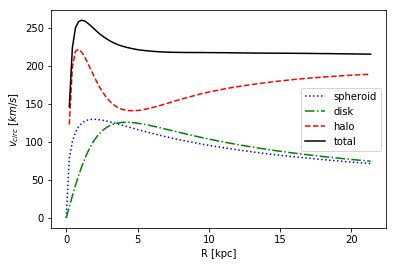

(2.4414786186134823, 0.5307552256878898, 1.9285864466498843, 116.02719147325882, 106.14292355555556, array([  3.36282372,  20.81951332,   9.99101734, ...,   2.47328877,
        18.85936737,   4.81048489], dtype=float32), array([-5.95432186,  2.63042378,  4.08955622, ...,  2.13300586,
       -3.2891798 , -4.6348443 ], dtype=float32), array([-181093.46875 , -148710.734375, -170042.203125, ..., -211400.953125,
       -149824.1875  , -183562.84375 ]), 7.1168293555577593)


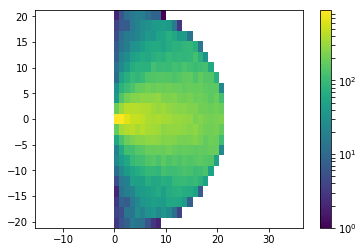

10 (10,)
[ 104.            7.11682936  200.22121349    2.44147862    0.53075523
    1.92858645   30.34197013  116.02719147  106.14292356  123.93508361]
Snapshot =  104
v0_tot_kms at R0_kpc = 7.11682935556 : 200.221213492
Stellar Disk - a_MND_kpc = 2.44147861861 b_MND_kpc = 0.530755225688 v0_MND_kms = 116.027191473
Stellar Spheroid - a_HB_kp c= 1.92858644665 v0_HB_kms = 106.142923556
DM Halo - a_NFWH_kpc = 30.3419701264 v0_NFWH_kms = 123.935083613
snapnr  : 105
14:07:57.331179
[ 26.2042942   25.2542057   27.92131042]
Found 1524327 stars.
Rotated pos.
Rotated vel.

galrad  : 0.021507640182971955
redshift: 0.31007412012783386
time    : 0.7633155900388464
center  : [ 0.  0.  0.]

computing star properties
computing histograms


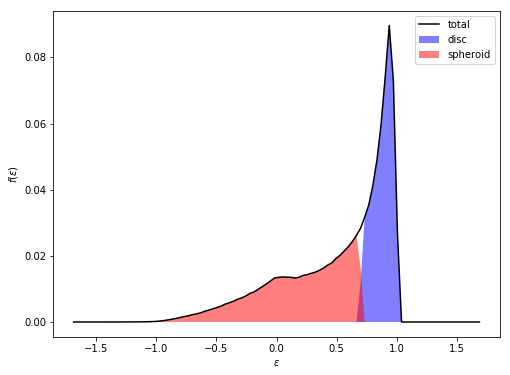

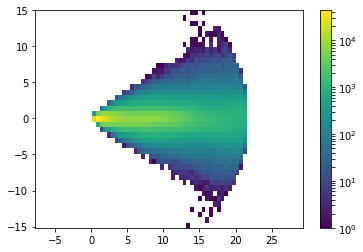

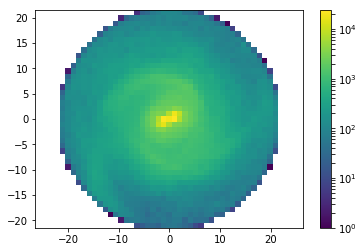

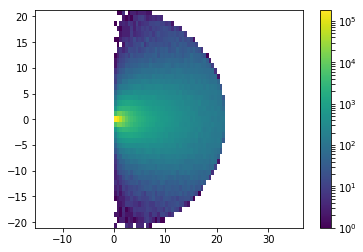

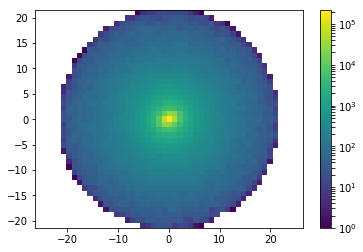

Start MND fit at 14:09:45.081782


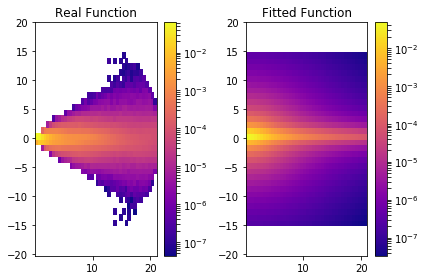

MND: a[kpc], b[kpc], vcirc [km/s]: 2.34997442628 0.686557461519 115.618560451


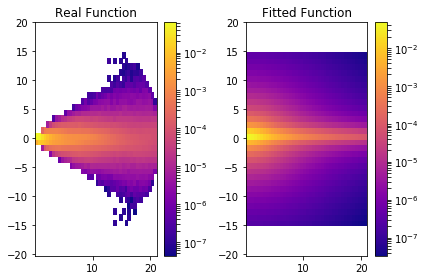

Start HB fit at 14:09:58.497365


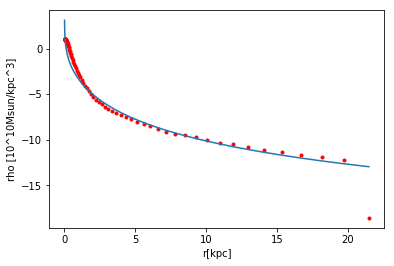

HB: a[kpc], vcirc [km/s]: 1.60489550464 108.584427597


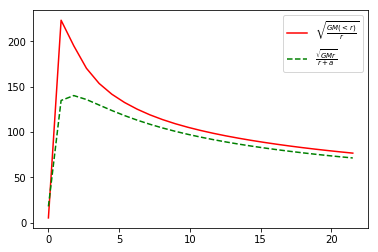

115.618560451 108.584427597
v0_circ_tot = 216.297788892


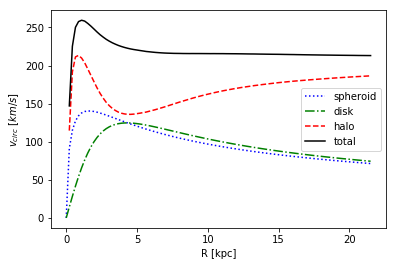

(2.349974426275117, 0.68655746151858354, 1.6048955046355151, 115.61856045146003, 108.58442759663214, array([ 20.46034241,  17.62472725,  13.48162651, ...,   7.8073473 ,
         8.62100983,   9.0761261 ], dtype=float32), array([ 3.41935277,  0.93078798, -7.50329781, ..., -1.27208042,
        7.59213495,  2.51518083], dtype=float32), array([-146806.0625  , -153847.6875  , -155346.140625, ..., -182812.671875,
       -165051.921875, -175840.828125]), 7.1692133943239842)


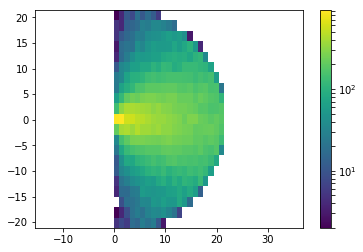

10 (10,)
[ 105.            7.16921339  199.70400603    2.34997443    0.68655746
    1.6048955    32.08697079  115.61856045  108.5844276   121.34026779]
Snapshot =  105
v0_tot_kms at R0_kpc = 7.16921339432 : 199.704006032
Stellar Disk - a_MND_kpc = 2.34997442628 b_MND_kpc = 0.686557461519 v0_MND_kms = 115.618560451
Stellar Spheroid - a_HB_kp c= 1.60489550464 v0_HB_kms = 108.584427597
DM Halo - a_NFWH_kpc = 32.0869707891 v0_NFWH_kms = 121.340267793
snapnr  : 106
14:12:40.152345
[ 26.58517647  25.61821175  28.35095024]
Found 1553881 stars.
Rotated pos.
Rotated vel.

galrad  : 0.0215757355093956
redshift: 0.29158323972192446
time    : 0.7742435556962617
center  : [ 0.  0.  0.]

computing star properties
computing histograms


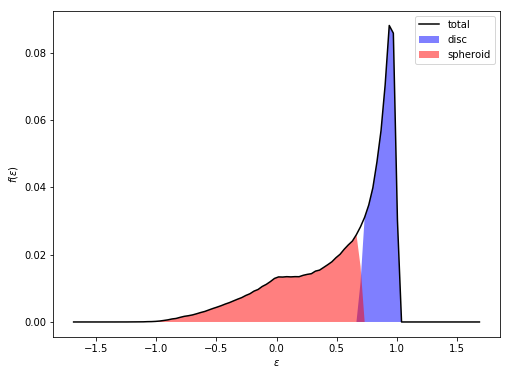

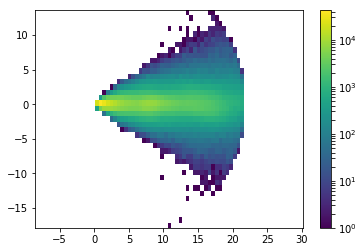

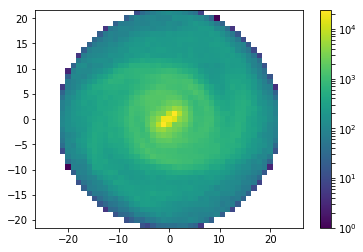

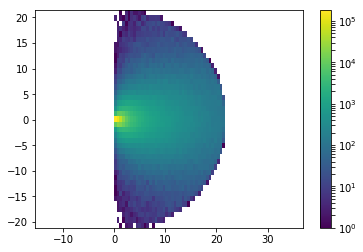

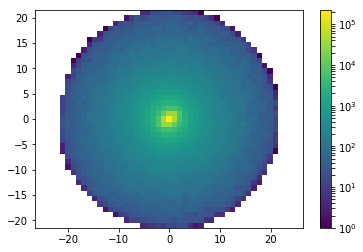

Start MND fit at 14:14:06.305032


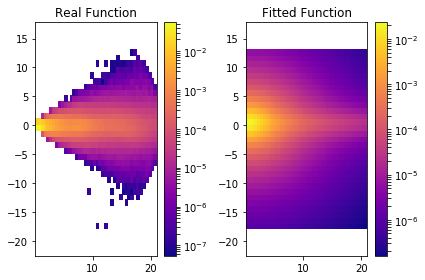

MND: a[kpc], b[kpc], vcirc [km/s]: 1.52258595277 1.83640964405 114.150027297


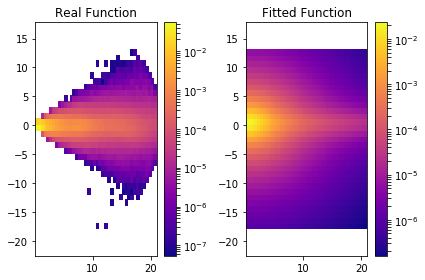

Start HB fit at 14:14:16.878813


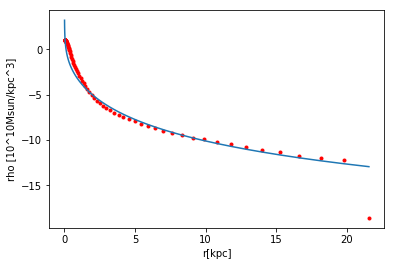

HB: a[kpc], vcirc [km/s]: 1.69639832186 107.876463401


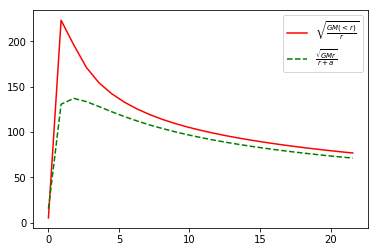

114.150027297 107.876463401
v0_circ_tot = 215.742690002


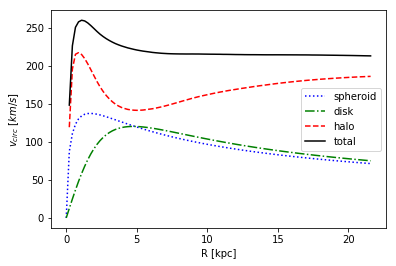

(1.5225859527725687, 1.8364096440521627, 1.6963983218582093, 114.15002729673999, 107.87646340100578, array([  5.6381216 ,  18.52853966,   4.44995213, ...,   0.25223514,
         1.18363106,   1.55103076], dtype=float32), array([ -5.00734472,  11.04812813,  -7.05771828, ...,  -1.07864153,
        -0.01535137,  13.5545969 ], dtype=float32), array([-182499.4375  , -144671.015625, -177208.375   , ..., -261404.734375,
       -268432.375   , -157808.4375  ]), 7.1919118364651995)


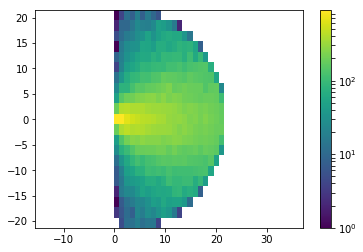

10 (10,)
[ 106.            7.19191184  200.03195419    1.52258595    1.83640964
    1.69639832   31.113274    114.1500273   107.8764634   123.87583545]
Snapshot =  106
v0_tot_kms at R0_kpc = 7.19191183647 : 200.031954186
Stellar Disk - a_MND_kpc = 1.52258595277 b_MND_kpc = 1.83640964405 v0_MND_kms = 114.150027297
Stellar Spheroid - a_HB_kp c= 1.69639832186 v0_HB_kms = 107.876463401
DM Halo - a_NFWH_kpc = 31.1132740041 v0_NFWH_kms = 123.875835447
snapnr  : 107
14:16:13.591934
[ 26.97145081  25.98770905  28.78736305]
Found 1562371 stars.
Rotated pos.
Rotated vel.

galrad  : 0.021586434543132783
redshift: 0.2733533465784399
time    : 0.7853279709729014
center  : [ 0.  0.  0.]

computing star properties
computing histograms


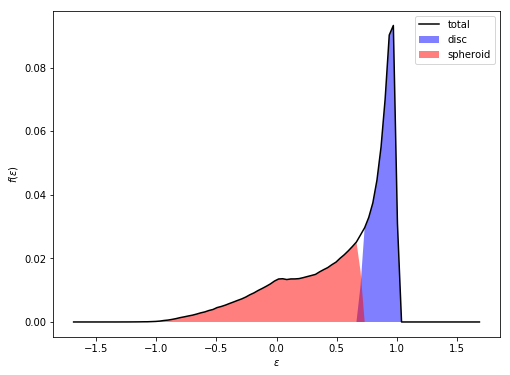

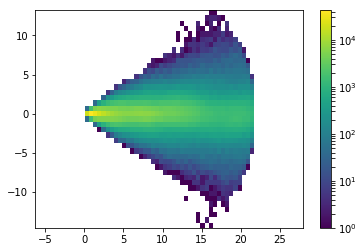

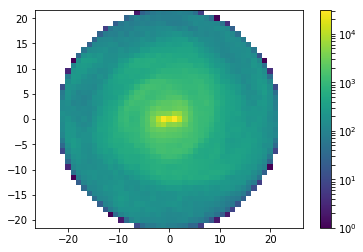

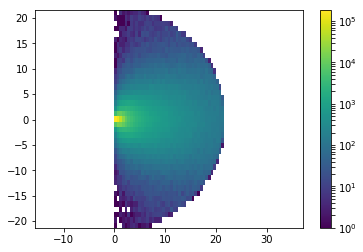

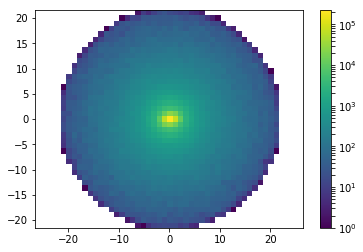

Start MND fit at 14:17:45.466556


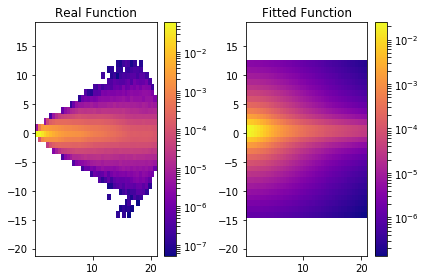

MND: a[kpc], b[kpc], vcirc [km/s]: 1.97159616269 1.32446174681 114.880474568


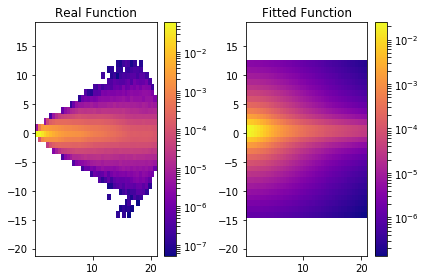

Start HB fit at 14:17:56.248073


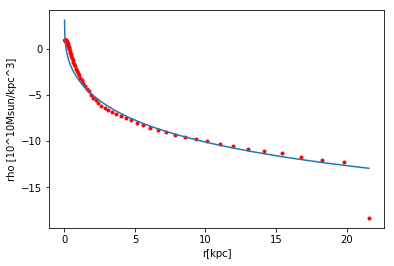

HB: a[kpc], vcirc [km/s]: 1.63785416611 108.746743751


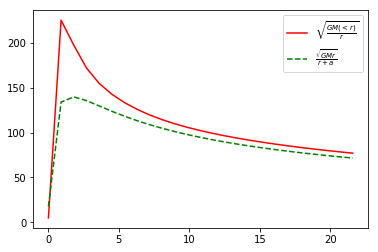

114.880474568 108.746743751
v0_circ_tot = 216.009844659


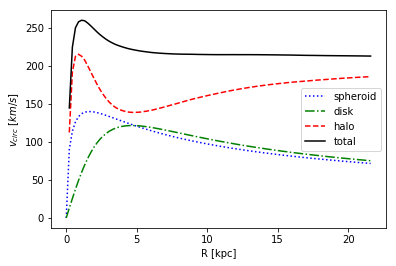

(1.9715961626946896, 1.3244617468051503, 1.6378541661093968, 114.88047456765152, 108.74674375136289, array([  6.45973635,   8.15920353,   9.1691637 , ...,  12.77669144,
         3.54691434,  14.01352215], dtype=float32), array([ 3.73444867,  2.58241773,  4.97848558, ...,  4.75251293,
        5.05935955, -1.72682571], dtype=float32), array([-186959.890625, -182769.515625, -174180.21875 , ..., -165175.25    ,
       -191019.25    , -165113.046875]), 7.195478181044261)


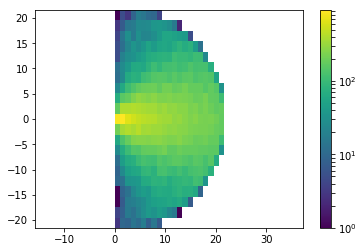

10 (10,)
[ 107.            7.19547818  201.42773048    1.97159616    1.32446175
    1.63785417   31.10799612  114.88047457  108.74674375  124.69864832]
Snapshot =  107
v0_tot_kms at R0_kpc = 7.19547818104 : 201.427730482
Stellar Disk - a_MND_kpc = 1.97159616269 b_MND_kpc = 1.32446174681 v0_MND_kms = 114.880474568
Stellar Spheroid - a_HB_kp c= 1.63785416611 v0_HB_kms = 108.746743751
DM Halo - a_NFWH_kpc = 31.1079961178 v0_NFWH_kms = 124.698648324
snapnr  : 108
14:20:02.549463
[ 27.23214722  26.23708725  29.08192825]
Found 1625123 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02170633673667908
redshift: 0.2613432561610123
time    : 0.7928056023731169
center  : [ 0.  0.  0.]

computing star properties
computing histograms


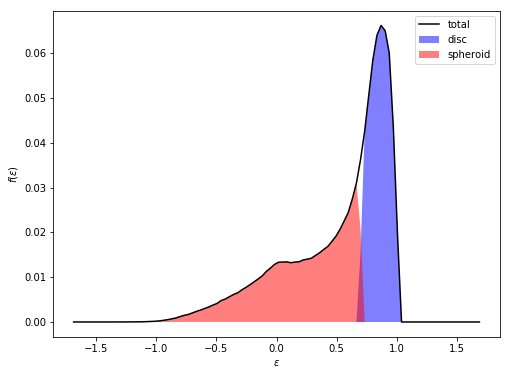

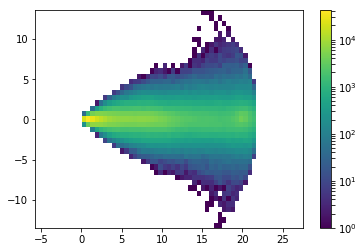

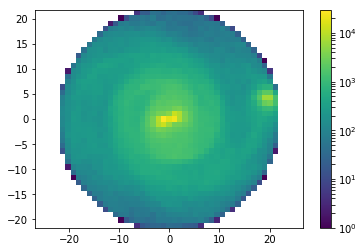

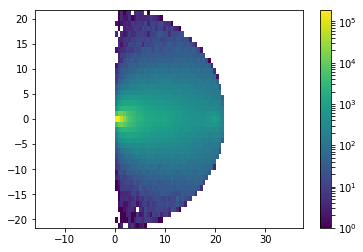

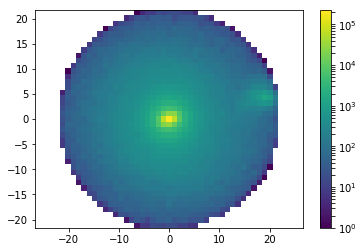

Start MND fit at 14:21:31.382662


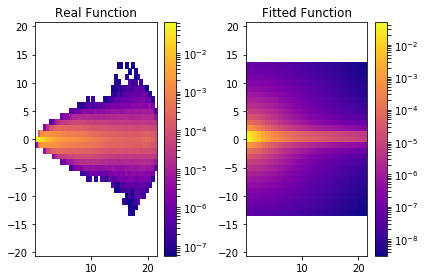

MND: a[kpc], b[kpc], vcirc [km/s]: 1.043240325 0.19416149813 130.266833326


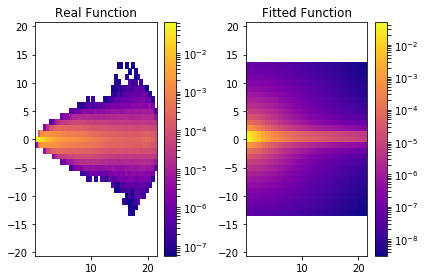

Start HB fit at 14:21:43.989743


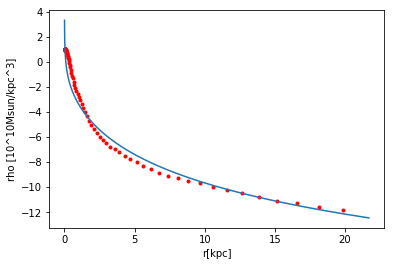

HB: a[kpc], vcirc [km/s]: 2.2293392723 104.781904312


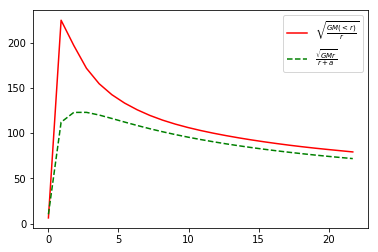

130.266833326 104.781904312
v0_circ_tot = 215.523586123


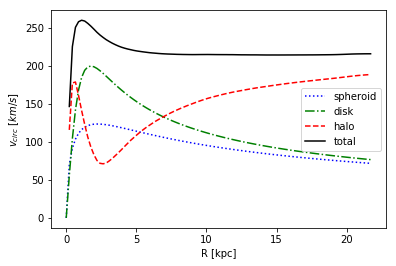

(1.0432403250040458, 0.1941614981304739, 2.2293392723017109, 130.26683332584551, 104.78190431201386, array([ 14.08421707,   5.00180006,  12.84955502, ...,  18.96166229,
         2.79458427,  14.26877689], dtype=float32), array([-10.38100338,  -9.7941761 ,   3.6855135 , ...,  -2.26974249,
        -2.01530981,  -4.10005569], dtype=float32), array([-156343.75    , -171402.046875, -169250.875   , ..., -155618.53125 ,
       -218660.      , -164575.09375 ]), 7.2354455788930254)


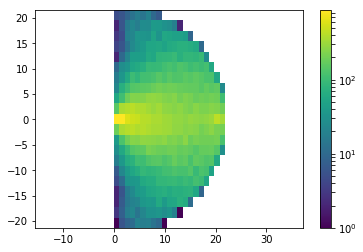

10 (10,)
[  1.08000000e+02   7.23544558e+00   1.98340934e+02   1.04324033e+00
   1.94161498e-01   2.22933927e+00   4.43912329e+01   1.30266833e+02
   1.04781904e+02   1.06725961e+02]
Snapshot =  108
v0_tot_kms at R0_kpc = 7.23544557889 : 198.340934057
Stellar Disk - a_MND_kpc = 1.043240325 b_MND_kpc = 0.19416149813 v0_MND_kms = 130.266833326
Stellar Spheroid - a_HB_kp c= 2.2293392723 v0_HB_kms = 104.781904312
DM Halo - a_NFWH_kpc = 44.3912328785 v0_NFWH_kms = 106.725961164
snapnr  : 109
14:23:58.632065
[ 27.62681198  26.61546135  29.52968025]
Found 1597012 stars.
Rotated pos.
Rotated vel.

galrad  : 0.022122310101985933
redshift: 0.24354018155467028
time    : 0.8041557601699713
center  : [ 0.  0.  0.]

computing star properties
computing histograms


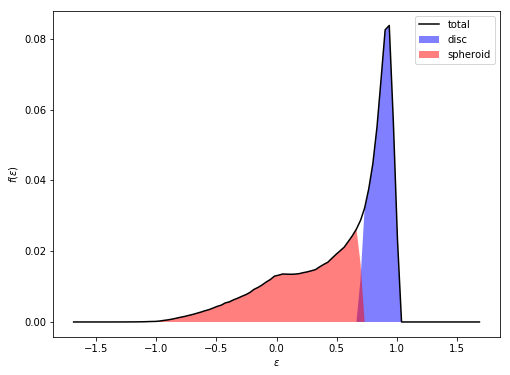

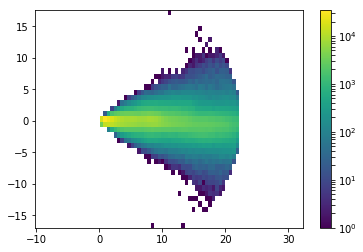

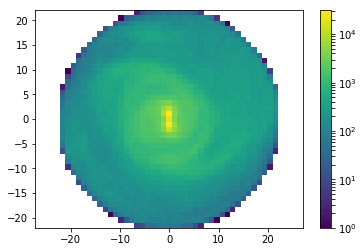

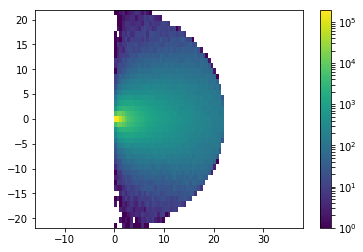

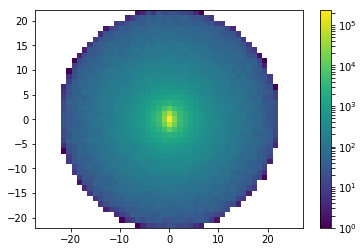

Start MND fit at 14:25:25.777772


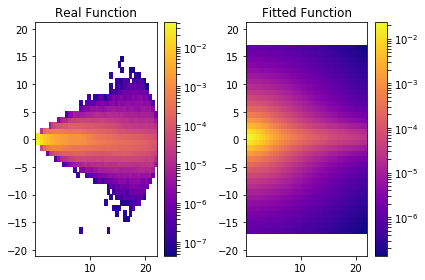

MND: a[kpc], b[kpc], vcirc [km/s]: 1.80086996335 1.67153067569 113.727684834


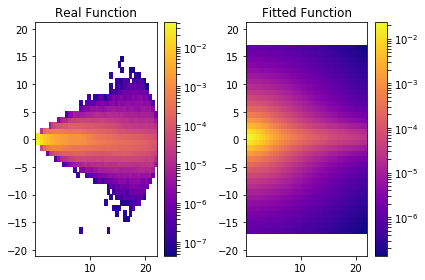

Start HB fit at 14:25:40.073143


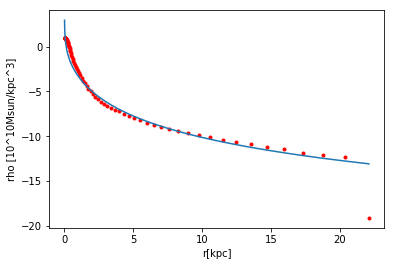

HB: a[kpc], vcirc [km/s]: 1.54851924652 109.991261639


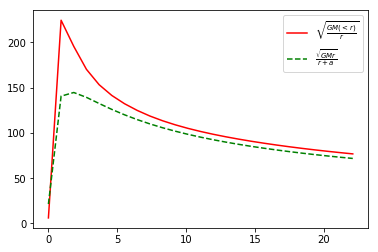

113.727684834 109.991261639
v0_circ_tot = 215.272329851


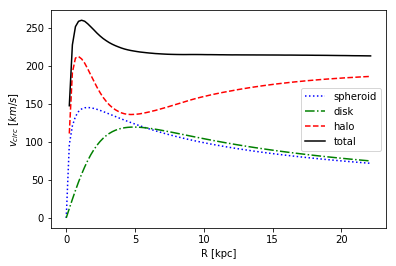

(1.8008699633465042, 1.6715306756945221, 1.548519246517047, 113.72768483399419, 109.99126163887749, array([  8.03065777,  14.47384739,  14.22230911, ...,   7.82646322,
         6.88650846,   6.4035964 ], dtype=float32), array([  2.72482824,   5.22046709, -14.27980709, ...,  -5.87117147,
         1.69695961,  -8.21704483], dtype=float32), array([-188938.75    , -165494.09375 , -151196.234375, ..., -179672.53125 ,
       -194780.265625, -176514.796875]), 7.3741033673286438)


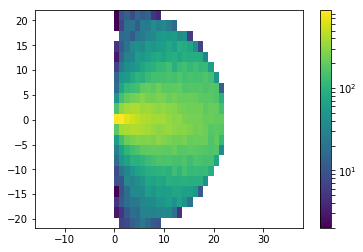

10 (10,)
[ 109.            7.37410337  201.98382691    1.80086996    1.67153068
    1.54851925   32.26061946  113.72768483  109.99126164  125.56035361]
Snapshot =  109
v0_tot_kms at R0_kpc = 7.37410336733 : 201.98382691
Stellar Disk - a_MND_kpc = 1.80086996335 b_MND_kpc = 1.67153067569 v0_MND_kms = 113.727684834
Stellar Spheroid - a_HB_kp c= 1.54851924652 v0_HB_kms = 109.991261639
DM Halo - a_NFWH_kpc = 32.2606194626 v0_NFWH_kms = 125.56035361
snapnr  : 110
14:27:54.003039
[ 28.02821541  26.99830246  29.98339081]
Found 1596516 stars.
Rotated pos.
Rotated vel.

galrad  : 0.022285720705986025
redshift: 0.22598838626019768
time    : 0.8156684118765909
center  : [ 0.  0.  0.]

computing star properties
computing histograms


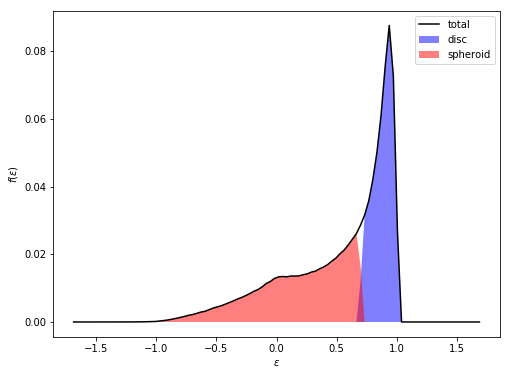

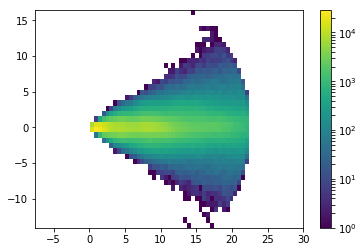

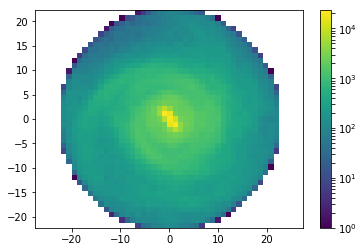

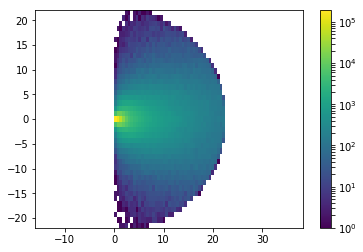

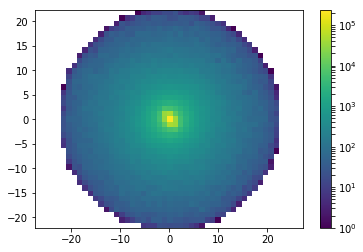

Start MND fit at 14:29:26.172409


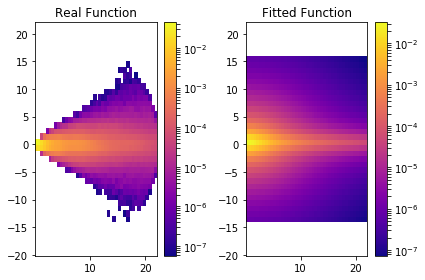

MND: a[kpc], b[kpc], vcirc [km/s]: 2.31287908411 1.04771723168 114.205859859


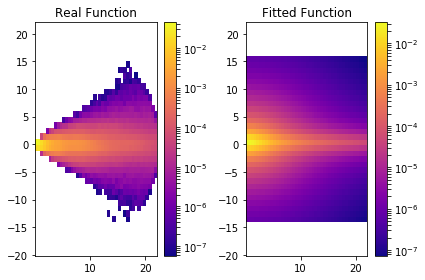

Start HB fit at 14:29:39.293296


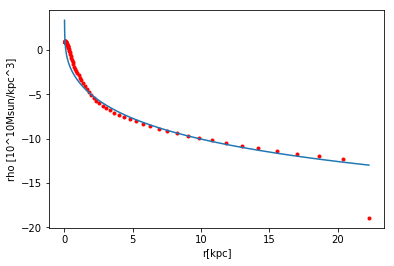

HB: a[kpc], vcirc [km/s]: 1.89289222601 105.672213986


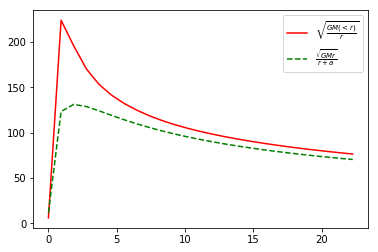

114.205859859 105.672213986
v0_circ_tot = 214.637410339


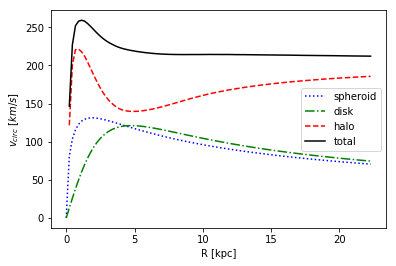

(2.3128790841077747, 1.0477172316751624, 1.8928922260053276, 114.20585985948674, 105.67221398596259, array([ 18.38909912,   3.41026998,   2.0547998 , ...,   3.31929421,
        10.58816242,  11.19485569], dtype=float32), array([  8.88008976,   3.35490775,  -3.13529468, ...,  16.19572067,
        -3.37288022,  -6.10883808], dtype=float32), array([-155436.96875 , -209112.34375 , -216186.34375 , ..., -158687.484375,
       -179540.1875  , -172611.546875]), 7.4285735686620082)


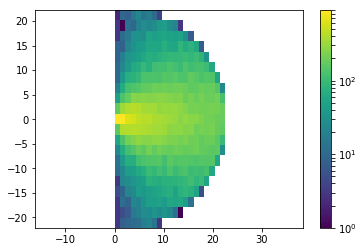

10 (10,)
[ 110.            7.42857357  203.92775335    2.31287908    1.04771723
    1.89289223   29.59835001  114.20585986  105.67221399  131.82159669]
Snapshot =  110
v0_tot_kms at R0_kpc = 7.42857356866 : 203.927753353
Stellar Disk - a_MND_kpc = 2.31287908411 b_MND_kpc = 1.04771723168 v0_MND_kms = 114.205859859
Stellar Spheroid - a_HB_kp c= 1.89289222601 v0_HB_kms = 105.672213986
DM Halo - a_NFWH_kpc = 29.598350007 v0_NFWH_kms = 131.821596686
snapnr  : 111
14:31:43.793928
[ 28.29884148  27.25717163  30.28975487]
Found 1611388 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02241901010274887
redshift: 0.21442503551449454
time    : 0.823434934850752
center  : [ 0.  0.  0.]

computing star properties
computing histograms


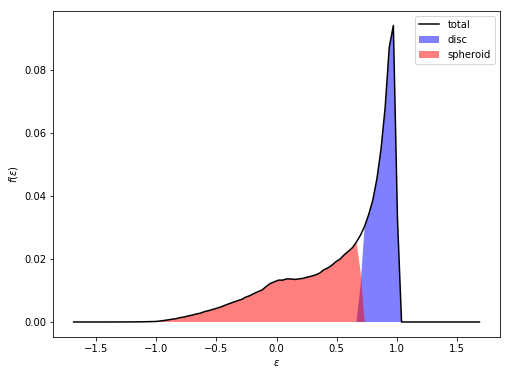

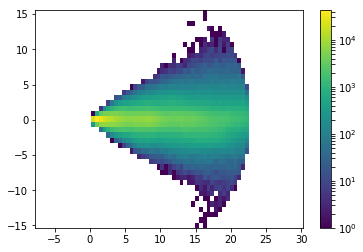

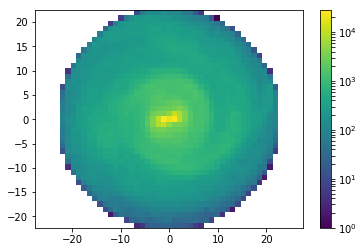

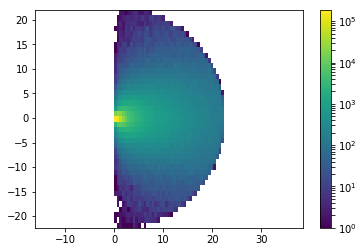

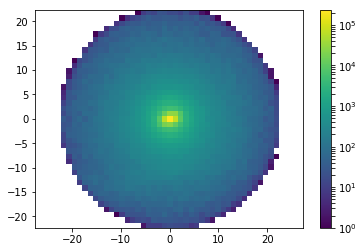

Start MND fit at 14:33:40.479523


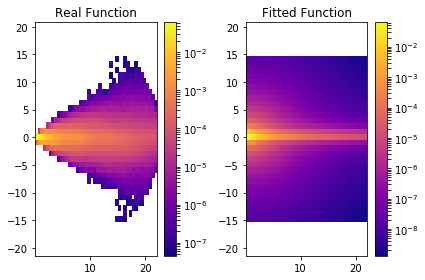

MND: a[kpc], b[kpc], vcirc [km/s]: 1.23455165167 0.148207598144 128.463584465


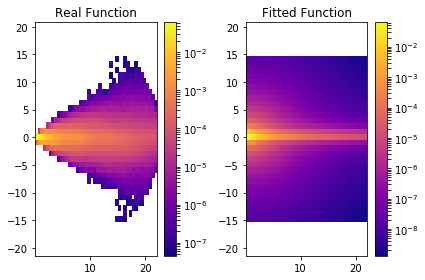

Start HB fit at 14:33:55.276924


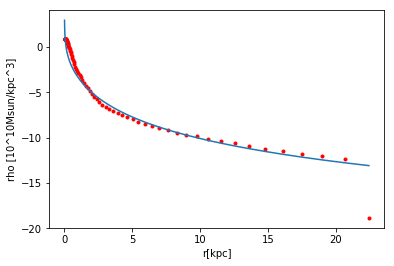

HB: a[kpc], vcirc [km/s]: 1.62798649116 108.725699593


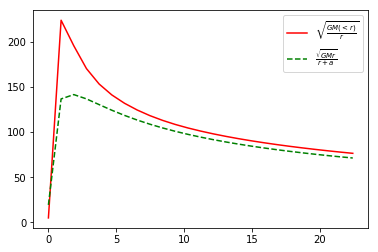

128.463584465 108.725699593
v0_circ_tot = 214.476613901


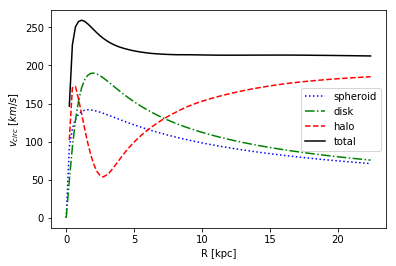

(1.2345516516744712, 0.14820759814396248, 1.6279864911565936, 128.46358446477225, 108.72569959339565, array([ 11.71924973,  11.49221611,  19.00831413, ...,   5.94319057,
        16.55187607,   0.64719379], dtype=float32), array([ -0.36021882,   2.05031371,   2.57447863, ...,   9.69515991,
        12.9611845 ,   5.3063426 ], dtype=float32), array([-181957.90625 , -181144.265625, -163075.890625, ..., -176454.      ,
       -154111.734375, -205187.703125]), 7.4730033675829564)


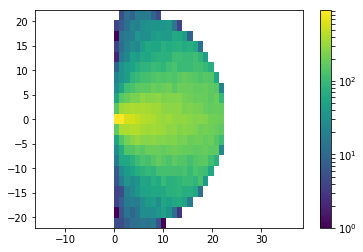

10 (10,)
[  1.11000000e+02   7.47300337e+00   2.02374989e+02   1.23455165e+00
   1.48207598e-01   1.62798649e+00   4.25032044e+01   1.28463584e+02
   1.08725700e+02   1.12389795e+02]
Snapshot =  111
v0_tot_kms at R0_kpc = 7.47300336758 : 202.374989392
Stellar Disk - a_MND_kpc = 1.23455165167 b_MND_kpc = 0.148207598144 v0_MND_kms = 128.463584465
Stellar Spheroid - a_HB_kp c= 1.62798649116 v0_HB_kms = 108.725699593
DM Halo - a_NFWH_kpc = 42.5032044317 v0_NFWH_kms = 112.389795114
snapnr  : 112
14:37:38.649523
[ 28.71037102  27.65019417  30.75450516]
Found 1681756 stars.
Rotated pos.
Rotated vel.

galrad  : 0.022649659216403963
redshift: 0.19728418237600986
time    : 0.8352235958012078
center  : [ 0.  0.  0.]

computing star properties
computing histograms


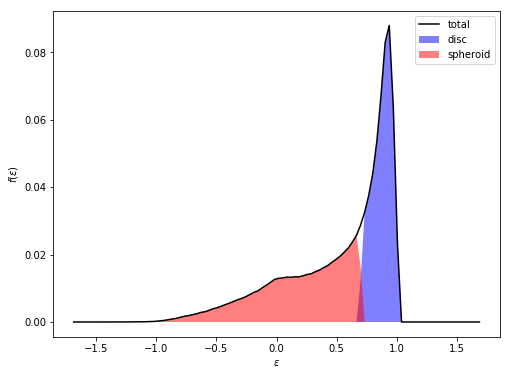

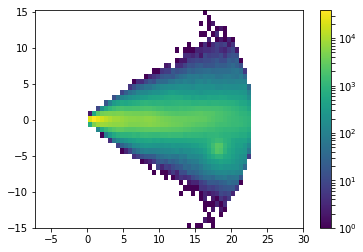

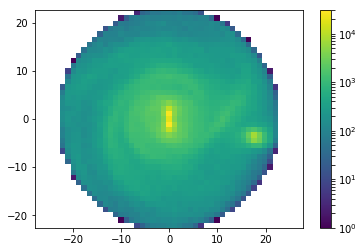

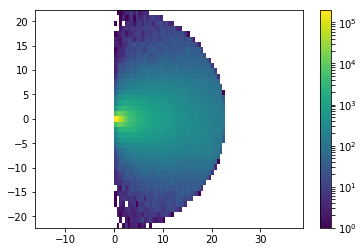

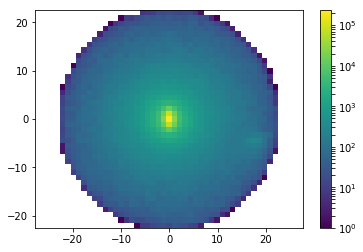

Start MND fit at 14:40:21.572581


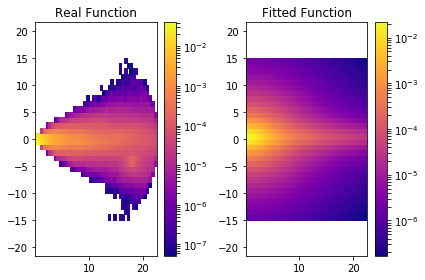

MND: a[kpc], b[kpc], vcirc [km/s]: 2.08522104764 1.61373019649 114.778872112


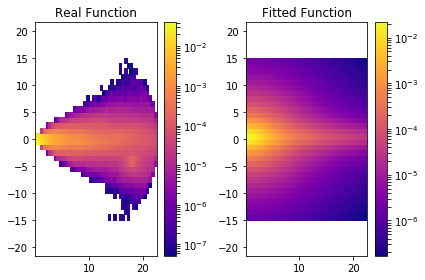

Start HB fit at 14:40:34.265122


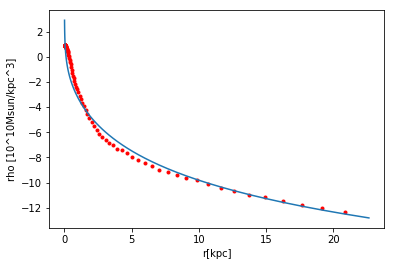

HB: a[kpc], vcirc [km/s]: 1.86846515116 106.918734524


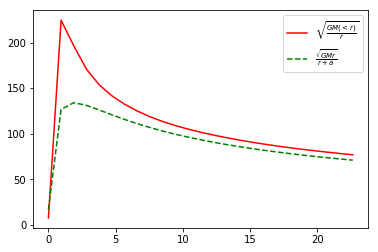

114.778872112 106.918734524
v0_circ_tot = 214.551684875


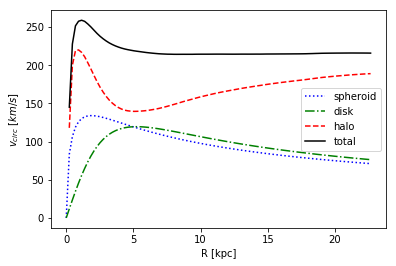

(2.0852210476370794, 1.6137301964936317, 1.8684651511641139, 114.77887211152955, 106.91873452424493, array([  0.58449501,  10.34943295,   3.54710126, ...,   8.27125263,
         2.13392258,   5.04924631], dtype=float32), array([-4.13329792, -6.10241556,  2.64338827, ..., -2.19301391,
        3.48037624, -3.54491401], dtype=float32), array([-220167.328125, -181756.578125, -220651.640625, ..., -197732.796875,
       -221413.78125 , -207430.34375 ]), 7.5498864054679871)


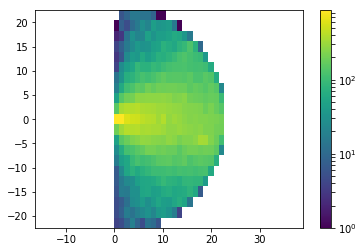

10 (10,)
[ 112.            7.54988641  205.62483816    2.08522105    1.6137302
    1.86846515   30.6792653   114.77887211  106.91873452  132.95024932]
Snapshot =  112
v0_tot_kms at R0_kpc = 7.54988640547 : 205.624838162
Stellar Disk - a_MND_kpc = 2.08522104764 b_MND_kpc = 1.61373019649 v0_MND_kms = 114.778872112
Stellar Spheroid - a_HB_kp c= 1.86846515116 v0_HB_kms = 106.918734524
DM Halo - a_NFWH_kpc = 30.6792652966 v0_NFWH_kms = 132.950249317
snapnr  : 113
14:42:43.091454
[ 29.12677383  28.04948807  31.22624779]
Found 1636296 stars.
Rotated pos.
Rotated vel.

galrad  : 0.022813534736633303
redshift: 0.1803852617057493
time    : 0.8471810284677068
center  : [ 0.  0.  0.]

computing star properties
computing histograms


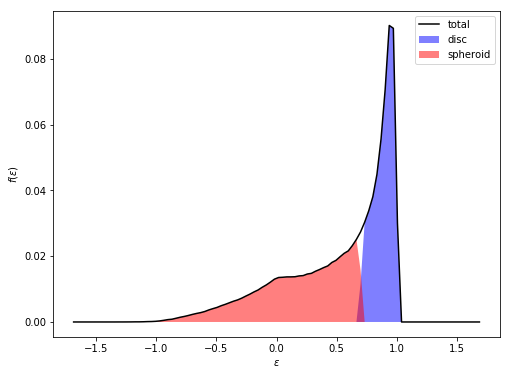

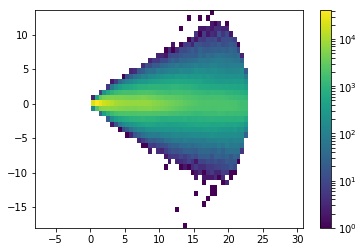

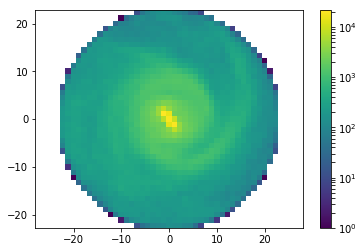

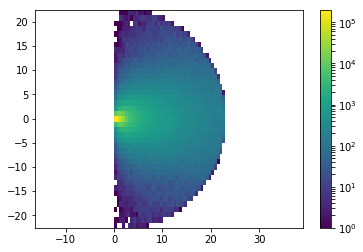

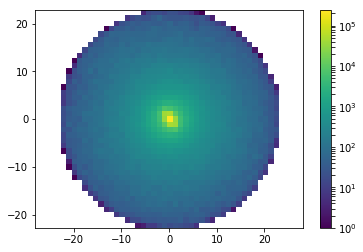

Start MND fit at 14:44:14.515435


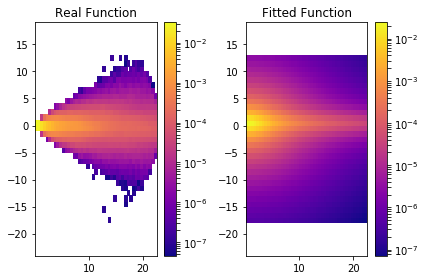

MND: a[kpc], b[kpc], vcirc [km/s]: 2.30454606316 1.31588963199 112.404747003


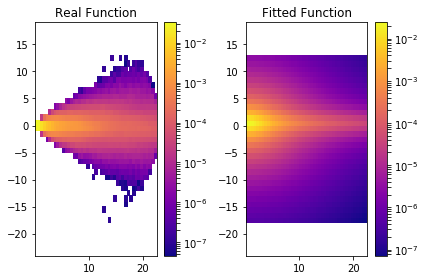

Start HB fit at 14:44:28.489477


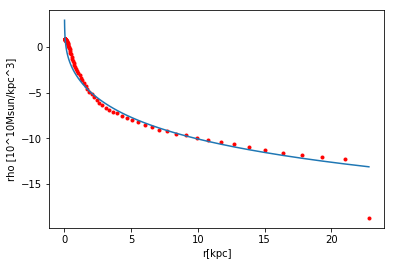

HB: a[kpc], vcirc [km/s]: 1.66428404706 108.594372915


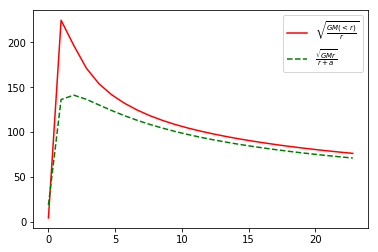

112.404747003 108.594372915
v0_circ_tot = 214.199013263


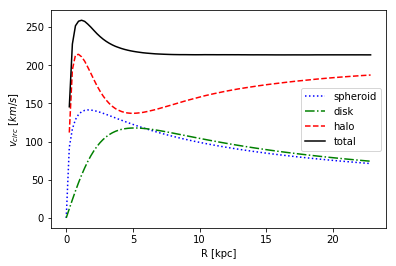

(2.3045460631610788, 1.3158896319879292, 1.6642840470618376, 112.40474700337344, 108.59437291516453, array([ 10.38746548,   5.13597918,   5.10246325, ...,  18.01234818,
         6.0463028 ,  11.21605492], dtype=float32), array([  2.12873197,  -1.09769392,  -4.23700237, ...,   0.24009404,
        -2.55335951, -16.49938011], dtype=float32), array([-190780.984375, -218796.390625, -205618.546875, ..., -170973.859375,
       -208753.578125, -160593.265625]), 7.6045115788777675)


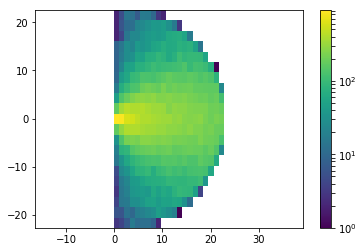

10 (10,)
[ 113.            7.60451158  205.94009982    2.30454606    1.31588963
    1.66428405   30.70648669  112.404747    108.59437292  134.1035411 ]
Snapshot =  113
v0_tot_kms at R0_kpc = 7.60451157888 : 205.940099818
Stellar Disk - a_MND_kpc = 2.30454606316 b_MND_kpc = 1.31588963199 v0_MND_kms = 112.404747003
Stellar Spheroid - a_HB_kp c= 1.66428404706 v0_HB_kms = 108.594372915
DM Halo - a_NFWH_kpc = 30.7064866871 v0_NFWH_kms = 134.103541099
snapnr  : 114
14:46:58.163599
[ 29.40730476  28.31895065  31.54471207]
Found 1680675 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02292117774486542
redshift: 0.1692520332436107
time    : 0.8552476040823377
center  : [ 0.  0.  0.]

computing star properties
computing histograms


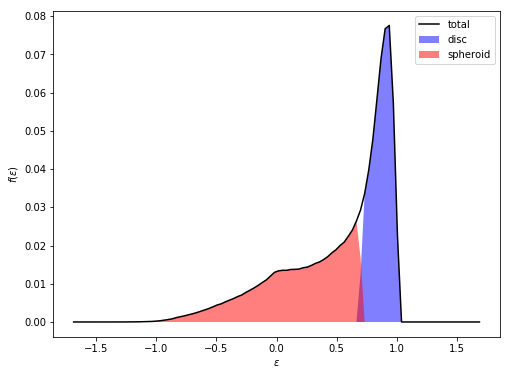

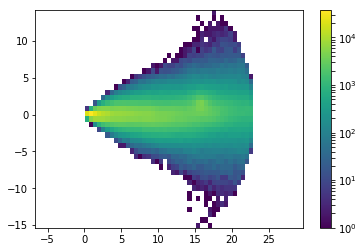

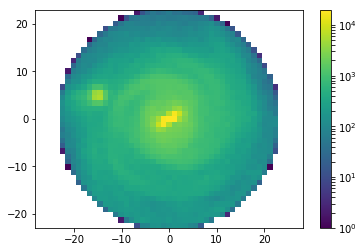

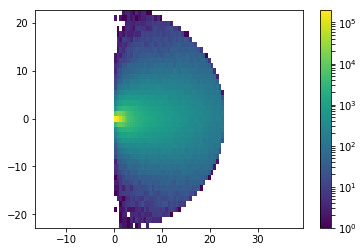

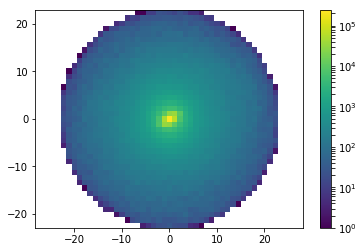

Start MND fit at 14:48:36.350257


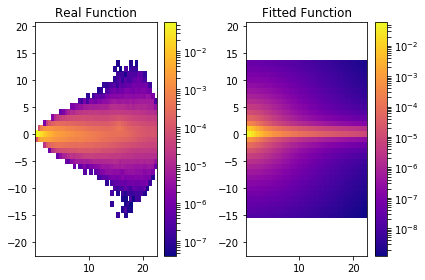

MND: a[kpc], b[kpc], vcirc [km/s]: 1.11106097167 0.147921296353 129.759158208


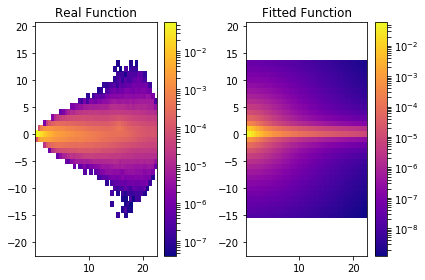

Start HB fit at 14:48:49.336398


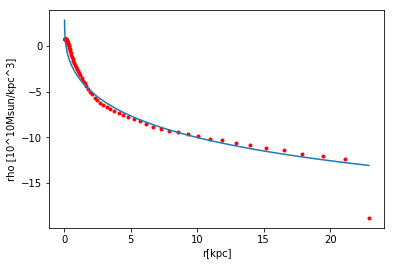

HB: a[kpc], vcirc [km/s]: 1.6826258591 109.541662912


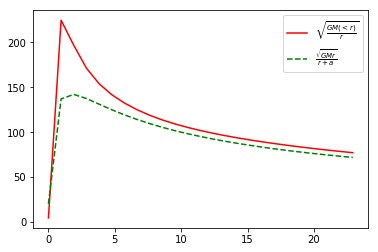

129.759158208 109.541662912
v0_circ_tot = 213.528143718


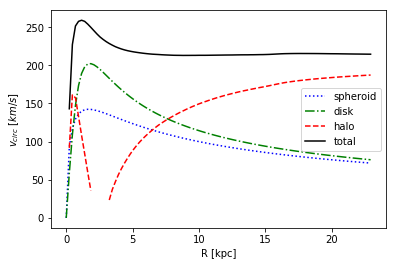

(1.1110609716695667, 0.14792129635315332, 1.6826258591032106, 129.759158208423, 109.54166291212644, array([ 5.54479837,  8.67647457,  7.97815561, ...,  1.07264173,
        3.54806495,  6.41196346], dtype=float32), array([ -7.0305481 ,  19.39189529,   5.07678366, ...,  -0.59146386,
         7.99434519,  -6.86265039], dtype=float32), array([-193507.5     , -157312.765625, -193889.4375  , ..., -292952.40625 ,
       -193288.59375 , -192747.265625]), 7.6403925816218061)


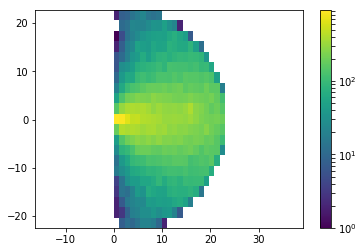

10 (10,)
[  1.14000000e+02   7.64039258e+00   2.03980707e+02   1.11106097e+00
   1.47921296e-01   1.68262586e+00   4.47452748e+01   1.29759158e+02
   1.09541663e+02   1.13010238e+02]
Snapshot =  114
v0_tot_kms at R0_kpc = 7.64039258162 : 203.980707321
Stellar Disk - a_MND_kpc = 1.11106097167 b_MND_kpc = 0.147921296353 v0_MND_kms = 129.759158208
Stellar Spheroid - a_HB_kp c= 1.6826258591 v0_HB_kms = 109.541662912
DM Halo - a_NFWH_kpc = 44.7452747829 v0_NFWH_kms = 113.010238061
snapnr  : 115
14:51:05.528297
[ 29.83269691  28.72842789  32.02832794]
Found 1689680 stars.
Rotated pos.
Rotated vel.

galrad  : 0.023059283196926118
redshift: 0.15274876890238098
time    : 0.8674917093619414
center  : [ 0.  0.  0.]

computing star properties
computing histograms


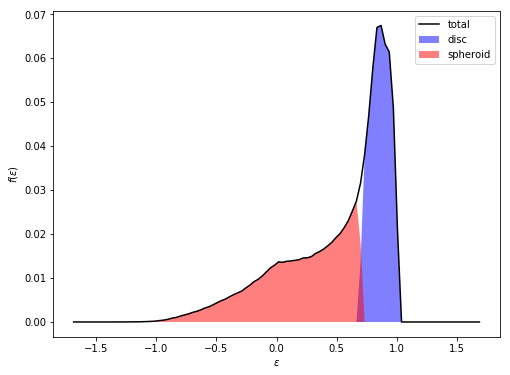

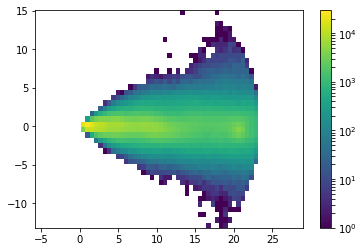

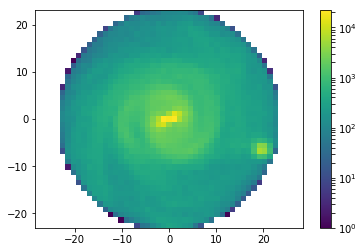

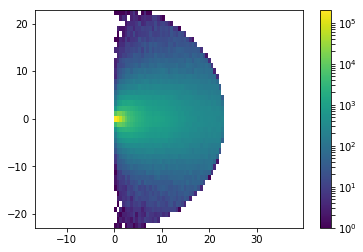

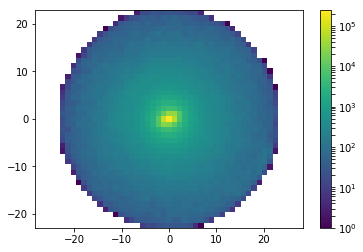

Start MND fit at 14:52:34.726010


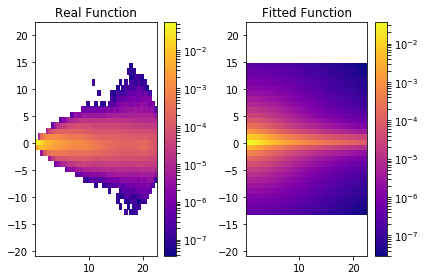

MND: a[kpc], b[kpc], vcirc [km/s]: 2.90579318322 0.614259845457 113.568096798


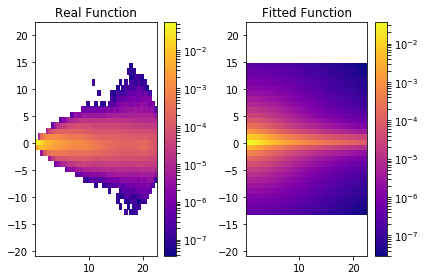

Start HB fit at 14:52:46.453295


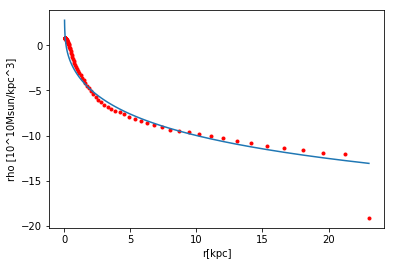

HB: a[kpc], vcirc [km/s]: 1.67442437871 110.627849848


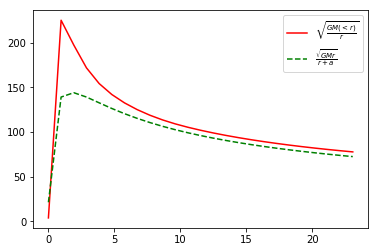

113.568096798 110.627849848
v0_circ_tot = 213.484012616


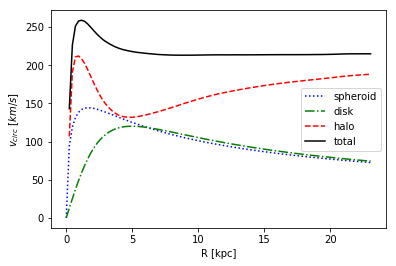

(2.9057931832241621, 0.6142598454568714, 1.6744243787071786, 113.56809679787906, 110.62784984769519, array([ 15.49187374,  17.81812477,  13.2025404 , ...,  15.56560516,
         9.61178875,  20.26935577], dtype=float32), array([ -4.56418848,   2.24326754,  -2.78805923, ...,   8.3881073 ,
       -18.68521881,   4.42284107], dtype=float32), array([-176967.71875 , -172856.46875 , -184289.59375 , ..., -170875.15625 ,
       -159025.828125, -167577.71875 ]), 7.6864277323087054)


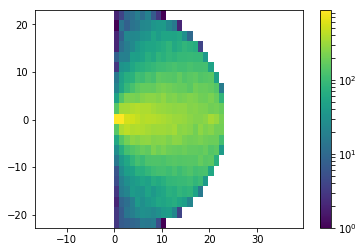

10 (10,)
[ 115.            7.68642773  208.23718383    2.90579318    0.61425985
    1.67442438   31.15186951  113.5680968   110.62784985  135.00552196]
Snapshot =  115
v0_tot_kms at R0_kpc = 7.68642773231 : 208.237183834
Stellar Disk - a_MND_kpc = 2.90579318322 b_MND_kpc = 0.614259845457 v0_MND_kms = 113.568096798
Stellar Spheroid - a_HB_kp c= 1.67442437871 v0_HB_kms = 110.627849848
DM Halo - a_NFWH_kpc = 31.151869515 v0_NFWH_kms = 135.005521956
snapnr  : 116
14:55:05.370040
[ 30.11922264  29.0051918   32.35468674]
Found 1690508 stars.
Rotated pos.
Rotated vel.

galrad  : 0.023121218383312228
redshift: 0.14187620396956202
time    : 0.8757516765159388
center  : [ 0.  0.  0.]

computing star properties
computing histograms


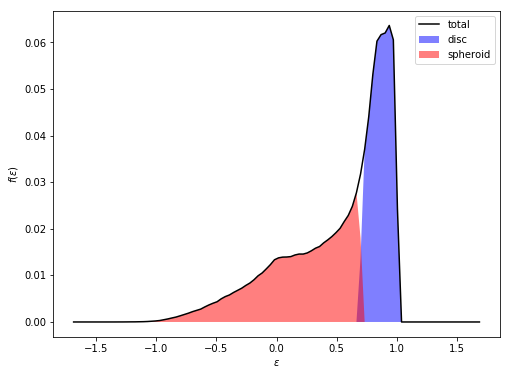

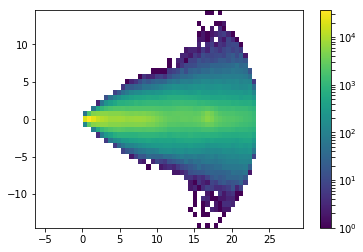

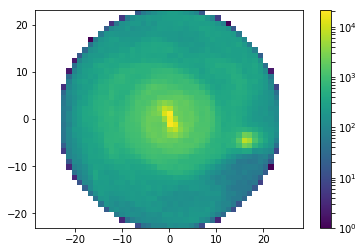

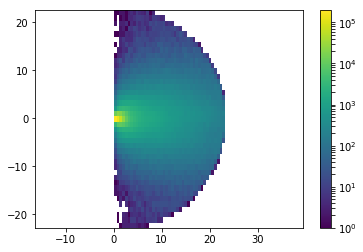

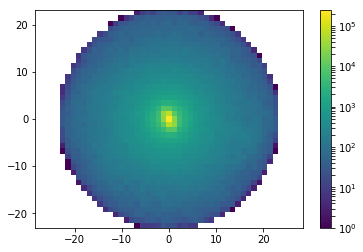

Start MND fit at 14:56:37.992495


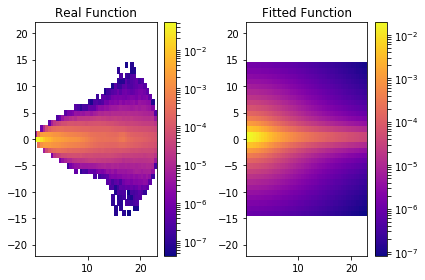

MND: a[kpc], b[kpc], vcirc [km/s]: 2.54018573487 1.14477040611 111.40837454


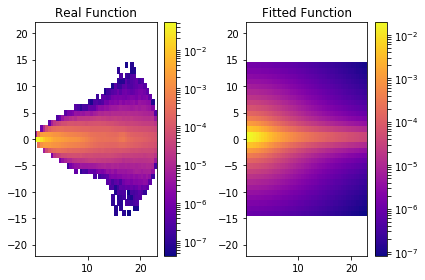

Start HB fit at 14:56:51.066803


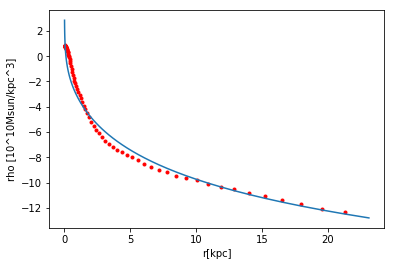

HB: a[kpc], vcirc [km/s]: 1.98006887159 107.54536794


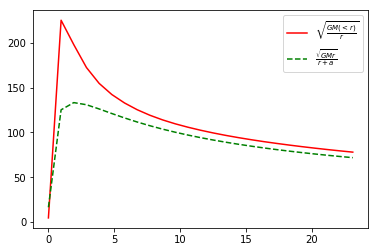

111.40837454 107.54536794
v0_circ_tot = 213.855002122


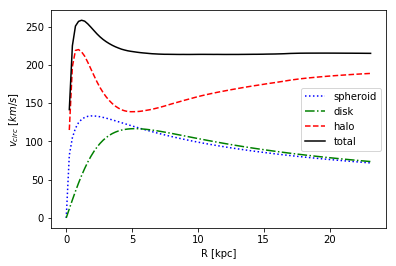

(2.5401857348730958, 1.1447704061143837, 1.9800688715897994, 111.40837454014826, 107.54536793994826, array([  9.30160141,  16.09095383,   6.95849848, ...,   4.10274506,
        22.70261383,  16.64235306], dtype=float32), array([ -4.00150681,   1.24174726,  10.88548279, ...,   4.07887173,
         3.77156019,   0.17637239], dtype=float32), array([-196487.0625  , -179486.8125  , -182146.96875 , ..., -216835.546875,
       -164283.671875, -185169.078125]), 7.7070727944374093)


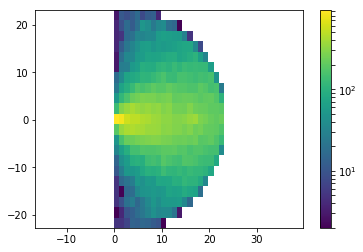

10 (10,)
[ 116.            7.70707279  209.42090528    2.54018573    1.14477041
    1.98006887   28.70065739  111.40837454  107.54536794  140.99391294]
Snapshot =  116
v0_tot_kms at R0_kpc = 7.70707279444 : 209.420905282
Stellar Disk - a_MND_kpc = 2.54018573487 b_MND_kpc = 1.14477040611 v0_MND_kms = 111.40837454
Stellar Spheroid - a_HB_kp c= 1.98006887159 v0_HB_kms = 107.54536794
DM Halo - a_NFWH_kpc = 28.7006573869 v0_NFWH_kms = 140.993912941
snapnr  : 117
14:58:58.588168
[ 30.55345726  29.42549706  32.85093689]
Found 1709507 stars.
Rotated pos.
Rotated vel.

galrad  : 0.023094582557678225
redshift: 0.12575933241126092
time    : 0.8882893272206793
center  : [ 0.  0.  0.]

computing star properties
computing histograms


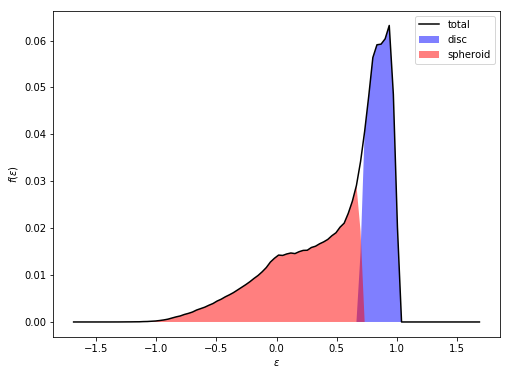

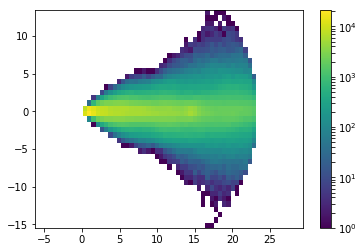

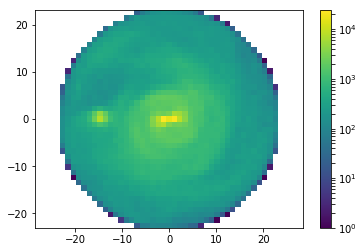

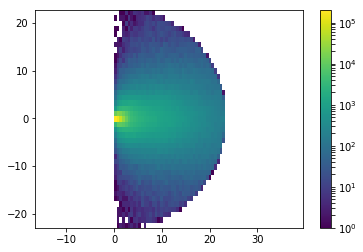

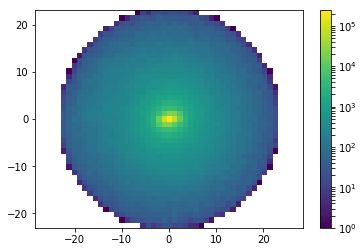

Start MND fit at 15:00:29.381855


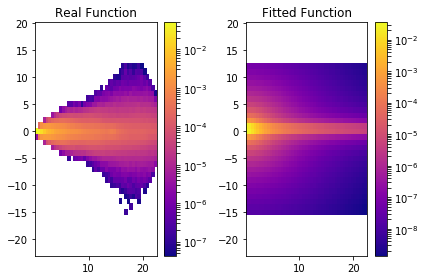

MND: a[kpc], b[kpc], vcirc [km/s]: 1.01866313289 -0.160744462856 127.068623627


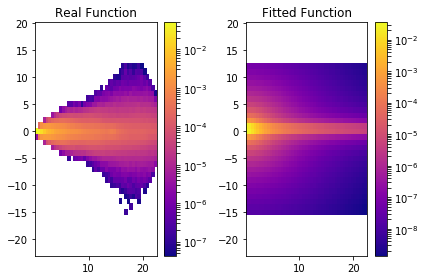

Start HB fit at 15:00:43.589037


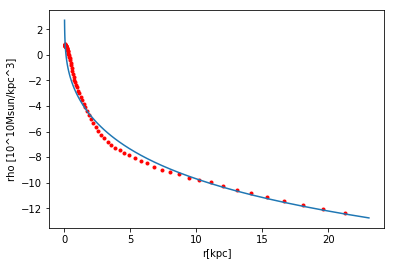

HB: a[kpc], vcirc [km/s]: 1.9392212499 109.539402093


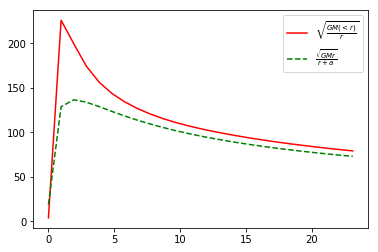

127.068623627 109.539402093
v0_circ_tot = 213.098967635


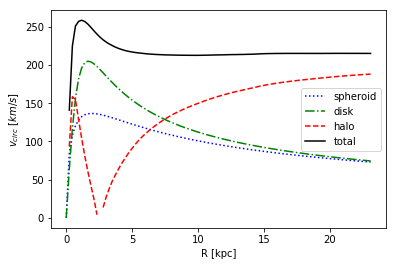

(1.0186631328856026, -0.16074446285596661, 1.9392212498986177, 127.06862362660877, 109.53940209289078, array([  5.91470957,  12.03499413,   7.05493116, ...,   9.31287003,
         6.82820415,   0.10094737], dtype=float32), array([  8.45553017,  -9.62892532,   8.4107666 , ...,  -1.59733546,
        13.18749619,   0.896622  ], dtype=float32), array([-194891.109375, -179461.4375  , -192561.703125, ..., -204224.109375,
       -178237.53125 , -306902.125   ]), 7.6981941858927412)


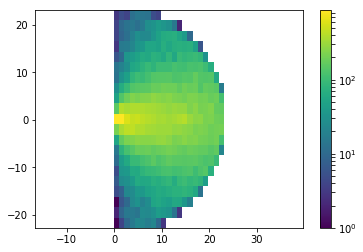

10 (10,)
[  1.17000000e+02   7.69819419e+00   3.68296911e+02   1.01866313e+00
  -1.60744463e-01   1.93922125e+00   3.12197437e+02   1.27068624e+02
   1.09539402e+02   3.27867808e+02]
Snapshot =  117
v0_tot_kms at R0_kpc = 7.69819418589 : 368.296911361
Stellar Disk - a_MND_kpc = 1.01866313289 b_MND_kpc = -0.160744462856 v0_MND_kms = 127.068623627
Stellar Spheroid - a_HB_kp c= 1.9392212499 v0_HB_kms = 109.539402093
DM Halo - a_NFWH_kpc = 312.197436689 v0_NFWH_kms = 327.867807503
snapnr  : 118
15:02:49.122487
[ 30.99422073  29.85132217  33.35467911]
Found 1704816 stars.
Rotated pos.
Rotated vel.

galrad  : 0.023015499114990234
redshift: 0.10986994045882548
time    : 0.9010064725120812
center  : [ 0.  0.  0.]

computing star properties
computing histograms


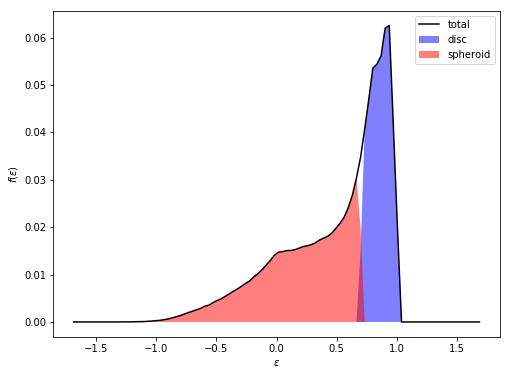

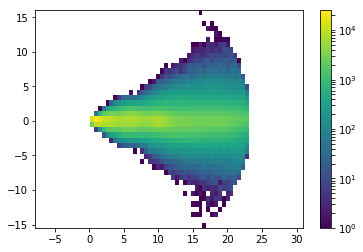

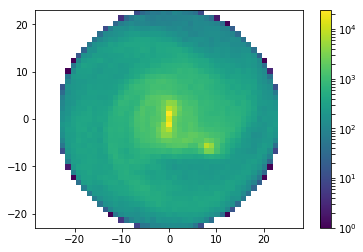

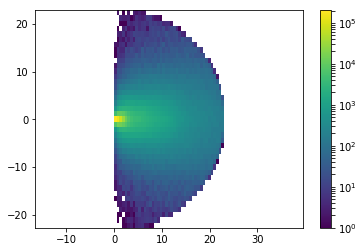

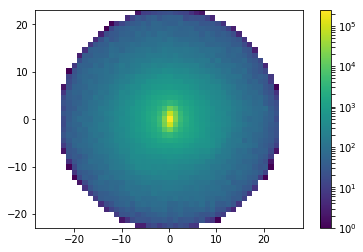

Start MND fit at 15:04:34.065351


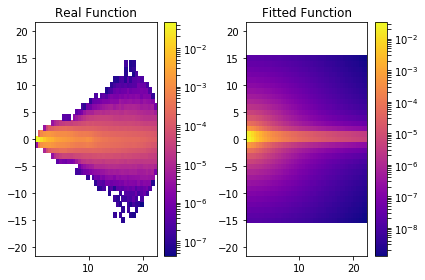

MND: a[kpc], b[kpc], vcirc [km/s]: 1.03645059585 -0.159350488996 124.436773956


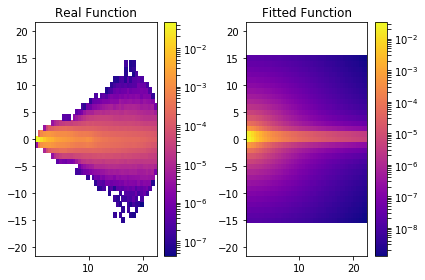

Start HB fit at 15:04:46.021538


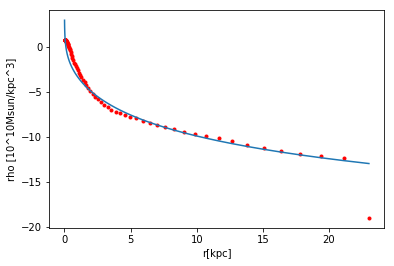

HB: a[kpc], vcirc [km/s]: 1.88255422063 111.969601227


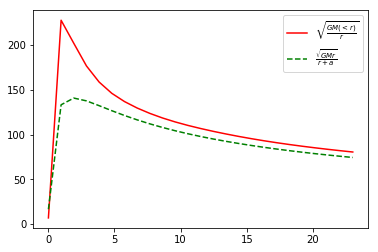

124.436773956 111.969601227
v0_circ_tot = 213.864143808


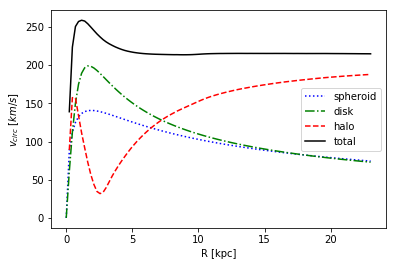

(1.0364505958456935, -0.15935048899636686, 1.8825542206261838, 124.43677395616615, 111.96960122687115, array([ 21.79069328,   1.73835886,   4.72451735, ...,  13.54745865,
        21.63702774,   3.53990984], dtype=float32), array([  5.14754295,  -0.41925517,  12.96141911, ...,  -3.84196877,
         2.93736672,  -0.15181862], dtype=float32), array([-169684.671875, -290358.75    , -183069.609375, ..., -190562.4375  ,
       -171017.625   , -248824.734375]), 7.6718330383300781)


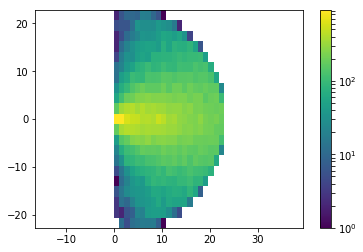

10 (10,)
[  1.18000000e+02   7.67183304e+00   3.27348563e+02   1.03645060e+00
  -1.59350489e-01   1.88255422e+00   2.58999719e+02   1.24436774e+02
   1.11969601e+02   2.81310112e+02]
Snapshot =  118
v0_tot_kms at R0_kpc = 7.67183303833 : 327.348562809
Stellar Disk - a_MND_kpc = 1.03645059585 b_MND_kpc = -0.159350488996 v0_MND_kms = 124.436773956
Stellar Spheroid - a_HB_kp c= 1.88255422063 v0_HB_kms = 111.969601227
DM Halo - a_NFWH_kpc = 258.999719431 v0_NFWH_kms = 281.310112264
snapnr  : 119
15:06:54.689818
[ 31.29102707  30.13891983  33.69516754]
Found 1717424 stars.
Rotated pos.
Rotated vel.

galrad  : 0.023062470555305484
redshift: 0.09940180263022191
time    : 0.9095855560793044
center  : [ 0.  0.  0.]

computing star properties
computing histograms


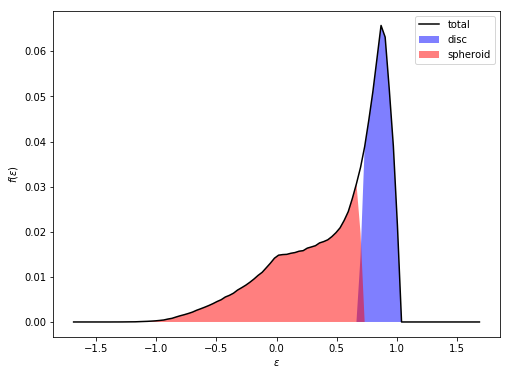

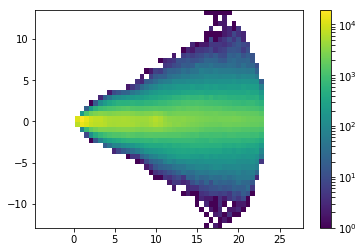

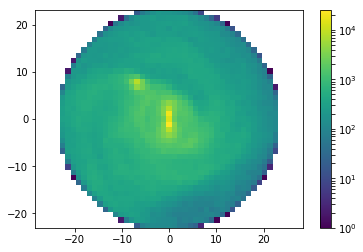

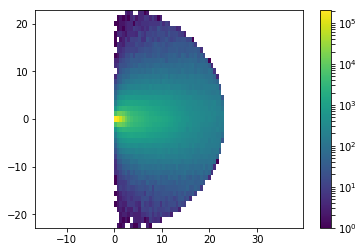

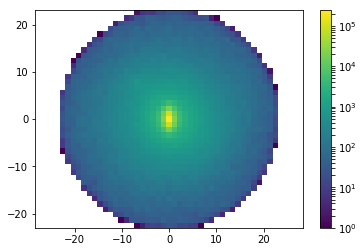

Start MND fit at 15:08:24.736627


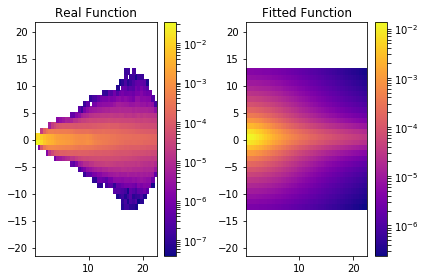

MND: a[kpc], b[kpc], vcirc [km/s]: 2.4740875897 1.73414066476 103.891615616


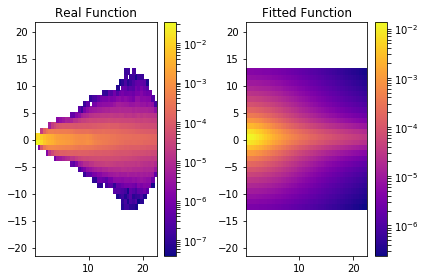

Start HB fit at 15:08:36.766530


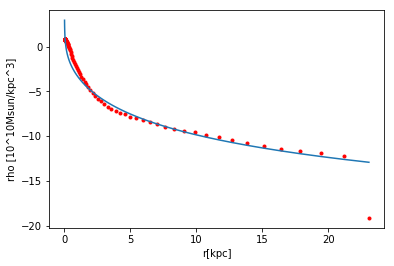

HB: a[kpc], vcirc [km/s]: 1.91050608407 112.322974283


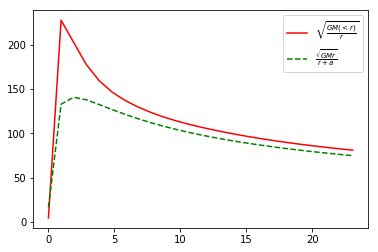

103.891615616 112.322974283
v0_circ_tot = 213.341398823


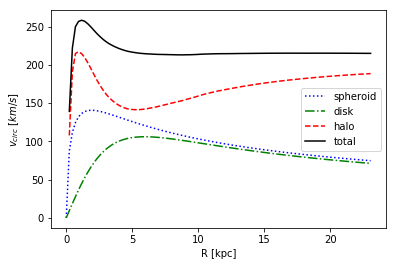

(2.4740875897033394, 1.7341406647596198, 1.9105060840691332, 103.89161561569442, 112.32297428274163, array([  1.35201359,   2.97912097,   4.23175097, ...,  11.34304142,
         1.36499608,   8.92517757], dtype=float32), array([  1.23118365,  11.21181297,   0.75195289, ...,   2.27354741,
         0.42284492,   0.14067429], dtype=float32), array([-284425.625   , -192551.578125, -242010.171875, ..., -203787.96875 ,
       -308565.1875  , -210864.96875 ]), 7.6874901851018276)


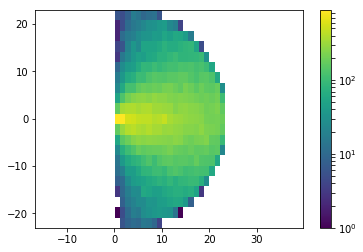

10 (10,)
[ 119.            7.68749019  212.8562058     2.47408759    1.73414066
    1.91050608   26.89116564  103.89161562  112.32297428  147.979208  ]
Snapshot =  119
v0_tot_kms at R0_kpc = 7.6874901851 : 212.856205796
Stellar Disk - a_MND_kpc = 2.4740875897 b_MND_kpc = 1.73414066476 v0_MND_kms = 103.891615616
Stellar Spheroid - a_HB_kp c= 1.91050608407 v0_HB_kms = 112.322974283
DM Halo - a_NFWH_kpc = 26.8911656382 v0_NFWH_kms = 147.979207995
snapnr  : 120
15:10:50.451852
[ 31.74212646  30.57429314  34.21273041]
Found 1726323 stars.
Rotated pos.
Rotated vel.

galrad  : 0.023094923794269563
redshift: 0.08388443079747931
time    : 0.9226075876597282
center  : [ 0.  0.  0.]

computing star properties
computing histograms


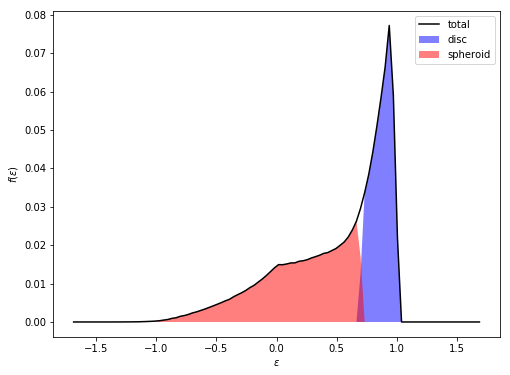

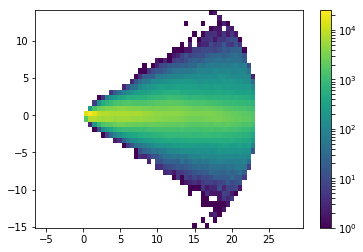

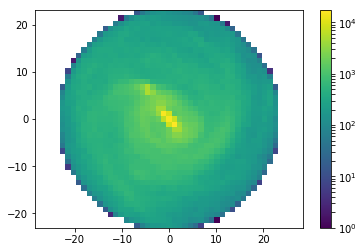

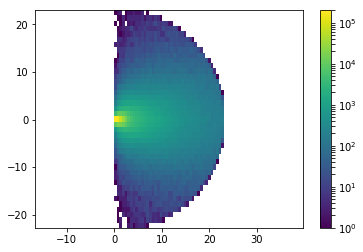

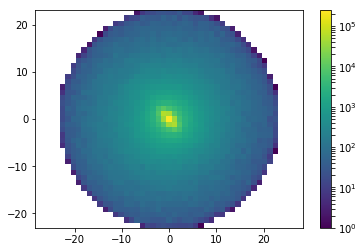

Start MND fit at 15:12:30.072243


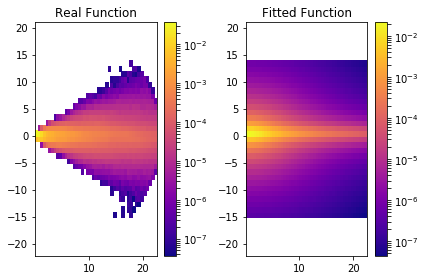

MND: a[kpc], b[kpc], vcirc [km/s]: 3.35684693456 0.839013083726 105.895785671


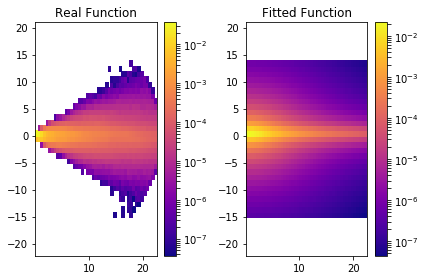

Start HB fit at 15:12:44.146101


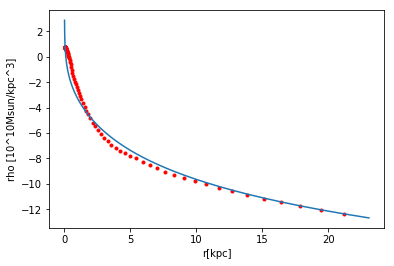

HB: a[kpc], vcirc [km/s]: 2.12344290082 108.601312524


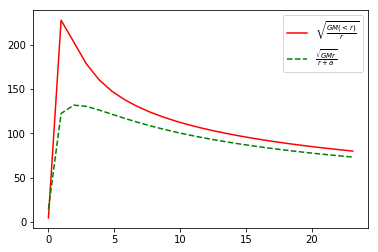

105.895785671 108.601312524
v0_circ_tot = 213.858011273


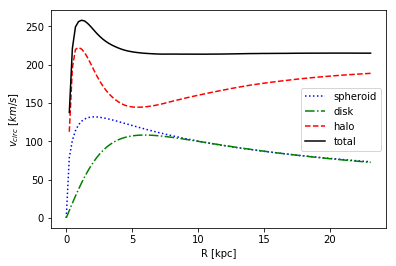

(3.3568469345583622, 0.83901308372569805, 2.123442900818393, 105.89578567099836, 108.60131252362469, array([ 20.70670509,  17.2632103 ,   9.55113316, ...,   5.34443188,
        17.74503326,  17.80364037], dtype=float32), array([-5.36830187,  4.55042887, -7.25717783, ..., -2.99525833,
       -0.4619644 , -9.16873455], dtype=float32), array([-174579.921875, -184371.0625  , -196901.9375  , ..., -226868.90625 ,
       -186674.265625, -176165.25    ]), 7.6983079314231873)


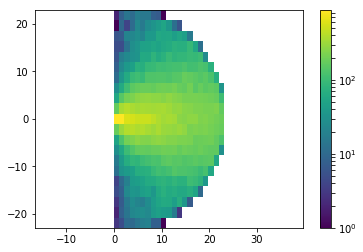

10 (10,)
[ 120.            7.69830793  216.14801208    3.35684693    0.83901308
    2.1234429    24.99202172  105.89578567  108.60131252  153.98636505]
Snapshot =  120
v0_tot_kms at R0_kpc = 7.69830793142 : 216.148012082
Stellar Disk - a_MND_kpc = 3.35684693456 b_MND_kpc = 0.839013083726 v0_MND_kms = 105.895785671
Stellar Spheroid - a_HB_kp c= 2.12344290082 v0_HB_kms = 108.601312524
DM Halo - a_NFWH_kpc = 24.9920217177 v0_NFWH_kms = 153.986365054
snapnr  : 121
15:15:22.374330
[ 32.04627228  30.8679924   34.56239319]
Found 1736454 stars.
Rotated pos.
Rotated vel.

galrad  : 0.023151549696922305
redshift: 0.07366138465643868
time    : 0.9313923498515226
center  : [ 0.  0.  0.]

computing star properties
computing histograms


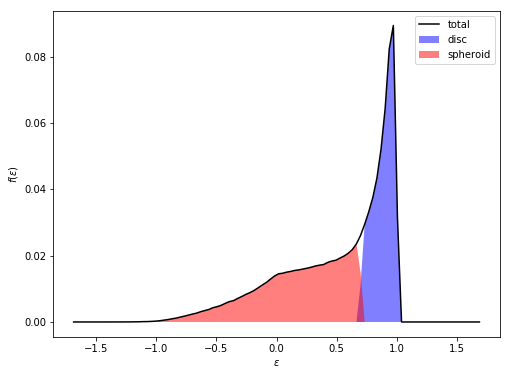

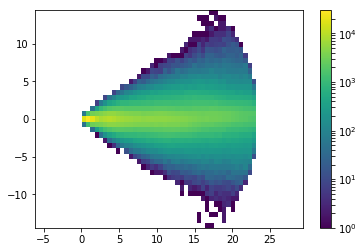

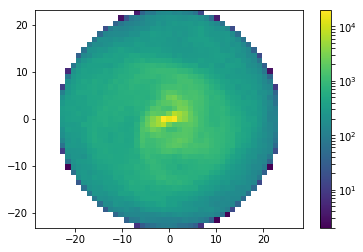

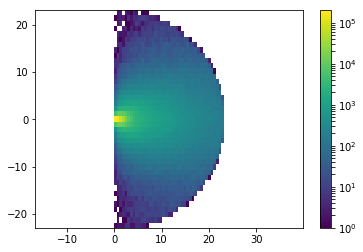

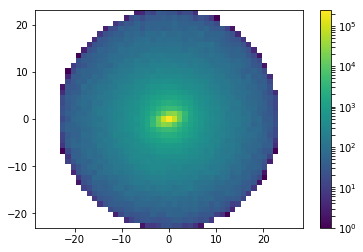

Start MND fit at 15:16:59.619872


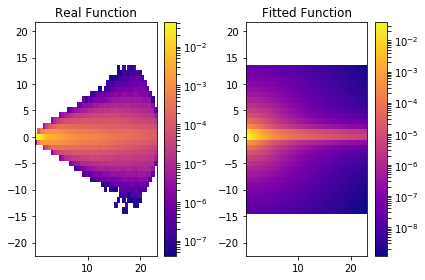

MND: a[kpc], b[kpc], vcirc [km/s]: 1.04718418145 -0.143649365257 128.18426311


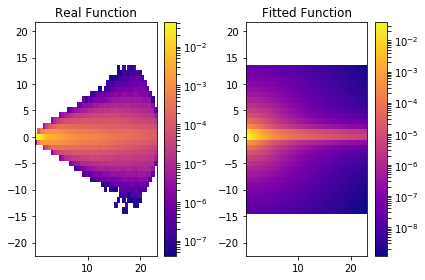

Start HB fit at 15:17:14.355338


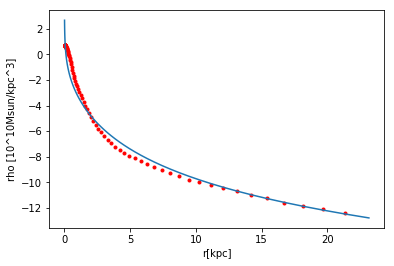

HB: a[kpc], vcirc [km/s]: 1.95926264218 109.405044371


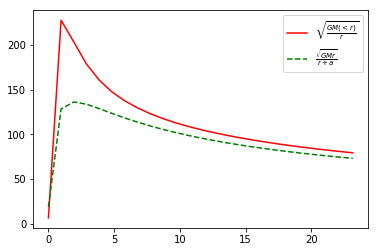

128.18426311 109.405044371
v0_circ_tot = 213.103897386


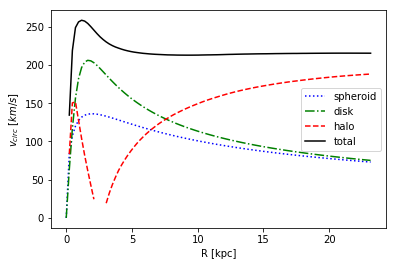

(1.0471841814537735, -0.14364936525663258, 1.9592626421787172, 128.18426311032465, 109.40504437092231, array([  6.21773338,   2.12100768,   4.22506762, ...,   3.10366201,
         7.61414003,  11.43074989], dtype=float32), array([-0.03914605, -3.40275788,  6.04128981, ...,  2.96826959,
        1.24609447, -6.4584918 ], dtype=float32), array([-232461.609375, -244695.359375, -218029.59375 , ..., -242885.25    ,
       -221618.65625 , -196400.75    ]), 7.717183232307435)


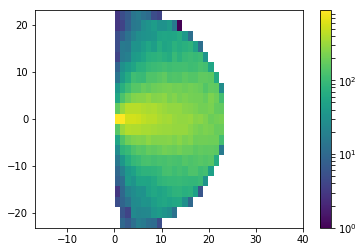

10 (10,)
[  1.21000000e+02   7.71718323e+00   2.91623143e+02   1.04718418e+00
  -1.43649365e-01   1.95926264e+00   1.75570637e+02   1.28184263e+02
   1.09405044e+02   2.37998716e+02]
Snapshot =  121
v0_tot_kms at R0_kpc = 7.71718323231 : 291.623143184
Stellar Disk - a_MND_kpc = 1.04718418145 b_MND_kpc = -0.143649365257 v0_MND_kms = 128.18426311
Stellar Spheroid - a_HB_kp c= 1.95926264218 v0_HB_kms = 109.405044371
DM Halo - a_NFWH_kpc = 175.5706371 v0_NFWH_kms = 237.998715537
snapnr  : 122
15:19:25.958210
[ 32.50867844  31.31370544  35.09283066]
Found 1755643 stars.
Rotated pos.
Rotated vel.

galrad  : 0.023272740840911868
redshift: 0.058507322794512984
time    : 0.9447265771954694
center  : [ 0.  0.  0.]

computing star properties
computing histograms


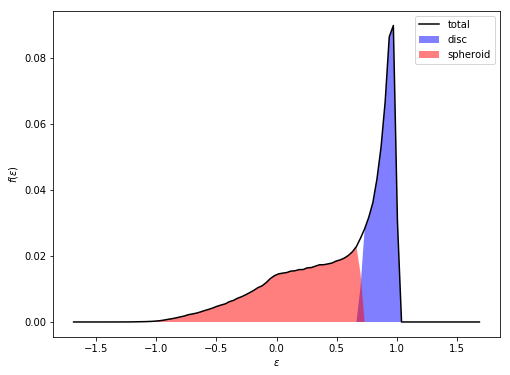

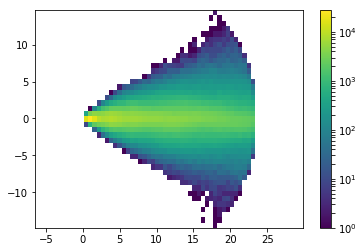

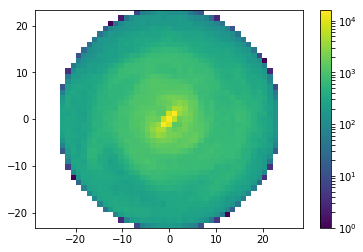

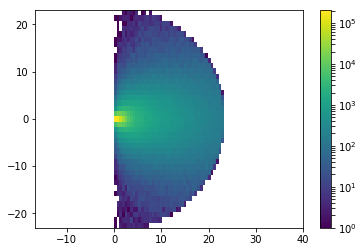

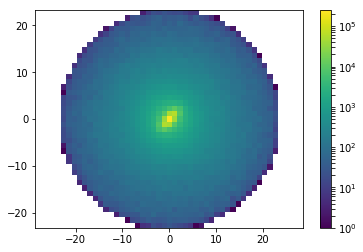

Start MND fit at 15:20:56.555065


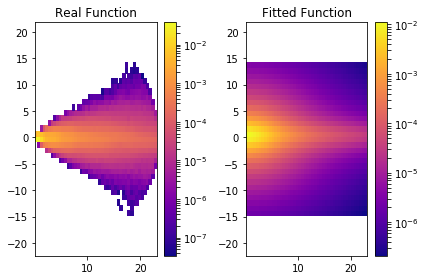

MND: a[kpc], b[kpc], vcirc [km/s]: 2.80011865492 1.8411512301 104.183041565


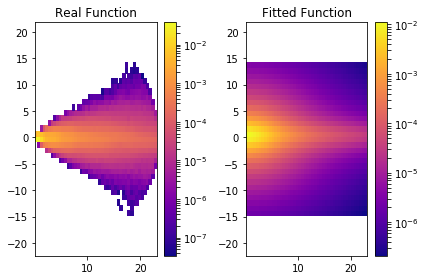

Start HB fit at 15:21:09.488594


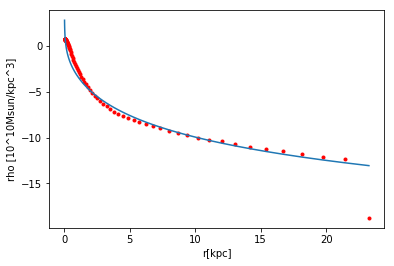

HB: a[kpc], vcirc [km/s]: 1.76923675011 111.781420833


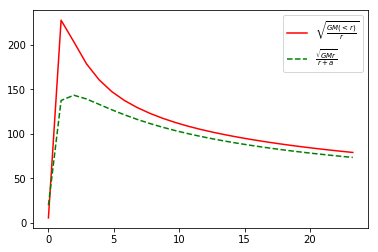

104.183041565 111.781420833
v0_circ_tot = 213.142593556


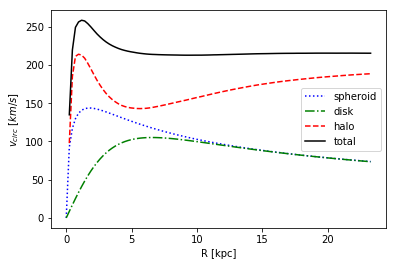

(2.800118654918009, 1.8411512300960111, 1.7692367501144111, 104.18304156499876, 111.78142083290095, array([ 19.24958801,   2.82151508,   8.64839077, ...,   1.85529196,
        13.35831642,  20.12150192], dtype=float32), array([-0.77526271, -1.03870368,  5.2497468 , ..., -2.29545927,
        1.18357491,  3.37694454], dtype=float32), array([-187097.5625 , -267506.875  , -210312.0625 , ..., -262857.59375,
       -202316.75   , -183236.1875 ]), 7.757580280303956)


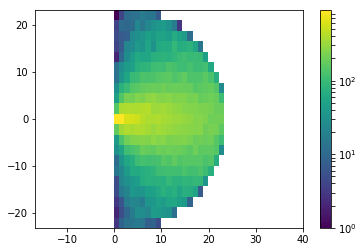

10 (10,)
[ 122.            7.75758028  216.60060627    2.80011865    1.84115123
    1.76923675   25.99367783  104.18304156  111.78142083  153.51426789]
Snapshot =  122
v0_tot_kms at R0_kpc = 7.7575802803 : 216.600606274
Stellar Disk - a_MND_kpc = 2.80011865492 b_MND_kpc = 1.8411512301 v0_MND_kms = 104.183041565
Stellar Spheroid - a_HB_kp c= 1.76923675011 v0_HB_kms = 111.781420833
DM Halo - a_NFWH_kpc = 25.9936778265 v0_NFWH_kms = 153.514267888
snapnr  : 123
15:23:19.469209
[ 32.82047653  31.61475182  35.45058823]
Found 1755878 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02335823625326157
redshift: 0.04852362998180593
time    : 0.9537219490392906
center  : [ 0.  0.  0.]

computing star properties
computing histograms


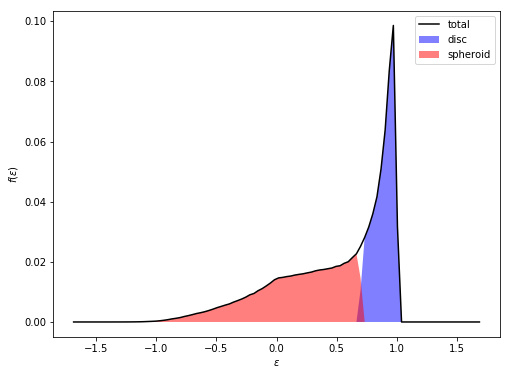

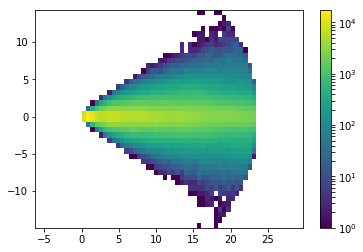

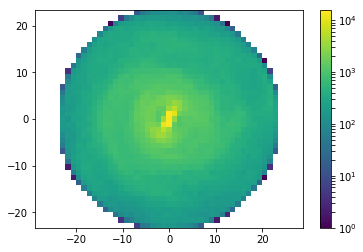

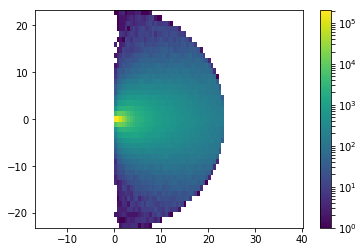

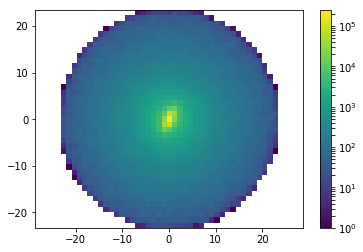

Start MND fit at 15:24:54.530534


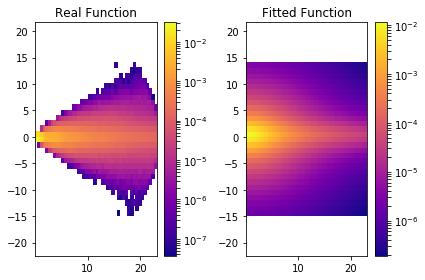

MND: a[kpc], b[kpc], vcirc [km/s]: 2.86959101133 1.76593040799 104.125600846


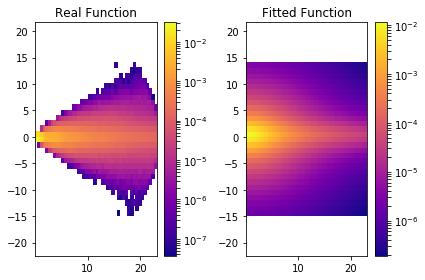

Start HB fit at 15:25:07.108168


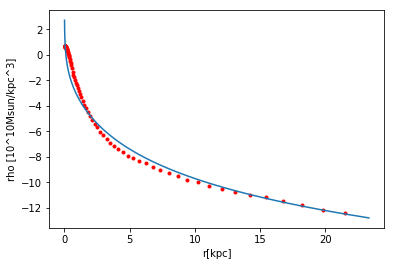

HB: a[kpc], vcirc [km/s]: 2.01669348728 108.80762565


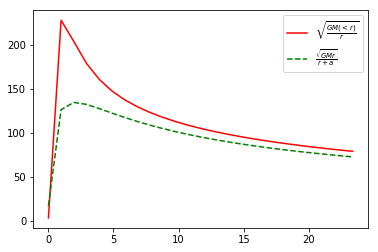

104.125600846 108.80762565
v0_circ_tot = 213.140594334


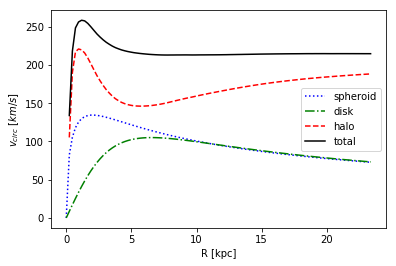

(2.8695910113344865, 1.765930407988501, 2.0166934872822022, 104.12560084567234, 108.80762564986553, array([ 20.88090324,   0.56610847,   5.54589176, ...,  14.75401878,
         4.86159515,  11.1370182 ], dtype=float32), array([ 6.86202908, -4.46588135, -3.78881073, ...,  8.75052166,
       -8.58375454, -0.93524623], dtype=float32), array([-178800.296875, -243141.609375, -229051.015625, ..., -187682.65625 ,
       -208482.515625, -210950.015625]), 7.7860787510871896)


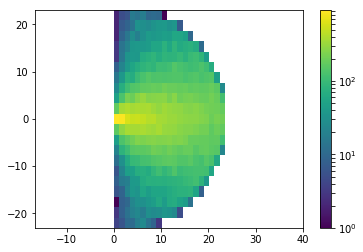

10 (10,)
[ 123.            7.78607875  217.98750337    2.86959101    1.76593041
    2.01669349   24.75518516  104.12560085  108.80762565  157.59857701]
Snapshot =  123
v0_tot_kms at R0_kpc = 7.78607875109 : 217.987503374
Stellar Disk - a_MND_kpc = 2.86959101133 b_MND_kpc = 1.76593040799 v0_MND_kms = 104.125600846
Stellar Spheroid - a_HB_kp c= 2.01669348728 v0_HB_kms = 108.80762565
DM Halo - a_NFWH_kpc = 24.7551851588 v0_NFWH_kms = 157.598577011
snapnr  : 124
15:27:17.464219
[ 33.29346848  32.07149124  35.99433899]
Found 1758643 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02354053109884262
redshift: 0.0337243718735154
time    : 0.9673758568617342
center  : [ 0.  0.  0.]

computing star properties
computing histograms


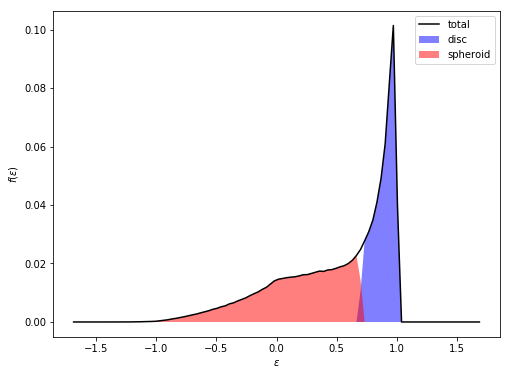

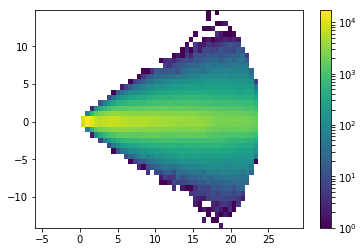

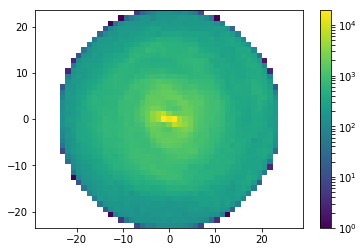

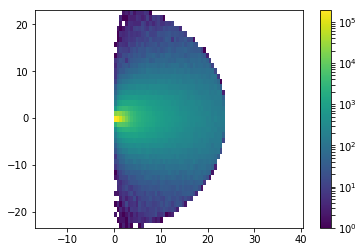

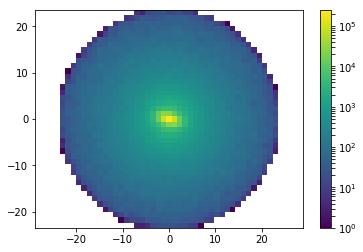

Start MND fit at 15:28:50.305446


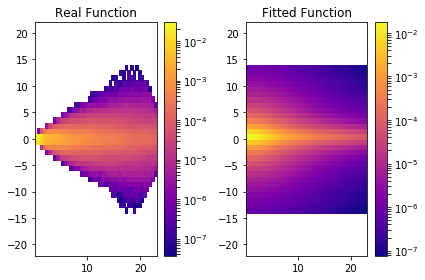

MND: a[kpc], b[kpc], vcirc [km/s]: 3.44142666909 1.02682271014 105.577020354


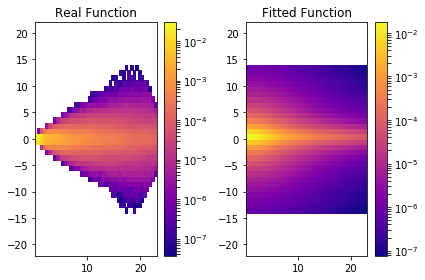

Start HB fit at 15:29:03.848086


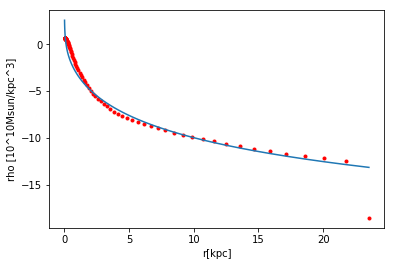

HB: a[kpc], vcirc [km/s]: 1.67738273237 112.302963698


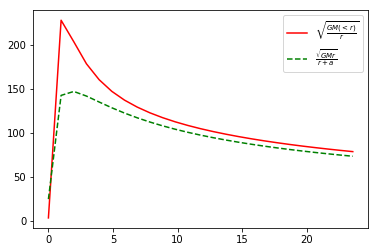

105.577020354 112.302963698
v0_circ_tot = 212.903478524


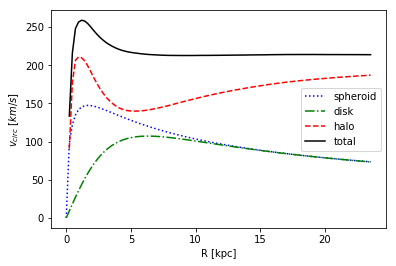

(3.4414266690946098, 1.0268227101391663, 1.6773827323657104, 105.57702035372377, 112.30296369771374, array([ 13.38512135,  18.05911255,   5.66678858, ...,   5.12331772,
         4.55793953,   9.44929981], dtype=float32), array([ 5.37172604,  9.45863438,  6.95963001, ..., -0.17118619,
        9.69404507, -8.70196533], dtype=float32), array([-198826.3125  , -182053.      , -216251.921875, ..., -247365.5     ,
       -206539.359375, -200420.296875]), 7.8468436996142064)


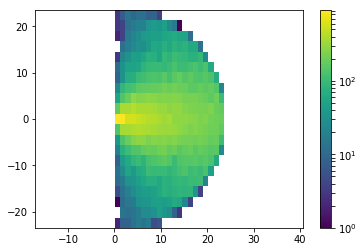

10 (10,)
[ 124.            7.8468437   218.96015878    3.44142667    1.02682271
    1.67738273   25.89336085  105.57702035  112.3029637   155.51555629]
Snapshot =  124
v0_tot_kms at R0_kpc = 7.84684369961 : 218.960158777
Stellar Disk - a_MND_kpc = 3.44142666909 b_MND_kpc = 1.02682271014 v0_MND_kms = 105.577020354
Stellar Spheroid - a_HB_kp c= 1.67738273237 v0_HB_kms = 112.302963698
DM Halo - a_NFWH_kpc = 25.8933608464 v0_NFWH_kms = 155.515556294
snapnr  : 125
15:31:07.034336
[ 33.61259842  32.37949753  36.36141205]
Found 1769475 stars.
Rotated pos.
Rotated vel.

galrad  : 0.023806245625019075
redshift: 0.023974428382762536
time    : 0.9765868876036025
center  : [ 0.  0.  0.]

computing star properties
computing histograms


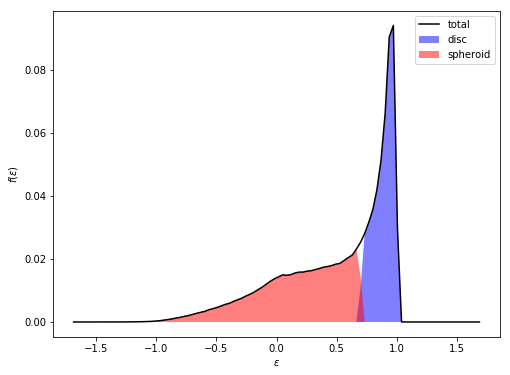

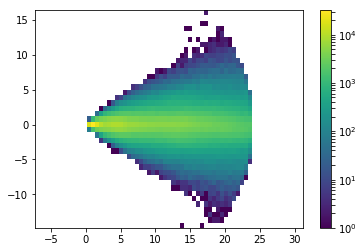

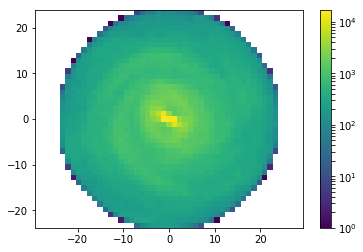

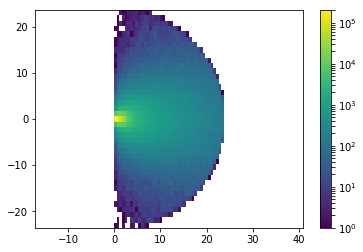

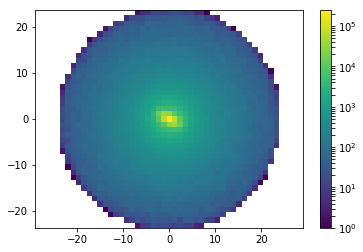

Start MND fit at 15:32:36.398693


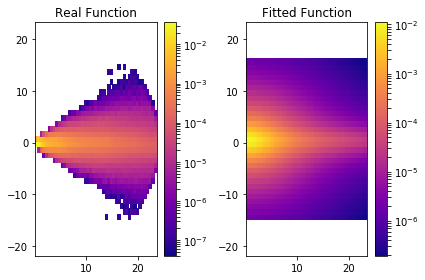

MND: a[kpc], b[kpc], vcirc [km/s]: 2.77743666686 1.8661302624 104.480233204


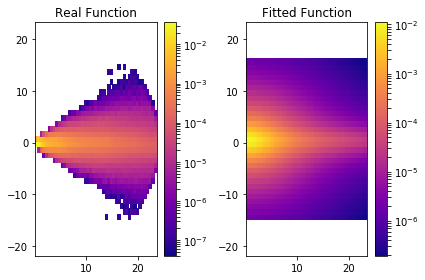

Start HB fit at 15:32:49.604252


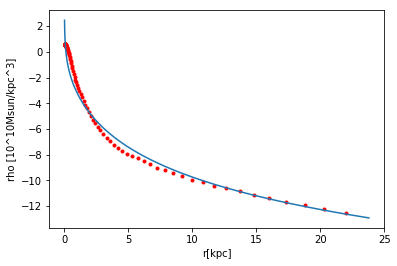

HB: a[kpc], vcirc [km/s]: 1.90308813162 109.345141321


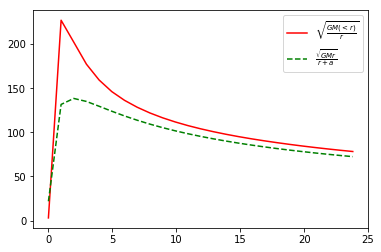

104.480233204 109.345141321
v0_circ_tot = 212.15617665


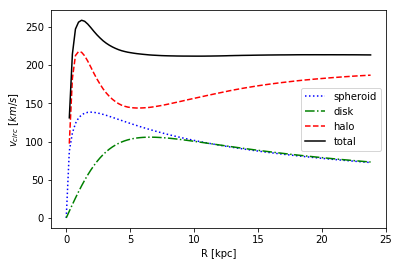

(2.777436666856576, 1.8661302624017926, 1.903088131618647, 104.48023320379036, 109.34514132142641, array([  4.22669649,  19.05991173,  15.69654083, ...,   1.85455716,
        10.99680328,  15.40385914], dtype=float32), array([  7.60352945,   4.08410215, -14.68866539, ...,  -2.85122371,
        -0.52886736,   2.34605503], dtype=float32), array([-217770.65625 , -188812.65625 , -178785.859375, ..., -261980.4375  ,
       -214526.890625, -198460.21875 ]), 7.9354152083396912)


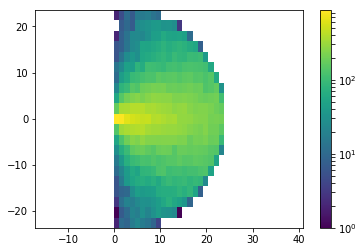

10 (10,)
[ 125.            7.93541521  218.70411983    2.77743667    1.86613026
    1.90308813   25.47377309  104.4802332   109.34514132  157.98421746]
Snapshot =  125
v0_tot_kms at R0_kpc = 7.93541520834 : 218.704119825
Stellar Disk - a_MND_kpc = 2.77743666686 b_MND_kpc = 1.8661302624 v0_MND_kms = 104.480233204
Stellar Spheroid - a_HB_kp c= 1.90308813162 v0_HB_kms = 109.345141321
DM Halo - a_NFWH_kpc = 25.473773091 v0_NFWH_kms = 157.984217464
snapnr  : 126
15:34:56.368421
[ 34.09642792  32.84707642  36.91917419]
Found 1774142 stars.
Rotated pos.
Rotated vel.

galrad  : 0.023996514081954957
redshift: 0.009521666967944764
time    : 0.99056814006128
center  : [ 0.  0.  0.]

computing star properties
computing histograms


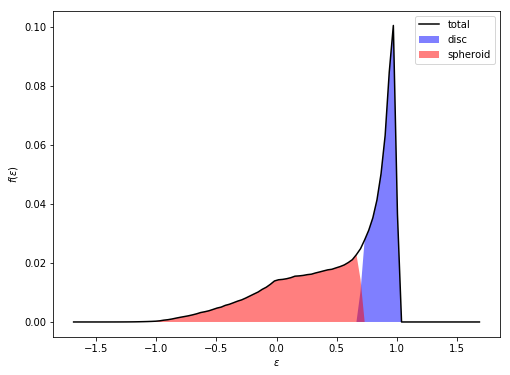

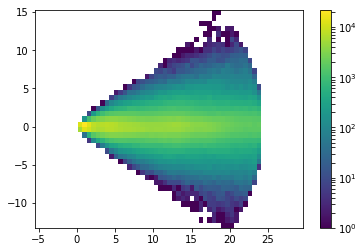

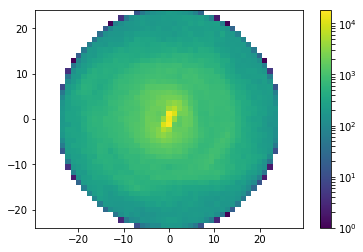

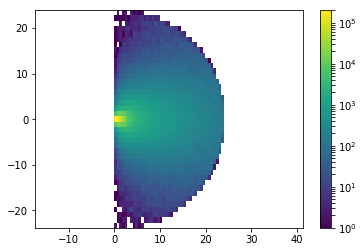

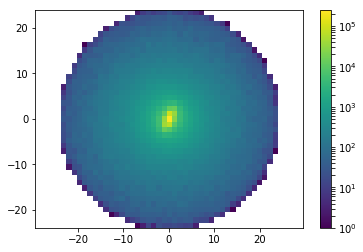

Start MND fit at 15:36:28.235214


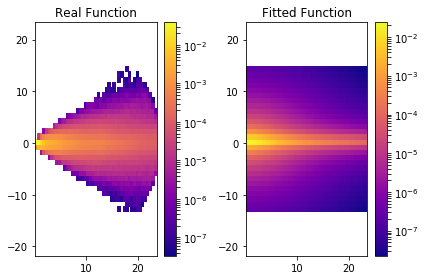

MND: a[kpc], b[kpc], vcirc [km/s]: 3.71735517696 0.553216963203 107.74637559


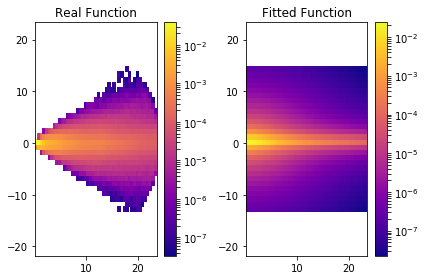

Start HB fit at 15:36:44.084141


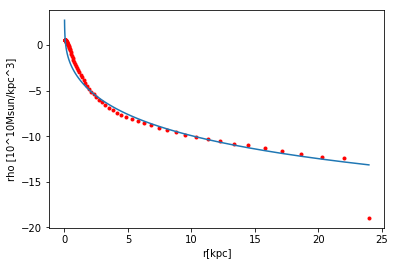

HB: a[kpc], vcirc [km/s]: 1.91292615734 108.839205432


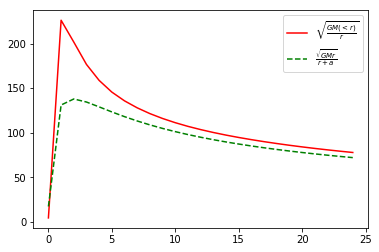

107.74637559 108.839205432
v0_circ_tot = 212.856782119


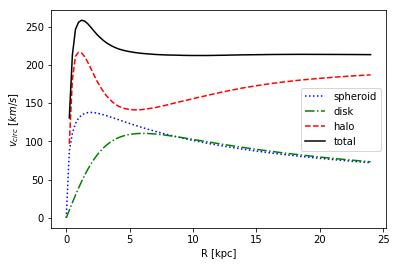

(3.7173551769640278, 0.55321696320254521, 1.912926157337586, 107.74637558966091, 108.839205432494, array([  3.78078985,  16.86608887,  22.53336334, ...,   3.19053364,
        17.29733086,  16.57869148], dtype=float32), array([ -1.71104574,  10.46765137,  -1.93691158, ...,  -0.82313395,
         8.52162075, -13.39970684], dtype=float32), array([-258795.84375 , -186367.734375, -185084.59375 , ..., -271603.90625 ,
       -188368.765625, -181662.75    ]), 7.9988380273183184)


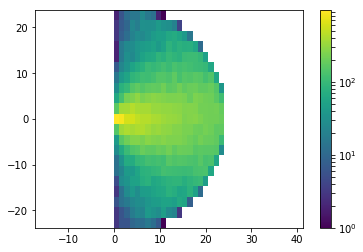

10 (10,)
[ 126.            7.99883803  222.14405426    3.71735518    0.55321696
    1.91292616   25.0267251   107.74637559  108.83920543  160.91217092]
Snapshot =  126
v0_tot_kms at R0_kpc = 7.99883802732 : 222.144054257
Stellar Disk - a_MND_kpc = 3.71735517696 b_MND_kpc = 0.553216963203 v0_MND_kms = 107.74637559
Stellar Spheroid - a_HB_kp c= 1.91292615734 v0_HB_kms = 108.839205432
DM Halo - a_NFWH_kpc = 25.0267251002 v0_NFWH_kms = 160.912170919
snapnr  : 127
15:38:57.341565
[ 34.42281723  33.16259384  37.29567337]
Found 1783163 stars.
Rotated pos.
Rotated vel.

galrad  : 0.02408556640148163
redshift: 2.220446049250313e-16
time    : 0.9999999999999998
center  : [ 0.  0.  0.]

computing star properties
computing histograms


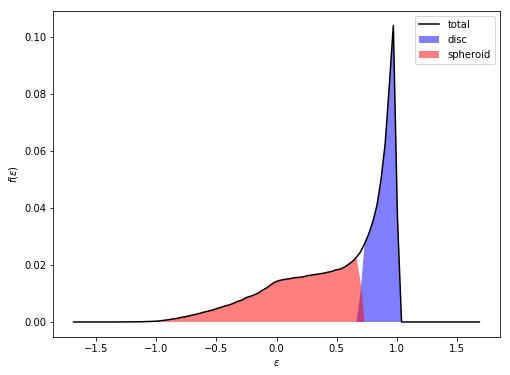

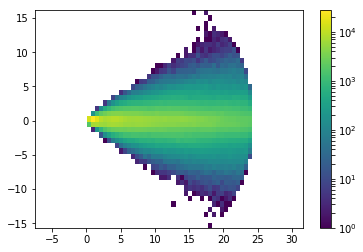

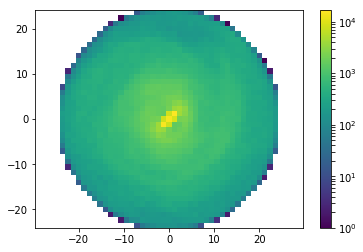

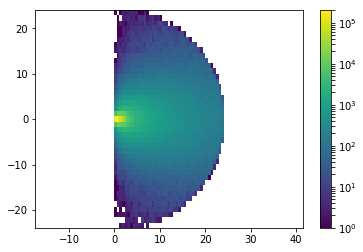

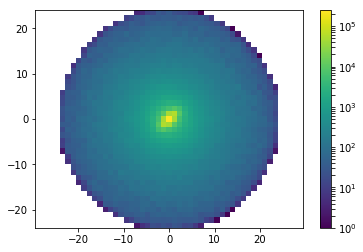

Start MND fit at 15:40:27.140627


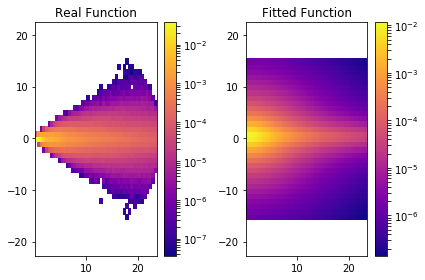

MND: a[kpc], b[kpc], vcirc [km/s]: 2.96507719743 1.63627757204 105.005287928


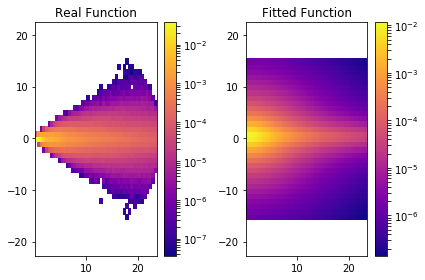

Start HB fit at 15:40:40.419574


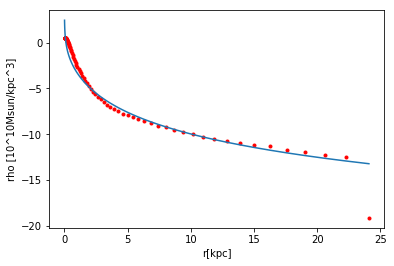

HB: a[kpc], vcirc [km/s]: 1.71545528287 111.241910552


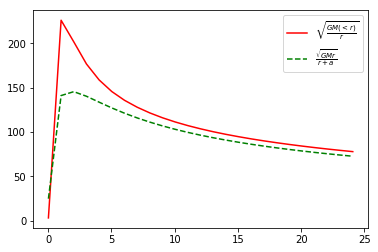

105.005287928 111.241910552
v0_circ_tot = 212.247290079


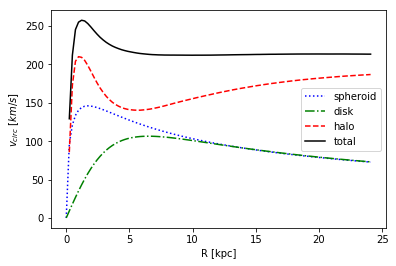

(2.9650771974283874, 1.6362775720364831, 1.7154552828662941, 105.00528792796617, 111.2419105523404, array([ 12.81562424,   7.54740429,  15.98460007, ...,  14.78400421,
        20.73890305,  17.16371918], dtype=float32), array([  4.34198713,   1.31106126, -12.50132751, ...,  -2.3802619 ,
         8.66635323,  13.214221  ], dtype=float32), array([-208993.71875 , -235723.46875 , -186211.015625, ..., -205244.96875 ,
       -184083.65625 , -183516.234375]), 8.0285221338272095)


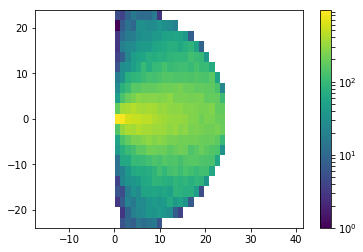

10 (10,)
[ 127.            8.02852213  220.72464662    2.9650772     1.63627757
    1.71545528   26.01527493  105.00528793  111.24191055  159.11786974]
Snapshot =  127
v0_tot_kms at R0_kpc = 8.02852213383 : 220.724646624
Stellar Disk - a_MND_kpc = 2.96507719743 b_MND_kpc = 1.63627757204 v0_MND_kms = 105.005287928
Stellar Spheroid - a_HB_kp c= 1.71545528287 v0_HB_kms = 111.241910552
DM Halo - a_NFWH_kpc = 26.0152749345 v0_NFWH_kms = 159.117869741


In [11]:
### get everything together somehow 

level = 4
startsnap = 60
endsnap = 128

#j = 0

for halo_number in [24]:  # range(1, 31):
    halodir = basedir+"halo_{0}/".format(halo_number)
    snappath = halodir+"output/"
    for snapnr in range(startsnap,endsnap,1):
        print("snapnr  : {0}".format(snapnr))
        print(datetime.datetime.now().time())
        try:
            s, sf = eat_snap_and_fof(level, halo_number, snapnr, snappath, loadonlytype=[1,2,3,4], 
            haloid=0, galradfac=0.1, verbose=True)    
        except KeyError:
            print('\n\n', snapnr, 'not read in.\n\n')
            continue
            
        try: 
            # Clean negative and zero values of gmet to avoid RuntimeErrors
            # later on (e.g. dividing by zero)
            s.data['gmet'] = np.maximum( s.data['gmet'], 1e-40 )
        except:
            continue

            
        
        R0_kpc = 1000. * 1./3. * s.galrad
        z0_kpc = 0.
        r0_kpc = R0_kpc
        dr_kpc = 0.5
        
        disk_ID, spheroid_ID, bulge_ID, halo_ID = decomp(s, r_cutoff_Mpc = 0.05, Gcosmo = 43.01, plotter = True, disccirc_min = 0.7, disccirc_max = 1.7)
        
        ## get data from simulations

        i_stars = np.where( (s.halo == 0) & (s.type == 4) & (s.r() <= s.galrad) & (s.r() > 0.) )
        #j = np.where( s.data[i_stars]['age'] > 0. )
        #i_stars = i_stars[j]
        i_spheroid = np.isin(s.id, spheroid_ID)
        i_disk = np.isin(s.id, disk_ID)
        i_dm = np.where( (s.halo == 0) & ((s.type == 1) + (s.type == 2) + (s.type == 3)) )
        
        galrad_kpc = 1000. * s.galrad
        
        # choice of R_kpc_data and z_kpc_data
        (x_kpc, y_kpc, z_kpc), (vx_kpc, vy_kpc, vz_kpc), rxyz_kpc, rxy_kpc = get_cartesian_vectors(s, sf, i_stars)
        (R_kpc, phi, z_kpc), (vR_kms, vphi_kms, vz_kms) = get_cylindrical_vectors(s, sf, i_stars)
        #print('istars', len(i_stars[0]), 'idisk', np.sum(i_disk), 'i_spher', np.sum(i_spheroid))

        (x_kpc_disk, y_kpc_disk, z_kpc_disk), (vx_kpc_disk, vy_kpc_disk, vz_kpc_disk), rxyz_kpc_disk, rxy_kpc_disk = get_cartesian_vectors(s, sf, i_disk)
        (R_kpc_disk, phi_disk, z_kpc_disk), (vR_kms_disk, vphi_kms_disk, vz_kms_disk) = get_cylindrical_vectors(s, sf, i_disk)
        
        (x_kpc_spher, y_kpc_spher, z_kpc_spher), (vx_kpc_spher, vy_kpc_spher, vz_kpc_spher), rxyz_kpc_spher, rxy_kpc_spher = get_cartesian_vectors(s, sf, i_spheroid)
        (R_kpc_spher, phi_spher, z_kpc_spher), (vR_kms_spher, vphi_kms_spher, vz_kms_spher) = get_cylindrical_vectors(s, sf, i_spheroid)

        
        #R_kpc_data = R_kpc[i_disk][i_stars]
        #z_kpc_data = z_kpc[i_disk][i_stars]
        r_kpc_spher = 1000. * s.r()[i_spheroid]
        #print(np.max(r_kpc))
        
        plt.hist2d(R_kpc_disk, z_kpc_disk, 41, norm=LogNorm())
        plt.colorbar()
        plt.axis('equal')
        plt.show()
        plt.hist2d(x_kpc_disk, y_kpc_disk, 41, norm=LogNorm())
        plt.axis('equal')
        plt.colorbar()
        plt.show()        
        
        plt.hist2d(R_kpc_spher, z_kpc_spher, 41, norm=LogNorm())
        plt.axis('equal')
        plt.colorbar()
        plt.show()
        plt.hist2d(x_kpc_spher, y_kpc_spher, 41, norm=LogNorm())
        plt.axis('equal')
        plt.colorbar()
        plt.show()
        
        M_disk_10Msun = s.mass[i_disk]
        M_disk_tot_10Msun = np.sum(s.mass[i_disk])
        M_spher_10Msun = s.mass[i_spheroid]
        
        r_kpc_binned = np.linspace(np.min(r_kpc_spher), np.max(r_kpc_spher), 25)
        #print(r_kpc_binned)
        
        ## fit single parts
        res1 = MND(R_kpc_disk, z_kpc_disk, dR_kpc = 0.5, dz_kpc = 1., M_tot_disk_stars_10Msun = M_disk_tot_10Msun, M_diskstars_10Msun = M_disk_10Msun, R0_kpc = R0_kpc, z0_kpc = 0.)
        a_MND_kpc, b_MND_kpc, v_circ_MND = res1
        res = fit_dens_MND(R_kpc_disk, z_kpc_disk, dR_kpc = 0.5, dz_kpc = 1., M_tot_disk_stars_10Msun = M_disk_tot_10Msun, M_diskstars_10Msun = M_disk_10Msun)
        #a_MND_kpc, b_MND_kpc, v_circ_MND = MND(R_kpc_data[i_disk], z_kpc_data[i_disk], M_stars_tot_10Msun, R0_kpc, z0_kpc = 0.)
        a_HB_kpc, v_circ_HB = HB(M_spher_10Msun, r_kpc_spher, dr_kpc, r0_kpc)
        v_circ_test1 = HB2(r_kpc_spher, M_spher_10Msun)
        v_circ_test2 = v_circ_HB_func_justr(r_kpc_binned, a_HB_kpc, np.sum(M_spher_10Msun))
        
        plt.plot(r_kpc_binned, v_circ_test1, 'r-', label = '$\sqrt{\\frac{GM(<r)}{r}}$')
        plt.plot(r_kpc_binned, v_circ_test2, 'g--', label = '$\\frac{\sqrt{GMr}}{r+a}$')
        plt.legend()
        plt.show()
        #rot curves
        
        
        #### GUESS OK WITH THE SPHEROID AND DISK FIT 
        
        r_kpc           = np.linspace(0, 1000. * s.galrad, 100)
        v_circ_disk     = v_circ_MND_ab(R_kpc=r_kpc, z_kpc=0., a_MND_kpc=a_MND_kpc, b_MND_kpc=b_MND_kpc, M_tot_10Msun=M_disk_tot_10Msun)
        v_circ_spheroid = v_circ_HB_func_justr(r_kpc, a_HB_kpc, np.sum(M_spher_10Msun))
        v_circ_tot      = v_circ_tot_func(r_kpc=r_kpc)
        v_circ_halo     = v_circ_NFW_func(r_kpc, v_circ_disk, v_circ_spheroid, v_circ_tot)

        v0_MND_kms = v_circ_MND_ab(R0_kpc, z0_kpc, a_MND_kpc=a_MND_kpc, b_MND_kpc=b_MND_kpc, M_tot_10Msun=M_disk_tot_10Msun)
        v0_HB_kms  = v_circ_HB_func_justr(R0_kpc, a_HB_kpc, np.sum(M_spher_10Msun))
        print(v0_MND_kms, v0_HB_kms)
        v0_circ_tot = v_circ_tot_func(r_kpc=R0_kpc)
        print('v0_circ_tot =', v0_circ_tot)
        
        plt.plot(r_kpc, v_circ_spheroid, 'b:', label = 'spheroid')
        plt.plot(r_kpc, v_circ_disk, 'g-.', label = 'disk')
        plt.plot(r_kpc, v_circ_halo, 'r--', label = 'halo')
        plt.plot(r_kpc, v_circ_tot, 'k-', label = 'total')
        plt.xlabel('R [kpc]')
        plt.ylabel('$v_{circ} \ [km/s]$')
        plt.legend()        
        plt.show()
        # calculate v_circ NFW
        #v_circ_NFW = v_circ_NFW_func(v_circ_MND, v_circ_HB, R0_kpc)
        #print(v_circ_NFW, v_circ_MND, v_circ_HB)
        #nn = 35
        #R0_ref = r_kpc[nn]
        #print(R0_ref)
        #v0_ref = v_circ_tot[nn]
        #n_NFW  = v_circ_halo[nn]** 2      / v_circ_tot[nn] **2
        #n_HB   = v_circ_spheroid[nn] ** 2 / v_circ_tot[nn] **2
        #n_MND  = v_circ_disk[nn] ** 2     / v_circ_tot[nn] **2
        #print(r_kpc[30], n_NFW + n_HB + n_MND )
        
        part_num = 50001
        
        i_dm, = np.where( (s.halo == 0) & (s.r() < s.galrad) & (s.r() > 0.) & ((s.type == 1) + (s.type == 2) + (s.type == 3) ))


        r_kpc_dm = 1000. * s.r()[i_dm]
        (R_kpc_dm, phi_rad_dm, z_kpc_dm), (vR_kms_dm, vphi_kms_dm, vz_kms_dm) = get_cylindrical_vectors(s, sf, i_dm) 
        pot_kms2_dm = s.pot[i_dm]

        # draw random sample out of data
        try:
            rand_samp = np.array(random.sample(list(enumerate(pot_kms2_dm)), part_num))
            rand_ind = rand_samp[:,0].astype(int)
            pot_kms2_dm_data = rand_samp[:, 1]
            r_kpc_dm_data = r_kpc_dm[rand_ind]
            R_kpc_dm_data = R_kpc_dm[rand_ind]
            z_kpc_dm_data = z_kpc_dm[rand_ind]
        except ValueError:        
            pot_kms2_dm_data = pot_kms2_dm
            r_kpc_dm_data = r_kpc_dm
            R_kpc_dm_data = R_kpc_dm
            z_kpc_dm_data = z_kpc_dm
        lower_floor = 1e-3
        bounds = ((5./6. * v0_circ_tot, 400.), #REF_V0_kms
                 (lower_floor, 400.)) #a_NFWH
        args = (a_MND_kpc, b_MND_kpc, a_HB_kpc, v0_MND_kms, v0_HB_kms, R_kpc_dm_data, z_kpc_dm_data, pot_kms2_dm_data, R0_kpc)

        print(args)
        plt.hist2d(R_kpc_dm_data, z_kpc_dm_data, 21, norm=LogNorm())
        plt.axis('equal')
        plt.colorbar()
        plt.show()
        #plt.hist2d(x_kpc_spher, y_kpc_spher, 21, norm=LogNorm())
        #plt.axis('equal')
        #plt.colorbar()
        #plt.show()

        #fitting:
        res = opt.differential_evolution(
                    rel_pot_error_scipydifferentialevolution,
                    bounds=bounds,
                    args=args,#, MND, HB, NFWH),
                    strategy='best1bin',
                    maxiter=1000,tol=0.01,atol=1e-7,
                    disp=False
                    )
        

        v0_kms_bestfit     = res.x[0]
        a_NFWH_kpc_bestfit = res.x[1]
    
        
        v0_NFWH_kms = np.sqrt(v0_kms_bestfit**2 - v0_HB_kms**2 - v0_MND_kms**2)
        data_saved = np.array([snapnr, R0_kpc, v0_kms_bestfit, a_MND_kpc, b_MND_kpc, a_HB_kpc, a_NFWH_kpc_bestfit, v0_MND_kms, v0_HB_kms, v0_NFWH_kms])
        print(len(data_saved), np.shape(data_saved))
        print(data_saved)
        formt = '%3.12f'
        
        np.savetxt(filedir + 'potential_params/pot_snap_' + str(snapnr), data_saved, fmt = formt)
        print('Snapshot = ', snapnr)
        print('v0_tot_kms at R0_kpc =', R0_kpc, ':', v0_kms_bestfit)
        print('Stellar Disk - a_MND_kpc =', a_MND_kpc, 'b_MND_kpc =', b_MND_kpc, 'v0_MND_kms =', v0_MND_kms)
        print('Stellar Spheroid - a_HB_kp c=', a_HB_kpc, 'v0_HB_kms =', v0_HB_kms)
        print('DM Halo - a_NFWH_kpc =', a_NFWH_kpc_bestfit, 'v0_NFWH_kms =', v0_NFWH_kms)



In [ ]:
v0_NFWH_kms = np.sqrt(v0_kms_bestfit**2 - v0_HB_kms**2 - v0_MND_kms**2)
print('v0_tot_kms at R0_kpc =', R0_kpc, ':', v0_kms_bestfit)
print('Stellar Disk - a_MND_kpc =', a_MND_kpc, 'b_MND_kpc =', b_MND_kpc, 'v0_MND_kms =', v0_MND_kms)
print('Stellar Spheroid - a_HB_kp c=', a_HB_kpc, 'v0_HB_kms =', v0_HB_kms)
print('DM Halo - a_NFWH_kpc =', a_NFWH_kpc_bestfit, 'v0_NFWH_kms =', v0_NFWH_kms)


In [ ]:
v0_NFWH_kms = np.sqrt(v0_kms_bestfit**2 - v0_HB_kms**2 - v0_MND_kms**2)
print('v0_tot_kms at R0_kpc =', R0_kpc, ':', v0_kms_bestfit)
print('Stellar Disk - a_MND_kpc:', a_MND_kpc, 'b_MND_kpc:', b_MND_kpc, 'v0_MND_kms:', v0_MND_kms)
print('Stellar Spheroid - a_HB_kpc:', a_HB_kpc, 'v0_HB_kms:', v0_HB_kms)
print('DM Halo - a_NFWH_kpc:', a_NFWH_kpc_bestfit, 'v0_NFWH_kms:', v0_NFWH_kms)


In [ ]:
n_NFW = v_circ_halo[35] ** 2 / v_circ_tot[35] **2
n_HB = v_circ_spheroid[35] ** 2 / v_circ_tot[35] **2
n_MND = v_circ_disk[35] ** 2 / v_circ_tot[35] **2
print(r_kpc[65], n_NFW + n_HB + n_MND )

In [ ]:

v_circ_NFW = v_circ_NFW_func(v_circ_MND, v_circ_HB, R0_kpc)
print(v_circ_NFW, v_circ_MND, v_circ_HB)
print(np.sqrt(v_circ_NFW**2 + v_circ_HB**2 + v_circ_MND**2))

In [ ]:
a_HB_kpc

In [ ]:
print(a_MND_kpc, b_MND_kpc, a_HB_kpc
     )

In [ ]:
plt.plot(r_kpc, v_circ_spheroid, 'k.', label = 'spheroid')
plt.plot(r_kpc, v_circ_disk, 'g-', label = 'disk')
plt.plot(r_kpc, v_circ_halo, 'r--', label = 'halo')
plt.plot(r_kpc, v_circ_tot, 'b-.', label = 'total')
plt.xlabel('R [kpc]')
plt.ylabel('$v_{circ} \ [km/s]$')
plt.legend()

In [ ]:
level = 4

j = 0
startsnap = 127
endsnap = 128
for halo_number in [24]:  # range(1, 31):
    halodir = basedir+"halo_{0}/".format(halo_number)
    snappath = halodir+"output/"
    for snapnr in range(startsnap,endsnap,1):
        #print("level   : {0}".format(level))
        #print("halo    : {0}".format(halo_number))
        print("snapnr  : {0}".format(snapnr))
        print(datetime.datetime.now().time())
        #print("basedir : {0}".format(basedir))
        #print("halodir : {0}".format(halodir))
        #print("snappath: {0}\n".format(snappath))
        try:
            s, sf = eat_snap_and_fof(level, halo_number, snapnr, snappath, loadonlytype=[1,2,3,4], 
            haloid=0, galradfac=0.1, verbose=False, rotate_disk=False, do_rotation=False, use_principal_axis=False) 
        except KeyError:
            print('\n\n', snapnr, 'not read in.\n\n')
            continue

            

In [ ]:
def potential_fit(maxr_Mpc, _REFR0_kpc = 8., mask_num = 2, part_num = 1501, \
                  v0_kms_init = 150., a_MND_kpc_init = 6., b_MND_kpc_init = 1., \
                  a_NFWH_kpc_init = 10., a_HB_kpc_init = 2., n_MND_init = 0.2, n_NFWH_init = 0.6, \
                  fitroutine = 'emcee', nwalkers = 50, nstep = 1000, \
                  comp_mask = None, MND = True, HB = True, NFWH = True, \
                  grav_rad_HB_kpc = 2., \
                  res_arr = [], plot = False, verbose = False):
    
    if comp_mask is None:   
        ### selection masks
        # select ALL particles belonging to the main galaxy within maxr
        if mask_num == 0:
            mask, = np.where( (s.halo == 0) & (s.r() < maxr_Mpc) & (s.r() > 0.) )
            parts_to_fit = 'all'
        # select GAS particles belonging to the main galaxy within maxr
        if mask_num == 1:
            mask, = np.where( (s.halo == 0) & (s.r() < maxr_Mpc) & (s.r() > 0.) & (s.type == 0) )
            parts_to_fit = 'gas'
        # select DM particles belonging to the main galaxy within maxr
        if mask_num == 2:
            mask, = np.where( (s.halo == 0) & (s.r() < maxr_Mpc) & (s.r() > 0.) & ((s.type == 1) + (s.type == 2) + (s.type == 3) ))
            parts_to_fit = 'DM'
        # select STAR particles belonging to the main galaxy within maxr
        if mask_num == 3:
            mask, = np.where( (s.halo == 0) & (s.r() < maxr_Mpc) & (s.r() > 0.) & (s.type == 4) )
            parts_to_fit = 'star'

        if verbose == True:
            print('The potential is fitted to ' + str(part_num) + ' random selected ' + parts_to_fit + ' particles.')

        # select data with mask
        r_kpc = 1000. * s.r()[mask]
        (R_kpc, phi_rad, z_kpc), (vR_kms, vphi_kms, vz_kms) = get_cylindrical_vectors(s, sf, mask) 
        pot_kms2 = s.pot[mask]

        # draw random sample out of data
        try:
            rand_samp = np.array(random.sample(list(enumerate(pot_kms2)), part_num))
            rand_ind = rand_samp[:,0].astype(int)
            pot_kms2_data = rand_samp[:, 1]
            r_kpc_data = r_kpc[rand_ind]
            R_kpc_data = R_kpc[rand_ind]
            z_kpc_data = z_kpc[rand_ind]
        except ValueError:        
            pot_kms2_data = pot_kms2
            r_kpc_data = r_kpc
            R_kpc_data = R_kpc
            z_kpc_data = z_kpc
            
    else:
        mask = comp_mask
        ## check that the right IDs are selected
        if (MND == 1) * (HB == 1) * (NFWH == 1):
            if np.sum((s.type[mask] == 1) + (s.type[mask] == 2) + (s.type[mask] == 3) + (s.type[mask] == 4)) != np.sum(mask):
                raise ValueError('IDs might be chosen wrong.')
        elif (MND == 1) * (HB == 1) * (NFWH == 0):
            if np.sum(np.where(s.type[mask] != 4)) != 0:
                raise ValueError('IDs might be chosen wrong.')            
        elif (MND == 1) * (HB == 0) * (NFWH == 1):
            if np.sum((s.type[mask] == 1) + (s.type[mask] == 2) + (s.type[mask] == 3) + (s.type[mask] == 4)) != np.sum(mask):
                raise ValueError('IDs might be chosen wrong.')            
        elif (MND == 0) * (HB == 1) * (NFWH == 1):
            if np.sum((s.type[mask] == 1) + (s.type[mask] == 2) + (s.type[mask] == 3) + (s.type[mask] == 4)) != np.sum(mask):
                raise ValueError('IDs might be chosen wrong.')           
        elif (MND == 1) * (HB == 0) * (NFWH == 0):
            if np.sum(np.where(s.type[mask] != 4)) != 0:
                raise ValueError('IDs might be chosen wrong.')
        elif (MND == 0) * (HB == 1) * (NFWH == 0):
            if np.sum(np.where(s.type[mask] != 4)) != 0:
                raise ValueError('IDs might be chosen wrong.')          
        elif (MND == 0) * (HB == 0) * (NFWH == 1):
            if np.sum((s.type[mask] == 1) + (s.type[mask] == 2) + (s.type[mask] == 3)) != np.sum(mask):
                raise ValueError('IDs might be chosen wrong.')
        
        if (MND == 0) * (HB == 1) * (NFWH == 0):
            mask = np.where(((1000. * s.r()[comp_mask]) < grav_rad_HB_kpc))
        
        r_kpc = 1000. * s.r()[mask]
        (R_kpc, phi_rad, z_kpc), (vR_kms, vphi_kms, vz_kms) = get_cylindrical_vectors(s, sf, mask) 
        pot_kms2 = s.pot[mask] 
        pot_kms2_data = pot_kms2
        r_kpc_data = r_kpc
        R_kpc_data = R_kpc
        z_kpc_data = z_kpc
                    

    if fitroutine == 'emcee': # maybe implement diff ev but not now
        # _____prepare MCMC_____
        ndim, nwalkers, nstep = 7, nwalkers, nstep

        # initial values for fit:
        # init values as input of function
        initial_guess = np.array([v0_kms_init, a_MND_kpc_init, b_MND_kpc_init, a_NFWH_kpc_init, \
                                  a_HB_kpc_init, n_MND_init, n_NFWH_init])
        initial_guess_width = np.fabs(0.2 * initial_guess)
        p0 = np.array([np.random.randn(ndim) * np.array(initial_guess_width) + initial_guess \
                                                      for i in range(nwalkers)])
        # fiitting boundaries:
        boundaries = np.array([[0.,np.inf],[0.,np.inf],[0.,np.inf],[0.,np.inf],[0.,np.inf],[0.,1.],[0.,1.]])
        for pp in range(ndim):
            p0[(p0[:,pp] < boundaries[pp,0]),pp] = initial_guess[pp] + np.random.uniform() * 0.1
            p0[(p0[:,pp] > boundaries[pp,1]),pp] = initial_guess[pp] - np.random.uniform() * 0.1

        # _____run MCMC_____
        sampler = emcee.EnsembleSampler(nwalkers, ndim,
                                       lnprob_MCMC,
                                       args = [R_kpc_data, z_kpc_data, pot_kms2_data, _REFR0_kpc])
        sampler.run_mcmc(p0, nstep)

        # result:
        burnin = int(nwalkers / 2.) # check what this is used for. #1000
        final_samples = sampler.chain[:, burnin:, :].reshape((-1, ndim))
        chain_samples = sampler.chain

        median = np.median(final_samples,axis=0)
        std = np.std(final_samples,axis=0)

        v0_kms_bestfit     = median[0]
        a_MND_kpc_bestfit  = median[1]
        b_MND_kpc_bestfit  = median[2]
        a_NFWH_kpc_bestfit = median[3]
        a_HB_kpc_bestfit   = median[4]
        n_MND_bestfit      = median[5]
        n_NFWH_bestfit     = median[6]
        n_HB_bestfit       = 1. - (n_MND_bestfit + n_NFWH_bestfit)

        v0_kms_bestfit_err     = std[0]
        a_MND_kpc_bestfit_err  = std[1]
        b_MND_kpc_bestfit_err  = std[2]
        a_NFWH_kpc_bestfit_err = std[3]
        a_HB_kpc_bestfit_err   = std[4]
        n_MND_bestfit_err      = std[5]
        n_NFWH_bestfit_err     = std[6]
        n_HB_bestfit_err       = (n_MND_bestfit_err + n_NFWH_bestfit_err)

        
        
        # save potential parameters with errors and snapnr:
        pot_bestfit = np.array([v0_kms_bestfit, v0_kms_bestfit_err, a_MND_kpc_bestfit, a_MND_kpc_bestfit_err, \
                            b_MND_kpc_bestfit, b_MND_kpc_bestfit_err, a_NFWH_kpc_bestfit, a_NFWH_kpc_bestfit_err, \
                            a_HB_kpc_bestfit, a_HB_kpc_bestfit_err, n_MND_bestfit, n_MND_bestfit_err, \
                            n_NFWH_bestfit, n_NFWH_bestfit_err, n_HB_bestfit, n_HB_bestfit_err])
        
        res_arr = np.append(res_arr, pot_bestfit)
    
    elif fitroutine == 'diffev':
        lower_floor = 1e-3
        bounds = ((lower_floor,400.), #vcirc
                  (lower_floor,500.), #a_MND
                  (lower_floor,100.), #b_MND
                  (lower_floor,500.), #a_NFWH
                  (lower_floor,500.), #a_HB
                  (0., 1.), #n_MND
                  (0., 1.)) #n_NFWH

        #fitting:
        res = opt.differential_evolution(
                    rel_pot_error_scipydifferentialevolution,
                    bounds=bounds,
                    args=(R_kpc_data,z_kpc_data,pot_kms2_data, _REFR0_kpc, MND, HB, NFWH),
                    strategy='best1bin',
                    maxiter=1000,tol=0.01,atol=1e-7,
                    disp=False
                    )
        
        v0_kms_bestfit     = res.x[0]
        a_MND_kpc_bestfit  = res.x[1]
        b_MND_kpc_bestfit  = res.x[2]
        a_NFWH_kpc_bestfit = res.x[3]
        a_HB_kpc_bestfit   = res.x[4]
        n_MND_bestfit      = res.x[5]
        n_NFWH_bestfit     = res.x[6]
        n_HB_bestfit       = 1. - (n_MND_bestfit + n_NFWH_bestfit)


        pot_bestfit = np.array([v0_kms_bestfit, a_MND_kpc_bestfit, b_MND_kpc_bestfit, a_NFWH_kpc_bestfit, \
                            a_HB_kpc_bestfit, n_MND_bestfit, n_NFWH_bestfit, n_HB_bestfit])
        res_arr = np.append(res_arr, pot_bestfit)

   
    
    # generate potential measurements:
    if plot == True:
        pot_galpy_bestfit = setup_galpy_potential(a_MND_kpc_bestfit,b_MND_kpc_bestfit,
                                               a_NFWH_kpc_bestfit,a_HB_kpc_bestfit,
                                               n_MND_bestfit,n_NFWH_bestfit,n_HB_bestfit, _REFR0_kpc)
        pot_kms2_bestfit = evaluatePotentials(pot_galpy_bestfit,
                                           R_kpc_data/_REFR0_kpc,
                                           z_kpc_data/_REFR0_kpc) * (v0_kms_bestfit)**2
                               
        plotDensities(pot_galpy_bestfit,rmin=0.1,zmax=0.25,zmin=-0.25,nrs=101,nzs=101)
        plt.show()
                               
                               
    if fitroutine == 'emcee':
        sampler.reset()

                               
    return res_arr

In [ ]:
fitroutine = 'diffev' #emcee
dopotfit = False
if dopotfit == True:
#### path = /hits/universe/GigaGalaxy/level4_MHD/halo_24/output/*
    level = 4

    j = 0
    startsnap = 60
    endsnap = 128
    for halo_number in [24]:  # range(1, 31):
        halodir = basedir+"halo_{0}/".format(halo_number)
        snappath = halodir+"output/"
        for snapnr in range(startsnap,endsnap,1):
            #print("level   : {0}".format(level))
            #print("halo    : {0}".format(halo_number))
            print("snapnr  : {0}".format(snapnr))
            print(datetime.datetime.now().time())
            #print("basedir : {0}".format(basedir))
            #print("halodir : {0}".format(halodir))
            #print("snappath: {0}\n".format(snappath))
            try:
                s, sf = eat_snap_and_fof(level, halo_number, snapnr, snappath, loadonlytype=[1,2,3], 
                haloid=0, galradfac=0.1, verbose=False, rotate_disk=False, do_rotation=False, use_principal_axis=False) 
            except KeyError:
                print('\n\n', snapnr, 'not read in.\n\n')
                continue

            if fitroutine == 'emcee':
                file = filedir + 'potential_params_emcee_10000_with_initeqbestfit.txt'
                savefile = filedir + 'potential_params_emcee_10000_with_initeqbestfit_safetyfile.txt'
                firstline = "#snapnr\tv0_kms_bestfit\tv0_kms_bestfit_err\ta_MND_kpc_bestfit\ta_MND_kpc_bestfit_err\tb_MND_kpc_bestfit\tb_MND_kpc_bestfit_err\ta_NFWH_kpc_bestfit\ta_NFWH_kpc_bestfit_err\ta_HB_kpc_bestfit\ta_HB_kpc_bestfit_err\tn_MND_bestfit\tn_MND_bestfit_err\tn_NFWH_bestfit\tn_NFWH_bestfit_err\tn_HB_bestfit\tn_HB_bestfit_err\n"
                if j == 0:
                    res_arr = potential_fit(maxr_Mpc = 2. * s.galrad, part_num = 175000, nstep = 2000)
                    res_arr = np.insert(res_arr, 0, snapnr)
                    j +=1
                    v0_kms_bestfit      = res_arr[int(17 * (snapnr - startsnap )) + 1]
                    a_MND_kpc_bestfit   = res_arr[int(17 * (snapnr - startsnap )) + 3]
                    b_MND_kpc_bestfit   = res_arr[int(17 * (snapnr - startsnap )) + 5]
                    a_NFWH_kpc_bestfit  = res_arr[int(17 * (snapnr - startsnap )) + 7]
                    a_HB_kpc_bestfit    = res_arr[int(17 * (snapnr - startsnap )) + 9]
                    n_MND_bestfit       = res_arr[int(17 * (snapnr - startsnap )) + 11]
                    n_NFWH_bestfit      = res_arr[int(17 * (snapnr - startsnap )) + 13]
                    n_HB_bestfit        = res_arr[int(17 * (snapnr - startsnap )) + 15]


                else:
                    res_arr = potential_fit(maxr_Mpc = 2. * s.galrad, part_num = 175000, nstep = 2000, res_arr=res_arr, \
                                            v0_kms_init = v0_kms_bestfit, a_MND_kpc_init = a_MND_kpc_bestfit, \
                                            b_MND_kpc_init = b_MND_kpc_bestfit, a_NFWH_kpc_init = a_NFWH_kpc_bestfit, \
                                            a_HB_kpc_init = a_HB_kpc_bestfit, n_MND_init = n_MND_bestfit, \
                                            n_NFWH_init = n_NFWH_bestfit)
                    res_arr = np.insert(res_arr, 17 * (snapnr - startsnap ), snapnr)

                    v0_kms_bestfit      = res_arr[int(17 * (snapnr - startsnap )) + 1]
                    a_MND_kpc_bestfit   = res_arr[int(17 * (snapnr - startsnap )) + 3]
                    b_MND_kpc_bestfit   = res_arr[int(17 * (snapnr - startsnap )) + 5]
                    a_NFWH_kpc_bestfit  = res_arr[int(17 * (snapnr - startsnap )) + 7]
                    a_HB_kpc_bestfit    = res_arr[int(17 * (snapnr - startsnap )) + 9]
                    n_MND_bestfit       = res_arr[int(17 * (snapnr - startsnap )) + 11]
                    n_NFWH_bestfit      = res_arr[int(17 * (snapnr - startsnap )) + 13]
                    n_HB_bestfit        = res_arr[int(17 * (snapnr - startsnap )) + 15]

                #print(res_arr)

                if (snapnr % 10) ==0:
                    f = open(file, 'w') # existing file will be overwritten
                    f.write(firstline)
                    f.close()
                    f = open(file,'ab') # open file in append and binary mode to make savetxt work and append
                    np.savetxt(f,res_arr)
                    f.close()
                    
            elif fitroutine == 'diffev':
                file = filedir + 'potential_params_diffev.txt'
                savefile = filedir + 'potential_params_diffev_safetyfile.txt'
                firstline = "#snapnr\tv0_kms_bestfit\ta_MND_kpc_bestfit\tb_MND_kpc_bestfit\ta_NFWH_kpc_bestfit\ta_HB_kpc_bestfit\tn_MND_bestfit\tn_NFWH_bestfit\tn_HB_bestfit\n"
                if j == 0:
                    res_arr = potential_fit(maxr_Mpc = 2. * s.galrad, fitroutine = 'diffev')
                    res_arr = np.insert(res_arr, 0, snapnr)
                    j +=1
                    '''
                    v0_kms_bestfit      = res_arr[int(9 * (snapnr - startsnap )) + 1]
                    a_MND_kpc_bestfit   = res_arr[int(9 * (snapnr - startsnap )) + 2]
                    b_MND_kpc_bestfit   = res_arr[int(9 * (snapnr - startsnap )) + 3]
                    a_NFWH_kpc_bestfit  = res_arr[int(9 * (snapnr - startsnap )) + 4]
                    a_HB_kpc_bestfit    = res_arr[int(9 * (snapnr - startsnap )) + 5]
                    n_MND_bestfit       = res_arr[int(9 * (snapnr - startsnap )) + 6]
                    n_NFWH_bestfit      = res_arr[int(9 * (snapnr - startsnap )) + 7]
                    n_HB_bestfit        = res_arr[int(9 * (snapnr - startsnap )) + 8]
                    '''
                    res_len = len(res_arr)

                else:
                    res_arr = potential_fit(maxr_Mpc = 2. * s.galrad, res_arr=res_arr, fitroutine = 'diffev')
                    res_arr = np.insert(res_arr, res_len * (snapnr - startsnap ), snapnr)

                    '''
                    v0_kms_bestfit      = res_arr[int(9 * (snapnr - startsnap )) + 1]
                    a_MND_kpc_bestfit   = res_arr[int(9 * (snapnr - startsnap )) + 2]
                    b_MND_kpc_bestfit   = res_arr[int(9 * (snapnr - startsnap )) + 3]
                    a_NFWH_kpc_bestfit  = res_arr[int(9 * (snapnr - startsnap )) + 4]
                    a_HB_kpc_bestfit    = res_arr[int(9 * (snapnr - startsnap )) + 5]
                    n_MND_bestfit       = res_arr[int(9 * (snapnr - startsnap )) + 6]
                    n_NFWH_bestfit      = res_arr[int(9 * (snapnr - startsnap )) + 7]
                    n_HB_bestfit        = res_arr[int(9 * (snapnr - startsnap )) + 8]
                    '''
                #print(res_arr)

                if (snapnr % 10) ==0:
                    f = open(file, 'w') # existing file will be overwritten
                    f.write(firstline)
                    f.close()
                    f = open(file,'ab') # open file in append and binary mode to make savetxt work and append
                    np.savetxt(f,res_arr)
                    f.close()
    if fitroutine == 'emcee':     
        res_arr = res_arr.reshape(endsnap-startsnap,17) # instead of 4 number of simulations fitted
    elif fitroutine == 'diffev':
        res_arr = res_arr.reshape(endsnap-startsnap,9)
            

    np.savetxt(savefile, res_arr)

    f = open(file, 'w') # existing file will be overwritten
    f.write(firstline)
    f.close()
    f = open(file,'ab') # open file in append and binary mode to make savetxt work and append
    np.savetxt(f,res_arr)
    f.close()


In [ ]:
### fit disk stars to MND pot, and bulge stars the HB pot; keep'em fixed ###
### save their params for every snapshot since 60 or 70 ###
### then have varying potential for halo (DM particles) ###
level = 4

fitroutine = 'diffev'

jdisk  = 0
jbulge = 0
jhalo  = 0

startsnap = 60
endsnap = 128
for halo_number in [24]:  # range(1, 31):
    halodir = basedir + "halo_{0}/".format(halo_number)
    snappath = halodir + "output/"
    
    for snapnr in range(startsnap, endsnap, 1):
        print("snapnr  : {0}".format(snapnr))
        s, sf = eat_snap_and_fof(level, halo_number, snapnr, snappath, loadonlytype=[4], 
            haloid=0, galradfac=0.1, verbose=True) 

        # Clean negative and zero values of gmet to avoid RuntimeErrors
        # later on (e.g. dividing by zero)
        s.data['gmet'] = np.maximum( s.data['gmet'], 1e-40 )
    
        print('start decomposition')
        disk_ID, spheroid_ID, bulge_ID, halo_ID = decomp(s, r_cutoff_Mpc = s.galrad)
        
        idisk = np.isin(s.id, disk_ID)
        ibulge = np.isin(s.id, bulge_ID)
        ispheroid = np.isin(s.id, spheroid_ID)
        ihalo = np.isin(s.id, halo_ID)        
        ihalo = np.where((s.type == 1) + (s.type == 2) + (s.type == 3))
        ## fit disk
        '''
        print('start disk fit')
        if fitroutine == 'diffev':
            file_disk = filedir + 'potential_params_MND_diffev.txt'
            savefile_disk = filedir + 'potential_params_MND_diffev_safetyfile.txt'
            firstline_disk = "#snapnr\tv0_kms_bestfit\ta_MND_kpc_bestfit\tb_MND_kpc_bestfit\ta_NFWH_kpc_bestfit\ta_HB_kpc_bestfit\tn_MND_bestfit\tn_NFWH_bestfit\tn_HB_bestfit\n"
            if jdisk == 0:
                res_arr_disk = potential_fit(maxr_Mpc = 2. * s.galrad, comp_mask = idisk, MND = True, HB = False, NFWH = False, fitroutine = 'diffev')
                res_arr_disk = np.insert(res_arr_disk, 0, snapnr)
                jdisk +=1
                res_len_disk = len(res_arr_disk)
            else:
                res_arr_disk = potential_fit(maxr_Mpc = 2. * s.galrad, comp_mask = idisk, MND = True, HB = False, NFWH = False, res_arr=res_arr_disk, fitroutine = 'diffev', plot= True)
                res_arr_disk = np.insert(res_arr_disk, res_len_disk * (snapnr - startsnap ), snapnr)
        '''
        
        
        ## fit bulge 
        print('start bulge fit')
        # according to B&T 2008 p71 the gravitational radius of the Hernquist profile = 6a; 
        # a is one fitting component
        # take i_spheroid for first fit, for 2nd and further fit tries set as radius for stars to be fitted 6 * a_HB of the prior fit        
        if fitroutine == 'diffev':
            file_bulge = filedir + 'potential_params_HB_diffev_rg6a.txt'
            savefile_bulge = filedir + 'potential_params_HB_diffev_safetyfile_rg6a.txt'
            firstline_bulge = "#snapnr\tv0_kms_bestfit\ta_MND_kpc_bestfit\tb_MND_kpc_bestfit\ta_NFWH_kpc_bestfit\ta_HB_kpc_bestfit\tn_MND_bestfit\tn_NFWH_bestfit\tn_HB_bestfit\n"
            if jbulge == 0:
                res_arr_bulge = potential_fit(maxr_Mpc = s.galrad, comp_mask = ispheroid, MND = False, HB = True, NFWH = False, grav_rad_HB_kpc = s.galrad, fitroutine = 'diffev')
                res_arr_bulge = np.insert(res_arr_bulge, 0, snapnr)
                jbulge +=1
                res_len_bulge = len(res_arr_bulge)
                a_HB_kpc_bestfit = res_arr_bulge[int(res_len_bulge * (snapnr - startsnap )) + 5]
            else:
                res_arr_bulge = potential_fit(maxr_Mpc = s.galrad, comp_mask = ispheroid, MND = False, HB = True, NFWH = False, grav_rad_HB_kpc = 6. * a_HB_kpc_bestfit, res_arr=res_arr_bulge, fitroutine = 'diffev', plot = True)
                res_arr_bulge = np.insert(res_arr_bulge, res_len_bulge * (snapnr - startsnap ), snapnr)
                a_HB_kpc_bestfit = res_arr_bulge[int(res_len_bulge * (snapnr - startsnap )) + 5]

        
        
        
        ## fit halo (variable)
print('save everything')        
if fitroutine == 'diffev':
    '''
    res_arr_disk = res_arr_disk.reshape(endsnap-startsnap,res_len_disk)
    np.savetxt(savefile_disk, res_arr_disk)

    f = open(file_disk, 'w') # existing file will be overwritten
    f.write(firstline_disk)
    f.close()
    f = open(file_disk,'ab') # open file in append and binary mode to make savetxt work and append
    np.savetxt(f,res_arr_disk)
    f.close()
    '''
    
    res_arr_bulge = res_arr_bulge.reshape(endsnap-startsnap,res_len_bulge)
    np.savetxt(savefile_bulge, res_arr_bulge)

    f = open(file_bulge, 'w') # existing file will be overwritten
    f.write(firstline_bulge)
    f.close()
    f = open(file_bulge,'ab') # open file in append and binary mode to make savetxt work and append
    np.savetxt(f,res_arr_bulge)
    f.close()

In [ ]:
diskfile = filedir + 'potential_params_MND_diffev.txt'
bulgefile = filedir + 'potential_params_HB_diffev.txt'
bulgefile6a = filedir + 'potential_params_HB_diffev_rg6a.txt'
v0_kms_disk, a_MND_kpc, b_MND_kpc = np.loadtxt(diskfile, usecols = (1,2,3), unpack=True)
v0_kms_bulge, a_HB_kpc = np.loadtxt(bulgefile, usecols=(1,5), unpack=True)
v0_kms_bulge6a, a_HB_kpc6a = np.loadtxt(bulgefile6a, usecols=(1,5), unpack=True)


snapnr = np.arange(60,128,1)



labelsdisk = ["v0_kms","a_MND_kpc","b_MND_kpc"]
labelsbulge = ["v0_kms", "a_HB_kpc"]

paramsdisk = np.vstack([v0_kms_disk, a_MND_kpc, b_MND_kpc])
paramsbulge = np.vstack([v0_kms_bulge, a_HB_kpc])
paramsbulge6a = np.vstack([v0_kms_bulge6a, a_HB_kpc6a])

ndim = 3
f, axes = plt.subplots(ndim, 1, figsize=(12,6))
for ii in range(ndim):
    axes[ii].set_xlim(59,131)
    axes[ii].set_ylabel(labelsdisk[ii])
    if ii == (ndim - 1):
        axes[ii].set_xlabel('Snapshot number')
    #axes[ii,1].set_ylabel(labels[ii])
    axes[ii].plot(snapnr, paramsdisk[ii], 'k.')    
    #axes[ii,1].set_yscale('log', nonposy="clip")
    #zz = np.polyfit(snapnr[4:], params[ii][4:], jj, w = (1./params_err[ii][4:]), full = True)
    #p = np.poly1d(zz[0])
    #xp = np.linspace(np.min(snapnr[4:]), np.max(snapnr[4:]), int (np.max(snapnr[4:]) - np.min(snapnr[4:])))
    #axes[ii].plot(xp, p(xp), 'g-', label = str(jj ) + ' polynoms')
    #axes[ii].legend()
    #fitted_params.append(p(xp))
f.tight_layout()

#fitted_params = np.array(fitted_params)
#keep normalization of n_vals"
#normfac = (fitted_params[5] + fitted_params[6] + fitted_params[7])
#fitted_params[5] = fitted_params[5] / normfac
#fitted_params[6] = fitted_params[6] / normfac
#fitted_params[7] = fitted_params[7] / normfac

ndim = 4
f, axes = plt.subplots(ndim, 1, figsize=(12,6))
for ii in range(ndim):
    
    if ii == (ndim - 1):
        axes[ii].set_xlim(59,131)
        axes[ii].set_ylabel(labelsbulge[ii-2])
        axes[ii].set_xlabel('Snapshot number')
        axes[ii].plot(snapnr[14:], paramsbulge[ii-2][14:], 'r.', label = 'grav radius = a_HB') 
        axes[ii].plot(snapnr[14:], paramsbulge6a[ii-2][14:], 'g.', label = 'grav radius = 6 * a_HB' )
    elif ii == (ndim - 2):
        axes[ii].set_xlim(59,131)
        axes[ii].set_ylabel(labelsbulge[ii-1])
        axes[ii].set_xlabel('Snapshot number')
        axes[ii].plot(snapnr[2:], paramsbulge[ii-1][2:], 'r.', label = 'grav radius = a_HB') 
        axes[ii].plot(snapnr[2:], paramsbulge6a[ii-1][2:], 'g.', label = 'grav radius = 6 * a_HB' )
    #axes[ii,1].set_ylabel(labels[ii])
    else:
        axes[ii].set_ylabel(labelsbulge[ii])
        axes[ii].set_xlim(59,131)
        axes[ii].plot(snapnr, paramsbulge[ii], 'r.', label = 'grav radius = a_HB') 
        axes[ii].plot(snapnr, paramsbulge6a[ii], 'g.', label = 'grav radius = 6 * a_HB' ) 
    
    #axes[ii,1].set_yscale('log', nonposy="clip")
    #zz = np.polyfit(snapnr[4:], params[ii][4:], jj, w = (1./params_err[ii][4:]), full = True)
    #p = np.poly1d(zz[0])
    #xp = np.linspace(np.min(snapnr[4:]), np.max(snapnr[4:]), int (np.max(snapnr[4:]) - np.min(snapnr[4:])))
    #axes[ii].plot(xp, p(xp), 'g-', label = str(jj ) + ' polynoms')
    axes[ii].legend()
    #fitted_params.append(p(xp))
f.tight_layout()

#fitted_params.reshape(int(len(fitted_params)/7),7)
    #display(f)
#f.savefig(plotdir + 'parameter_evolution_lin_'+ str(jj)+'polynomsfit.png', dpi = 300, bbox_inches = 'tight', format = 'png')

In [ ]:
for i in range(len(snapnr)):
    diskpot = MiyamotoNagaiPotential(a_MND_kpc[i], b_MND_kpc[i], normalize = 0.5)
    bulgepot = HernquistPotential(a_HB_kpc[i], normalize = 0.5)
    pot = [diskpot, bulgepot]
    plotDensities(pot,rmin=0.1,zmax=0.25,zmin=-0.25,nrs=101,nzs=101, log = True )
    plt.text(1.2, 0.2, 'Snap ' + str(i+60), color = 'red')#, horizontalalignment='center',verticalalignment='center')#, transform=ax.transAxes)
    plt.show()


In [ ]:
np.sum(s.mass[ibulge])

In [ ]:
np.sum(s.mass[idisk])